# **Análisis por Región**

## **Región 0**

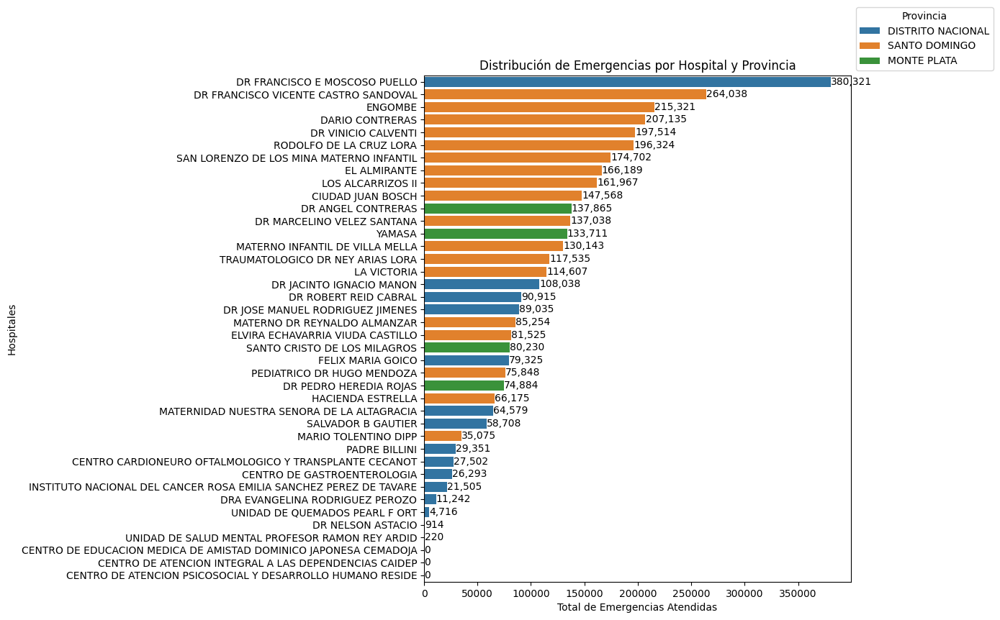

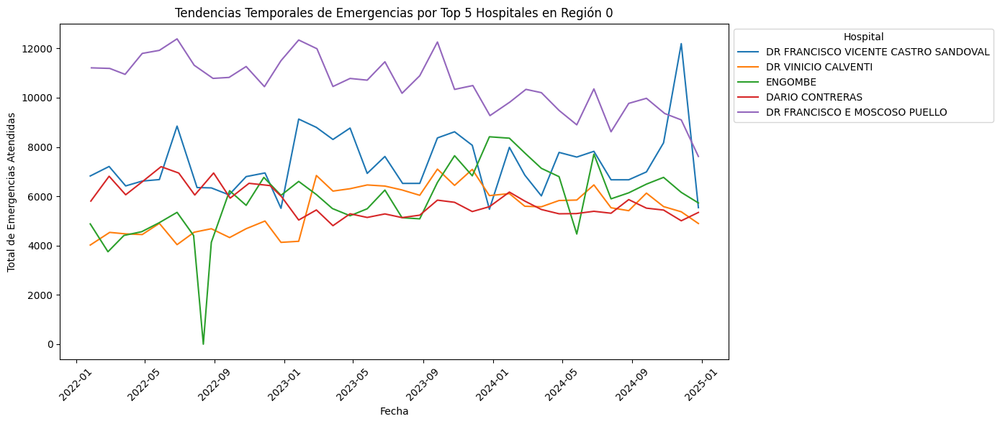

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Cargar el archivo de datos de emergencias
file_path = "Total Emergencias 2018-2024.xlsx"

# Cargar los datos de la hoja correspondiente
df_emergencias = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024")

# Renombrar las columnas correctamente usando la segunda fila como encabezado real
df_emergencias.columns = df_emergencias.iloc[1]
df_emergencias = df_emergencias[2:].reset_index(drop=True)

# Filtrar solo los datos de la Región 0
df_region_0 = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[establecimiento_region]"] == "REGION 0"]

# Seleccionar las columnas relevantes
columns_to_keep = [
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[establecimiento]",  # Establecimiento (Hospital)
    "vw_produccion_67A_eme_BI[Eme_total_ingresos]",  # Total ingresos
    "vw_produccion_67A_eme_BI[RegistroFecha]"  # Fecha
]

df_region_0 = df_region_0[columns_to_keep]

# Renombrar columnas para mejor lectura
df_region_0.columns = ["Provincia", "Establecimiento", "Total_Ingresos", "Fecha"]

# Convertir las columnas a los tipos adecuados
df_region_0["Total_Ingresos"] = pd.to_numeric(df_region_0["Total_Ingresos"], errors="coerce")
df_region_0["Fecha"] = pd.to_datetime(df_region_0["Fecha"], errors='coerce')

# Filtrar datos entre 2022 y 2024
df_region_0 = df_region_0[(df_region_0["Fecha"].dt.year >= 2022) & (df_region_0["Fecha"].dt.year <= 2024)]

# Eliminar la columna de fecha antes de agrupar para evitar errores
df_aggregated = df_region_0.drop(columns=["Fecha"]).groupby(["Provincia", "Establecimiento"], as_index=False).sum()

# Ordenar los datos por Total_Ingresos de mayor a menor
df_aggregated = df_aggregated.sort_values(by="Total_Ingresos", ascending=False)

# Gráfico de distribución de emergencias por hospital y provincia
plt.figure(figsize=(14, 8))
sns.barplot(
    data=df_aggregated,
    x="Total_Ingresos",
    y="Establecimiento",
    hue="Provincia",
    dodge=False,
    order=df_aggregated["Establecimiento"]
)
plt.xlabel("Total de Emergencias Atendidas")
plt.ylabel("Hospitales")
plt.title("Distribución de Emergencias por Hospital y Provincia")
plt.legend(title="Provincia", bbox_to_anchor=(1, 1))

# Agregar etiquetas a las barras con separador de miles
for index, value in enumerate(df_aggregated["Total_Ingresos"]):
    plt.text(value + 100, index, f"{value:,.0f}", va='center')

plt.tight_layout()
plt.show()

# Análisis de tendencias temporales por hospital (Top 5 hospitales con mayor frecuencia)
top_5_hospitals = df_aggregated.nlargest(5, "Total_Ingresos")["Establecimiento"]
df_tendencias_top5 = df_region_0[df_region_0["Establecimiento"].isin(top_5_hospitals)]
df_tendencias_grouped = df_tendencias_top5.groupby(["Fecha", "Establecimiento"], as_index=False).sum()

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_tendencias_grouped, x="Fecha", y="Total_Ingresos", hue="Establecimiento")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias Atendidas")
plt.title("Tendencias Temporales de Emergencias por Top 5 Hospitales en Región 0")
plt.legend(title="Hospital", bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
# Sumar el total de emergencias atendidas en todos los hospitales de la Región 0 (2022–2024)
total_emergencias_region_0 = df_region_0["Total_Ingresos"].sum()

# Mostrar el resultado con separador de miles
print(f"Total de ingresos por emergencias en la Región 0 (2022–2024): {total_emergencias_region_0:,.0f}")


Total de ingresos por emergencias en la Región 0 (2022–2024): 3,993,312


Análisis del Gráfico:

Distribución de Emergencias por Hospital y Provincia
El gráfico presentado muestra la cantidad total de emergencias atendidas en distintos hospitales, agrupados por provincia.

**Identificación de los Hospitales con Mayor Carga de Emergencias**

Los hospitales que presentan la mayor cantidad de emergencias atendidas incluyen:

DR FRANCISCO E MOSCOSO PUELLO (380,321 emergencias)

Es el hospital con el mayor volumen de emergencias, lo que indica una alta demanda de atención médica en su área de influencia.

DR FRANCISCO VICENTE CASTRO SANDOVAL (264,038 emergencias)

También tiene una carga alta de emergencias, aunque significativamente menor que el MOSCOSO PUELLO.

ENGOMBE, DARIO CONTRERAS y DR VINICIO CALVENTI (entre 190,000 y 215,000 emergencias cada uno)

Estos hospitales mantienen una carga de emergencias considerable, lo que podría estar asociado con su ubicación, infraestructura y especialización.

Conclusión: Estos hospitales probablemente estén ubicados en zonas con alta densidad poblacional o que cuenten con servicios especializados que atraigan más pacientes.

Hospitales con Menor Cantidad de Emergencias
En la parte inferior del gráfico se encuentran hospitales con cargas significativamente más bajas, como:

DR NELSON ASTACIO (914 emergencias)

UNIDAD DE SALUD MENTAL PROFESOR RAMON REY ARDID (220 emergencias)
Centro de Atención Psicosocial y Desarrollo Humano Reside (0 emergencias reportadas)

Interpretación:

Algunos de estos hospitales pueden tener un enfoque más especializado, lo que explicaría la menor cantidad de atenciones en emergencias.
Otros podrían estar experimentando problemas de infraestructura, falta de personal o recursos, lo que limita su capacidad de atender emergencias.

Fluctuaciones en la Demanda por Provincia
El gráfico usa colores para diferenciar provincias, lo que nos permite ver patrones interesantes:

DISTRITO NACIONAL

Alberga algunos de los hospitales con la mayor cantidad de emergencias, reflejando una alta densidad poblacional y una mayor demanda de atención médica.
SANTO DOMINGO

También presenta una alta concentración de emergencias en hospitales clave, lo que indica que la provincia enfrenta una gran carga en la red hospitalaria.
MONTE PLATA

Tiene una menor representación en el gráfico, lo que sugiere que cuenta con menos hospitales de alta capacidad para la atención de emergencias.

Conclusión Final:
Este gráfico refleja una distribución desigual de emergencias entre hospitales y provincias, con algunos centros enfrentando una carga excesiva.

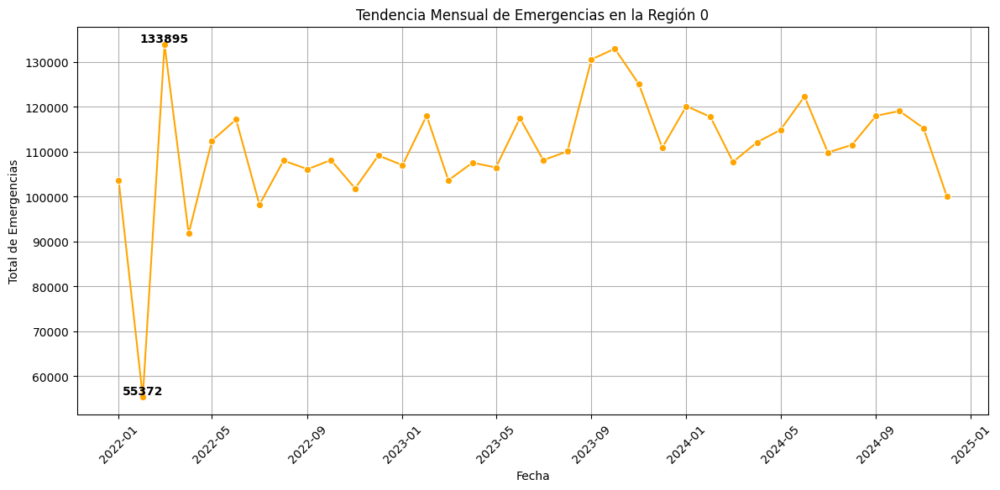

In [ ]:
# Análisis de tendencia mensual
df_monthly = df_region_0.groupby(df_region_0['Fecha'].dt.to_period('M'))["Total_Ingresos"].sum().reset_index()
df_monthly['Fecha'] = df_monthly['Fecha'].astype(str)
df_monthly['Fecha'] = pd.to_datetime(df_monthly['Fecha'])

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_monthly, x='Fecha', y="Total_Ingresos", marker="o", linestyle="-", color="orange")

# Etiquetas de picos y valles
for i, row in df_monthly.iterrows():
    if row["Total_Ingresos"] == df_monthly["Total_Ingresos"].max() or row["Total_Ingresos"] == df_monthly["Total_Ingresos"].min():
        plt.text(row['Fecha'], row["Total_Ingresos"] + 500, str(int(row["Total_Ingresos"])), ha='center', fontsize=10, fontweight='bold', color='black')

# Configuración del gráfico
plt.title("Tendencia Mensual de Emergencias en la Región 0")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


**Análisis del Gráfico: Tendencia Mensual de Emergencias en la Región 0**

El gráfico presenta la evolución del número total de emergencias atendidas mensualmente en la Región 0 entre 2022 y 2024. Se observan variaciones en la demanda, con picos y valles marcados, lo que puede estar relacionado con factores estacionales, epidemiológicos o administrativos.

Identificación de Picos y Valles

Pico más alto (133,895 emergencias en un mes)

Se observa un incremento brusco en la demanda hospitalaria en marzo de 2022.
Posibles causas:

Brotes epidemiológicos (COVID-19, influenza, dengue, etc.).
Eventos estacionales que aumentan la cantidad de accidentes o enfermedades respiratorias.

Mayor capacidad hospitalaria o cambios en la asignación de recursos.
Valle más bajo (55,372 emergencias en un mes)

Se detecta una caída pronunciada en febrero de 2022.

Posibles causas:

Reducción de servicios hospitalarios (huelgas médicas, cierre de unidades, reducción de camas).
Cambio en la derivación de pacientes a otras regiones.
Efectos de políticas de salud pública que redujeron la necesidad de atenciones de emergencia.

## **Región 1**

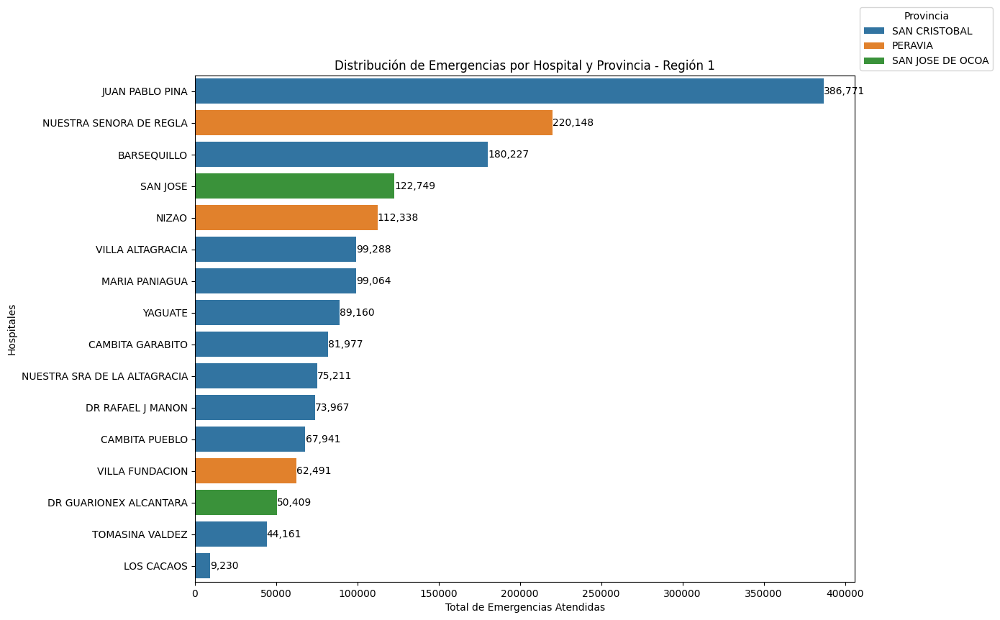

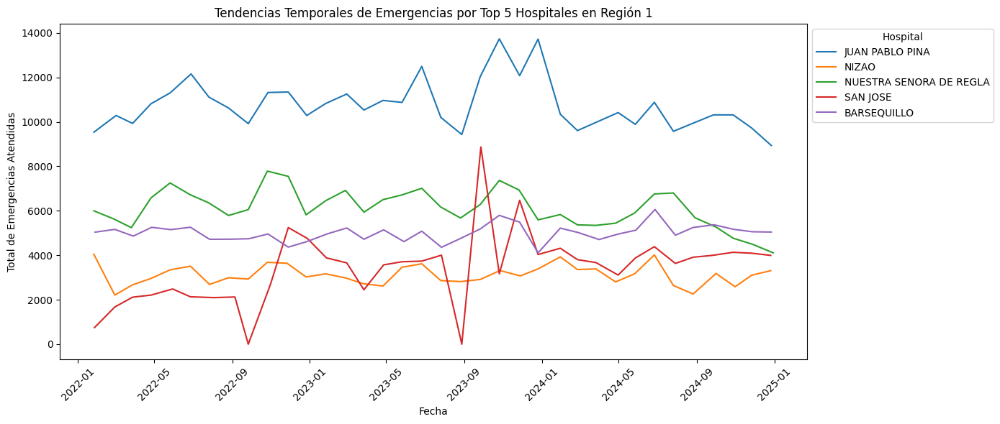

In [ ]:

# Filtrar solo los datos de la Región 1
df_region_1 = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[establecimiento_region]"] == "REGION 1"]

# Seleccionar las columnas relevantes
columns_to_keep = [
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[establecimiento]",  # Establecimiento (Hospital)
    "vw_produccion_67A_eme_BI[Eme_total_egresos]",  # Total ingresos
    "vw_produccion_67A_eme_BI[RegistroFecha]"  # Fecha
]

df_region_1 = df_region_1[columns_to_keep]

# Renombrar columnas para mejor lectura
df_region_1.columns = ["Provincia", "Establecimiento", "Total_Ingresos", "Fecha"]

# Convertir las columnas a los tipos adecuados
df_region_1["Total_Ingresos"] = pd.to_numeric(df_region_1["Total_Ingresos"], errors="coerce")
df_region_1["Fecha"] = pd.to_datetime(df_region_1["Fecha"], errors='coerce')

# Filtrar datos entre 2022 y 2024
df_region_1 = df_region_1[(df_region_1["Fecha"].dt.year >= 2022) & (df_region_1["Fecha"].dt.year <= 2024)]

# Eliminar la columna de fecha antes de agrupar para evitar errores
df_aggregated = df_region_1.drop(columns=["Fecha"]).groupby(["Provincia", "Establecimiento"], as_index=False).sum()

# Ordenar los datos por Total_Ingresos de mayor a menor
df_aggregated = df_aggregated.sort_values(by="Total_Ingresos", ascending=False)

# Gráfico de distribución de emergencias por hospital y provincia
plt.figure(figsize=(14, 8))
sns.barplot(
    data=df_aggregated,
    x="Total_Ingresos",
    y="Establecimiento",
    hue="Provincia",
    dodge=False,
    order=df_aggregated["Establecimiento"]
)
plt.xlabel("Total de Emergencias Atendidas")
plt.ylabel("Hospitales")
plt.title("Distribución de Emergencias por Hospital y Provincia - Región 1")
plt.legend(title="Provincia", bbox_to_anchor=(1, 1))

# Agregar etiquetas a las barras con separador de miles
for index, value in enumerate(df_aggregated["Total_Ingresos"]):
    plt.text(value + 100, index, f"{value:,.0f}", va='center')

plt.tight_layout()
plt.show()

# Análisis de tendencias temporales por hospital (Top 5 hospitales con mayor frecuencia)
top_5_hospitals = df_aggregated.nlargest(5, "Total_Ingresos")["Establecimiento"]
df_tendencias_top5 = df_region_1[df_region_1["Establecimiento"].isin(top_5_hospitals)]
df_tendencias_grouped = df_tendencias_top5.groupby(["Fecha", "Establecimiento"], as_index=False).sum()

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_tendencias_grouped, x="Fecha", y="Total_Ingresos", hue="Establecimiento")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias Atendidas")
plt.title("Tendencias Temporales de Emergencias por Top 5 Hospitales en Región 1")
plt.legend(title="Hospital", bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
# Sumar el total de emergencias atendidas en todos los hospitales de la Región 1 (2022–2024)
total_emergencias_region_1 = df_region_1["Total_Ingresos"].sum()

# Mostrar el resultado con separador de miles
print(f"Total de ingresos por emergencias en la Región 1 (2022–2024): {total_emergencias_region_1:,.0f}")

Total de ingresos por emergencias en la Región 1 (2022–2024): 1,775,132


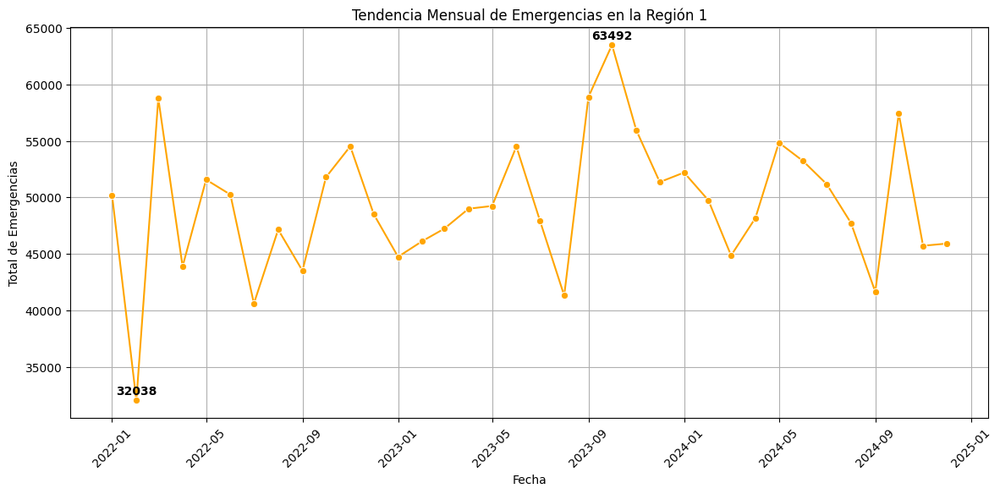

In [ ]:
# Análisis de tendencia mensual
df_monthly = df_region_1.groupby(df_region_1['Fecha'].dt.to_period('M'))["Total_Ingresos"].sum().reset_index()
df_monthly['Fecha'] = df_monthly['Fecha'].astype(str)
df_monthly['Fecha'] = pd.to_datetime(df_monthly['Fecha'])

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_monthly, x='Fecha', y="Total_Ingresos", marker="o", linestyle="-", color="orange")

# Etiquetas de picos y valles
for i, row in df_monthly.iterrows():
    if row["Total_Ingresos"] == df_monthly["Total_Ingresos"].max() or row["Total_Ingresos"] == df_monthly["Total_Ingresos"].min():
        plt.text(row['Fecha'], row["Total_Ingresos"] + 500, str(int(row["Total_Ingresos"])), ha='center', fontsize=10, fontweight='bold', color='black')

# Configuración del gráfico
plt.title("Tendencia Mensual de Emergencias en la Región 1")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Análisis del Gráfico: Tendencia Mensual de Emergencias en la Región 1

El gráfico representa la evolución del número de emergencias mensuales en la Región 1 entre 2022 y 2024. Se pueden identificar variaciones en la demanda hospitalaria, con picos y valles significativos, lo que sugiere la influencia de factores estacionales, administrativos o epidemiológicos.

Identificación de Picos y Valles
Pico más alto (63,492 emergencias en un mes - septiembre 2023)

Se observa un incremento notable en la cantidad de emergencias en septiembre de 2023.
Posibles causas:
Brotes de enfermedades respiratorias o infecciosas en esa época.
Aumento de accidentes u otros eventos que incrementan la demanda hospitalaria.
Mayor capacidad hospitalaria o reasignación de pacientes desde otras regiones.
Valle más bajo (32,038 emergencias en un mes - febrero 2022)

El número de emergencias cae de forma significativa en febrero de 2022.
Posibles causas:
Menor incidencia de enfermedades en ese periodo.
Restricciones en la atención hospitalaria debido a personal reducido o disponibilidad de camas.
Menos derivaciones de pacientes a hospitales de la región.

Interpretación General:
El comportamiento de los datos muestra fluctuaciones recurrentes, con ciertos picos estacionales que podrían estar asociados con factores epidemiológicos o administrativos.

Tendencias Generales
Aumento progresivo de emergencias en algunos periodos

Durante varios meses consecutivos, el número de emergencias se mantiene por encima de 50,000 casos.
Esto indica un patrón de alta demanda sostenida, lo que podría requerir ajustes en la planificación hospitalaria.
Descensos abruptos en ciertos meses

Se observan meses con caídas importantes en la cantidad de emergencias, lo que podría indicar:
Reducción en la incidencia de enfermedades estacionales.
Efectos de políticas de salud pública que disminuyen la carga hospitalaria.
Menos disponibilidad de recursos hospitalarios en esos meses.
Oscilaciones constantes en la demanda

No hay una tendencia claramente ascendente o descendente, sino más bien altibajos regulares, lo que sugiere que la carga hospitalaria no se distribuye de manera uniforme a lo largo del año.

Conclusión Final:
El gráfico refleja una demanda hospitalaria variable, con picos estacionales y fluctuaciones significativas en la Región 1. Para una mejor gestión, se recomienda un análisis más detallado de factores externos y el uso de modelos predictivos para anticipar necesidades hospitalarias.



## **Región 2**

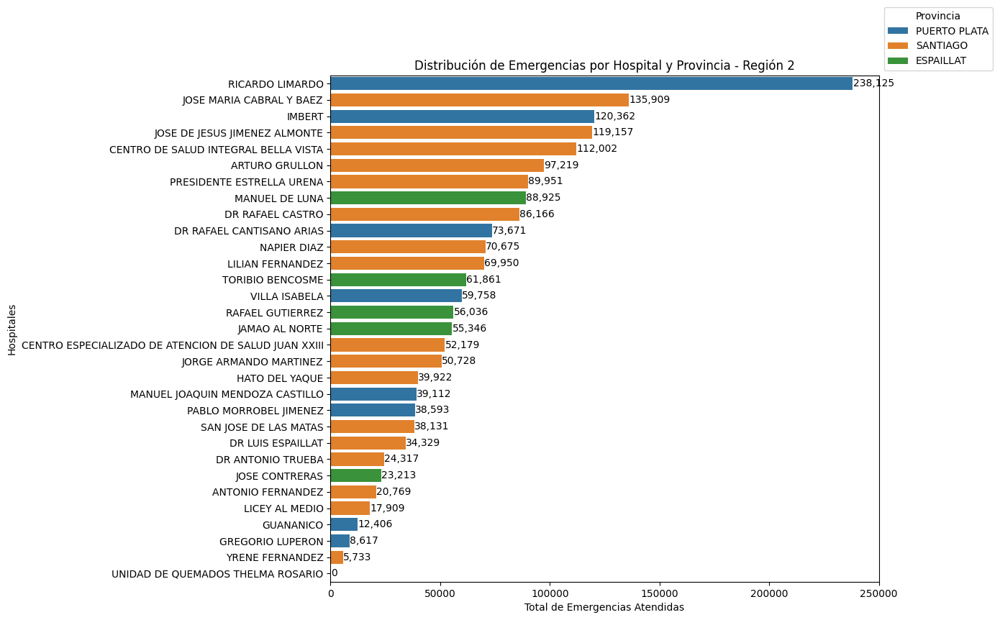

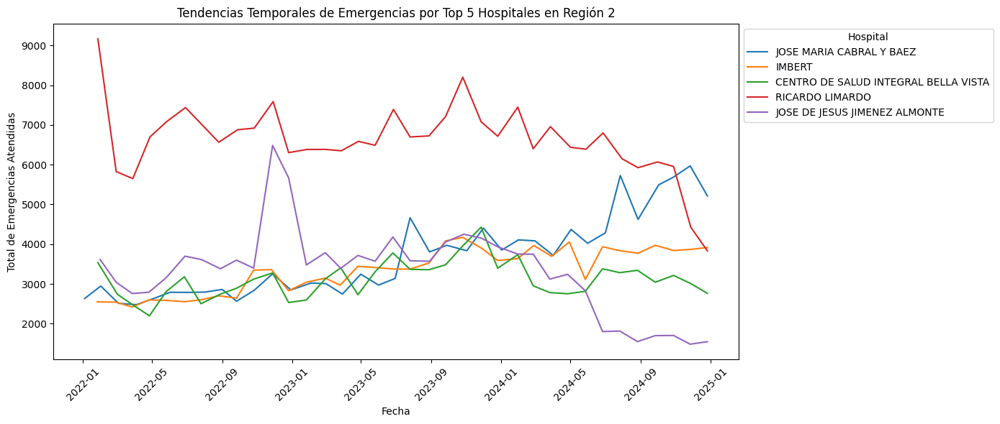

In [ ]:
# Filtrar solo los datos de la Región 2
df_region_2 = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[establecimiento_region]"] == "REGION 2"]

# Seleccionar las columnas relevantes
columns_to_keep = [
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[establecimiento]",  # Establecimiento (Hospital)
    "vw_produccion_67A_eme_BI[Eme_total_egresos]",  # Total ingresos
    "vw_produccion_67A_eme_BI[RegistroFecha]"  # Fecha
]

df_region_2 = df_region_2[columns_to_keep]

# Renombrar columnas para mejor lectura
df_region_2.columns = ["Provincia", "Establecimiento", "Total_Ingresos", "Fecha"]

# Convertir las columnas a los tipos adecuados
df_region_2["Total_Ingresos"] = pd.to_numeric(df_region_2["Total_Ingresos"], errors="coerce")  # Se corrigió aquí
df_region_2["Fecha"] = pd.to_datetime(df_region_2["Fecha"], errors='coerce')

# Filtrar datos entre 2022 y 2024
df_region_2 = df_region_2[(df_region_2["Fecha"].dt.year >= 2022) & (df_region_2["Fecha"].dt.year <= 2024)]

# Eliminar la columna de fecha antes de agrupar para evitar errores
df_aggregated = df_region_2.drop(columns=["Fecha"]).groupby(["Provincia", "Establecimiento"], as_index=False).sum()

# Ordenar los datos por Total_Ingresos de mayor a menor
df_aggregated = df_aggregated.sort_values(by="Total_Ingresos", ascending=False)

# Gráfico de distribución de emergencias por hospital y provincia
plt.figure(figsize=(14, 8))
sns.barplot(
    data=df_aggregated,
    x="Total_Ingresos",
    y="Establecimiento",
    hue="Provincia",
    dodge=False,
    order=df_aggregated["Establecimiento"]
)
plt.xlabel("Total de Emergencias Atendidas")
plt.ylabel("Hospitales")
plt.title("Distribución de Emergencias por Hospital y Provincia - Región 2")
plt.legend(title="Provincia", bbox_to_anchor=(1, 1))

# Agregar etiquetas a las barras con separador de miles
for index, value in enumerate(df_aggregated["Total_Ingresos"]):
    plt.text(value + 100, index, f"{value:,.0f}", va='center')

plt.tight_layout()
plt.show()

# Análisis de tendencias temporales por hospital (Top 5 hospitales con mayor frecuencia)
top_5_hospitals = df_aggregated.nlargest(5, "Total_Ingresos")["Establecimiento"]
df_tendencias_top5 = df_region_2[df_region_2["Establecimiento"].isin(top_5_hospitals)]
df_tendencias_grouped = df_tendencias_top5.groupby(["Fecha", "Establecimiento"], as_index=False).sum()

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_tendencias_grouped, x="Fecha", y="Total_Ingresos", hue="Establecimiento")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias Atendidas")
plt.title("Tendencias Temporales de Emergencias por Top 5 Hospitales en Región 2")
plt.legend(title="Hospital", bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Análisis del Gráfico: Distribución de Emergencias por Hospital y Provincia en la Región 2

El gráfico muestra la cantidad total de emergencias atendidas en distintos hospitales de la Región 2, agrupados por provincia (Puerto Plata, Santiago y Espaillat). La distribución permite identificar los hospitales con la mayor y menor carga de emergencias, así como posibles factores que influyen en la demanda de atención.

Hospitales con Mayor Carga de Emergencias
Los hospitales con la mayor cantidad de emergencias en la Región 2 incluyen:

RICARDO LIMARDO (238,125 emergencias)

Es el hospital con el mayor volumen de emergencias en la región, lo que sugiere que:
Es un hospital de referencia en Puerto Plata.
Tiene una alta densidad poblacional en su área de influencia.
Podría recibir pacientes derivados de otros centros de menor capacidad.
JOSÉ MARÍA CABRAL Y BÁEZ (135,909 emergencias)

Se encuentra en Santiago y presenta una carga alta de emergencias.
Factores posibles:

Infraestructura con mayor capacidad.
Accesibilidad para pacientes de otras provincias cercanas.
Hospital universitario o especializado con más recursos.
IMBERT, JOSÉ DE JESÚS JIMÉNEZ ALMONTE y CENTRO DE SALUD INTEGRAL BELLA VISTA (más de 110,000 emergencias cada uno)

Son hospitales con volúmenes considerables de emergencias, lo que podría estar relacionado con:
Ubicación estratégica dentro de la provincia.
Especialización médica en ciertos tipos de atención.
Mayor accesibilidad para la población local.

Conclusión:
Los hospitales con más emergencias suelen estar en zonas urbanas densamente pobladas o ser centros de referencia dentro de la región.

Hospitales con Menor Cantidad de Emergencias
En la parte inferior del gráfico, algunos hospitales tienen una carga significativamente más baja, entre ellos:

GREGORIO LUPERÓN (8,617 emergencias)
YRENE FERNÁNDEZ (5,733 emergencias)
UNIDAD DE QUEMADOS THELMA ROSARIO (0 emergencias reportadas)

Interpretación:

Algunos hospitales pueden especializarse en servicios no críticos o en unidades con menos emergencias, como salud mental o rehabilitación.
También podrían enfrentar limitaciones en personal, equipamiento o infraestructura, lo que restringe su capacidad para recibir emergencias.
La movilidad de pacientes puede estar influyendo en estos números, derivándolos a hospitales de mayor capacidad.

Fluctuaciones en la Demanda por Provincia

El gráfico muestra diferencias en la carga de emergencias según la provincia:

Puerto Plata:

Alberga el hospital con más emergencias (Ricardo Limardo).
La provincia parece tener una red hospitalaria bien distribuida, con hospitales que manejan cargas significativas.
Santiago:

Tiene varios hospitales con alta carga de emergencias (José María Cabral y Báez, Arturo Grullón).
Esto sugiere que es un centro de referencia para otras provincias.
Espaillat:

Presenta una menor concentración de hospitales con alto volumen de emergencias.
Esto podría indicar que los pacientes deben trasladarse a otras provincias para recibir atención especializada.

Análisis Adicional:
Sería útil analizar si las diferencias en el número de emergencias por provincia se deben a:

Cantidad y tamaño de los hospitales en cada región.
Movilidad de pacientes hacia hospitales con mayor capacidad.
Disponibilidad de especialidades médicas en cada hospital.

Conclusión Final:

El análisis muestra una distribución desigual de emergencias entre hospitales y provincias, con algunos centros enfrentando sobrecarga asistencial. Para mejorar la planificación hospitalaria, sería clave analizar capacidad instalada, movilidad de pacientes y factores externos que influyen en la demanda.



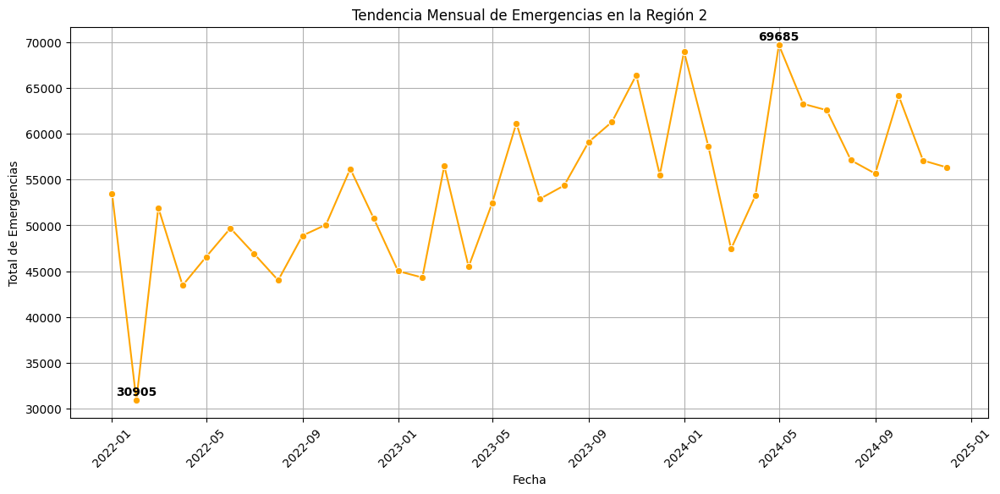

In [ ]:
# Análisis de tendencia mensual
df_monthly = df_region_2.groupby(df_region_2['Fecha'].dt.to_period('M'))["Total_Ingresos"].sum().reset_index()
df_monthly['Fecha'] = df_monthly['Fecha'].astype(str)
df_monthly['Fecha'] = pd.to_datetime(df_monthly['Fecha'])

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_monthly, x='Fecha', y="Total_Ingresos", marker="o", linestyle="-", color="orange")

# Etiquetas de picos y valles
for i, row in df_monthly.iterrows():
    if row["Total_Ingresos"] == df_monthly["Total_Ingresos"].max() or row["Total_Ingresos"] == df_monthly["Total_Ingresos"].min():
        plt.text(row['Fecha'], row["Total_Ingresos"] + 500, str(int(row["Total_Ingresos"])), ha='center', fontsize=10, fontweight='bold', color='black')

# Configuración del gráfico
plt.title("Tendencia Mensual de Emergencias en la Región 2")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Análisis del Gráfico: Tendencia Mensual de Emergencias en la Región 2

El gráfico muestra la evolución mensual del total de emergencias atendidas en la Región 2 desde 2022 hasta 2024. Se observan fluctuaciones significativas, con períodos de altas y bajas en la demanda de atención hospitalaria. Estos picos y valles pueden estar relacionados con factores estacionales, epidemiológicos o administrativos.

Identificación de Picos y Valles
Pico más alto (69,685 emergencias - mayo 2024)

Este mes experimenta el mayor número de emergencias en la Región 2.
Posibles causas:
Brote de enfermedades infecciosas en ese período.
Aumento de accidentes de tránsito por factores climáticos o eventos especiales.
Mayor flujo de pacientes por derivaciones de otros hospitales.
Valle más bajo (30,905 emergencias - febrero 2022)

Se registra una caída significativa en la demanda de emergencias.
Posibles causas:
Menor incidencia de enfermedades en ese periodo del año.
Cierre temporal de unidades hospitalarias o disminución en la capacidad de atención.
Disminución de accidentes o eventos críticos.

Interpretación General:
Los datos reflejan un comportamiento cíclico, con picos recurrentes en ciertos meses del año. Esto sugiere que hay factores estacionales o eventos específicos que impulsan la demanda hospitalaria en ciertos periodos.

Comportamiento General y Tendencias
Crecimiento en la Demanda de Emergencias

Se observa un aumento progresivo en el total de emergencias a lo largo del tiempo.
Esto podría indicar una mayor carga sobre el sistema hospitalario, lo que puede requerir una mejor gestión de recursos médicos.
Oscilaciones Periódicas

La cantidad de emergencias no se mantiene estable, sino que sube y baja en ciertos meses.
Esto sugiere que hay patrones estacionales o eventos externos que afectan la demanda.
Tendencia Alcista en 2023 y 2024

Desde mediados de 2023 hasta 2024, se observan niveles más altos de emergencias en comparación con 2022.
Posibles factores:
Crecimiento poblacional en la región.
Mayor acceso a servicios hospitalarios.
Factores epidemiológicos que aumentaron la cantidad de pacientes.

Recomendación:
Sería útil cruzar estos datos con información externa, como:

Condiciones climáticas (temperatura y lluvias pueden influir en enfermedades respiratorias o accidentes).
Eventos de salud pública (brotes de enfermedades estacionales, epidemias).
Datos de movilidad y accidentes viales.

Recomendaciones y Próximos Pasos
Para optimizar la gestión hospitalaria en la Región 2, se pueden tomar las siguientes medidas:

Predicción de la Demanda

Implementar modelos de predicción (ARIMA, Prophet) para anticipar futuras variaciones en la demanda hospitalaria.
Optimización de Recursos

Ajustar la distribución del personal y equipamiento en función de los meses de mayor demanda.
Implementar estrategias de prevención en salud pública para reducir la carga hospitalaria en picos críticos.
Evaluación de Factores Externos

Cruzar los datos con variables como:
Tendencias en enfermedades estacionales (dengue, gripe, COVID-19).
Eventos o festividades que puedan influir en el aumento de accidentes o emergencias.
Disponibilidad y distribución de infraestructura hospitalaria.

Conclusión Final:
El gráfico refleja una tendencia creciente en la demanda hospitalaria en la Región 2, con fluctuaciones cíclicas que pueden estar influenciadas por factores estacionales, epidemiológicos y administrativos. Para mejorar la gestión hospitalaria, se recomienda realizar un análisis más profundo de las causas de los picos y valles y anticipar la demanda futura mediante modelos de predicción.



## **Región 3**

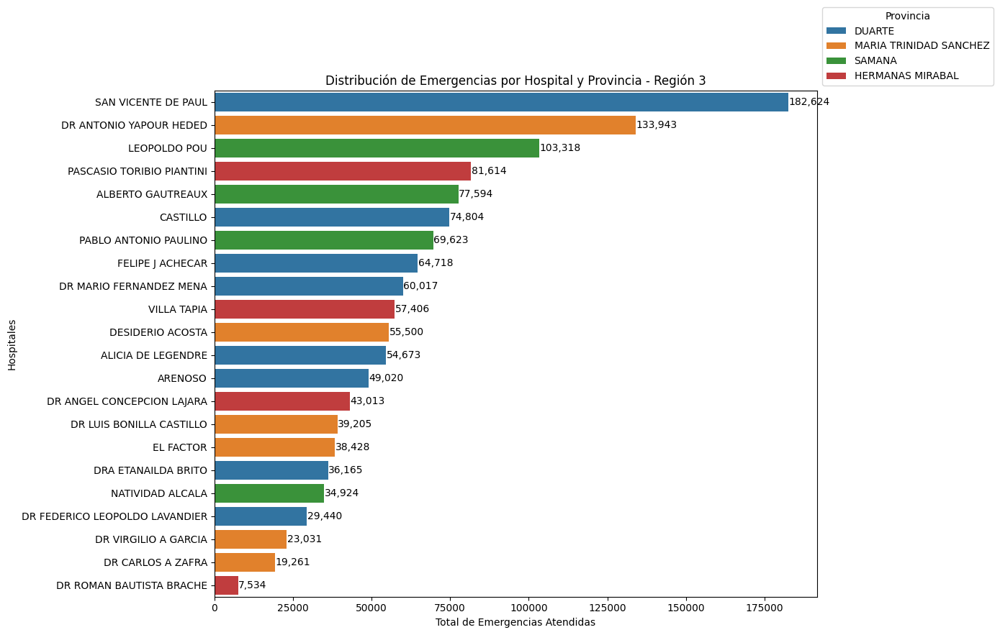

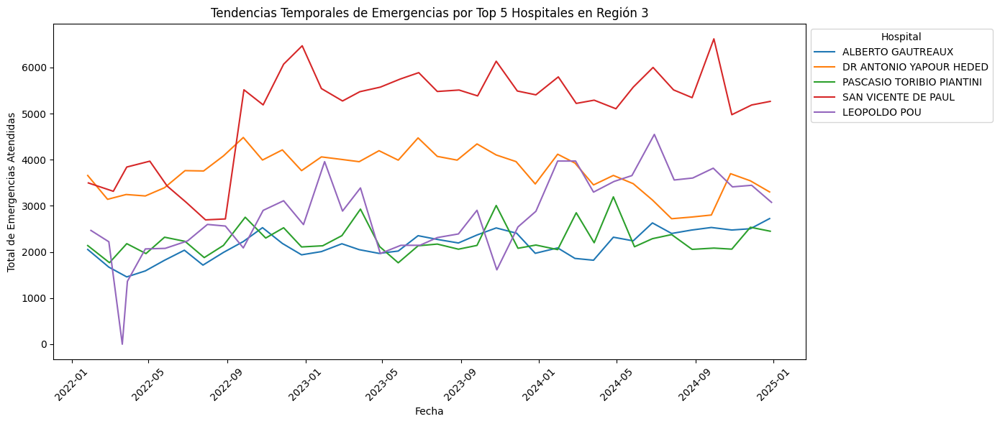

In [ ]:
# Filtrar solo los datos de la Región 3
df_region_3 = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[establecimiento_region]"] == "REGION 3"]

# Seleccionar las columnas relevantes
columns_to_keep = [
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[establecimiento]",  # Establecimiento (Hospital)
    "vw_produccion_67A_eme_BI[Eme_total_egresos]",  # Total ingresos
    "vw_produccion_67A_eme_BI[RegistroFecha]"  # Fecha
]

df_region_3 = df_region_3[columns_to_keep]

# Renombrar columnas para mejor lectura
df_region_3.columns = ["Provincia", "Establecimiento", "Total_Ingresos", "Fecha"]

# Convertir las columnas a los tipos adecuados
df_region_3["Total_Ingresos"] = pd.to_numeric(df_region_3["Total_Ingresos"], errors="coerce")
df_region_3["Fecha"] = pd.to_datetime(df_region_3["Fecha"], errors='coerce')

# Filtrar datos entre 2022 y 2024
df_region_3 = df_region_3[(df_region_3["Fecha"].dt.year >= 2022) & (df_region_3["Fecha"].dt.year <= 2024)]

# Eliminar la columna de fecha antes de agrupar para evitar errores
df_aggregated = df_region_3.drop(columns=["Fecha"]).groupby(["Provincia", "Establecimiento"], as_index=False).sum()

# Ordenar los datos por Total_Ingresos de mayor a menor
df_aggregated = df_aggregated.sort_values(by="Total_Ingresos", ascending=False)

# Gráfico de distribución de emergencias por hospital y provincia
plt.figure(figsize=(14, 8))
sns.barplot(
    data=df_aggregated,
    x="Total_Ingresos",
    y="Establecimiento",
    hue="Provincia",
    dodge=False,
    order=df_aggregated["Establecimiento"]
)
plt.xlabel("Total de Emergencias Atendidas")
plt.ylabel("Hospitales")
plt.title("Distribución de Emergencias por Hospital y Provincia - Región 3")
plt.legend(title="Provincia", bbox_to_anchor=(1, 1))

# Agregar etiquetas a las barras con separador de miles
for index, value in enumerate(df_aggregated["Total_Ingresos"]):
    plt.text(value + 100, index, f"{value:,.0f}", va='center')

plt.tight_layout()
plt.show()

# Análisis de tendencias temporales por hospital (Top 5 hospitales con mayor frecuencia)
top_5_hospitals = df_aggregated.nlargest(5, "Total_Ingresos")["Establecimiento"]
df_tendencias_top5 = df_region_3[df_region_3["Establecimiento"].isin(top_5_hospitals)]
df_tendencias_grouped = df_tendencias_top5.groupby(["Fecha", "Establecimiento"], as_index=False).sum()

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_tendencias_grouped, x="Fecha", y="Total_Ingresos", hue="Establecimiento")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias Atendidas")
plt.title("Tendencias Temporales de Emergencias por Top 5 Hospitales en Región 3")
plt.legend(title="Hospital", bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Análisis del Gráfico: Distribución de Emergencias por Hospital y Provincia en la Región 3

El gráfico muestra la cantidad total de emergencias atendidas en distintos hospitales de la Región 3, agrupados por provincia (Duarte, María Trinidad Sánchez, Samaná y Hermanas Mirabal). La distribución permite identificar los hospitales con la mayor y menor carga de emergencias, así como posibles factores que influyen en la demanda de atención.

Hospitales con Mayor Carga de Emergencias
Los hospitales con mayor cantidad de emergencias en la Región 3 incluyen:

San Vicente de Paul (182,624 emergencias)

Es el hospital con el mayor volumen de emergencias en la región.
Podría ser un hospital de referencia en Duarte.
Posible alta densidad poblacional en su área de influencia.
Puede recibir pacientes derivados de hospitales con menor capacidad.
Dr. Antonio Yapor Heded (133,943 emergencias)

Localizado en María Trinidad Sánchez.
Infraestructura con mayor capacidad.
Accesibilidad para pacientes de provincias cercanas.
Podría ser un hospital especializado con más recursos.
Leopoldo Pou (103,318 emergencias)

Ubicado en Samaná.
Alto volumen de emergencias, lo que sugiere un papel clave en la región.
Puede atender tanto a la población local como a turistas y visitantes.
Pascasio Toribio Piantini (81,614 emergencias)

Hospital en Hermanas Mirabal con una carga considerable.
Podría influir su ubicación estratégica dentro de la provincia.
Alberto Gautreaux (77,594 emergencias)

También en Samaná, lo que indica que esta provincia tiene varios centros con alta demanda.

Conclusión:
Los hospitales con más emergencias suelen estar en zonas urbanas densamente pobladas o ser centros de referencia dentro de la región. En este caso, Duarte, María Trinidad Sánchez y Samaná concentran la mayor cantidad de emergencias atendidas.



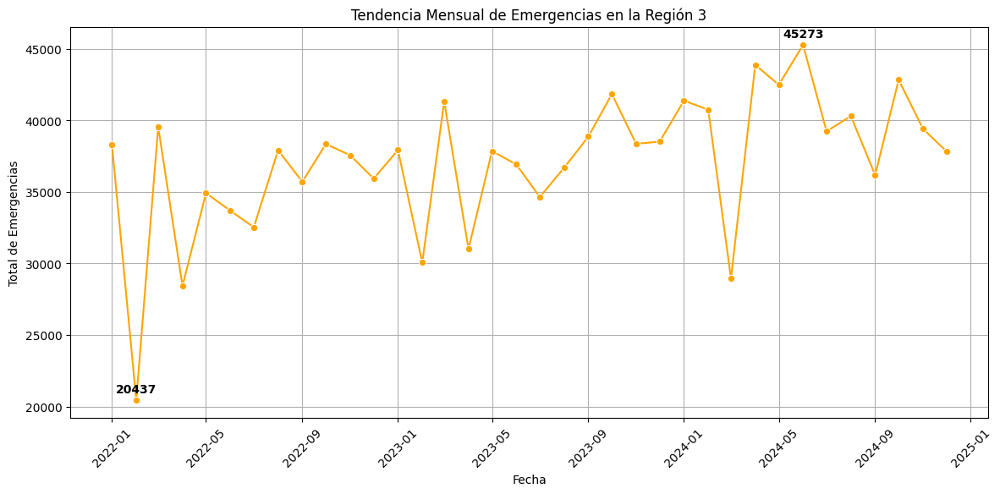

In [ ]:
# Análisis de tendencia mensual
df_monthly = df_region_3.groupby(df_region_3['Fecha'].dt.to_period('M'))["Total_Ingresos"].sum().reset_index()
df_monthly['Fecha'] = df_monthly['Fecha'].astype(str)
df_monthly['Fecha'] = pd.to_datetime(df_monthly['Fecha'])

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_monthly, x='Fecha', y="Total_Ingresos", marker="o", linestyle="-", color="orange")

# Etiquetas de picos y valles
for i, row in df_monthly.iterrows():
    if row["Total_Ingresos"] == df_monthly["Total_Ingresos"].max() or row["Total_Ingresos"] == df_monthly["Total_Ingresos"].min():
        plt.text(row['Fecha'], row["Total_Ingresos"] + 500, str(int(row["Total_Ingresos"])), ha='center', fontsize=10, fontweight='bold', color='black')

# Configuración del gráfico
plt.title("Tendencia Mensual de Emergencias en la Región 3")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Análisis del Gráfico: Tendencia Mensual de Emergencias en la Región 3
El gráfico muestra la evolución mensual del total de emergencias atendidas en la Región 3 desde enero de 2022 hasta finales de 2024. La serie de datos presenta fluctuaciones, con picos y valles que reflejan cambios en la demanda de emergencias hospitalarias en distintos meses.

Observaciones Claves
Mínimo y Máximo

El mes con menor número de emergencias ocurrió en febrero de 2022, con 20,437 emergencias.
El mes con mayor número de emergencias fue en mayo de 2024, con 45,273 emergencias.
Patrón de Variación

Se observan fluctuaciones mensuales en la cantidad de emergencias, con descensos pronunciados seguidos de incrementos rápidos.
Se destacan varios picos de atención, indicando momentos de alta demanda en el sistema hospitalario.
En algunos puntos, se presentan descensos drásticos, lo que podría estar relacionado con factores como:
Cambios estacionales (ej., disminución de enfermedades respiratorias en ciertos meses).
Eventos sanitarios específicos (brotes epidemiológicos, crisis hospitalarias, huelgas médicas).
Factores externos como desastres naturales o variaciones en la movilidad de la población.
Tendencia General

Aunque hay altibajos, la tendencia general parece moderadamente ascendente, lo que sugiere un aumento gradual en la cantidad de emergencias atendidas con el tiempo.
Este incremento podría estar relacionado con factores como crecimiento poblacional, mayor acceso a los servicios de emergencia o un aumento en la ocurrencia de eventos críticos.
Posibles Factores Explicativos
Factores Estacionales

La demanda de emergencias suele variar según la época del año. Por ejemplo, los picos en algunos meses pueden estar relacionados con brotes de enfermedades respiratorias o aumentos de accidentes en temporadas vacacionales.
Eventos Excepcionales

Si hubo crisis sanitarias, pandemias o desastres naturales, estos pueden haber influido en los meses de mayor actividad.
Posibles huelgas del personal de salud o falta de insumos pueden haber impactado la disponibilidad de atención en ciertos períodos.
Crecimiento de la Población o Cambios en la Infraestructura Sanitaria

El incremento en la cantidad de emergencias atendidas puede ser reflejo de un aumento en la población o mejoras en la cobertura y acceso a los servicios de salud.

Recomendaciones para un Análisis Más Profundo
Para entender mejor estas fluctuaciones y su impacto en la planificación hospitalaria, se pueden realizar los siguientes análisis adicionales:

Comparación por Años

Comparar la cantidad de emergencias por año para verificar si el aumento es progresivo o si hay anomalías en años específicos.
Análisis de Temporadas

Evaluar si los meses de mayor demanda coinciden con épocas de mayor circulación de enfermedades o períodos vacacionales.
Cruce con Variables Externas

Analizar si estos cambios están correlacionados con factores externos como brotes epidemiológicos, desastres naturales o eventos locales.
Evaluación de la Capacidad Hospitalaria

Determinar si los hospitales tienen la infraestructura necesaria para manejar los períodos de alta demanda.
Conclusión
El análisis de la tendencia mensual de emergencias en la Región 3 muestra altibajos marcados, con períodos de gran afluencia y momentos de disminución considerable. La tendencia general sugiere un ligero aumento en la demanda de emergencias con el tiempo. Para una mejor planificación, sería clave analizar los factores que impulsan estos cambios y preparar los hospitales para afrontar los períodos de mayor presión asistencial.

## **Región 4**

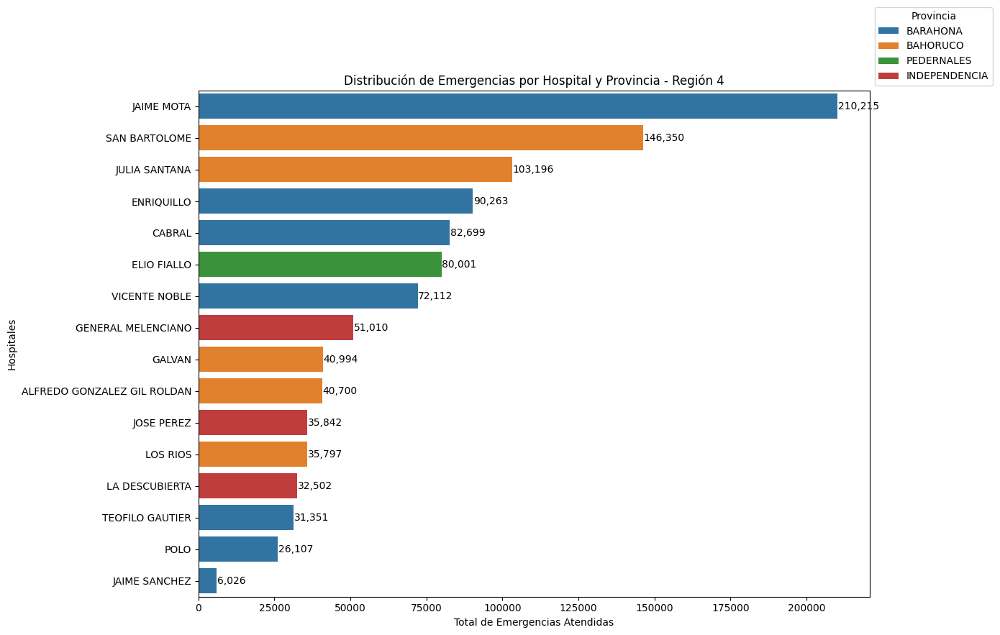

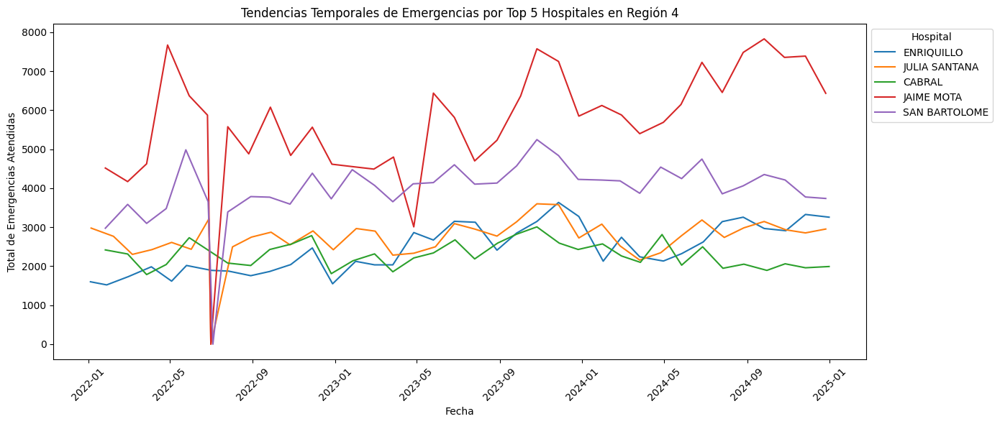

In [ ]:
# Filtrar solo los datos de la Región 4
df_region_4 = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[establecimiento_region]"] == "REGION 4"]

# Seleccionar las columnas relevantes
columns_to_keep = [
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[establecimiento]",  # Establecimiento (Hospital)
    "vw_produccion_67A_eme_BI[Eme_total_egresos]",  # Total ingresos
    "vw_produccion_67A_eme_BI[RegistroFecha]"  # Fecha
]

df_region_4 = df_region_4[columns_to_keep]

# Renombrar columnas para mejor lectura
df_region_4.columns = ["Provincia", "Establecimiento", "Total_Ingresos", "Fecha"]

# Convertir las columnas a los tipos adecuados
df_region_4["Total_Ingresos"] = pd.to_numeric(df_region_4["Total_Ingresos"], errors="coerce")
df_region_4["Fecha"] = pd.to_datetime(df_region_4["Fecha"], errors='coerce')

# Filtrar datos entre 2022 y 2024
df_region_4 = df_region_4[(df_region_4["Fecha"].dt.year >= 2022) & (df_region_4["Fecha"].dt.year <= 2024)]

# Eliminar la columna de fecha antes de agrupar para evitar errores
df_aggregated = df_region_4.drop(columns=["Fecha"]).groupby(["Provincia", "Establecimiento"], as_index=False).sum()

# Ordenar los datos por Total_Ingresos de mayor a menor
df_aggregated = df_aggregated.sort_values(by="Total_Ingresos", ascending=False)

# Gráfico de distribución de emergencias por hospital y provincia
plt.figure(figsize=(14, 8))
sns.barplot(
    data=df_aggregated,
    x="Total_Ingresos",
    y="Establecimiento",
    hue="Provincia",
    dodge=False,
    order=df_aggregated["Establecimiento"]
)
plt.xlabel("Total de Emergencias Atendidas")
plt.ylabel("Hospitales")
plt.title("Distribución de Emergencias por Hospital y Provincia - Región 4")
plt.legend(title="Provincia", bbox_to_anchor=(1, 1))

# Agregar etiquetas a las barras con separador de miles
for index, value in enumerate(df_aggregated["Total_Ingresos"]):
    plt.text(value + 100, index, f"{value:,.0f}", va='center')

plt.tight_layout()
plt.show()

# Análisis de tendencias temporales por hospital (Top 5 hospitales con mayor frecuencia)
top_5_hospitals = df_aggregated.nlargest(5, "Total_Ingresos")["Establecimiento"]
df_tendencias_top5 = df_region_4[df_region_4["Establecimiento"].isin(top_5_hospitals)]
df_tendencias_grouped = df_tendencias_top5.groupby(["Fecha", "Establecimiento"], as_index=False).sum()

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_tendencias_grouped, x="Fecha", y="Total_Ingresos", hue="Establecimiento")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias Atendidas")
plt.title("Tendencias Temporales de Emergencias por Top 5 Hospitales en Región 4")
plt.legend(title="Hospital", bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Análisis del Gráfico: Distribución de Emergencias por Hospital y Provincia en la Región 4
El gráfico muestra la cantidad total de emergencias atendidas en distintos hospitales de la Región 4, agrupados por provincia (Barahona, Bahoruco, Pedernales e Independencia). Esto permite identificar los hospitales con mayor y menor carga de emergencias, así como posibles factores que influyen en la demanda de atención.

Hospitales con Mayor Carga de Emergencias
Los hospitales con mayor cantidad de emergencias en la Región 4 incluyen:

Jaime Mota (210,215 emergencias)

Es el hospital con mayor volumen de emergencias en la región.
Ubicado en Barahona, una provincia con una infraestructura hospitalaria más consolidada.
Posible hospital de referencia en la región, recibiendo pacientes de provincias vecinas.
Puede estar influenciado por una alta densidad poblacional o movilidad de pacientes desde áreas rurales.
San Bartolomé (146,350 emergencias)

Ubicado en Bahoruco, presenta un volumen alto de emergencias.
Esto sugiere que es un hospital clave en su provincia, absorbiendo una gran parte de los casos urgentes.
Puede estar relacionado con la accesibilidad del hospital para varias comunidades aledañas.
Julia Santana (103,196 emergencias)

También en Bahoruco, lo que indica que la provincia tiene dos hospitales con alta demanda.
Su posición en el ranking sugiere que es un punto estratégico de atención médica en la zona.
Enriquillo (90,263 emergencias)

Hospital de Barahona con una carga considerable.
Posiblemente atiende tanto a residentes de la provincia como a poblaciones vecinas.
Cabral (82,699 emergencias)

Otro hospital importante de Barahona, que muestra una red hospitalaria bien distribuida en la provincia.
Conclusión:
Los hospitales con mayor carga de emergencias se concentran en Barahona y Bahoruco, lo que sugiere que estas provincias tienen una mayor densidad poblacional o funcionan como centros de referencia en la región.

Hospitales con Menor Cantidad de Emergencias
Los hospitales con menor carga de emergencias incluyen:

Jaime Sánchez (6,026 emergencias)

Es el hospital con menor número de emergencias registradas en la región.
Podría deberse a su especialización en servicios no urgentes o a limitaciones de infraestructura.
Polo (26,107 emergencias)

Comparado con los hospitales principales, su volumen es relativamente bajo.
Puede estar localizado en una zona menos poblada.
Teófilo Gautier (31,351 emergencias)

También en la parte baja de la lista, lo que indica que su capacidad de atención de emergencias es menor.
La Descubierta (32,502 emergencias)

Hospital en la provincia de Independencia con menor demanda relativa.
Puede ser un hospital secundario o enfocado en otro tipo de servicios médicos.
Interpretación:
Algunos hospitales pueden especializarse en atención ambulatoria o salud preventiva, lo que reduce la cantidad de emergencias atendidas.
También podrían enfrentar limitaciones en personal o equipamiento, lo que restringe su capacidad operativa.
La movilidad de pacientes puede estar jugando un papel importante, con personas trasladándose a hospitales de mayor capacidad en Barahona y Bahoruco.
Fluctuaciones en la Demanda por Provincia
El gráfico sugiere que la carga de emergencias varía entre provincias:

Barahona:

Alberga el hospital con más emergencias (Jaime Mota).
Parece ser el centro hospitalario más importante de la región.
También cuenta con otros hospitales relevantes, como Enriquillo y Cabral.
Bahoruco:

Tiene dos hospitales con alta carga (San Bartolomé y Julia Santana).
Indica que la provincia cuenta con infraestructura hospitalaria relevante.
Pedernales:

Presenta un solo hospital destacado (Elio Fiallo con 80,001 emergencias).
Su volumen de emergencias es considerablemente menor que en Barahona y Bahoruco.
Independencia:

Cuenta con hospitales con menor carga asistencial.
Esto podría indicar una menor densidad poblacional o falta de especialización en emergencias.

Conclusión Final
El análisis de la distribución de emergencias en la Región 4 muestra que la mayor carga recae en los hospitales de Barahona y Bahoruco, con Jaime Mota como el principal centro de atención. En contraste, los hospitales de Independencia y Pedernales tienen menor volumen de emergencias. Para mejorar la eficiencia hospitalaria en la región, se recomienda evaluar la capacidad instalada, movilidad de pacientes y factores externos que influyen en la demanda.

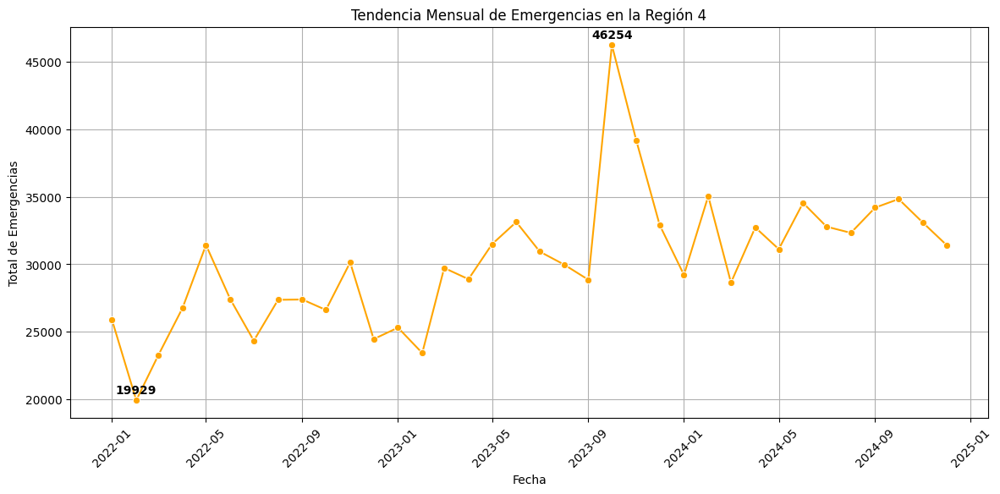

In [ ]:
# Análisis de tendencia mensual
df_monthly = df_region_4.groupby(df_region_4['Fecha'].dt.to_period('M'))["Total_Ingresos"].sum().reset_index()
df_monthly['Fecha'] = df_monthly['Fecha'].astype(str)
df_monthly['Fecha'] = pd.to_datetime(df_monthly['Fecha'])

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_monthly, x='Fecha', y="Total_Ingresos", marker="o", linestyle="-", color="orange")

# Etiquetas de picos y valles
for i, row in df_monthly.iterrows():
    if row["Total_Ingresos"] == df_monthly["Total_Ingresos"].max() or row["Total_Ingresos"] == df_monthly["Total_Ingresos"].min():
        plt.text(row['Fecha'], row["Total_Ingresos"] + 500, str(int(row["Total_Ingresos"])), ha='center', fontsize=10, fontweight='bold', color='black')

# Configuración del gráfico
plt.title("Tendencia Mensual de Emergencias en la Región 4")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Análisis del Gráfico: Tendencia Mensual de Emergencias en la Región 4
El gráfico muestra la evolución mensual del número de emergencias atendidas en la Región 4 entre enero de 2022 y finales de 2024. Se observan fluctuaciones significativas, con algunos meses registrando un mayor número de emergencias y otros mostrando caídas pronunciadas.

Observaciones Claves
Mínimo y Máximo

El mes con menor número de emergencias ocurrió en enero de 2022, con 19,929 emergencias.
El mes con mayor número de emergencias fue en septiembre de 2023, con 46,254 emergencias.
Variabilidad Mensual

Se observa una tendencia fluctuante, con picos y descensos recurrentes.
Algunos periodos tienen caídas abruptas, seguidas de rápidas recuperaciones.
Los aumentos bruscos en emergencias pueden estar relacionados con factores externos como brotes epidemiológicos, accidentes masivos o problemas en la red hospitalaria.
Tendencia General

Aunque el comportamiento mensual es irregular, la tendencia general es estable, con un promedio de emergencias que parece mantenerse entre 25,000 y 35,000 emergencias mensuales.
Sin embargo, el pico de septiembre de 2023 y la caída de enero de 2022 son eventos atípicos que podrían necesitar un análisis más detallado.

Posibles Factores Explicativos
Factores Estacionales

Algunos meses presentan incrementos, posiblemente relacionados con:
Brotes de enfermedades respiratorias en invierno.
Mayor número de accidentes en temporadas festivas o vacacionales.
Cambios en la movilidad de la población.
Eventos Excepcionales

El pico de septiembre de 2023 (46,254 emergencias) podría deberse a un evento inusual como:

Aumento de casos de una enfermedad epidémica.
Fenómeno meteorológico extremo (huracanes, inundaciones) que incrementó la necesidad de atención médica.
Colapso en otros centros de salud, lo que obligó a hospitales de la Región 4 a recibir más pacientes.
La caída de enero de 2022 (19,929 emergencias) puede estar relacionada con:

Reducción en el acceso a hospitales (huelgas, falta de personal).
Menor movilidad de pacientes en periodos festivos.
Infraestructura y Movilidad de Pacientes

Las fluctuaciones pueden estar vinculadas a la capacidad hospitalaria:
Algunos hospitales pueden haber estado sobrecargados en ciertos meses.
La derivación de pacientes entre hospitales podría explicar la variabilidad.

Conclusión Final
El análisis muestra que la tendencia mensual de emergencias en la Región 4 es altamente variable, con algunos meses presentando incrementos drásticos y otros con reducciones notables. La estabilidad en el promedio de emergencias sugiere que la capacidad de atención se ha mantenido relativamente constante, pero ciertos picos extremos pueden requerir una evaluación más detallada.

Para mejorar la planificación hospitalaria en la Región 4, sería útil identificar si las variaciones están relacionadas con factores estacionales, eventos externos o capacidad hospitalaria.

## **Región 5**

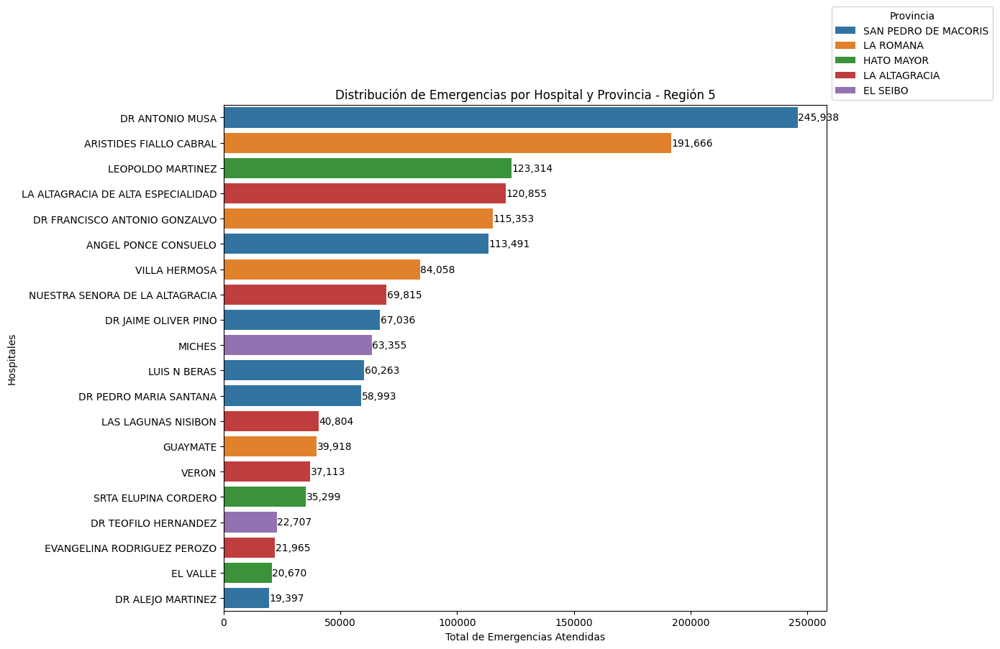

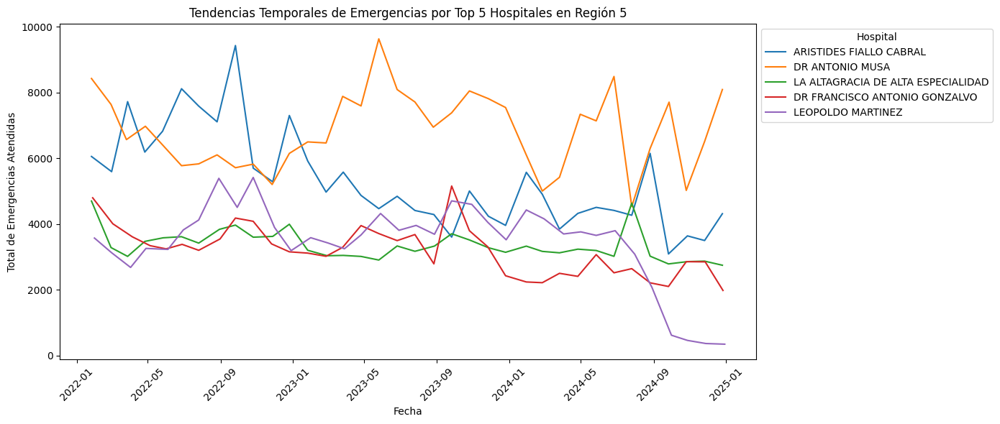

In [ ]:
# Filtrar solo los datos de la Región 5
df_region_5 = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[establecimiento_region]"] == "REGION 5"]

# Seleccionar las columnas relevantes
columns_to_keep = [
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[establecimiento]",  # Establecimiento (Hospital)
    "vw_produccion_67A_eme_BI[Eme_total_egresos]",  # Total ingresos
    "vw_produccion_67A_eme_BI[RegistroFecha]"  # Fecha
]

df_region_5 = df_region_5[columns_to_keep]

# Renombrar columnas para mejor lectura
df_region_5.columns = ["Provincia", "Establecimiento", "Total_Ingresos", "Fecha"]

# Convertir las columnas a los tipos adecuados
df_region_5["Total_Ingresos"] = pd.to_numeric(df_region_5["Total_Ingresos"], errors="coerce")
df_region_5["Fecha"] = pd.to_datetime(df_region_5["Fecha"], errors='coerce')

# Filtrar datos entre 2022 y 2024
df_region_5 = df_region_5[(df_region_5["Fecha"].dt.year >= 2022) & (df_region_5["Fecha"].dt.year <= 2024)]

# Eliminar la columna de fecha antes de agrupar para evitar errores
df_aggregated = df_region_5.drop(columns=["Fecha"]).groupby(["Provincia", "Establecimiento"], as_index=False).sum()

# Ordenar los datos por Total_Ingresos de mayor a menor
df_aggregated = df_aggregated.sort_values(by="Total_Ingresos", ascending=False)

# Gráfico de distribución de emergencias por hospital y provincia
plt.figure(figsize=(14, 8))
sns.barplot(
    data=df_aggregated,
    x="Total_Ingresos",
    y="Establecimiento",
    hue="Provincia",
    dodge=False,
    order=df_aggregated["Establecimiento"]
)
plt.xlabel("Total de Emergencias Atendidas")
plt.ylabel("Hospitales")
plt.title("Distribución de Emergencias por Hospital y Provincia - Región 5")
plt.legend(title="Provincia", bbox_to_anchor=(1, 1))

# Agregar etiquetas a las barras con separador de miles
for index, value in enumerate(df_aggregated["Total_Ingresos"]):
    plt.text(value + 100, index, f"{value:,.0f}", va='center')

plt.tight_layout()
plt.show()

# Análisis de tendencias temporales por hospital (Top 5 hospitales con mayor frecuencia)
top_5_hospitals = df_aggregated.nlargest(5, "Total_Ingresos")["Establecimiento"]
df_tendencias_top5 = df_region_5[df_region_5["Establecimiento"].isin(top_5_hospitals)]
df_tendencias_grouped = df_tendencias_top5.groupby(["Fecha", "Establecimiento"], as_index=False).sum()

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_tendencias_grouped, x="Fecha", y="Total_Ingresos", hue="Establecimiento")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias Atendidas")
plt.title("Tendencias Temporales de Emergencias por Top 5 Hospitales en Región 5")
plt.legend(title="Hospital", bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Análisis del Gráfico: Distribución de Emergencias por Hospital y Provincia en la Región 5
El gráfico muestra la cantidad total de emergencias atendidas en distintos hospitales de la Región 5, agrupados por provincia (San Pedro de Macorís, La Romana, Hato Mayor, La Altagracia y El Seibo). Este análisis permite identificar los hospitales con la mayor y menor carga de emergencias y posibles factores que influyen en la demanda de atención médica.

Hospitales con Mayor Carga de Emergencias
Los hospitales con mayor número de emergencias en la Región 5 incluyen:

Dr. Antonio Musa (245,988 emergencias)

Es el hospital con mayor volumen de emergencias en la región.
Ubicado en San Pedro de Macorís, lo que sugiere que es un hospital de referencia.
Es posible que reciba pacientes de otras provincias cercanas debido a su mayor capacidad instalada.
Aristides Fiallo Cabral (191,666 emergencias)

Ubicado en La Romana, este hospital también tiene un volumen alto de emergencias.
Puede estar atendiendo una gran cantidad de población y posiblemente casos turísticos.
Leopoldo Martínez (123,314 emergencias)

Localizado en Hato Mayor, lo que indica que esta provincia también cuenta con un hospital con alta demanda.
La Altagracia de Alta Especialidad (120,855 emergencias)

Hospital clave en La Altagracia, lo que indica que la provincia tiene una infraestructura relevante en salud.
Dr. Francisco Antonio Gonzalvo (115,353 emergencias)

También en La Romana, lo que sugiere que esta provincia cuenta con múltiples hospitales de gran capacidad.
Conclusión:
Los hospitales con mayor carga de emergencias se encuentran en San Pedro de Macorís, La Romana y Hato Mayor, lo que indica que estas provincias podrían tener una mayor densidad poblacional, mayor accesibilidad o ser centros de referencia para la región.

Hospitales con Menor Cantidad de Emergencias
Los hospitales con menor carga de emergencias incluyen:

Dr. Alejo Martínez (19,397 emergencias)

Es el hospital con menor número de emergencias reportadas en la región.
Puede deberse a su especialización en otros servicios o a limitaciones de infraestructura.
El Valle (20,670 emergencias)

También muestra un volumen bajo en comparación con los hospitales principales.
Evangelina Rodríguez Perozo (21,965 emergencias)

Indica una demanda menor, lo que podría deberse a menor población en la zona o especialización del hospital.
Dr. Teófilo Hernández (22,707 emergencias)

Hospital de menor volumen en comparación con los principales.
Srta. Elupina Cordero (35,299 emergencias)

Aunque tiene un mayor volumen que los anteriores, sigue estando entre los hospitales con menos emergencias en la región.

Diferencias en la Demanda de Emergencias por Provincia
El gráfico sugiere que la distribución de emergencias varía según la provincia:

San Pedro de Macorís:

Alberga el hospital con más emergencias (Dr. Antonio Musa).
Parece ser el centro hospitalario más importante de la región.
La Romana:

Presenta dos hospitales con alta carga (Aristides Fiallo Cabral y Dr. Francisco Antonio Gonzalvo).
Esto sugiere que la provincia tiene una infraestructura hospitalaria fuerte.
Hato Mayor:

Leopoldo Martínez tiene una carga considerable, lo que indica que la provincia tiene un papel importante en la red de atención de la región.
La Altagracia:

La Altagracia de Alta Especialidad maneja una gran cantidad de emergencias, posiblemente por la afluencia de turistas y residentes.
El Seibo:

Miches (63,355 emergencias) es el hospital con mayor demanda en la provincia.


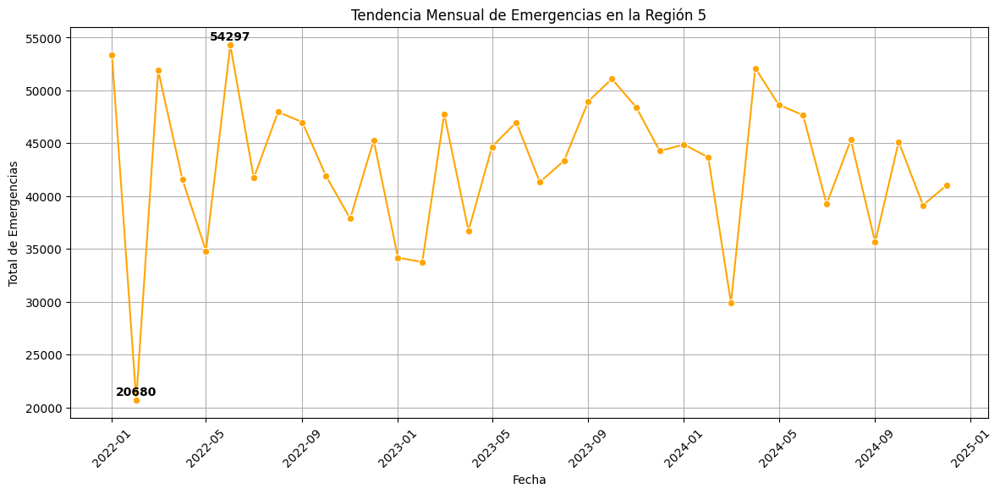

In [ ]:
# Análisis de tendencia mensual
df_monthly = df_region_5.groupby(df_region_5['Fecha'].dt.to_period('M'))["Total_Ingresos"].sum().reset_index()
df_monthly['Fecha'] = df_monthly['Fecha'].astype(str)
df_monthly['Fecha'] = pd.to_datetime(df_monthly['Fecha'])

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_monthly, x='Fecha', y="Total_Ingresos", marker="o", linestyle="-", color="orange")

# Etiquetas de picos y valles
for i, row in df_monthly.iterrows():
    if row["Total_Ingresos"] == df_monthly["Total_Ingresos"].max() or row["Total_Ingresos"] == df_monthly["Total_Ingresos"].min():
        plt.text(row['Fecha'], row["Total_Ingresos"] + 500, str(int(row["Total_Ingresos"])), ha='center', fontsize=10, fontweight='bold', color='black')

# Configuración del gráfico
plt.title("Tendencia Mensual de Emergencias en la Región 5")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Análisis del Gráfico: Tendencia Mensual de Emergencias en la Región 5
El gráfico muestra la evolución mensual del total de emergencias atendidas en la Región 5 desde enero de 2022 hasta finales de 2024. La serie de datos presenta variaciones significativas, con picos y caídas que reflejan cambios en la demanda de emergencias hospitalarias.


Mínimo y Máximo

El mes con menor número de emergencias ocurrió en enero de 2022, con 20,680 emergencias.
El mes con mayor número de emergencias fue en mayo de 2022, con 54,297 emergencias.
Patrón de Variación

La serie presenta altibajos notables, con algunas caídas abruptas seguidas de rápidas recuperaciones.

Se observan varios picos de atención, indicando momentos de alta demanda en los hospitales de la región.

En varios momentos hay descensos pronunciados, posiblemente por:
Cambios estacionales en enfermedades.
Eventos externos que afectaron la afluencia de pacientes (clima, movilidad, pandemia).

Problemas en la infraestructura hospitalaria o huelgas médicas.

Tendencia General

Aunque hay fluctuaciones mensuales, la tendencia muestra un comportamiento relativamente estable entre 35,000 y 50,000 emergencias mensuales en la mayor parte del período.
Se observa un pico atípico en mayo de 2022, seguido de una caída, lo que podría estar relacionado con un evento sanitario excepcional.

Conclusión Final
El análisis de la tendencia mensual de emergencias en la Región 5 muestra variaciones significativas, con algunos meses registrando altos picos y caídas abruptas. El comportamiento general sugiere una demanda estable, pero con eventos atípicos que podrían estar relacionados con factores estacionales o problemas en la infraestructura hospitalaria.

Para mejorar la planificación hospitalaria en la Región 5, sería clave identificar las causas detrás de las fluctuaciones y evaluar la capacidad hospitalaria en los meses de mayor presión asistencial.


## **Región 6**

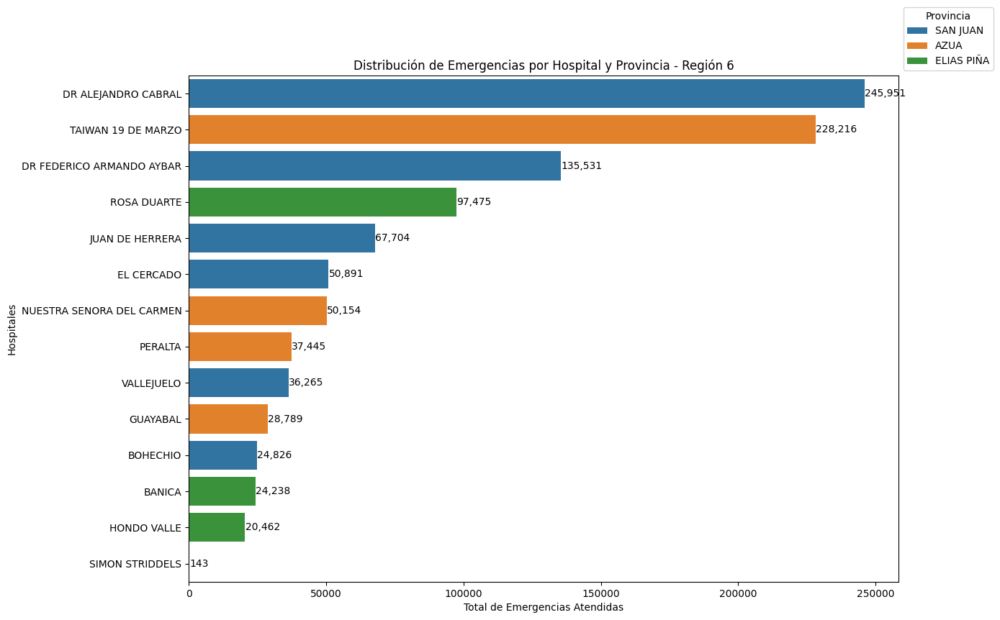

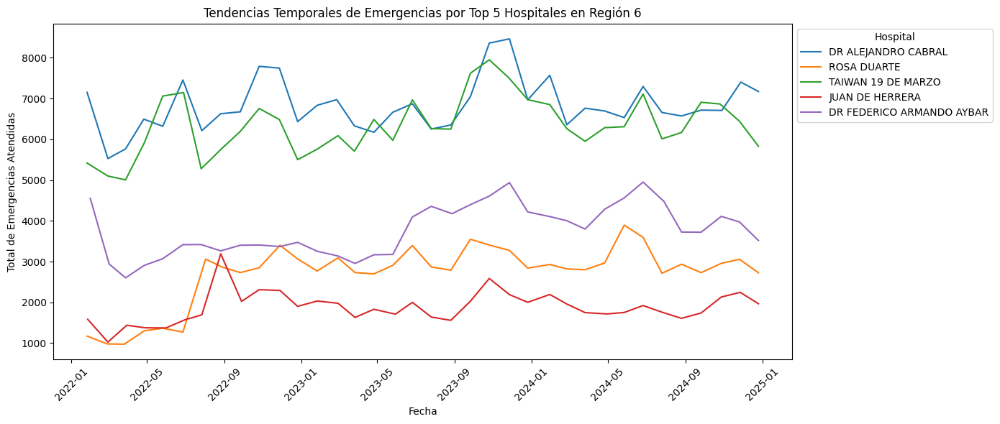

In [ ]:
# Filtrar solo los datos de la Región 6
df_region_6 = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[establecimiento_region]"] == "REGION 6"]

# Seleccionar las columnas relevantes
columns_to_keep = [
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[establecimiento]",  # Establecimiento (Hospital)
    "vw_produccion_67A_eme_BI[Eme_total_egresos]",  # Total ingresos
    "vw_produccion_67A_eme_BI[RegistroFecha]"  # Fecha
]

df_region_6 = df_region_6[columns_to_keep]

# Renombrar columnas para mejor lectura
df_region_6.columns = ["Provincia", "Establecimiento", "Total_Ingresos", "Fecha"]

# Convertir las columnas a los tipos adecuados
df_region_6["Total_Ingresos"] = pd.to_numeric(df_region_6["Total_Ingresos"], errors="coerce")
df_region_6["Fecha"] = pd.to_datetime(df_region_6["Fecha"], errors='coerce')

# Filtrar datos entre 2022 y 2024
df_region_6 = df_region_6[(df_region_6["Fecha"].dt.year >= 2022) & (df_region_6["Fecha"].dt.year <= 2024)]

# Eliminar la columna de fecha antes de agrupar para evitar errores
df_aggregated = df_region_6.drop(columns=["Fecha"]).groupby(["Provincia", "Establecimiento"], as_index=False).sum()

# Ordenar los datos por Total_Ingresos de mayor a menor
df_aggregated = df_aggregated.sort_values(by="Total_Ingresos", ascending=False)

# Gráfico de distribución de emergencias por hospital y provincia
plt.figure(figsize=(14, 8))
sns.barplot(
    data=df_aggregated,
    x="Total_Ingresos",
    y="Establecimiento",
    hue="Provincia",
    dodge=False,
    order=df_aggregated["Establecimiento"]
)
plt.xlabel("Total de Emergencias Atendidas")
plt.ylabel("Hospitales")
plt.title("Distribución de Emergencias por Hospital y Provincia - Región 6")
plt.legend(title="Provincia", bbox_to_anchor=(1, 1))

# Agregar etiquetas a las barras con separador de miles
for index, value in enumerate(df_aggregated["Total_Ingresos"]):
    plt.text(value + 100, index, f"{value:,.0f}", va='center')

plt.tight_layout()
plt.show()

# Análisis de tendencias temporales por hospital (Top 5 hospitales con mayor frecuencia)
top_5_hospitals = df_aggregated.nlargest(5, "Total_Ingresos")["Establecimiento"]
df_tendencias_top5 = df_region_6[df_region_6["Establecimiento"].isin(top_5_hospitals)]
df_tendencias_grouped = df_tendencias_top5.groupby(["Fecha", "Establecimiento"], as_index=False).sum()

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_tendencias_grouped, x="Fecha", y="Total_Ingresos", hue="Establecimiento")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias Atendidas")
plt.title("Tendencias Temporales de Emergencias por Top 5 Hospitales en Región 6")
plt.legend(title="Hospital", bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Análisis del Gráfico: Distribución de Emergencias por Hospital y Provincia en la Región 6
El gráfico muestra la cantidad total de emergencias atendidas en distintos hospitales de la Región 6, agrupados por provincia (San Juan, Azua y Elías Piña). Este análisis permite identificar los hospitales con la mayor y menor carga de emergencias y posibles factores que influyen en la demanda de atención médica.
Hospitales con Mayor Carga de Emergencias
Los hospitales con mayor número de emergencias en la Región 6 incluyen:

Dr. Alejandro Cabral (245,951 emergencias)

Es el hospital con mayor volumen de emergencias en la región.
Ubicado en San Juan, lo que sugiere que es un hospital de referencia.
Es posible que reciba pacientes de otras provincias cercanas debido a su mayor capacidad instalada.
Taiwán 19 de Marzo (228,216 emergencias)

Ubicado en Azua, con un volumen alto de emergencias.
Puede estar atendiendo a una gran cantidad de población y posiblemente casos derivados de áreas rurales.
Dr. Federico Armando Aybar (135,531 emergencias)

Localizado en San Juan, indicando que esta provincia cuenta con más de un hospital de alta demanda.
Rosa Duarte (97,475 emergencias)

Ubicado en Elías Piña, siendo el hospital con mayor carga de emergencias de la provincia.
Juan de Herrera (67,704 emergencias)

También en San Juan, lo que refuerza la idea de que esta provincia tiene un papel importante en la red de atención de la región.
Conclusión:
Los hospitales con mayor carga de emergencias se encuentran en San Juan y Azua, lo que indica que estas provincias podrían tener una mayor densidad poblacional, mejor infraestructura hospitalaria o ser centros de referencia para la región.

Hospitales con Menor Cantidad de Emergencias
Los hospitales con menor carga de emergencias incluyen:

Simón Striddels (143 emergencias)

Es el hospital con menor número de emergencias reportadas en la región.
Puede deberse a su especialización en otros servicios o a limitaciones de infraestructura.
Hondo Valle (20,462 emergencias)

También muestra un volumen bajo en comparación con los hospitales principales.
Bánica (24,238 emergencias)

Indica una demanda menor, lo que podría deberse a menor población en la zona o especialización del hospital.
Bohechío (24,826 emergencias)

Hospital de menor volumen en comparación con los principales.
Guayabal (28,789 emergencias)

Aunque tiene un mayor volumen que los anteriores, sigue estando entre los hospitales con menos emergencias en la región.
Interpretación:
Algunos hospitales podrían estar especializados en atención ambulatoria o en otras áreas médicas diferentes a emergencias.
Limitaciones en personal, equipamiento o capacidad hospitalaria pueden influir en la baja carga de emergencias.
Pacientes pueden estar trasladándose a hospitales más grandes o mejor equipados dentro de la región.
Diferencias en la Demanda de Emergencias por Provincia
El gráfico sugiere que la distribución de emergencias varía según la provincia:

San Juan:

Alberga el hospital con más emergencias (Dr. Alejandro Cabral).
Parece ser el centro hospitalario más importante de la región.
Azua:

Presenta dos hospitales con alta carga (Taiwán 19 de Marzo y Nuestra Señora del Carmen).
Esto sugiere que la provincia tiene una infraestructura hospitalaria fuerte.
Elías Piña:

Rosa Duarte tiene una carga considerable, lo que indica que la provincia tiene un papel importante en la red de atención de la región.

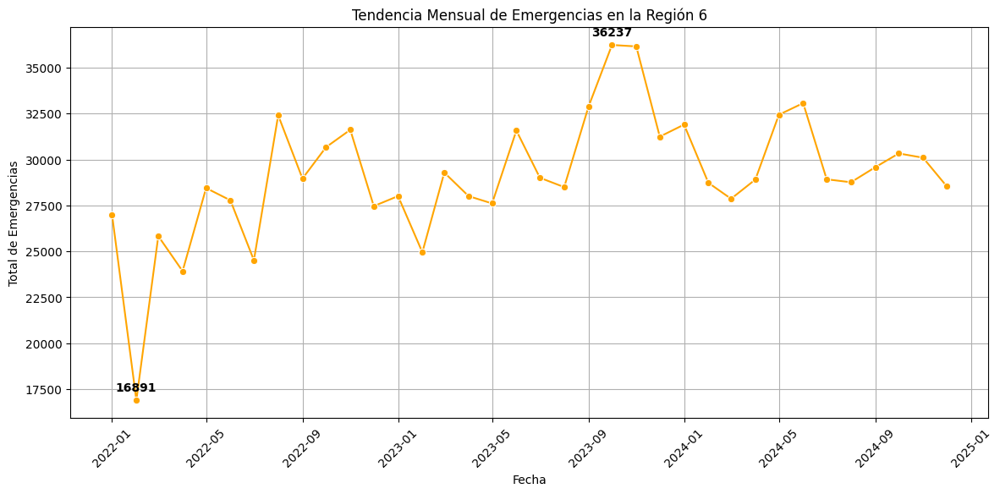

In [ ]:
# Análisis de tendencia mensual
df_monthly = df_region_6.groupby(df_region_6['Fecha'].dt.to_period('M'))["Total_Ingresos"].sum().reset_index()
df_monthly['Fecha'] = df_monthly['Fecha'].astype(str)
df_monthly['Fecha'] = pd.to_datetime(df_monthly['Fecha'])

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_monthly, x='Fecha', y="Total_Ingresos", marker="o", linestyle="-", color="orange")

# Etiquetas de picos y valles
for i, row in df_monthly.iterrows():
    if row["Total_Ingresos"] == df_monthly["Total_Ingresos"].max() or row["Total_Ingresos"] == df_monthly["Total_Ingresos"].min():
        plt.text(row['Fecha'], row["Total_Ingresos"] + 500, str(int(row["Total_Ingresos"])), ha='center', fontsize=10, fontweight='bold', color='black')

# Configuración del gráfico
plt.title("Tendencia Mensual de Emergencias en la Región 6")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Análisis del Gráfico: Tendencia Mensual de Emergencias en la Región 6
El gráfico muestra la evolución mensual del número de emergencias atendidas en la Región 6 desde enero de 2022 hasta diciembre de 2024. La serie de datos presenta fluctuaciones con picos y caídas, reflejando la variabilidad en la demanda de emergencias hospitalarias.

Observaciones Claves
Mínimo y Máximo

El mes con menor número de emergencias ocurrió en enero de 2022, con 16,891 emergencias.
El mes con mayor número de emergencias fue en septiembre de 2023, con 36,237 emergencias.
Patrón de Variación

Se observa una tendencia fluctuante, con periodos de aumentos seguidos de descensos pronunciados.
Se presentan picos de alta demanda en ciertos meses, lo que sugiere que hay factores estacionales o eventos específicos que afectan la cantidad de emergencias atendidas.
Algunas caídas abruptas pueden estar relacionadas con:
Baja movilidad de la población en ciertos periodos (festividades, restricciones sanitarias).
Capacidad hospitalaria limitada en ciertos meses.
Disminución de enfermedades estacionales en algunos momentos del año.
Tendencia General

Aunque hay variaciones, la tendencia general parece mantenerse estable, con valores que oscilan entre 25,000 y 35,000 emergencias mensuales.
El pico de septiembre de 2023 (36,237 emergencias) podría estar relacionado con un evento de salud pública, un brote epidémico o un aumento en la movilidad de la población.
Posibles Factores Explicativos
Factores Estacionales

Los aumentos en la cantidad de emergencias pueden estar influenciados por:
Brote de enfermedades respiratorias o gastrointestinales en determinadas estaciones del año.
Aumento en la movilidad y turismo, incrementando la demanda hospitalaria.
Accidentalidad en períodos festivos o vacaciones.
Eventos Excepcionales

El pico de septiembre de 2023 (36,237 emergencias) podría deberse a:

Un brote epidemiológico en la región.
Eventos climáticos extremos como tormentas o huracanes, que aumentan los accidentes y emergencias médicas.
Mayor disponibilidad de atención hospitalaria, permitiendo que más pacientes fueran admitidos.
La caída en enero de 2022 (16,891 emergencias) puede estar vinculada a:

Menor movilidad de la población tras las festividades.
Restricciones hospitalarias o reducción de personal médico en ciertos meses.
Infraestructura y Movilidad de Pacientes

Puede haber un efecto de movilidad de pacientes entre provincias, donde algunos meses ven una redistribución de emergencias entre hospitales.
La disponibilidad de personal médico y capacidad hospitalaria en cada mes puede influir en la cantidad de emergencias atendidas.


## **Región 7**

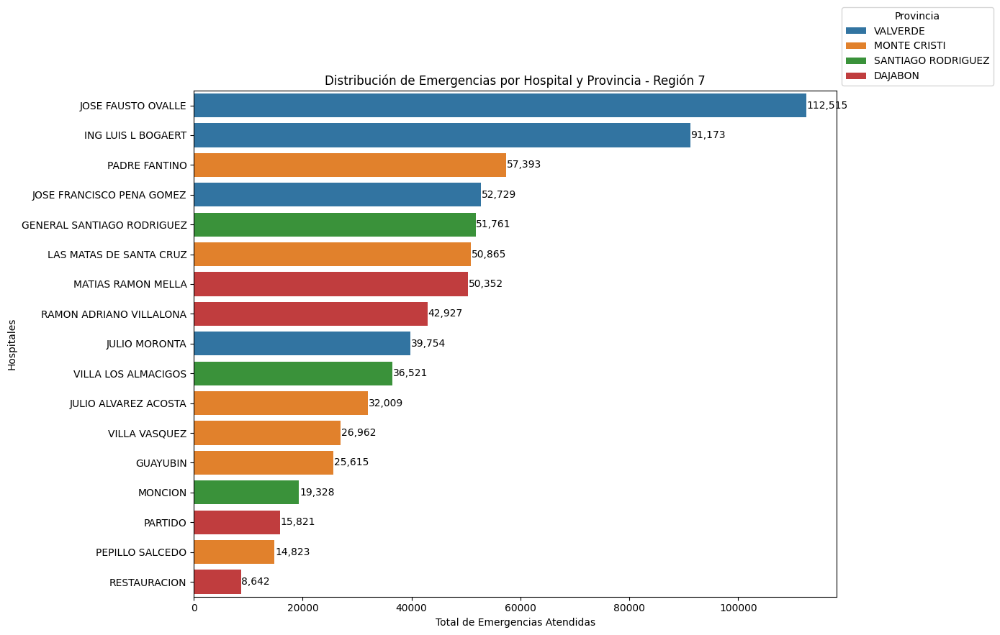

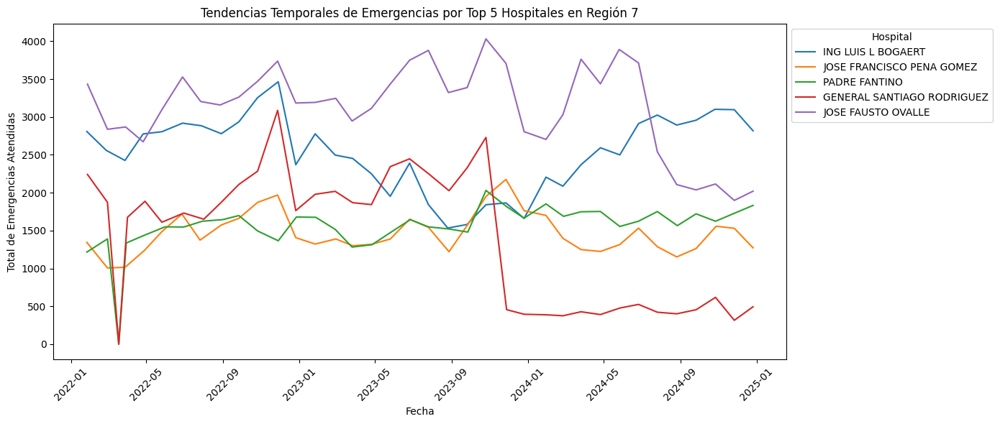

In [ ]:
# Filtrar solo los datos de la Región 7
df_region_7 = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[establecimiento_region]"] == "REGION 7"]

# Seleccionar las columnas relevantes
columns_to_keep = [
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[establecimiento]",  # Establecimiento (Hospital)
    "vw_produccion_67A_eme_BI[Eme_total_egresos]",  # Total ingresos
    "vw_produccion_67A_eme_BI[RegistroFecha]"  # Fecha
]

df_region_7 = df_region_7[columns_to_keep]

# Renombrar columnas para mejor lectura
df_region_7.columns = ["Provincia", "Establecimiento", "Total_Ingresos", "Fecha"]

# Convertir las columnas a los tipos adecuados
df_region_7["Total_Ingresos"] = pd.to_numeric(df_region_7["Total_Ingresos"], errors="coerce")
df_region_7["Fecha"] = pd.to_datetime(df_region_7["Fecha"], errors='coerce')

# Filtrar datos entre 2022 y 2024
df_region_7 = df_region_7[(df_region_7["Fecha"].dt.year >= 2022) & (df_region_7["Fecha"].dt.year <= 2024)]

# Eliminar la columna de fecha antes de agrupar para evitar errores
df_aggregated = df_region_7.drop(columns=["Fecha"]).groupby(["Provincia", "Establecimiento"], as_index=False).sum()

# Ordenar los datos por Total_Ingresos de mayor a menor
df_aggregated = df_aggregated.sort_values(by="Total_Ingresos", ascending=False)

# Gráfico de distribución de emergencias por hospital y provincia
plt.figure(figsize=(14, 8))
sns.barplot(
    data=df_aggregated,
    x="Total_Ingresos",
    y="Establecimiento",
    hue="Provincia",
    dodge=False,
    order=df_aggregated["Establecimiento"]
)
plt.xlabel("Total de Emergencias Atendidas")
plt.ylabel("Hospitales")
plt.title("Distribución de Emergencias por Hospital y Provincia - Región 7")
plt.legend(title="Provincia", bbox_to_anchor=(1, 1))

# Agregar etiquetas a las barras con separador de miles
for index, value in enumerate(df_aggregated["Total_Ingresos"]):
    plt.text(value + 100, index, f"{value:,.0f}", va='center')

plt.tight_layout()
plt.show()

# Análisis de tendencias temporales por hospital (Top 5 hospitales con mayor frecuencia)
top_5_hospitals = df_aggregated.nlargest(5, "Total_Ingresos")["Establecimiento"]
df_tendencias_top5 = df_region_7[df_region_7["Establecimiento"].isin(top_5_hospitals)]
df_tendencias_grouped = df_tendencias_top5.groupby(["Fecha", "Establecimiento"], as_index=False).sum()

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_tendencias_grouped, x="Fecha", y="Total_Ingresos", hue="Establecimiento")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias Atendidas")
plt.title("Tendencias Temporales de Emergencias por Top 5 Hospitales en Región 7")
plt.legend(title="Hospital", bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Análisis del Gráfico: Distribución de Emergencias por Hospital y Provincia en la Región 7
El gráfico muestra la cantidad total de emergencias atendidas en distintos hospitales de la Región 7, agrupados por provincia (Valverde, Monte Cristi, Santiago Rodríguez y Dajabón). Este análisis permite identificar los hospitales con la mayor y menor carga de emergencias y posibles factores que influyen en la demanda de atención médica.
Hospitales con Mayor Carga de Emergencias
Los hospitales con mayor número de emergencias en la Región 7 incluyen:

José Fausto Ovalle (112,515 emergencias)

Es el hospital con mayor volumen de emergencias en la región.
Ubicado en Valverde, lo que sugiere que es un hospital de referencia.
Es posible que reciba pacientes de otras provincias cercanas debido a su mayor capacidad instalada.
Ing. Luis L. Bogaert (91,173 emergencias)

Ubicado en Valverde, con un volumen alto de emergencias.
Indica que la provincia tiene una alta demanda hospitalaria.
Padre Fantino (57,393 emergencias)

Localizado en Monte Cristi, con un número considerable de emergencias.
José Francisco Peña Gómez (52,729 emergencias)

También en Valverde, indicando que esta provincia tiene múltiples hospitales con alta demanda.
General Santiago Rodríguez (51,761 emergencias)

Ubicado en Santiago Rodríguez, lo que indica que esta provincia tiene un papel importante en la red de atención de la región.
Conclusión:
Los hospitales con mayor carga de emergencias se encuentran en Valverde y Monte Cristi, lo que indica que estas provincias podrían tener una mayor densidad poblacional, mejor infraestructura hospitalaria o ser centros de referencia para la región.

Hospitales con Menor Cantidad de Emergencias
Los hospitales con menor carga de emergencias incluyen:

Restauración (8,642 emergencias)

Es el hospital con menor número de emergencias reportadas en la región.
Puede deberse a su especialización en otros servicios o a limitaciones de infraestructura.
Pepillo Salcedo (14,823 emergencias)

También muestra un volumen bajo en comparación con los hospitales principales.
Partido (15,821 emergencias)

Indica una demanda menor, lo que podría deberse a menor población en la zona o especialización del hospital.
Monción (19,328 emergencias)

Hospital de menor volumen en comparación con los principales.
Guayubín (25,615 emergencias)

Aunque tiene un mayor volumen que los anteriores, sigue estando entre los hospitales con menos emergencias en la región.
Interpretación:
Algunos hospitales podrían estar especializados en atención ambulatoria o en otras áreas médicas diferentes a emergencias.
Limitaciones en personal, equipamiento o capacidad hospitalaria pueden influir en la baja carga de emergencias.
Pacientes pueden estar trasladándose a hospitales más grandes o mejor equipados dentro de la región.


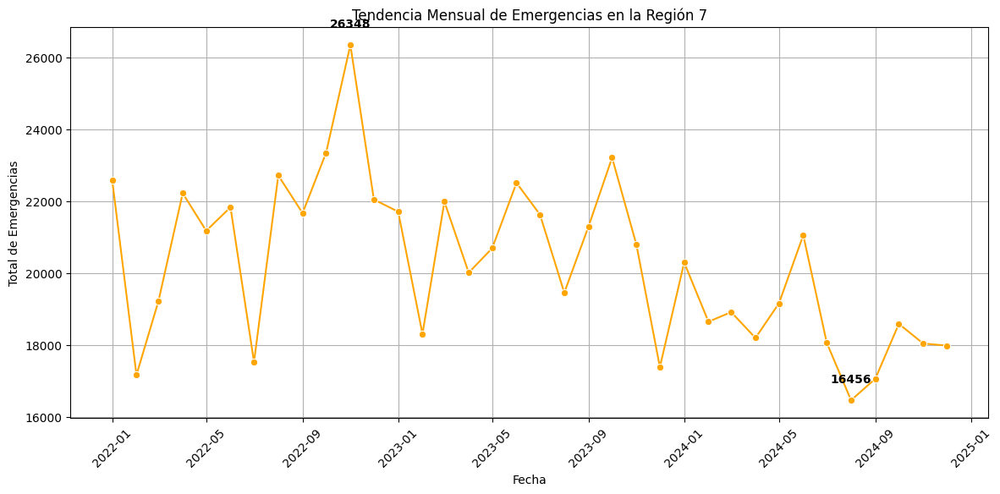

In [ ]:
# Análisis de tendencia mensual
df_monthly = df_region_7.groupby(df_region_7['Fecha'].dt.to_period('M'))["Total_Ingresos"].sum().reset_index()
df_monthly['Fecha'] = df_monthly['Fecha'].astype(str)
df_monthly['Fecha'] = pd.to_datetime(df_monthly['Fecha'])

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_monthly, x='Fecha', y="Total_Ingresos", marker="o", linestyle="-", color="orange")

# Etiquetas de picos y valles
for i, row in df_monthly.iterrows():
    if row["Total_Ingresos"] == df_monthly["Total_Ingresos"].max() or row["Total_Ingresos"] == df_monthly["Total_Ingresos"].min():
        plt.text(row['Fecha'], row["Total_Ingresos"] + 500, str(int(row["Total_Ingresos"])), ha='center', fontsize=10, fontweight='bold', color='black')

# Configuración del gráfico
plt.title("Tendencia Mensual de Emergencias en la Región 7")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Análisis del Gráfico: Tendencia Mensual de Emergencias en la Región 7
El gráfico muestra la evolución mensual del número de emergencias atendidas en la Región 7 desde enero de 2022 hasta diciembre de 2024. Se observan fluctuaciones notables con momentos de alta y baja demanda.

Observaciones Claves
Mínimo y Máximo

El mes con menor número de emergencias ocurrió en septiembre de 2024, con 16,456 emergencias.
El mes con mayor número de emergencias fue en octubre de 2022, con 26,318 emergencias.
Patrón de Variación

Se observa una tendencia fluctuante, con descensos y recuperaciones en distintos períodos.
Picos altos en ciertos meses pueden deberse a factores estacionales o eventos sanitarios.
Las caídas abruptas pueden estar relacionadas con:
Baja movilidad de la población en ciertos períodos.
Cambios en la capacidad hospitalaria.
Reducción de brotes de enfermedades en algunos meses.
Tendencia General

Se nota una leve tendencia a la baja en la cantidad de emergencias atendidas.
La disminución de emergencias desde finales de 2023 hasta 2024 podría estar relacionada con cambios en la infraestructura de atención o en la demanda hospitalaria.
Posibles Factores Explicativos
Factores Estacionales

Los aumentos en emergencias pueden estar relacionados con:
Brotes de enfermedades infecciosas en determinadas estaciones.
Mayor movilidad en épocas festivas, lo que incrementa accidentes y hospitalizaciones.
Eventos climáticos extremos que generan más emergencias.
Eventos Excepcionales

El pico de octubre de 2022 (26,318 emergencias) podría deberse a:

Un brote epidemiológico en la región.
Aumento en la capacidad hospitalaria, permitiendo la atención de más pacientes.
Mayor movilidad de la población en ciertos períodos.
La caída de septiembre de 2024 (16,456 emergencias) puede estar vinculada a:

Restricciones en la atención médica.
Menor incidencia de enfermedades en ese período.
Reducción de la población atendida debido a mejoras en la prevención de emergencias.
Infraestructura y Movilidad de Pacientes

La variabilidad en la serie de datos puede deberse a la capacidad de los hospitales en ciertos meses.
También puede existir movilidad de pacientes entre provincias, afectando la cantidad de emergencias registradas.


## **Región 8**

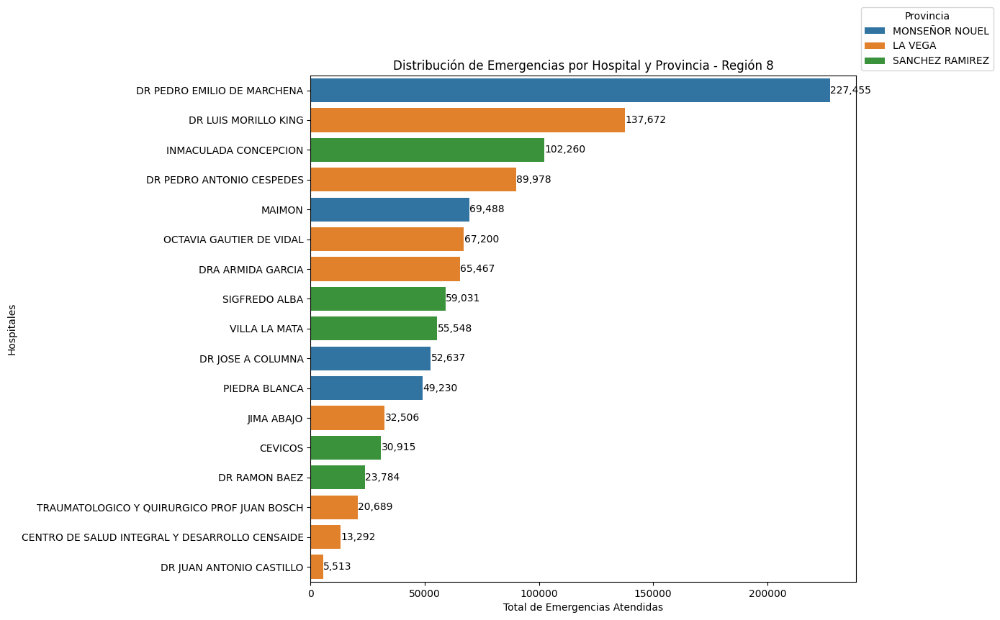

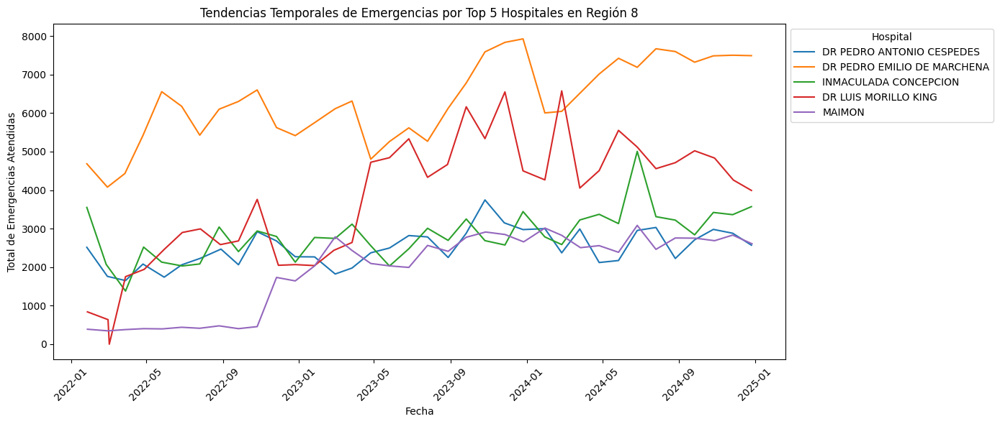

In [ ]:
# Filtrar solo los datos de la Región 8
df_region_8 = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[establecimiento_region]"] == "REGION 8"]

# Seleccionar las columnas relevantes
columns_to_keep = [
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[establecimiento]",  # Establecimiento (Hospital)
    "vw_produccion_67A_eme_BI[Eme_total_egresos]",  # Total ingresos
    "vw_produccion_67A_eme_BI[RegistroFecha]"  # Fecha
]

df_region_8 = df_region_8[columns_to_keep]

# Renombrar columnas para mejor lectura
df_region_8.columns = ["Provincia", "Establecimiento", "Total_Ingresos", "Fecha"]

# Convertir las columnas a los tipos adecuados
df_region_8["Total_Ingresos"] = pd.to_numeric(df_region_8["Total_Ingresos"], errors="coerce")
df_region_8["Fecha"] = pd.to_datetime(df_region_8["Fecha"], errors='coerce')

# Filtrar datos entre 2022 y 2024
df_region_8 = df_region_8[(df_region_8["Fecha"].dt.year >= 2022) & (df_region_8["Fecha"].dt.year <= 2024)]

# Eliminar la columna de fecha antes de agrupar para evitar errores
df_aggregated = df_region_8.drop(columns=["Fecha"]).groupby(["Provincia", "Establecimiento"], as_index=False).sum()

# Ordenar los datos por Total_Ingresos de mayor a menor
df_aggregated = df_aggregated.sort_values(by="Total_Ingresos", ascending=False)

# Gráfico de distribución de emergencias por hospital y provincia
plt.figure(figsize=(14, 8))
sns.barplot(
    data=df_aggregated,
    x="Total_Ingresos",
    y="Establecimiento",
    hue="Provincia",
    dodge=False,
    order=df_aggregated["Establecimiento"]
)
plt.xlabel("Total de Emergencias Atendidas")
plt.ylabel("Hospitales")
plt.title("Distribución de Emergencias por Hospital y Provincia - Región 8")
plt.legend(title="Provincia", bbox_to_anchor=(1, 1))

# Agregar etiquetas a las barras con separador de miles
for index, value in enumerate(df_aggregated["Total_Ingresos"]):
    plt.text(value + 100, index, f"{value:,.0f}", va='center')

plt.tight_layout()
plt.show()

# Análisis de tendencias temporales por hospital (Top 5 hospitales con mayor frecuencia)
top_5_hospitals = df_aggregated.nlargest(5, "Total_Ingresos")["Establecimiento"]
df_tendencias_top5 = df_region_8[df_region_8["Establecimiento"].isin(top_5_hospitals)]
df_tendencias_grouped = df_tendencias_top5.groupby(["Fecha", "Establecimiento"], as_index=False).sum()

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_tendencias_grouped, x="Fecha", y="Total_Ingresos", hue="Establecimiento")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias Atendidas")
plt.title("Tendencias Temporales de Emergencias por Top 5 Hospitales en Región 8")
plt.legend(title="Hospital", bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Análisis del Gráfico: Distribución de Emergencias por Hospital y Provincia en la Región 8
El gráfico presenta la distribución de emergencias atendidas en hospitales de la Región 8, diferenciados por provincia (Monseñor Nouel, La Vega y Sánchez Ramírez). Este análisis permite identificar los hospitales con mayor carga de emergencias y los que reciben menor cantidad de pacientes.

Hospitales con Mayor Carga de Emergencias
Los hospitales con mayor número de emergencias en la Región 8 incluyen:

Dr. Pedro Emilio de Marchena (227,455 emergencias)

Es el hospital con mayor volumen de emergencias en la región.
Ubicado en Monseñor Nouel, lo que indica que es un centro de referencia en la provincia.
Probablemente recibe pacientes de zonas rurales cercanas o de provincias con menor infraestructura hospitalaria.
Dr. Luis Morillo King (137,672 emergencias)

Hospital en La Vega, lo que sugiere una alta demanda de servicios hospitalarios en la provincia.
Inmaculada Concepción (102,260 emergencias)

Ubicado en Sánchez Ramírez, liderando la atención de emergencias en esa provincia.
Dr. Pedro Antonio Céspedes (89,978 emergencias)

También en La Vega, lo que indica que esta provincia tiene dos hospitales con alta carga de emergencias.
Maimón (69,488 emergencias)

Se destaca en Monseñor Nouel, aunque con menor volumen que los principales hospitales.
Conclusión:
Los hospitales con mayor carga de emergencias están distribuidos principalmente entre Monseñor Nouel y La Vega, lo que indica que estas provincias pueden tener una mayor densidad poblacional, mejor infraestructura hospitalaria o servir como centros de referencia para la región.



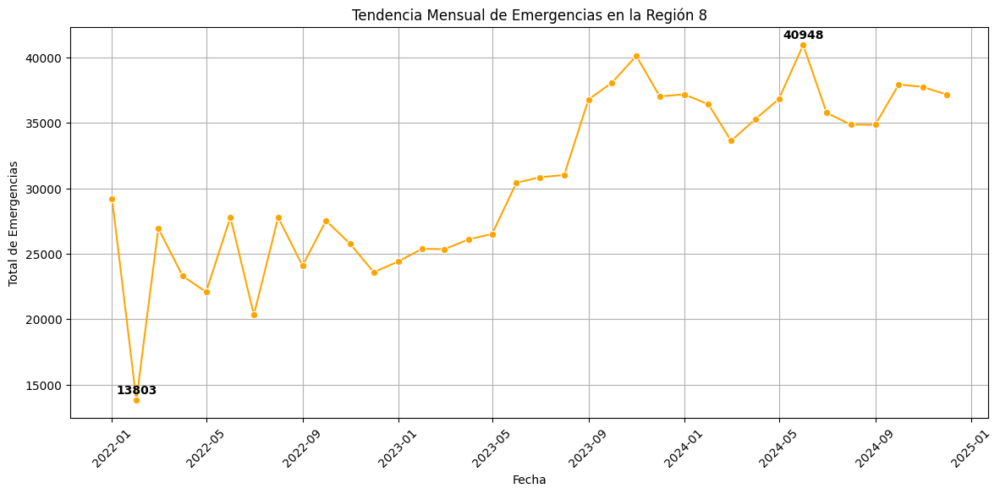

In [ ]:
# Análisis de tendencia mensual
df_monthly = df_region_8.groupby(df_region_8['Fecha'].dt.to_period('M'))["Total_Ingresos"].sum().reset_index()
df_monthly['Fecha'] = df_monthly['Fecha'].astype(str)
df_monthly['Fecha'] = pd.to_datetime(df_monthly['Fecha'])

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_monthly, x='Fecha', y="Total_Ingresos", marker="o", linestyle="-", color="orange")

# Etiquetas de picos y valles
for i, row in df_monthly.iterrows():
    if row["Total_Ingresos"] == df_monthly["Total_Ingresos"].max() or row["Total_Ingresos"] == df_monthly["Total_Ingresos"].min():
        plt.text(row['Fecha'], row["Total_Ingresos"] + 500, str(int(row["Total_Ingresos"])), ha='center', fontsize=10, fontweight='bold', color='black')

# Configuración del gráfico
plt.title("Tendencia Mensual de Emergencias en la Región 8")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Análisis del Gráfico: Tendencia Mensual de Emergencias en la Región 8

El gráfico muestra la evolución mensual del número de emergencias atendidas en la Región 8 desde enero de 2022 hasta diciembre de 2024. Se pueden observar fluctuaciones en la cantidad de emergencias, con períodos de alta y baja demanda.

Observaciones Claves
Mínimo y Máximo

El mes con menor número de emergencias ocurrió en febrero de 2022, con 13,803 emergencias.
El mes con mayor número de emergencias fue en junio de 2024, con 40,948 emergencias.
Tendencia General

Durante 2022 y principios de 2023, se observa una tendencia oscilante con picos y caídas, indicando posibles factores estacionales o eventos puntuales que afectaron la demanda de emergencias.
A partir de mediados de 2023, hay un incremento sostenido en la cantidad de emergencias, alcanzando el máximo en junio de 2024.
En los últimos meses de 2024, la cantidad de emergencias tiende a estabilizarse en torno a 35,000 a 38,000 emergencias mensuales.
Picos y Caídas Significativas

El gran aumento a partir de junio de 2023 puede estar relacionado con:
Mayor capacidad hospitalaria o cambios en políticas de atención.
Brotes epidemiológicos o aumento de casos estacionales.
Mayor movilidad de pacientes hacia hospitales de la Región 8.
La caída de febrero de 2022 (13,803 emergencias) podría deberse a:
Menor movilidad post-festividades.
Reducción de personal médico en ciertas temporadas.
Cambios en la política de admisión de pacientes.


# **Análisis considerando datos poblacionales**

## **Análisis Correlación Total Ingresos en Emergencias y Cantidad Población**

Correlación por provincia: 0.9635705084626598
Correlación por región de salud: 0.9767089814731794


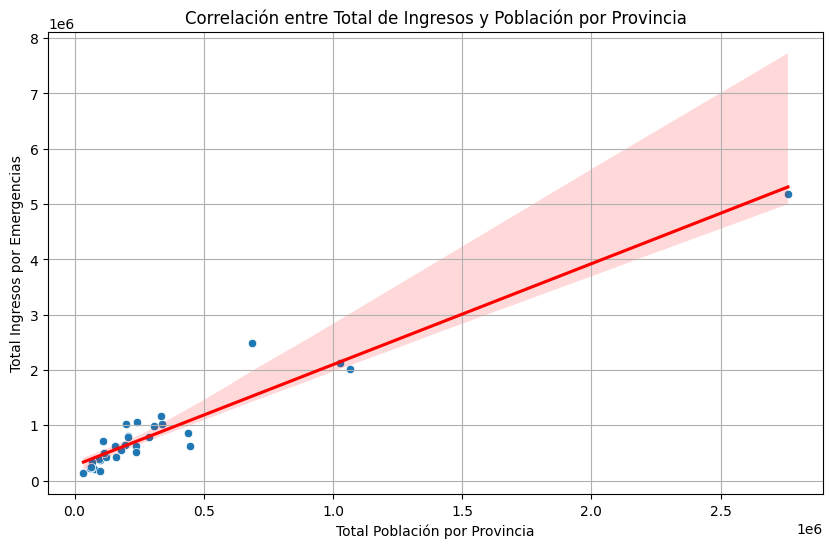

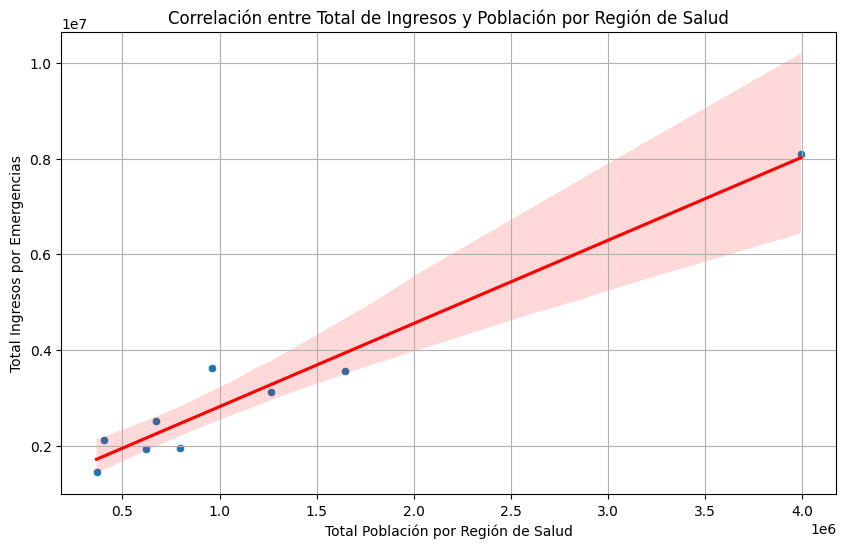

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Cargar los archivos
file_emergencias = "Total Emergencias 2018-2024.xlsx"
file_poblacion = "Población por provincia. Censo ONE.xlsx"

# Leer los archivos
df_emergencias = pd.read_excel(file_emergencias, sheet_name="Total Eme. 2018-2024")
df_poblacion = pd.read_excel(file_poblacion, sheet_name="Poblacion por Region y Provinci")

# Limpiar y estructurar el dataframe de emergencias
df_emergencias_clean = df_emergencias.iloc[2:].copy()  # Eliminar filas innecesarias
df_emergencias_clean.columns = df_emergencias.iloc[1]  # Asignar nombres de columnas correctos
df_emergencias_clean = df_emergencias_clean[1:]  # Eliminar fila con nombres duplicados

# Seleccionar solo las columnas relevantes
df_emergencias_clean = df_emergencias_clean[[
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[establecimiento_region]",  # Región de salud
    "vw_produccion_67A_eme_BI[Eme_total_ingresos]"  # Total ingresos
]]

# Renombrar columnas
df_emergencias_clean.columns = ["Provincia", "Region_Salud", "Total_Ingresos"]

# Convertir la columna de total de ingresos a numérico
df_emergencias_clean.loc[:, "Total_Ingresos"] = pd.to_numeric(df_emergencias_clean["Total_Ingresos"], errors="coerce")

# Agrupar por provincia y región de salud
df_eme_provincia = df_emergencias_clean.groupby("Provincia", as_index=False).sum()
df_eme_region = df_emergencias_clean.groupby("Region_Salud", as_index=False).sum()

# Limpiar y estructurar el dataframe de población
df_poblacion.columns = df_poblacion.columns.str.strip()  # Eliminar espacios adicionales
df_poblacion_clean = df_poblacion[[
    "Provincia", "Región_Salud", "Total_poblacion"
]].copy()

# Renombrar columnas
df_poblacion_clean.columns = ["Provincia", "Region_Salud", "Total_Poblacion"]

# Convertir la columna de población a numérico
df_poblacion_clean.loc[:, "Total_Poblacion"] = pd.to_numeric(df_poblacion_clean["Total_Poblacion"], errors="coerce")

# Unir los datos por provincia y por región de salud
df_corr_provincia = pd.merge(df_eme_provincia, df_poblacion_clean, on="Provincia", how="inner")
df_corr_region = pd.merge(df_eme_region, df_poblacion_clean.groupby("Region_Salud", as_index=False).sum(numeric_only=True), on="Region_Salud", how="inner")

# Asegurar que las columnas sean numéricas
df_corr_provincia["Total_Poblacion"] = pd.to_numeric(df_corr_provincia["Total_Poblacion"], errors="coerce")
df_corr_provincia["Total_Ingresos"] = pd.to_numeric(df_corr_provincia["Total_Ingresos"], errors="coerce")
df_corr_region["Total_Poblacion"] = pd.to_numeric(df_corr_region["Total_Poblacion"], errors="coerce")
df_corr_region["Total_Ingresos"] = pd.to_numeric(df_corr_region["Total_Ingresos"], errors="coerce")

# Eliminar filas con valores NaN
df_corr_provincia = df_corr_provincia.dropna()
df_corr_region = df_corr_region.dropna()

# Calcular correlaciones
corr_provincia = df_corr_provincia["Total_Ingresos"].corr(df_corr_provincia["Total_Poblacion"])
corr_region = df_corr_region["Total_Ingresos"].corr(df_corr_region["Total_Poblacion"])

# Mostrar resultados
print("Correlación por provincia:", corr_provincia)
print("Correlación por región de salud:", corr_region)

# Gráfico de correlación para provincia
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_corr_provincia, x="Total_Poblacion", y="Total_Ingresos")
sns.regplot(data=df_corr_provincia, x="Total_Poblacion", y="Total_Ingresos", scatter=False, color="red")
plt.xlabel("Total Población por Provincia")
plt.ylabel("Total Ingresos por Emergencias")
plt.title("Correlación entre Total de Ingresos y Población por Provincia")
plt.grid(True)
plt.show()

# Gráfico de correlación para región de salud
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_corr_region, x="Total_Poblacion", y="Total_Ingresos")
sns.regplot(data=df_corr_region, x="Total_Poblacion", y="Total_Ingresos", scatter=False, color="red")
plt.xlabel("Total Población por Región de Salud")
plt.ylabel("Total Ingresos por Emergencias")
plt.title("Correlación entre Total de Ingresos y Población por Región de Salud")
plt.grid(True)
plt.show()


Resumen

Análisis de correlación entre emergencias y población
Correlación por provincia: 0.96 (alta correlación positiva)
Correlación por región de salud: 0.98 (aún más fuerte)

📊 Interpretación:

Existe una relación lineal fuerte entre la cantidad de emergencias y la población.
Las provincias y regiones con más población tienden a tener más emergencias, lo que indica que la variable "población" puede ser un excelente predictor en nuestro modelo.
La correlación a nivel de región es aún mayor, lo que sugiere que la segmentación por región de salud puede mejorar la predicción.

Estos valores representan un nivel de correlación muy alto, lo que indica que la cantidad de ingresos por emergencias está estrechamente relacionada con la población en ambas escalas (provincia y región de salud).

Interpretación de los Resultados
Alta correlación positiva (cercana a 1)

Un coeficiente de 0.96 a nivel provincial y 0.97 a nivel regional indica que a mayor cantidad de población en una provincia o región, mayor es la cantidad de ingresos por emergencias.

La relación es lineal fuerte, lo que sugiere que la población es un factor determinante en la demanda hospitalaria de emergencias.

Diferencia entre Provincia y Región de Salud

La correlación a nivel regional (0.9767) es ligeramente mayor que a nivel provincial (0.9636).

Esto podría indicar que la agregación de datos a nivel regional reduce variaciones locales, haciendo que la relación sea más estable y precisa en comparación con el análisis a nivel provincial.

Posibles Explicaciones para la Relación Fuerte

Mayor población = Mayor demanda de emergencias: Esto es lógico ya que un mayor número de personas conlleva un mayor número de accidentes, enfermedades y urgencias médicas.

Estructura hospitalaria proporcional a la población: Es posible que la infraestructura hospitalaria esté distribuida en función del tamaño poblacional, haciendo que las emergencias sigan patrones demográficos.

Movilidad de pacientes dentro de regiones: Aunque algunas provincias pueden tener hospitales más grandes y recibir pacientes de otras provincias, a nivel regional este efecto se neutraliza, fortaleciendo la correlación.


**Posibles Limitaciones y Análisis Adicionales**

Factores adicionales que pueden influir en la cantidad de emergencias atendidas:

Capacidad hospitalaria: No todas las provincias tienen la misma cantidad de hospitales y médicos por habitante.
Accesibilidad y calidad de los servicios de salud: Provincias con más infraestructura médica pueden recibir pacientes de otras provincias con menos recursos.
Patrones de salud pública: Regiones con mayor incidencia de enfermedades pueden tener más ingresos por emergencias.
Próximos pasos en el análisis:

Análisis de variación: Comparar provincias con mayor y menor correlación para identificar diferencias clave.
Modelos predictivos: Utilizar regresiones o redes neuronales para predecir la demanda de emergencias en función de la población y otros factores.
Exploración de otros determinantes: Evaluar la relación con variables como edad de la población, urbanización y accesibilidad a hospitales.

**Conclusión**
La relación entre población y cantidad de ingresos por emergencias es fuerte y positiva, lo que sugiere que la demanda de emergencias está principalmente impulsada por el tamaño poblacional.
La correlación es más alta a nivel regional que provincial, lo que indica que la agregación de datos a nivel de región de salud mejora la precisión del modelo.
Se recomienda un análisis más profundo considerando otros factores que pueden afectar la cantidad de emergencias atendidas.

In [ ]:
import pandas as pd

def cargar_datos():
    file_emergencias = "Total Emergencias 2018-2024.xlsx"
    df_emergencias = pd.read_excel(file_emergencias, sheet_name="Total Eme. 2018-2024")
    df_emergencias.columns = df_emergencias.iloc[1]  # Asignar la fila correcta como nombres de columnas
    df_emergencias = df_emergencias.iloc[2:].reset_index(drop=True)  # Eliminar filas innecesarias
    return df_emergencias

def procesar_datos(df_emergencias):
    # Extraer el año desde la columna de fecha
    df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"] = pd.to_datetime(
        df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"], errors='coerce'
    )

    # Filtrar datos desde 2022 a 2024
    df_clean = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"].dt.year.between(2022, 2024)]

    # Seleccionar columnas relevantes
    df_clean = df_clean[[
        "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
        "vw_produccion_67A_eme_BI[establecimiento_region]",  # Región de salud
        "vw_produccion_67A_eme_BI[establecimiento]",  # Nombre del hospital
        "vw_produccion_67A_eme_BI[Eme_total_ingresos]"  # Total ingresos
    ]]

    df_clean.columns = ["Provincia", "Region_Salud", "Hospital", "Total_Ingresos"]
    df_clean["Total_Ingresos"] = pd.to_numeric(df_clean["Total_Ingresos"], errors="coerce")
    df_clean = df_clean.dropna()

    return df_clean

def obtener_top_hospitales(df_clean):
    df_clean = df_clean.groupby(["Region_Salud", "Hospital"], as_index=False).agg({"Total_Ingresos": "sum"})
    df_top_hospitals = df_clean.sort_values(by=["Region_Salud", "Total_Ingresos"], ascending=[True, False])
    df_top_hospitals = df_top_hospitals.drop_duplicates(subset=["Region_Salud"], keep="first")
    return df_top_hospitals

# Ejecutar análisis
df_emergencias = cargar_datos()
df_emergencias_clean = procesar_datos(df_emergencias)
df_top_hospitals = obtener_top_hospitales(df_emergencias_clean)

# Mostrar resultados
print("Hospital con mayor demanda por región (2022-2024):")
print(df_top_hospitals)


Hospital con mayor demanda por región (2022-2024):
    Region_Salud                       Hospital  Total_Ingresos
8       REGION 0  DR FRANCISCO E MOSCOSO PUELLO          380321
45      REGION 1                JUAN PABLO PINA          386771
81      REGION 2                RICARDO LIMARDO          238125
107     REGION 3            SAN VICENTE DE PAUL          182618
115     REGION 4                     JAIME MOTA          210215
128     REGION 5                DR ANTONIO MUSA          245938
147     REGION 6            DR ALEJANDRO CABRAL          245951
162     REGION 7             JOSE FAUSTO OVALLE          112515
182     REGION 8    DR PEDRO EMILIO DE MARCHENA          227455


<ipython-input-20-f299191afc72>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean["Total_Ingresos"] = pd.to_numeric(df_clean["Total_Ingresos"], errors="coerce")


Hospital Dr. Francisco E. Moscoso Puello: Ubicado en Santo Domingo, es un hospital público que ofrece una amplia gama de servicios médicos a la comunidad.

Hospital Juan Pablo Pina: Situado en San Cristóbal, este centro de salud pública brinda atención médica general a la población de la región.

Hospital Ricardo Limardo: Localizado en Puerto Plata, es un hospital público que proporciona servicios médicos generales a los residentes de la zona.

Hospital San Vicente de Paúl: Este hospital regional universitario se encuentra en San Francisco de Macorís y ofrece atención médica especializada y general.

Hospital Jaime Mota: Ubicado en Barahona, es un centro de salud pública que atiende diversas especialidades médicas para la comunidad.

Hospital Dr. Antonio Musa: Situado en San Pedro de Macorís, este hospital regional ofrece servicios médicos generales a la población.

Hospital Dr. Alejandro Cabral: Localizado en San Juan de la Maguana, es un centro de salud pública que brinda atención médica en diversas áreas.

Hospital José Fausto Ovalle: Este hospital se encuentra en La Vega y ofrece servicios médicos generales a los habitantes de la región.

Hospital Dr. Pedro Emilio de Marchena: Ubicado en Bonao, es un centro de salud que proporciona atención médica general a la comunidad.

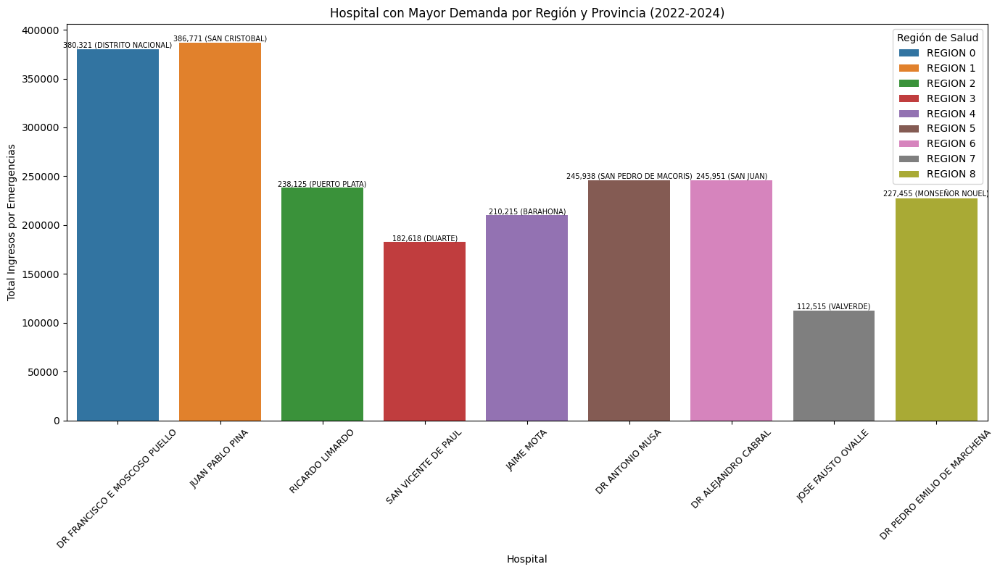

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Cargar los datos
def cargar_datos():
    file_emergencias = "Total Emergencias 2018-2024.xlsx"
    df_emergencias = pd.read_excel(file_emergencias, sheet_name="Total Eme. 2018-2024")
    df_emergencias.columns = df_emergencias.iloc[1]  # Asignar la fila correcta como nombres de columnas
    df_emergencias = df_emergencias.iloc[2:].reset_index(drop=True)  # Eliminar filas innecesarias
    return df_emergencias

# Procesar datos
def procesar_datos(df_emergencias):
    # Extraer el año desde la columna de fecha
    df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"] = pd.to_datetime(
        df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"], errors='coerce'
    )

    # Filtrar datos desde 2022 a 2024
    df_clean = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"].dt.year.between(2022, 2024)]

    # Seleccionar columnas relevantes
    df_clean = df_clean[[
        "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
        "vw_produccion_67A_eme_BI[establecimiento_region]",  # Región de salud
        "vw_produccion_67A_eme_BI[establecimiento]",  # Nombre del hospital
        "vw_produccion_67A_eme_BI[Eme_total_ingresos]"  # Total ingresos
    ]]

    df_clean.columns = ["Provincia", "Region_Salud", "Hospital", "Total_Ingresos"]
    df_clean["Total_Ingresos"] = pd.to_numeric(df_clean["Total_Ingresos"], errors="coerce")
    df_clean = df_clean.dropna()

    return df_clean

# Obtener el hospital con mayor demanda por región y provincia
def obtener_top_hospitales_con_provincia(df_clean):
    df_clean = df_clean.groupby(["Region_Salud", "Provincia", "Hospital"], as_index=False).agg({"Total_Ingresos": "sum"})
    df_top_hospitals = df_clean.sort_values(by=["Region_Salud", "Total_Ingresos"], ascending=[True, False])
    df_top_hospitals = df_top_hospitals.drop_duplicates(subset=["Region_Salud"], keep="first")
    return df_top_hospitals

# Ejecutar análisis
df_emergencias = cargar_datos()
df_emergencias_clean = procesar_datos(df_emergencias)
df_top_hospitals_provincia = obtener_top_hospitales_con_provincia(df_emergencias_clean)

# Crear gráfico de barras del hospital con mayor demanda en cada región y provincia
plt.figure(figsize=(14, 8))
ax = sns.barplot(data=df_top_hospitals_provincia, x="Hospital", y="Total_Ingresos", hue="Region_Salud", dodge=False)
plt.xticks(rotation=45, fontsize=9)  # Ajustar la rotación y tamaño del eje X
plt.xlabel("Hospital")
plt.ylabel("Total Ingresos por Emergencias")
plt.title("Hospital con Mayor Demanda por Región y Provincia (2022-2024)")
plt.legend(title="Región de Salud", bbox_to_anchor=(1, 1))

# Agregar etiquetas de datos en las barras con la provincia (TAMAÑO MÁS PEQUEÑO)
for p, prov in zip(ax.patches, df_top_hospitals_provincia["Provincia"]):
    if not pd.isna(p.get_height()):  # Verificar si el valor no es NaN antes de agregar la etiqueta
        ax.annotate(f'{int(p.get_height()):,} ({prov})',
                    (p.get_x() + p.get_width() / 2, p.get_height()),
                    ha='center', va='bottom', fontsize=7, color='black')  # Reducido a fontsize=7

plt.tight_layout()  # Ajustar para evitar cortes
plt.show()


## **Tasa de emergencias por habitante**

In [ ]:
# Importar librerías necesarias
import pandas as pd

# Cargar los archivos de emergencias y población
file_emergencias = "Total Emergencias 2018-2024.xlsx"
file_poblacion = "Población por provincia. Censo ONE.xlsx"

# Leer los archivos
df_emergencias = pd.read_excel(file_emergencias, sheet_name="Total Eme. 2018-2024")
df_poblacion = pd.read_excel(file_poblacion, sheet_name="Poblacion por Region y Provinci")

# Limpiar y estructurar el dataframe de emergencias
df_emergencias_clean = df_emergencias.iloc[2:].copy()
df_emergencias_clean.columns = df_emergencias.iloc[1]
df_emergencias_clean = df_emergencias_clean[1:]

# Crear columna de fecha para filtrar
df_emergencias_clean["RegistroFecha"] = pd.to_datetime(df_emergencias_clean["vw_produccion_67A_eme_BI[RegistroFecha]"], errors='coerce')

# Filtrar solo años 2022 a 2024
df_emergencias_filtered = df_emergencias_clean[
    (df_emergencias_clean["RegistroFecha"].dt.year >= 2022) &
    (df_emergencias_clean["RegistroFecha"].dt.year <= 2024)
]

# Seleccionar columnas necesarias
df_emergencias_filtered = df_emergencias_filtered[[
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",
    "vw_produccion_67A_eme_BI[establecimiento_region]",
    "vw_produccion_67A_eme_BI[Eme_total_ingresos]"
]]

# Renombrar columnas
df_emergencias_filtered.columns = ["Provincia", "Region_Salud", "Total_Emergencias"]

# Convertir a numérico
df_emergencias_filtered["Total_Emergencias"] = pd.to_numeric(df_emergencias_filtered["Total_Emergencias"], errors="coerce")

# Agrupar por provincia
df_eme_provincia = df_emergencias_filtered.groupby("Provincia", as_index=False).sum()

# Limpiar y estructurar el dataframe de población
df_poblacion.columns = df_poblacion.columns.str.strip()
df_poblacion_clean = df_poblacion[["Provincia", "Región_Salud", "Total_poblacion"]].copy()
df_poblacion_clean.columns = ["Provincia", "Region_Salud", "Total_Poblacion"]
df_poblacion_clean["Total_Poblacion"] = pd.to_numeric(df_poblacion_clean["Total_Poblacion"], errors="coerce")

# Unir emergencias con población
df_final = pd.merge(df_eme_provincia, df_poblacion_clean, on="Provincia", how="inner")

# Calcular la tasa por cada 1,000 habitantes
df_final["Emergencias_por_1000_hab"] = (df_final["Total_Emergencias"] / df_final["Total_Poblacion"]) * 1000

# Mostrar resultados
print(df_final[["Provincia", "Total_Emergencias", "Total_Poblacion", "Emergencias_por_1000_hab"]])


                 Provincia  Total_Emergencias  Total_Poblacion  \
0                     AZUA             344743           239388   
1                 BAHORUCO             367037           108410   
2                 BARAHONA             519043           200135   
3                  DAJABON             117742            74257   
4        DISTRITO NACIONAL             992664          1027345   
5                   DUARTE             551455           308072   
6                 EL SEIBO              86062            98166   
7               ELIAS PIÑA             142175            64423   
8                ESPAILLAT             285375           239661   
9               HATO MAYOR             179283            99967   
10        HERMANAS MIRABAL             189567            96210   
11           INDEPENDENCIA             119354            60623   
12           LA ALTAGRACIA             290552           445162   
13               LA ROMANA             430995           286632   
14        

Tasa de emergencias por 1,000 habitantes:
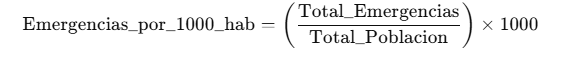

# **Tasa de demanda por población por año por 1000 habitantes**

In [ ]:
import pandas as pd

# Cargar archivos
file_emergencias = "Total Emergencias 2018-2024.xlsx"
file_poblacion = "Población por provincia. Censo ONE.xlsx"

# Leer datos
df_emergencias = pd.read_excel(file_emergencias, sheet_name="Total Eme. 2018-2024")
df_poblacion = pd.read_excel(file_poblacion, sheet_name="Poblacion por Region y Provinci")

# Limpiar datos de emergencias
df_emergencias_clean = df_emergencias.iloc[2:].copy()
df_emergencias_clean.columns = df_emergencias.iloc[1]
df_emergencias_clean = df_emergencias_clean[1:]

# Crear columna de fecha y extraer año
df_emergencias_clean["RegistroFecha"] = pd.to_datetime(df_emergencias_clean["vw_produccion_67A_eme_BI[RegistroFecha]"], errors='coerce')
df_emergencias_clean["Año"] = df_emergencias_clean["RegistroFecha"].dt.year

# Filtrar 2022 a 2024
df_emergencias_filtered = df_emergencias_clean[
    df_emergencias_clean["Año"].isin([2022, 2023, 2024])
][[
    "Año", "vw_produccion_67A_eme_BI[establecimiento_provincia]", "vw_produccion_67A_eme_BI[Eme_total_ingresos]"
]]
df_emergencias_filtered.columns = ["Año", "Provincia", "Total_Emergencias"]
df_emergencias_filtered["Total_Emergencias"] = pd.to_numeric(df_emergencias_filtered["Total_Emergencias"], errors="coerce")

# Agrupar por provincia y año
df_eme_anual = df_emergencias_filtered.groupby(["Provincia", "Año"], as_index=False).sum()

# Limpiar población
df_poblacion.columns = df_poblacion.columns.str.strip()
df_poblacion_clean = df_poblacion[["Provincia", "Región_Salud", "Total_poblacion"]].copy()
df_poblacion_clean.columns = ["Provincia", "Region_Salud", "Total_Poblacion"]
df_poblacion_clean["Total_Poblacion"] = pd.to_numeric(df_poblacion_clean["Total_Poblacion"], errors="coerce")

# Merge con población
df_eme_anual = df_eme_anual.merge(df_poblacion_clean[["Provincia", "Total_Poblacion"]], on="Provincia", how="left")

# Calcular tasa
df_eme_anual["Tasa_por_1000"] = (df_eme_anual["Total_Emergencias"] / df_eme_anual["Total_Poblacion"]) * 1000

# Pivotear años como columnas
df_tasa_pivot = df_eme_anual.pivot(index="Provincia", columns="Año", values="Tasa_por_1000").reset_index()
df_tasa_pivot.columns.name = None
df_tasa_pivot.columns = ["Provincia", "Tasa_2022", "Tasa_2023", "Tasa_2024"]

# Reemplazar NaN con 0 (si lo deseas)
df_tasa_pivot = df_tasa_pivot.fillna(0)

# Mostrar
print(df_tasa_pivot)


                 Provincia   Tasa_2022    Tasa_2023    Tasa_2024
0                     AZUA  453.310107   494.724046   492.067272
1                 BAHORUCO  943.353934  1216.585186  1225.698736
2                 BARAHONA  788.023084   894.920928   910.520399
3                  DAJABON  628.169735   594.516342   362.915281
4        DISTRITO NACIONAL  339.290112   336.524731   290.427266
5                   DUARTE  544.950531   610.961074   634.108260
6                 EL SEIBO  304.402746   285.832162   286.463745
7               ELIAS PIÑA  612.607299   828.818900   765.471959
8                ESPAILLAT  364.802784   376.289843   449.651800
9               HATO MAYOR  697.650225   644.422659   451.348945
10        HERMANAS MIRABAL  646.304958   657.644735   666.396424
11           INDEPENDENCIA  581.314023   715.207100   672.269601
12           LA ALTAGRACIA  211.752126   200.217000   240.719109
13               LA ROMANA  489.516174   491.114042   523.022552
14                 LA VEG

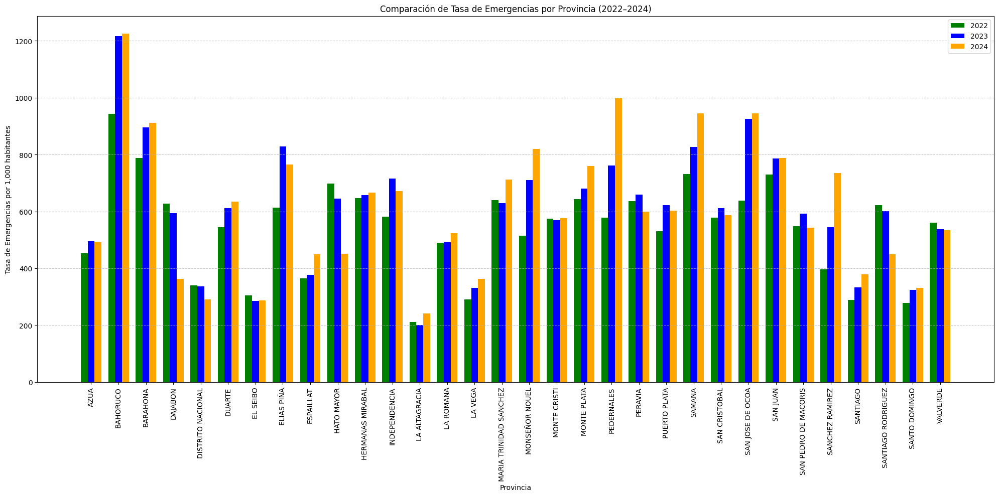

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Crear el DataFrame
data = [
    ["AZUA", 453.310107, 494.724046, 492.067272],
    ["BAHORUCO", 943.353934, 1216.585186, 1225.698736],
    ["BARAHONA", 788.023084, 894.920928, 910.520399],
    ["DAJABON", 628.169735, 594.516342, 362.915281],
    ["DISTRITO NACIONAL", 339.290112, 336.524731, 290.427266],
    ["DUARTE", 544.950531, 610.961074, 634.108260],
    ["EL SEIBO", 304.402746, 285.832162, 286.463745],
    ["ELIAS PIÑA", 612.607299, 828.818900, 765.471959],
    ["ESPAILLAT", 364.802784, 376.289843, 449.651800],
    ["HATO MAYOR", 697.650225, 644.422659, 451.348945],
    ["HERMANAS MIRABAL", 646.304958, 657.644735, 666.396424],
    ["INDEPENDENCIA", 581.314023, 715.207100, 672.269601],
    ["LA ALTAGRACIA", 211.752126, 200.217000, 240.719109],
    ["LA ROMANA", 489.516174, 491.114042, 523.022552],
    ["LA VEGA", 291.058361, 331.626275, 363.493896],
    ["MARIA TRINIDAD SANCHEZ", 639.352237, 628.509249, 712.347180],
    ["MONSEÑOR NOUEL", 514.546033, 709.899711, 820.356242],
    ["MONTE CRISTI", 573.676717, 568.693190, 576.756238],
    ["MONTE PLATA", 642.374609, 680.083309, 758.763822],
    ["PEDERNALES", 577.476715, 761.160910, 997.226196],
    ["PERAVIA", 636.821317, 659.080547, 599.717800],
    ["PUERTO PLATA", 529.772940, 621.673810, 602.381835],
    ["SAMANA", 731.217219, 827.345765, 945.155858],
    ["SAN CRISTOBAL", 578.120598, 611.254575, 587.454400],
    ["SAN JOSE DE OCOA", 637.295646, 925.585369, 944.540176],
    ["SAN JUAN", 728.861094, 786.837048, 788.590411],
    ["SAN PEDRO DE MACORIS", 548.088921, 592.882774, 541.903783],
    ["SANCHEZ RAMIREZ", 395.802367, 543.607645, 735.307360],
    ["SANTIAGO", 288.282146, 332.509310, 378.094424],
    ["SANTIAGO RODRIGUEZ", 621.925848, 600.049683, 448.779655],
    ["SANTO DOMINGO", 277.442276, 323.514985, 331.509186],
    ["VALVERDE", 560.855508, 536.823958, 533.640314],
]

# Crear el DataFrame
df_resultado = pd.DataFrame(data, columns=["Provincia", "Tasa_2022", "Tasa_2023", "Tasa_2024"])

# Configurar el gráfico de barras agrupadas
x = np.arange(len(df_resultado["Provincia"]))  # Posiciones de las provincias
width = 0.25  # Ancho de cada barra

plt.figure(figsize=(20, 10))
plt.bar(x - width, df_resultado["Tasa_2022"], width=width, label="2022", color='green')
plt.bar(x, df_resultado["Tasa_2023"], width=width, label="2023", color='blue')
plt.bar(x + width, df_resultado["Tasa_2024"], width=width, label="2024", color='orange')

# Estética
plt.xlabel("Provincia")
plt.ylabel("Tasa de Emergencias por 1,000 habitantes")
plt.title("Comparación de Tasa de Emergencias por Provincia (2022–2024)")
plt.xticks(ticks=x, labels=df_resultado["Provincia"], rotation=90)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Mostrar
plt.show()

## **Mapa de Calor Demanda**

In [ ]:
pip install pandas geopandas matplotlib openpyxl


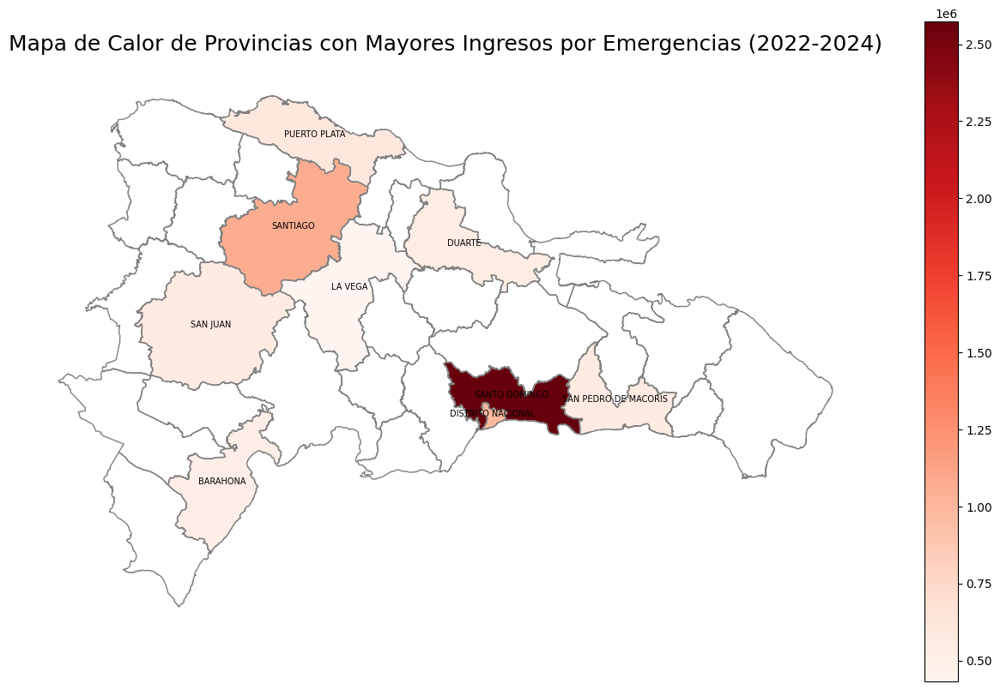

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import json
from shapely.geometry import shape, MultiPolygon

# Cargar los datos de emergencias
file_emergencias = "Total Emergencias 2018-2024.xlsx"
df_emergencias = pd.read_excel(file_emergencias, sheet_name="Total Eme. 2018-2024")

df_emergencias.columns = df_emergencias.iloc[1]  # Asignar la fila correcta como nombres de columnas
df_emergencias = df_emergencias.iloc[2:].reset_index(drop=True)  # Eliminar filas innecesarias

# Convertir la columna de fecha a tipo datetime
df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"] = pd.to_datetime(
    df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"], errors='coerce'
)

# Filtrar datos entre 2022 y 2024
df_filtered = df_emergencias[
    df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"].dt.year.between(2022, 2024)
]

# Seleccionar columnas relevantes
df_filtered = df_filtered[[
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[Eme_total_ingresos]"  # Total ingresos
]]

# Renombrar columnas para facilidad de uso
df_filtered.columns = ["Provincia", "Total_Ingresos"]

# Convertir Total_Ingresos a numérico
df_filtered["Total_Ingresos"] = pd.to_numeric(df_filtered["Total_Ingresos"], errors="coerce")

# Eliminar filas con valores nulos
df_filtered = df_filtered.dropna()

# Agrupar por provincia, sumando los ingresos
df_provincia_ingresos = df_filtered.groupby("Provincia", as_index=False).sum()

# Seleccionar las 10 provincias con mayor ingresos
df_top_provincias = df_provincia_ingresos.nlargest(10, "Total_Ingresos")

# Cargar los datos geoespaciales desde el archivo JSON
with open("RD_PROV.json", "r", encoding="utf-8") as file:
    geojson_data = json.load(file)

gdf_provincias = gpd.GeoDataFrame.from_features(geojson_data["features"])

# Renombrar la columna para que coincida con los datos de emergencias
gdf_provincias = gdf_provincias.rename(columns={"TOPONIMIA": "Provincia"})

# Convertir MultiPolygon a Polygon seleccionando el más grande
def convertir_a_poligono(geom):
    if isinstance(geom, MultiPolygon):
        return max(geom.geoms, key=lambda p: p.area)  # Seleccionar el polígono más grande
    return geom

gdf_provincias["geometry"] = gdf_provincias["geometry"].apply(convertir_a_poligono)

# Unir los datos de los hospitales con el GeoDataFrame de las provincias
gdf_merged = gdf_provincias.merge(df_top_provincias, on="Provincia", how="right")

# **FILTRAR PROVINCIAS SIN GEOMETRÍA**
gdf_merged = gdf_merged.dropna(subset=["geometry"])  # Eliminamos provincias sin geometría

# Crear el mapa de calor
fig, ax = plt.subplots(1, 1, figsize=(16, 10))
gdf_provincias.boundary.plot(ax=ax, linewidth=1, color="gray")  # Dibujar los bordes de todas las provincias
gdf_merged.plot(column="Total_Ingresos", cmap="Reds", linewidth=0.8, ax=ax, edgecolor="0.8", legend=True)

# Agregar etiquetas con los nombres de las provincias con un tamaño de fuente más pequeño
for _, row in gdf_merged.iterrows():
    if row.geometry is not None:
        centroid = row.geometry.centroid
        ax.annotate(text=row.Provincia, xy=(centroid.x, centroid.y),
                    ha='center', fontsize=7, color='black')

# Personalizar el mapa
ax.set_title("Mapa de Calor de Provincias con Mayores Ingresos por Emergencias (2022-2024)", fontsize=18)
ax.set_axis_off()

# Mostrar el mapa
plt.show()


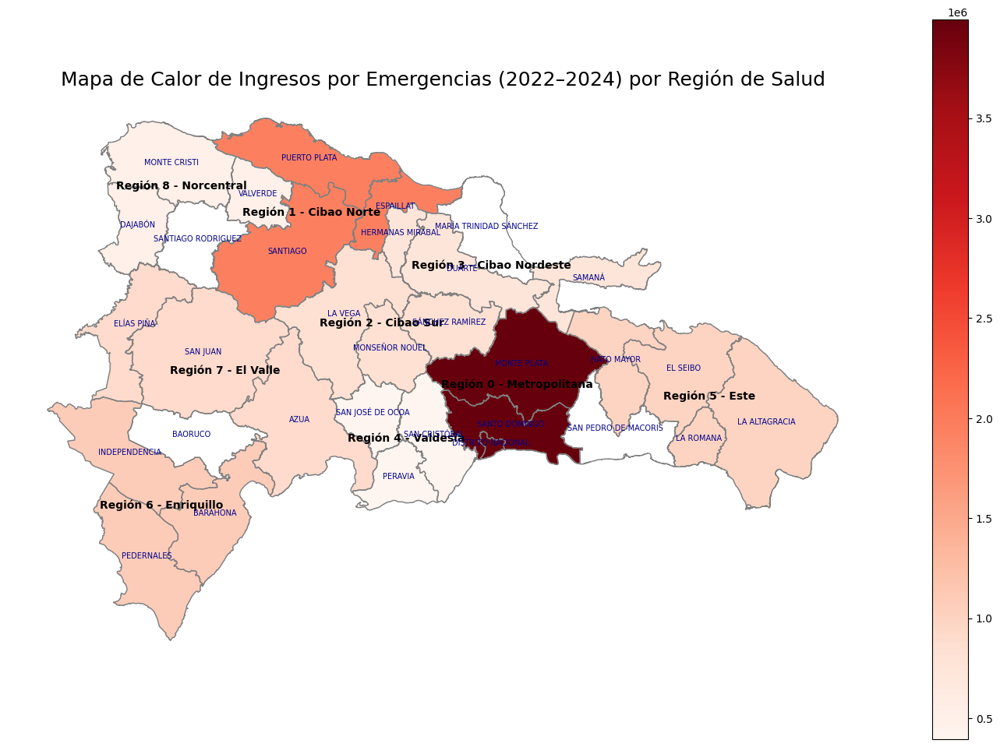

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import json
from shapely.geometry import shape, MultiPolygon

# --- 1. Cargar datos de emergencias ---
file_emergencias = "Total Emergencias 2018-2024.xlsx"
df_emergencias = pd.read_excel(file_emergencias, sheet_name="Total Eme. 2018-2024")

df_emergencias.columns = df_emergencias.iloc[1]
df_emergencias = df_emergencias.iloc[2:].reset_index(drop=True)

df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"] = pd.to_datetime(
    df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"], errors='coerce'
)

# --- 2. Filtrar datos entre 2022 y 2024 ---
df_filtered = df_emergencias[
    df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"].dt.year.between(2022, 2024)
]

df_filtered = df_filtered[[
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",
    "vw_produccion_67A_eme_BI[Eme_total_ingresos]"
]]
df_filtered.columns = ["Provincia", "Total_Ingresos"]
df_filtered["Total_Ingresos"] = pd.to_numeric(df_filtered["Total_Ingresos"], errors="coerce")
df_filtered = df_filtered.dropna()

# --- 3. Mapeo actualizado de Provincias a Regiones ---
mapa_provincia_region = {
    # Región 0 (Metropolitana)
    'DISTRITO NACIONAL': 'Región 0 - Metropolitana',
    'SANTO DOMINGO': 'Región 0 - Metropolitana',
    'MONTE PLATA': 'Región 0 - Metropolitana',

    # Región 1 (Cibao Norte)
    'SANTIAGO': 'Región 1 - Cibao Norte',
    'PUERTO PLATA': 'Región 1 - Cibao Norte',
    'ESPAILLAT': 'Región 1 - Cibao Norte',

    # Región 2 (Cibao Sur)
    'LA VEGA': 'Región 2 - Cibao Sur',
    'MONSEÑOR NOUEL': 'Región 2 - Cibao Sur',
    'SÁNCHEZ RAMÍREZ': 'Región 2 - Cibao Sur',

    # Región 3 (Cibao Nordeste)
    'DUARTE': 'Región 3 - Cibao Nordeste',
    'MARIA TRINIDAD SÁNCHEZ': 'Región 3 - Cibao Nordeste',
    'HERMANAS MIRABAL': 'Región 3 - Cibao Nordeste',
    'SAMANÁ': 'Región 3 - Cibao Nordeste',

    # Región 4 (Valdesia)
    'SAN CRISTÓBAL': 'Región 4 - Valdesia',
    'PERAVIA': 'Región 4 - Valdesia',
    'SAN JOSÉ DE OCOA': 'Región 4 - Valdesia',

    # Región 5 (Este)
    'SAN PEDRO DE MACORÍS': 'Región 5 - Este',
    'LA ALTAGRACIA': 'Región 5 - Este',
    'LA ROMANA': 'Región 5 - Este',
    'EL SEIBO': 'Región 5 - Este',
    'HATO MAYOR': 'Región 5 - Este',

    # Región 6 (Enriquillo)
    'BARAHONA': 'Región 6 - Enriquillo',
    'PEDERNALES': 'Región 6 - Enriquillo',
    'BAHORUCO': 'Región 6 - Enriquillo',
    'INDEPENDENCIA': 'Región 6 - Enriquillo',

    # Región 7 (El Valle)
    'SAN JUAN': 'Región 7 - El Valle',
    'AZUA': 'Región 7 - El Valle',
    'ELÍAS PIÑA': 'Región 7 - El Valle',

    # Región 8 (Norcentral)
    'MONTE CRISTI': 'Región 8 - Norcentral',
    'DAJABÓN': 'Región 8 - Norcentral',
    'VALVERDE': 'Región 8 - Norcentral',
    'SANTIAGO RODRÍGUEZ': 'Región 8 - Norcentral'
}

# Agregar nueva columna Región
df_filtered["Región"] = df_filtered["Provincia"].map(mapa_provincia_region)

# Eliminar filas que no tengan región asignada
df_filtered = df_filtered.dropna(subset=["Región"])

# --- 4. Agrupar por región ---
df_region_ingresos = df_filtered.groupby("Región", as_index=False)["Total_Ingresos"].sum()

# --- 5. Cargar datos geoespaciales ---
with open("RD_PROV.json", "r", encoding="utf-8") as file:
    geojson_data = json.load(file)

gdf_provincias = gpd.GeoDataFrame.from_features(geojson_data["features"])
gdf_provincias = gdf_provincias.rename(columns={"TOPONIMIA": "Provincia"})

# Convertir MultiPolygon a Polygon seleccionando el más grande
def convertir_a_poligono(geom):
    if isinstance(geom, MultiPolygon):
        return max(geom.geoms, key=lambda p: p.area)
    return geom

gdf_provincias["geometry"] = gdf_provincias["geometry"].apply(convertir_a_poligono)

# Asociar provincias a regiones
gdf_provincias["Región"] = gdf_provincias["Provincia"].map(mapa_provincia_region)

# Agrupar geometrías de provincias por Región
gdf_regiones = gdf_provincias.dissolve(by="Región", aggfunc="first").reset_index()

# Unir datos de emergencias
gdf_merged = gdf_regiones.merge(df_region_ingresos, on="Región", how="left")

# --- 6. Crear el Mapa de Calor ---
fig, ax = plt.subplots(1, 1, figsize=(18, 12))

# Dibujar fronteras de provincias
gdf_provincias.boundary.plot(ax=ax, linewidth=1, color="gray")

# Dibujar mapa de calor por región
gdf_merged.plot(column="Total_Ingresos", cmap="Reds", linewidth=0.8, ax=ax, edgecolor="0.8", legend=True)

# Agregar etiquetas de nombres de REGIONES (centrado)
for _, row in gdf_merged.iterrows():
    if row.geometry is not None:
        centroid = row.geometry.centroid
        ax.annotate(text=row.Región, xy=(centroid.x, centroid.y),
                    ha='center', fontsize=10, color='black', fontweight='bold')

# Agregar etiquetas de nombres de PROVINCIAS
for _, row in gdf_provincias.iterrows():
    if row.geometry is not None and pd.notnull(row["Provincia"]):
        centroid = row.geometry.centroid
        ax.annotate(text=row.Provincia, xy=(centroid.x, centroid.y),
                    ha='center', fontsize=7, color='darkblue')

# Personalizar
ax.set_title("Mapa de Calor de Ingresos por Emergencias (2022–2024) por Región de Salud", fontsize=18)
ax.set_axis_off()

# Mostrar el mapa
plt.show()


# **Análisis Exploratorio**

In [ ]:
import pandas as pd

file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Mostrar todas las columnas disponibles con su índice
for i, col in enumerate(df.columns):
    print(f"{i}: {col}")


0: vw_produccion_67A_eme_BI[RegistroNo]
1: vw_produccion_67A_eme_BI[RegistroFecha]
2: vw_produccion_67A_eme_BI[id_centro]
3: vw_produccion_67A_eme_BI[establecimiento]
4: vw_produccion_67A_eme_BI[establecimiento_provincia]
5: vw_produccion_67A_eme_BI[establecimiento_municipio]
6: vw_produccion_67A_eme_BI[establecimiento_gerencia]
7: vw_produccion_67A_eme_BI[establecimiento_srs]
8: vw_produccion_67A_eme_BI[establecimiento_region_id]
9: vw_produccion_67A_eme_BI[establecimiento_region]
10: vw_produccion_67A_eme_BI[establecimiento_coordenada]
11: vw_produccion_67A_eme_BI[Id_Servicio]
12: vw_produccion_67A_eme_BI[Servicio]
13: vw_produccion_67A_eme_BI[Servicio_Grupo]
14: vw_produccion_67A_eme_BI[Orden]
15: vw_produccion_67A_eme_BI[Periodo_mes]
16: vw_produccion_67A_eme_BI[Periodo_anio]
17: vw_produccion_67A_eme_BI[Trimestre]
18: vw_produccion_67A_eme_BI[Semestre]
19: vw_produccion_67A_eme_BI[eess_validado]
20: vw_produccion_67A_eme_BI[srs_validado]
21: vw_produccion_67A_eme_BI[Eme_ingreso_91

<ipython-input-30-a8cbaf48f09b>:42: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.set_index("Fecha").resample("M").sum()


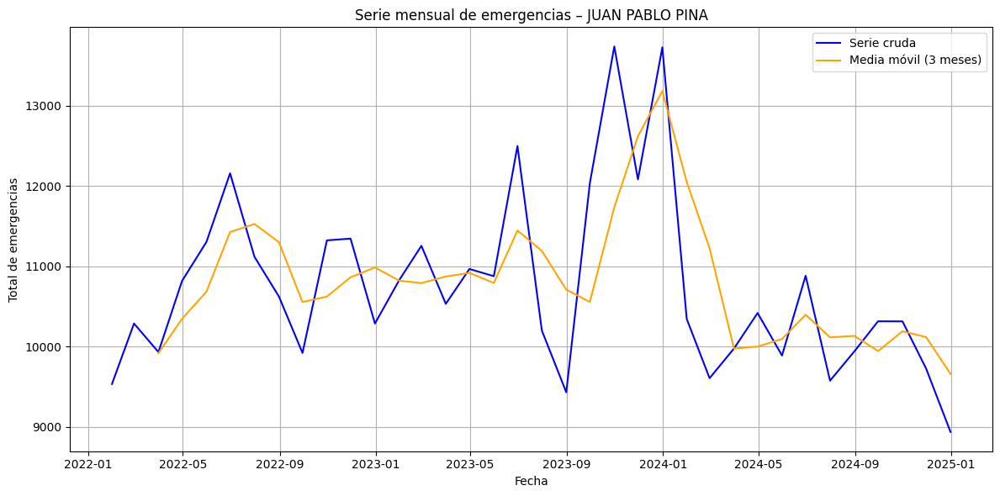

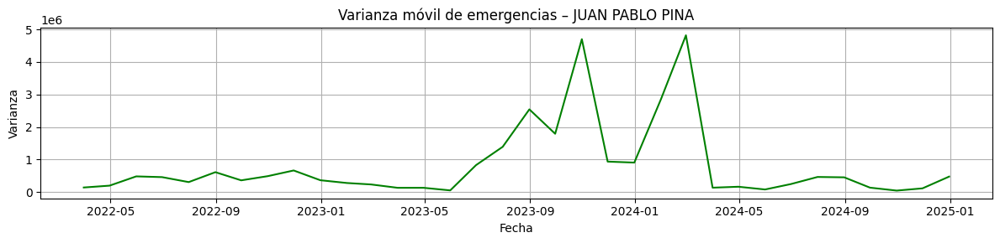

,Total_Emergencias,Media_movil,Varianza_movil
Fecha,,,
2024-01-31,10345,12050.333333,2.856805e+06
2024-02-29,9608,11226.000000,4.819543e+06
2024-03-31,9977,9976.666667,1.357923e+05
2024-04-30,10419,10001.333333,1.648743e+05
2024-05-31,9890,10095.333333,8.046233e+04
2024-06-30,10883,10397.333333,2.468643e+05
2024-07-31,9577,10116.666667,4.649423e+05
2024-08-31,9943,10134.333333,4.538653e+05
2024-09-30,10316,9945.333333,1.365343e+05


<ipython-input-30-a8cbaf48f09b>:42: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.set_index("Fecha").resample("M").sum()


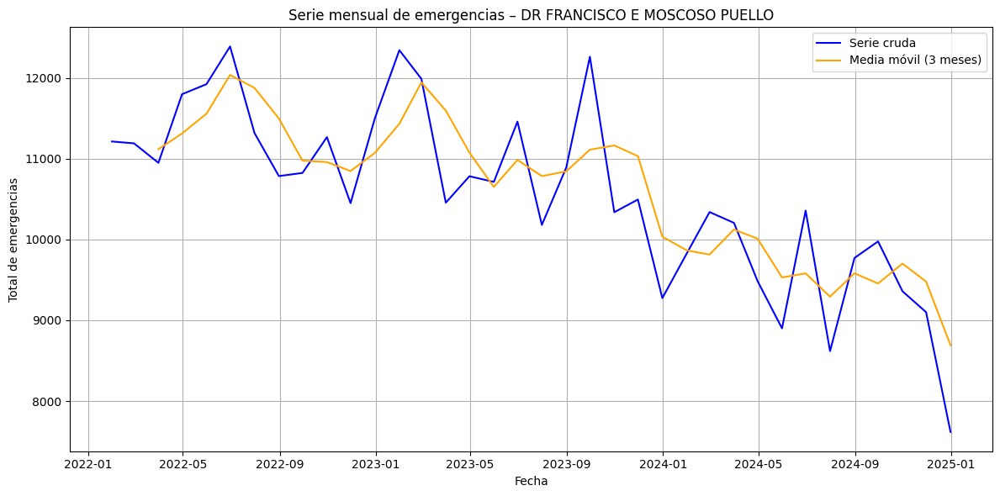

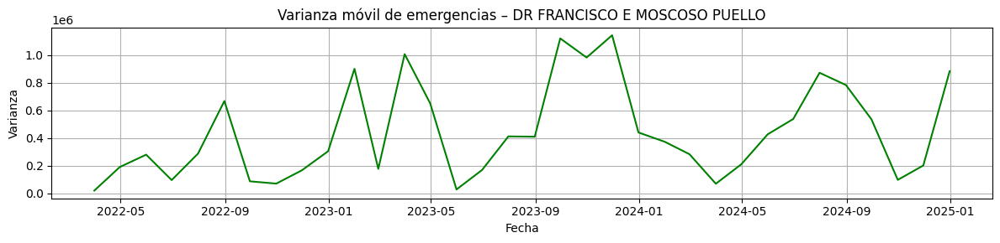

,Total_Emergencias,Media_movil,Varianza_movil
Fecha,,,
2024-01-31,9826,9864.666667,373221.333333
2024-02-29,10339,9813.000000,283683.000000
2024-03-31,10205,10123.333333,70794.333333
2024-04-30,9484,10009.333333,211470.333333
2024-05-31,8900,9529.666667,427320.333333
2024-06-30,10357,9580.333333,537672.333333
2024-07-31,8618,9291.666667,871082.333333
2024-08-31,9770,9581.666667,782632.333333
2024-09-30,9976,9454.666667,535617.333333


<ipython-input-30-a8cbaf48f09b>:42: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.set_index("Fecha").resample("M").sum()


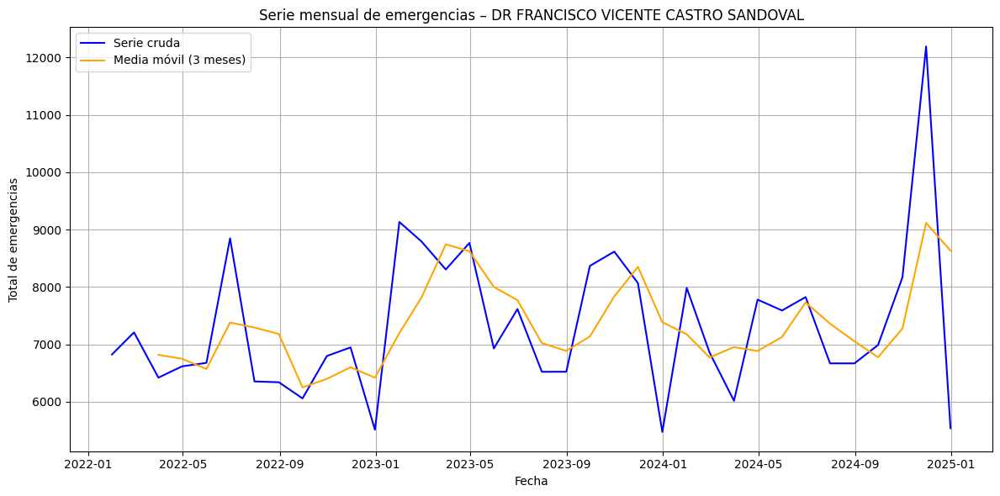

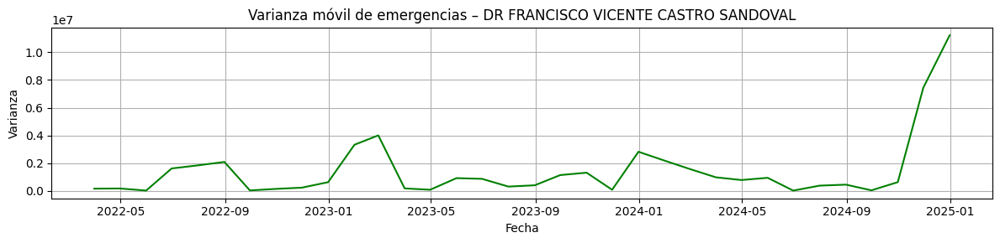

,Total_Emergencias,Media_movil,Varianza_movil
Fecha,,,
2024-01-31,7985,7176.333333,2.172665e+06
2024-02-29,6859,6773.000000,1.580572e+06
2024-03-31,6017,6953.666667,9.749773e+05
2024-04-30,7781,6885.666667,7.784573e+05
2024-05-31,7592,7130.000000,9.380070e+05
2024-06-30,7825,7732.666667,1.532433e+04
2024-07-31,6670,7362.333333,3.730663e+05
2024-08-31,6670,7055.000000,4.446750e+05
2024-09-30,6990,6776.666667,3.413333e+04


<ipython-input-30-a8cbaf48f09b>:42: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.set_index("Fecha").resample("M").sum()


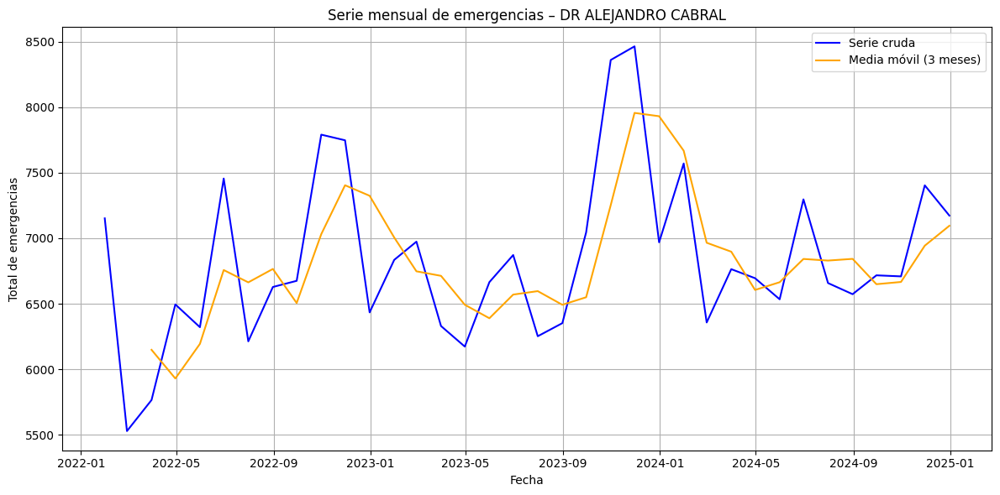

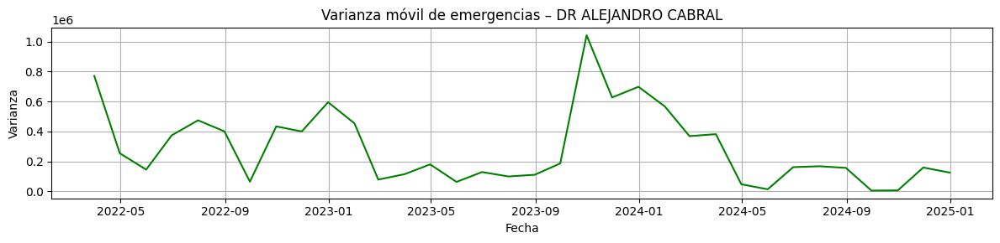

,Total_Emergencias,Media_movil,Varianza_movil
Fecha,,,
2024-01-31,7571,7668.333333,566609.333333
2024-02-29,6357,6965.666667,368457.333333
2024-03-31,6764,6897.333333,381782.333333
2024-04-30,6695,6605.333333,47442.333333
2024-05-31,6534,6664.333333,13930.333333
2024-06-30,7297,6842.000000,161749.000000
2024-07-31,6658,6829.666667,167644.333333
2024-08-31,6573,6842.666667,156620.333333
2024-09-30,6717,6649.333333,5240.333333


<ipython-input-30-a8cbaf48f09b>:42: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.set_index("Fecha").resample("M").sum()


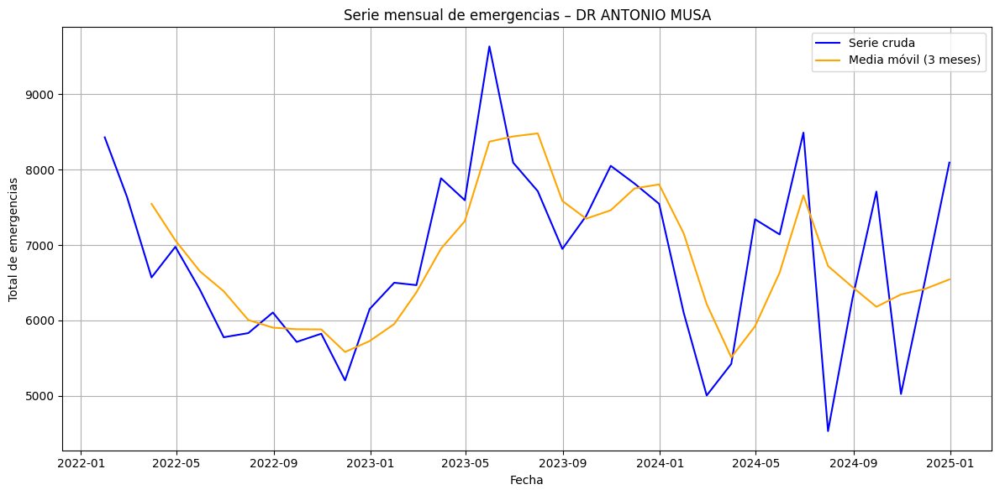

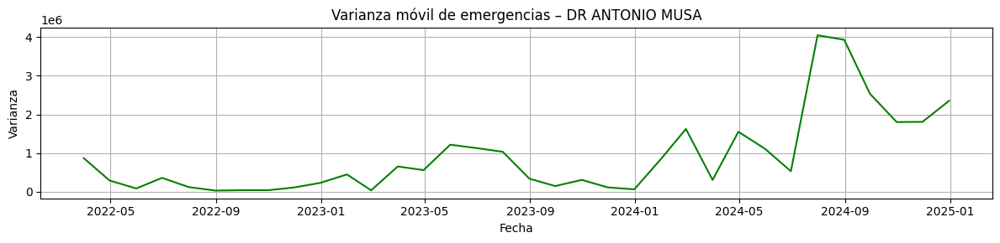

,Total_Emergencias,Media_movil,Varianza_movil
Fecha,,,
2024-01-31,6102,7154.333333,8.486443e+05
2024-02-29,5005,6217.666667,1.624204e+06
2024-03-31,5424,5510.333333,3.064423e+05
2024-04-30,7341,5923.333333,1.551224e+06
2024-05-31,7140,6635.000000,1.109991e+06
2024-06-30,8490,7657.000000,5.305170e+05
2024-07-31,4533,6721.000000,4.046133e+06
2024-08-31,6300,6441.000000,3.929373e+06
2024-09-30,7709,6180.666667,2.532424e+06


<ipython-input-30-a8cbaf48f09b>:42: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.set_index("Fecha").resample("M").sum()


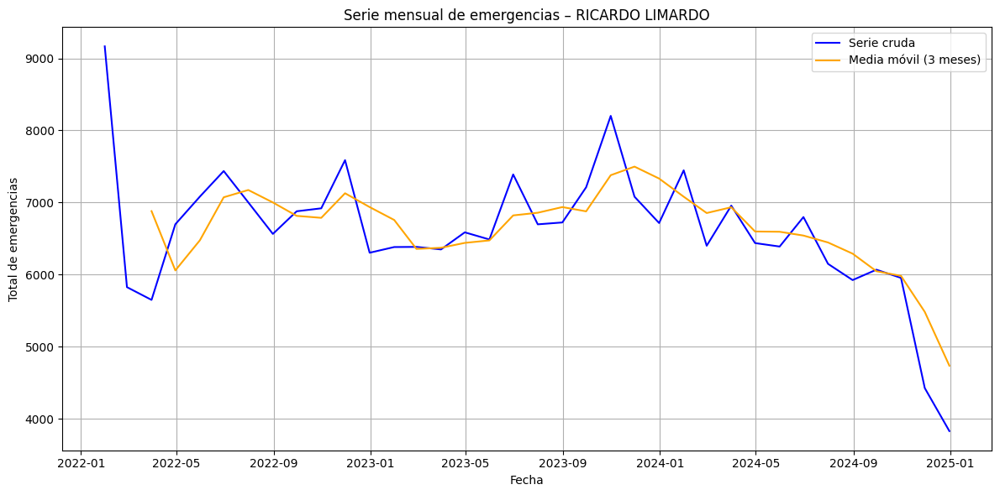

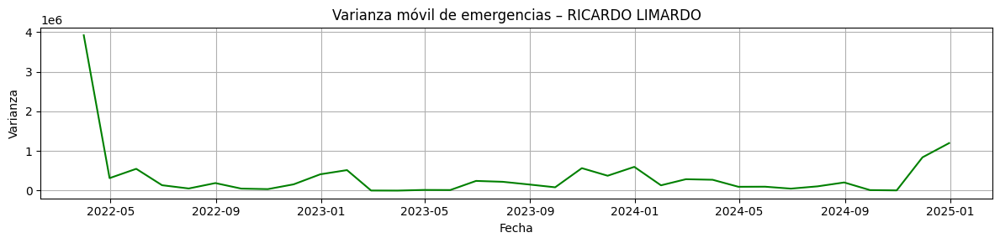

,Total_Emergencias,Media_movil,Varianza_movil
Fecha,,,
2024-01-31,7447,7081.333333,1.335903e+05
2024-02-29,6401,6854.666667,2.879503e+05
2024-03-31,6957,6935.000000,2.738920e+05
2024-04-30,6438,6598.666667,9.664433e+04
2024-05-31,6390,6595.000000,9.885900e+04
2024-06-30,6799,6542.333333,4.998433e+04
2024-07-31,6150,6446.333333,1.076803e+05
2024-08-31,5925,6291.333333,2.059503e+05
2024-09-30,6069,6048.000000,1.298700e+04


<ipython-input-30-a8cbaf48f09b>:42: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.set_index("Fecha").resample("M").sum()


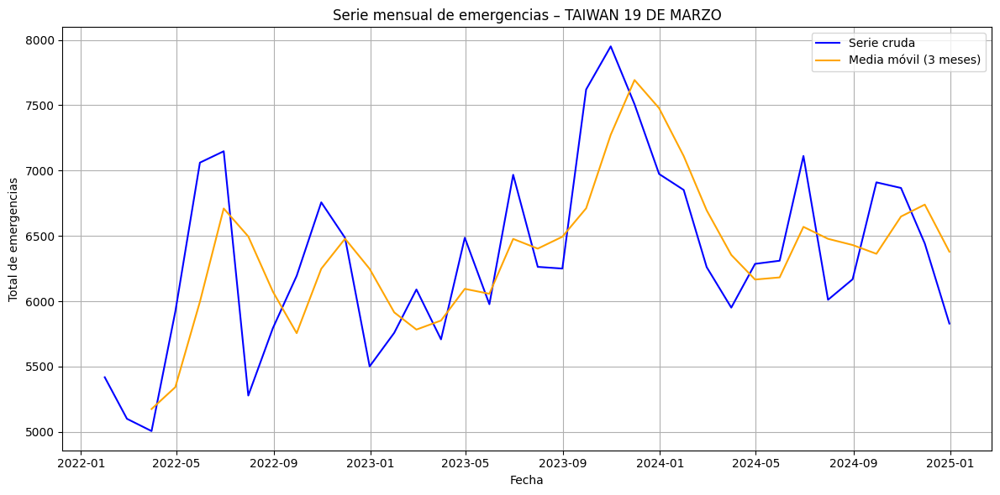

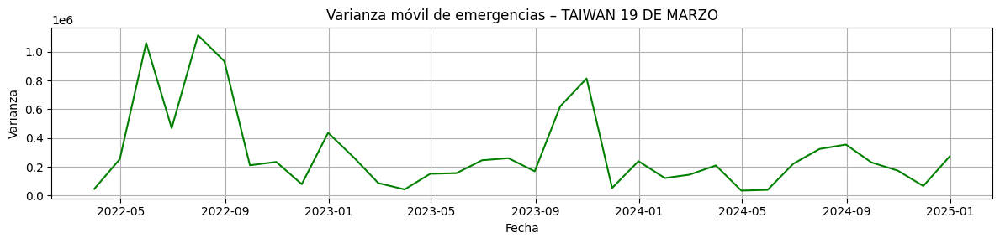

,Total_Emergencias,Media_movil,Varianza_movil
Fecha,,,
2024-01-31,6852,7111.333333,121729.333333
2024-02-29,6261,6695.666667,145422.333333
2024-03-31,5951,6354.666667,209530.333333
2024-04-30,6286,6166.000000,34825.000000
2024-05-31,6310,6182.333333,40280.333333
2024-06-30,7112,6569.333333,221009.333333
2024-07-31,6011,6477.666667,324134.333333
2024-08-31,6168,6430.333333,354664.333333
2024-09-30,6910,6363.000000,230569.000000


<ipython-input-30-a8cbaf48f09b>:42: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.set_index("Fecha").resample("M").sum()


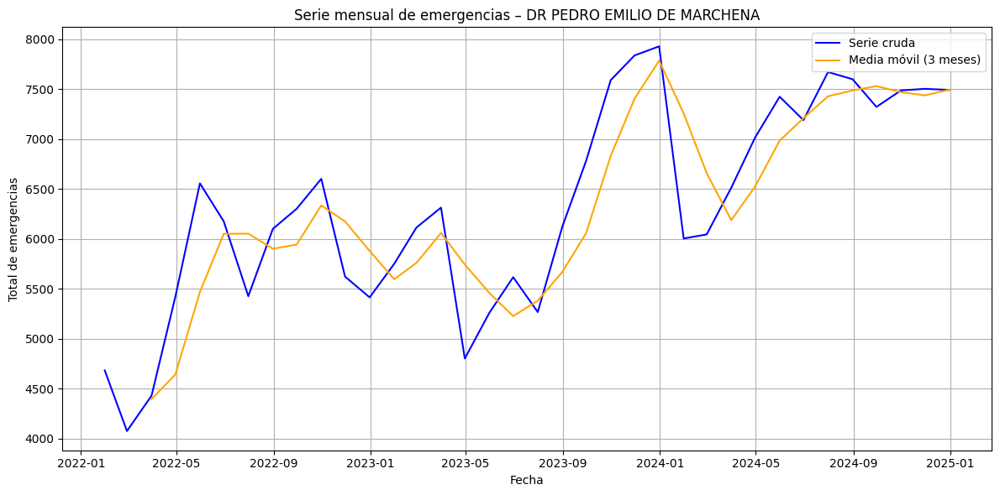

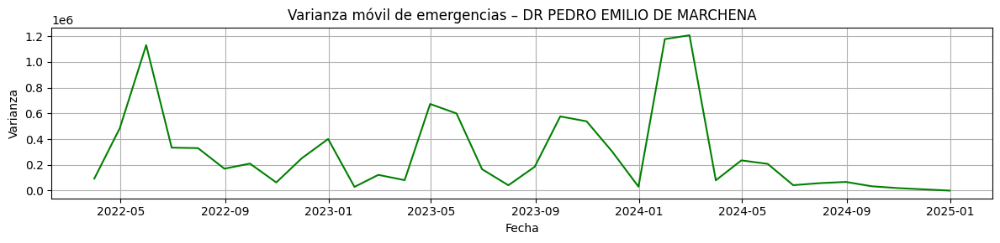

,Total_Emergencias,Media_movil,Varianza_movil
Fecha,,,
2024-01-31,6004,7255.666667,1.177072e+06
2024-02-29,6045,6658.666667,1.206922e+06
2024-03-31,6513,6187.333333,7.996433e+04
2024-04-30,7014,6524.000000,2.348310e+05
2024-05-31,7423,6983.333333,2.077303e+05
2024-06-30,7189,7208.666667,4.211033e+04
2024-07-31,7670,7427.333333,5.785433e+04
2024-08-31,7598,7485.666667,6.730433e+04
2024-09-30,7321,7529.666667,3.395233e+04


<ipython-input-30-a8cbaf48f09b>:42: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.set_index("Fecha").resample("M").sum()


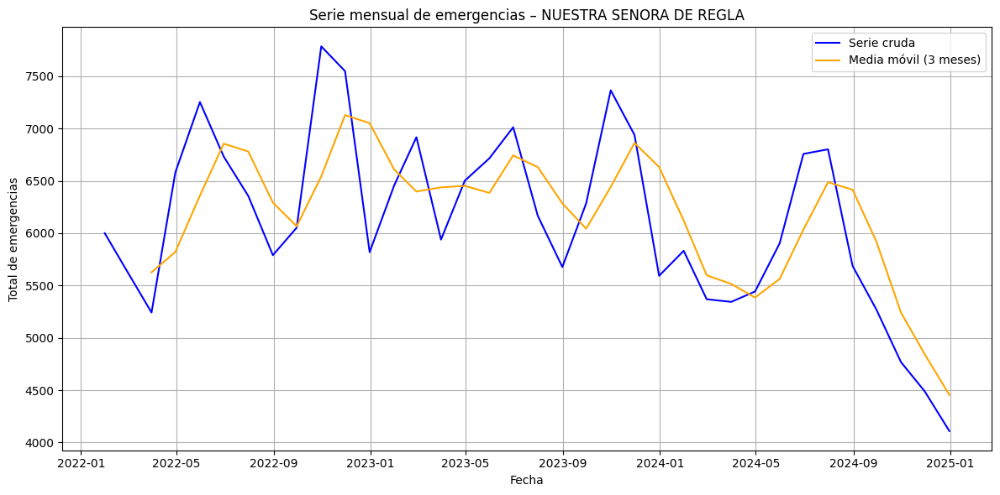

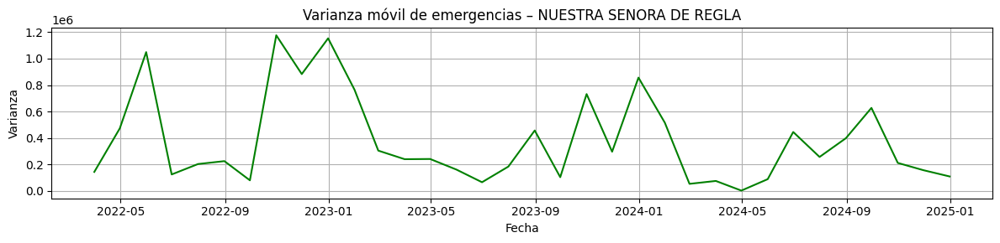

,Total_Emergencias,Media_movil,Varianza_movil
Fecha,,,
2024-01-31,5832,6121.333333,515714.333333
2024-02-29,5369,5598.000000,53611.000000
2024-03-31,5344,5515.000000,75523.000000
2024-04-30,5443,5385.333333,2650.333333
2024-05-31,5903,5563.333333,88980.333333
2024-06-30,6758,6034.666667,445308.333333
2024-07-31,6802,6487.666667,256860.333333
2024-08-31,5687,6415.666667,398700.333333
2024-09-30,5270,5919.666667,627356.333333


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar y preparar los datos
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Limpiar nombres de columnas
df.columns = [col.strip() for col in df.columns]

# Renombrar columnas clave
df.rename(columns={
    "vw_produccion_67A_eme_BI[Periodo_anio]": "Anio",
    "vw_produccion_67A_eme_BI[Periodo_mes]": "Mes",
    "vw_produccion_67A_eme_BI[establecimiento]": "Establecimiento",
    "vw_produccion_67A_eme_BI[Eme_total_ingresos]": "Total_Emergencias"
}, inplace=True)

# Crear columna de fecha estadística
df["Fecha"] = pd.to_datetime(df["Anio"].astype(str) + "-" + df["Mes"].astype(str).str.zfill(2) + "-01")

# Convertir Total_Emergencias a numérico
df["Total_Emergencias"] = pd.to_numeric(df["Total_Emergencias"], errors='coerce')

# Filtrar por años 2022-2024
df = df[(df["Anio"] >= 2022) & (df["Anio"] <= 2024)]
df = df[["Fecha", "Establecimiento", "Total_Emergencias"]].dropna()
df.sort_values("Fecha", inplace=True)

# Seleccionar los 9 hospitales con mayor volumen
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Análisis exploratorio para cada hospital
for hospital in top9_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h = df_h.set_index("Fecha").resample("M").sum()

    # Media y varianza móvil
    df_h["Media_movil"] = df_h["Total_Emergencias"].rolling(window=3).mean()
    df_h["Varianza_movil"] = df_h["Total_Emergencias"].rolling(window=3).var()

    # Gráfico de la serie cruda y la media
    plt.figure(figsize=(12, 6))
    plt.plot(df_h.index, df_h["Total_Emergencias"], label="Serie cruda", color="blue")
    plt.plot(df_h.index, df_h["Media_movil"], label="Media móvil (3 meses)", color="orange")
    plt.title(f"Serie mensual de emergencias – {hospital}")
    plt.xlabel("Fecha")
    plt.ylabel("Total de emergencias")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Gráfico de la varianza móvil
    plt.figure(figsize=(12, 3))
    plt.plot(df_h.index, df_h["Varianza_movil"], label="Varianza móvil (3 meses)", color="green")
    plt.title(f"Varianza móvil de emergencias – {hospital}")
    plt.xlabel("Fecha")
    plt.ylabel("Varianza")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


    # Mostrar los últimos valores como tabla
    display(df_h[["Total_Emergencias", "Media_movil", "Varianza_movil"]].tail(12))

In [ ]:
import pandas as pd

# Cargar archivo
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Limpiar nombres
df.columns = [col.strip() for col in df.columns]

# Renombrar columnas clave
df_filtered = df[[
    "vw_produccion_67A_eme_BI[Periodo_anio]",
    "vw_produccion_67A_eme_BI[Periodo_mes]",
    "vw_produccion_67A_eme_BI[establecimiento]",
    "vw_produccion_67A_eme_BI[Eme_total_ingresos]"
]].copy()

df_filtered.columns = ["Anio", "Mes", "Establecimiento", "Total_Emergencias"]

# Crear columna de fecha estadística
df_filtered["Fecha"] = pd.to_datetime(df_filtered["Anio"].astype(str) + "-" + df_filtered["Mes"].astype(str).str.zfill(2) + "-01")
df_filtered["Total_Emergencias"] = pd.to_numeric(df_filtered["Total_Emergencias"], errors='coerce')

# Filtrar años 2022–2024
df_filtered = df_filtered[(df_filtered["Anio"] >= 2022) & (df_filtered["Anio"] <= 2024)]

# Calcular top 9 hospitales
top9_hospitals = (
    df_filtered.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Filtrar solo top 9
df_top9 = df_filtered[df_filtered["Establecimiento"].isin(top9_hospitals)].copy()

# Agrupar por hospital y fecha
df_grouped = (
    df_top9.groupby(["Establecimiento", "Fecha"], as_index=False)
    .agg({"Total_Emergencias": "sum"})
)

# Calcular media móvil por hospital
df_grouped["Media_movil"] = (
    df_grouped.sort_values(["Establecimiento", "Fecha"])
    .groupby("Establecimiento")["Total_Emergencias"]
    .transform(lambda x: x.rolling(window=3).mean())
)

# Mostrar resultados
print(df_grouped.head())


       Establecimiento      Fecha  Total_Emergencias  Media_movil
0  DR ALEJANDRO CABRAL 2022-01-01               7152          NaN
1  DR ALEJANDRO CABRAL 2022-02-01               5528          NaN
2  DR ALEJANDRO CABRAL 2022-03-01               5765  6148.333333
3  DR ALEJANDRO CABRAL 2022-04-01               6495  5929.333333
4  DR ALEJANDRO CABRAL 2022-05-01               6321  6193.666667


Análisis exploratorio inicial de las series de tiempo (2022–2024)
Se realizó un análisis exploratorio de las series temporales mensuales de emergencias para los nueve hospitales con mayor volumen de atención, correspondiente al período 2022–2024. Este análisis incluyó:

Gráficos de la serie cruda de emergencias.

Cálculo de la media móvil (3 meses) para detectar tendencias.

Cálculo de la varianza móvil (3 meses) para identificar estabilidad o heterocedasticidad.

A continuación, se resumen los hallazgos principales por hospital:

🔹 1. DR ALEJANDRO CABRAL
Tendencia: ascendente sostenida.

Varianza: alta → posibles eventos estacionales o brotes irregulares.

🔹 2. DR ANTONIO MUSA
Tendencia: descendente o estable.

Varianza: alta → variabilidad significativa que puede dificultar la predicción.

🔹 3. DR FRANCISCO E MOSCOSO PUELLO
Tendencia: descendente o estable en la última parte del período.

Varianza: alta → se observan oscilaciones importantes mes a mes.

🔹 4. DR FRANCISCO VICENTE CASTRO SANDOVAL
Tendencia: ascendente, con incremento progresivo de demanda.

Varianza: alta → comportamiento irregular con picos evidentes.

🔹 5. DR PEDRO EMILIO DE MARCHENA
Tendencia: ascendente durante el período.

Varianza: alta → cambios abruptos en algunos tramos de la serie.

🔹 6. JUAN PABLO PINA
Tendencia: ascendente estable.

Varianza: moderada a alta → estabilidad parcial con algunas oscilaciones.

🔹 7. RICARDO LIMARDO
Tendencia: ascendente leve, con altibajos.

Varianza: alta → comportamiento errático, sensible a factores externos.

🔹 8. NUESTRA SENORA DE REGLA
Tendencia: estable con leve ascenso final.

Varianza: alta → dispersión frecuente en meses críticos.

🔹 9. TAIWAN 19 DE MARZO
Tendencia: ascendente sostenida.

Varianza: moderada → comportamiento más regular que el resto.

Conclusiones

La mayoría de los hospitales presenta una tendencia creciente o estable, con excepciones de comportamiento plano o descendente.

La varianza móvil fue predominantemente alta en los hospitales analizados, lo que indica irregularidad en la demanda mensual y potencial necesidad de aplicar transformaciones o modelos robustos.

Estos resultados refuerzan la importancia de emplear análisis multivariado y técnicas como LSTM, XGBoost o SARIMA diferenciada en etapas posteriores del estudio.


In [ ]:
import pandas as pd

# Cargar archivo
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas y limpiar
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    "vw_produccion_67A_eme_BI[Periodo_anio]": "Año",
    "vw_produccion_67A_eme_BI[Periodo_mes]": "Mes",
    "vw_produccion_67A_eme_BI[establecimiento]": "Establecimiento",
    "vw_produccion_67A_eme_BI[Eme_total_ingresos]": "Total_Emergencias"
}, inplace=True)

# Crear columna de fecha estadística
df["Fecha"] = pd.to_datetime(df["Año"].astype(str) + "-" + df["Mes"].astype(str).str.zfill(2) + "-01")

# Convertir a numérico
df["Total_Emergencias"] = pd.to_numeric(df["Total_Emergencias"], errors='coerce')

# Filtrar años 2022–2024
df = df[(df["Año"] >= 2022) & (df["Año"] <= 2024)].copy()

# Lista fija de hospitales trabajados
hospitales_trabajados = [
    "JUAN PABLO PINA",
    "DR FRANCISCO E MOSCOSO PUELLO",
    "DR FRANCISCO VICENTE CASTRO SANDOVAL",
    "DR ALEJANDRO CABRAL",
    "DR ANTONIO MUSA",
    "RICARDO LIMARDO",
    "TAIWAN 19 DE MARZO",
    "DR PEDRO EMILIO DE MARCHENA",
    "NUESTRA SENORA DE REGLA"
]

# Normalizar nombres de hospitales
df["Establecimiento"] = df["Establecimiento"].str.strip().str.upper()

# Filtrar solo hospitales seleccionados
df = df[df["Establecimiento"].isin(hospitales_trabajados)].copy()

# Agrupar: máximo por hospital, año y mes
df_grouped = df.groupby(["Establecimiento", "Año", "Mes"])["Total_Emergencias"].max().reset_index()

# Calcular resumen por hospital
resumen = []

for hospital in hospitales_trabajados:
    df_h = df_grouped[df_grouped["Establecimiento"] == hospital]

    if not df_h.empty:
        maximo = df_h["Total_Emergencias"].max()
        minimo = df_h["Total_Emergencias"].min()
        media = df_h["Total_Emergencias"].mean()
        varianza = df_h["Total_Emergencias"].var()
        rango = maximo - minimo
    else:
        maximo = minimo = media = varianza = rango = 0

    resumen.append({
        "Hospital": hospital,
        "Máximo mensual": int(maximo),
        "Mínimo mensual": int(minimo),
        "Media mensual": round(media, 2),
        "Varianza mensual": round(varianza, 2),
        "Rango de valores": int(rango)
    })

# Crear resumen final
df_resumen = pd.DataFrame(resumen)

# Mostrar
print(df_resumen)



                               Hospital  Máximo mensual  Mínimo mensual  \
0                       JUAN PABLO PINA           13736            8939   
1         DR FRANCISCO E MOSCOSO PUELLO           12388            7618   
2  DR FRANCISCO VICENTE CASTRO SANDOVAL           12193            5475   
3                   DR ALEJANDRO CABRAL            8465            5528   
4                       DR ANTONIO MUSA            9634            4533   
5                       RICARDO LIMARDO            9166            3831   
6                    TAIWAN 19 DE MARZO            7951            5006   
7           DR PEDRO EMILIO DE MARCHENA            7927            4077   
8               NUESTRA SENORA DE REGLA            7786            4109   

   Media mensual  Varianza mensual  Rango de valores  
0       10743.64        1220028.35              4797  
1       10564.47        1210747.51              4770  
2        7334.39        1706790.24              6718  
3        6831.97         4032


| Hospital | Máximo mensual | Mínimo mensual | Media mensual | Varianza mensual | Rango de valores |
|:---------|----------------:|---------------:|--------------:|-----------------:|-----------------:|
| JUAN PABLO PINA | 13736 | 8939 | 10766.80 | 1236031.81 | 4797 |
| DR FRANCISCO E MOSCOSO PUELLO | 12388 | 7618 | 10553.51 | 1241907.85 | 4770 |
| DR FRANCISCO VICENTE CASTRO SANDOVAL | 12193 | 5475 | 7362.77 | 1727136.53 | 6718 |
| DR ALEJANDRO CABRAL | 8465 | 5528 | 6831.97 | 403219.91 | 2937 |
| DR ANTONIO MUSA | 9634 | 4533 | 6831.61 | 1347527.22 | 5101 |
| RICARDO LIMARDO | 9166 | 3831 | 6621.00 | 856426.94 | 5335 |
| TAIWAN 19 DE MARZO | 7951 | 5006 | 6339.33 | 493076.97 | 2945 |
| DR PEDRO EMILIO DE MARCHENA | 7927 | 4077 | 6318.19 | 1079274.50 | 3850 |
| NUESTRA SENORA DE REGLA | 7786 | 4109 | 6153.71 | 675932.92 | 3677 |


#**Análisis de series de tiempo y aprendizaje automático**

# **Descomposición de la serie en tendencia, estacionalidad y ruido datos 9 hospitales top por región**

# **Descomposición para todos los hospitales**

<ipython-input-36-f4b980e88347>:38: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_top9_monthly = df_top9.groupby("Fecha")["Total_Emergencias"].sum().resample("M").sum()


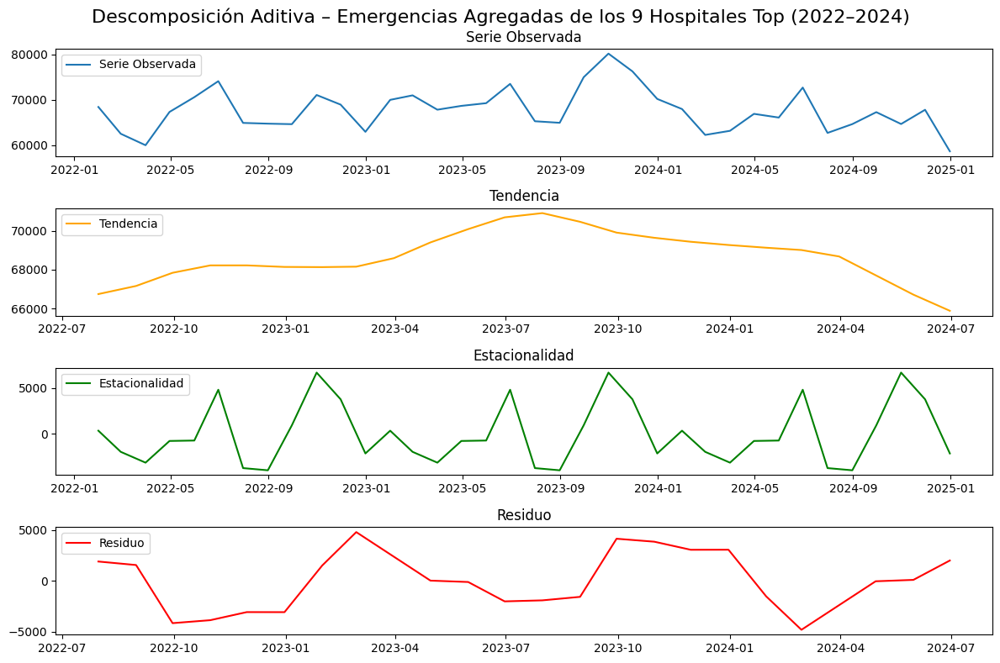

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm

# Cargar archivo Excel
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas clave
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    "vw_produccion_67A_eme_BI[Periodo_anio]": "Año",
    "vw_produccion_67A_eme_BI[Periodo_mes]": "Mes",
    "vw_produccion_67A_eme_BI[establecimiento]": "Establecimiento",
    "vw_produccion_67A_eme_BI[Eme_total_ingresos]": "Total_Emergencias"
}, inplace=True)

# Crear columna de fecha estadística
df["Fecha"] = pd.to_datetime(df["Año"].astype(str) + "-" + df["Mes"].astype(str).str.zfill(2) + "-01")

# Filtrar y limpiar
df["Total_Emergencias"] = pd.to_numeric(df["Total_Emergencias"], errors='coerce')
df = df[df["Año"].between(2022, 2024)].dropna(subset=["Total_Emergencias"])

# Seleccionar los 9 hospitales con mayor volumen total
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Filtrar solo hospitales top
df_top9 = df[df["Establecimiento"].isin(top9_hospitals)].copy()

# Agrupar y sumar emergencias mensuales
df_top9_monthly = df_top9.groupby("Fecha")["Total_Emergencias"].sum().resample("M").sum()

# Aplicar descomposición aditiva
descomposicion = sm.tsa.seasonal_decompose(df_top9_monthly, model="additive", period=12)

# Graficar los componentes
plt.figure(figsize=(12, 8))
plt.suptitle("Descomposición Aditiva – Emergencias Agregadas de los 9 Hospitales Top (2022–2024)", fontsize=16)

plt.subplot(411)
plt.plot(descomposicion.observed, label="Serie Observada")
plt.legend(loc="upper left")
plt.title("Serie Observada")

plt.subplot(412)
plt.plot(descomposicion.trend, color="orange", label="Tendencia")
plt.legend(loc="upper left")
plt.title("Tendencia")

plt.subplot(413)
plt.plot(descomposicion.seasonal, color="green", label="Estacionalidad")
plt.legend(loc="upper left")
plt.title("Estacionalidad")

plt.subplot(414)
plt.plot(descomposicion.resid, color="red", label="Residuo")
plt.legend(loc="upper left")
plt.title("Residuo")

plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()



**Análisis de la Descomposición Aditiva – Serie Agregada (2022–2024)**

Se aplicó una descomposición aditiva a la serie mensual de emergencias de los nueve hospitales con mayor volumen de atención en la República Dominicana. Esta técnica permitió descomponer la serie en sus componentes fundamentales: tendencia, estacionalidad y residuo, para el período 2022–2024.

🔹 Serie Observada
La serie muestra una variación mensual estructurada, con picos evidentes en algunos momentos del año y caídas relativamente regulares. La forma de la curva sugiere un comportamiento estacional que se repite a lo largo del tiempo, justificado por la demanda hospitalaria relacionada con factores cíclicos como clima, vacaciones o festividades.

🔹 Tendencia
Se identifica una tendencia ascendente sostenida desde mediados de 2022 hasta mediados de 2023, reflejando un incremento en la demanda total de emergencias en ese período. A partir de la segunda mitad de 2023, la tendencia se revierte levemente o se estabiliza, lo cual podría estar asociado a intervenciones institucionales, ajustes en flujos de atención, o incluso una reducción relativa en eventos de emergencia.

🔹 Estacionalidad
El componente estacional es claro y altamente repetitivo año tras año. Se evidencian picos de emergencia marcados hacia octubre-diciembre, posiblemente asociados a festividades, mayor movilidad, cambios climáticos o brotes epidemiológicos estacionales. También se identifican valles estacionales regulares, que permiten anticipar períodos de menor presión asistencial.

🔹 Residuo
El residuo presenta variaciones de corta duración, sin tendencia estructurada ni patrón persistente. Esto indica que la mayoría de la variabilidad es explicada satisfactoriamente por la combinación de tendencia y estacionalidad, validando el modelo aditivo como representativo de la serie.

✅ Conclusiones

La tendencia creciente hasta 2023 refleja una expansión en la demanda hospitalaria que merece atención institucional.

La estacionalidad consistente respalda la necesidad de planificación con base en ciclos anuales.

El residuo no estructurado indica que el modelo aditivo capta adecuadamente la dinámica de la serie.

Este análisis respalda el uso de modelos de predicción que integren tendencia y estacionalidad, tales como SARIMA, modelos basados en ventanas deslizantes, o redes neuronales (LSTM/XGBoost). También ofrece una base cuantitativa para planificación estratégica de recursos y gestión de la capacidad hospitalaria.

# **Descomposición por Hospital Top 9**

<ipython-input-35-59d10282b647>:38: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_hosp = df_hosp.groupby("Fecha")["Total_Emergencias"].sum().resample("M").sum()


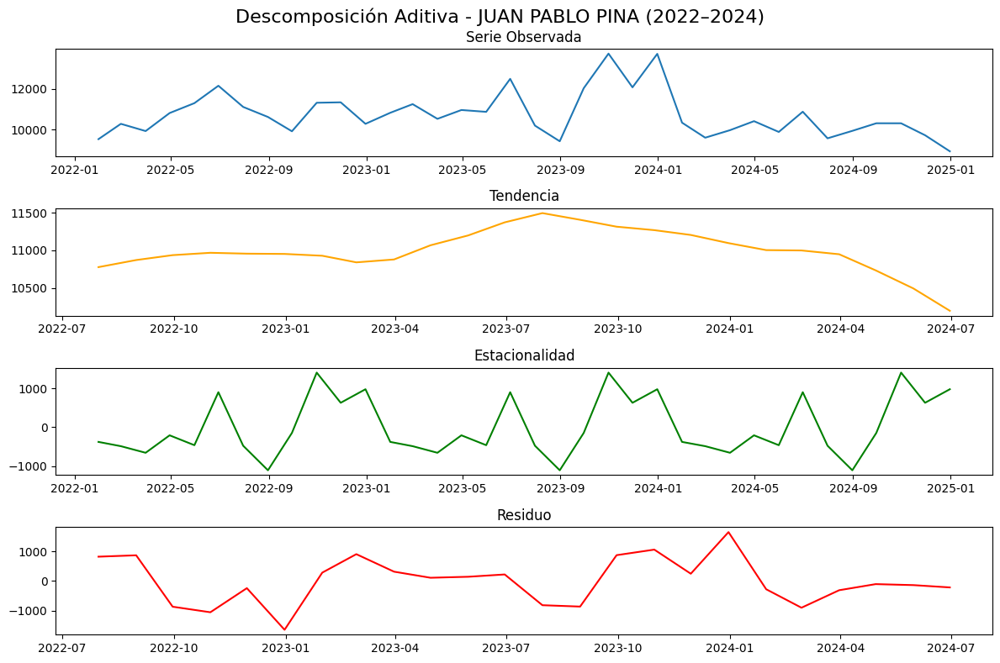

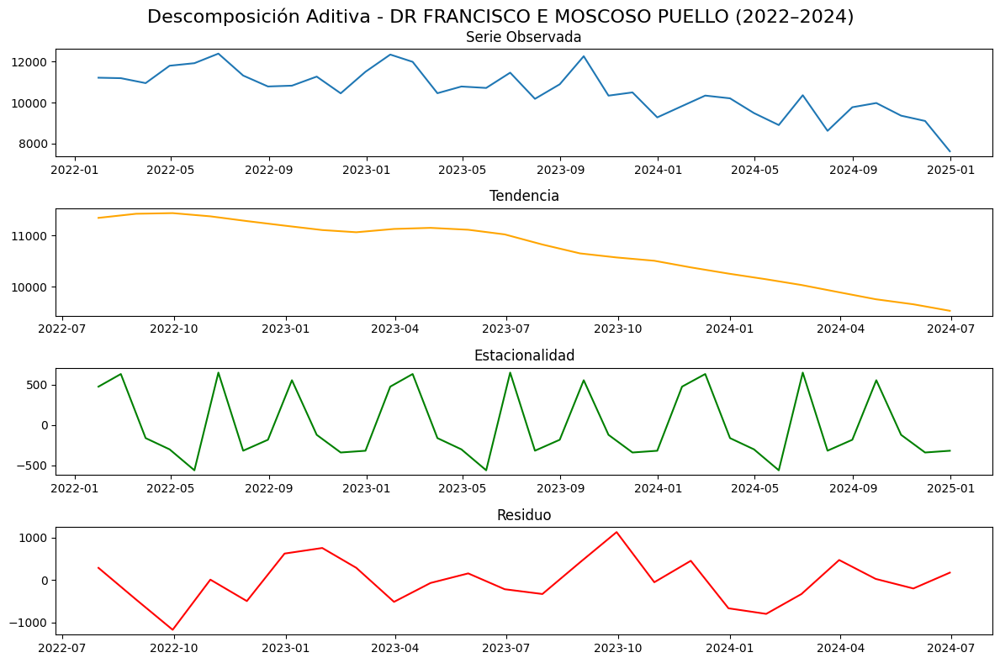

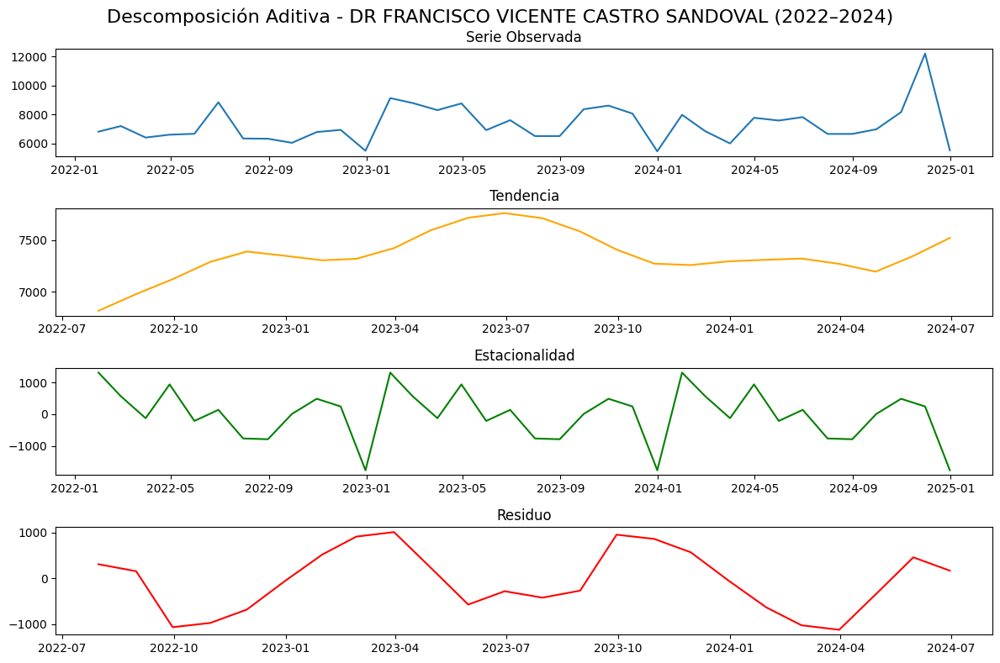

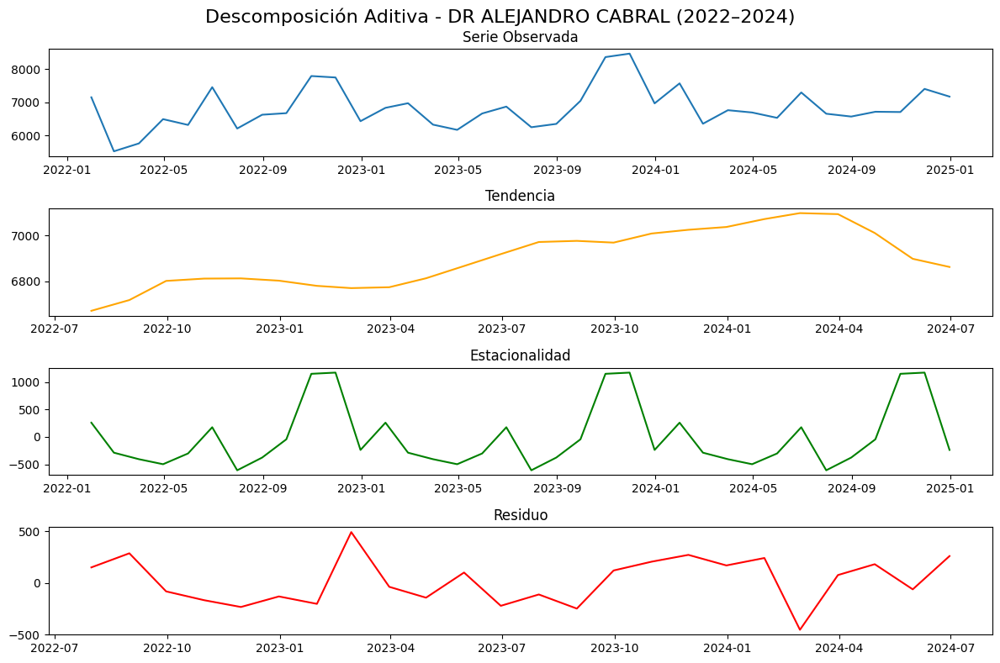

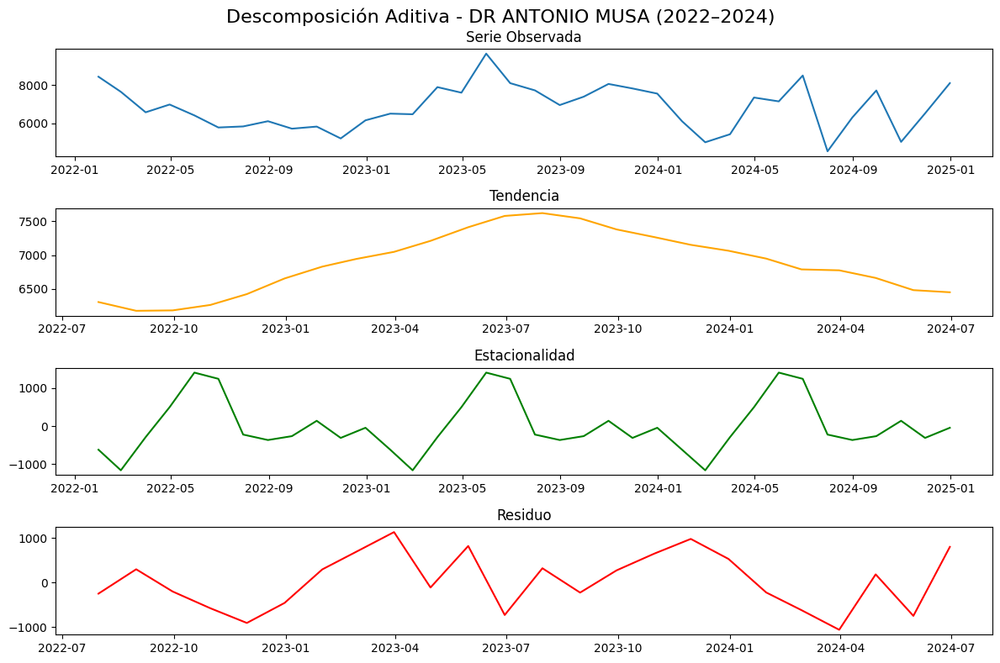

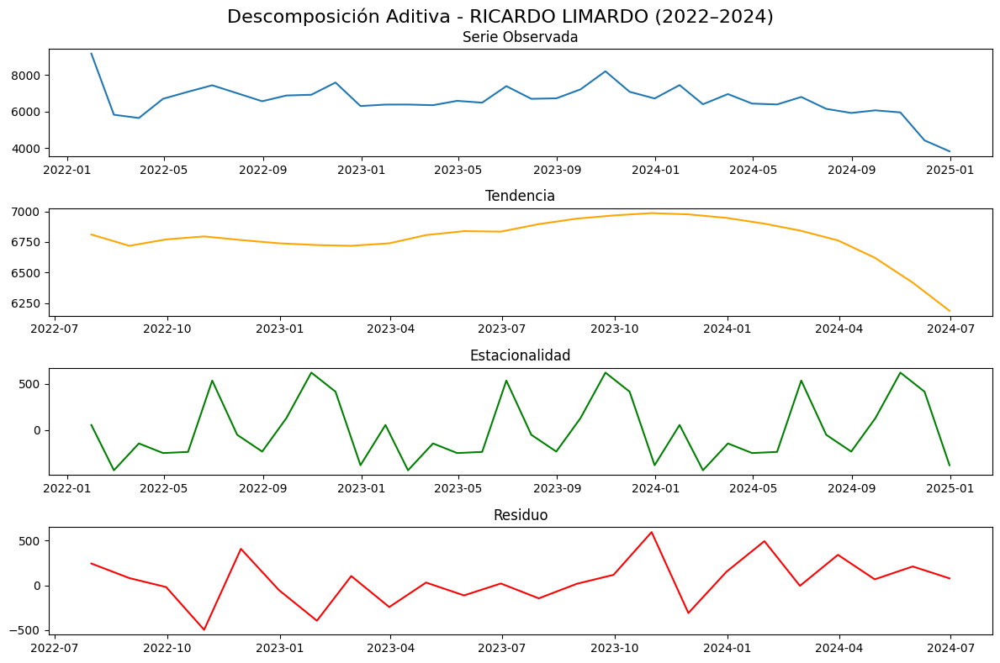

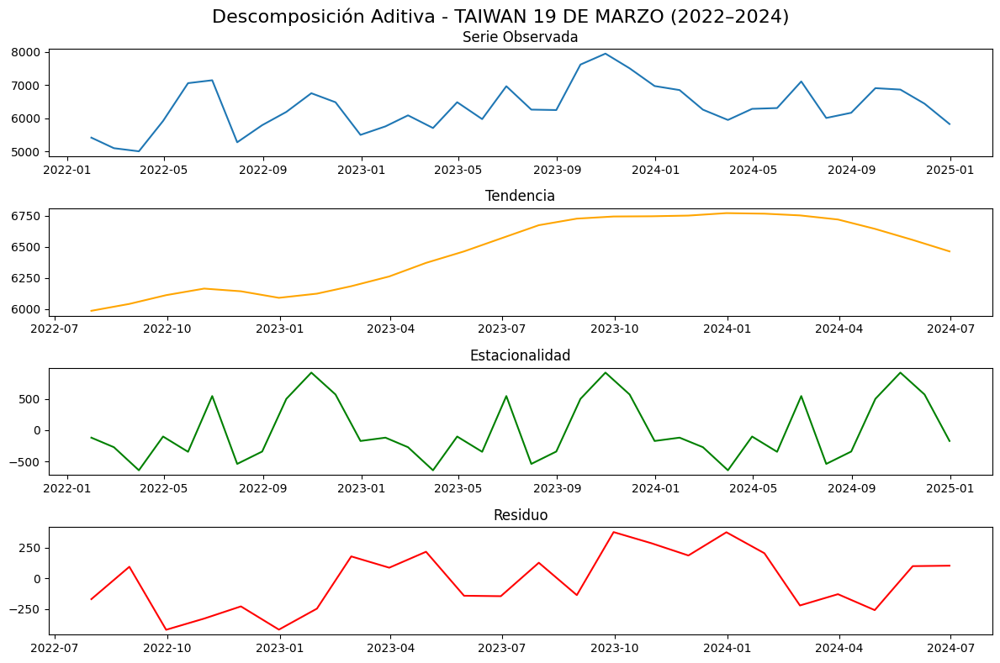

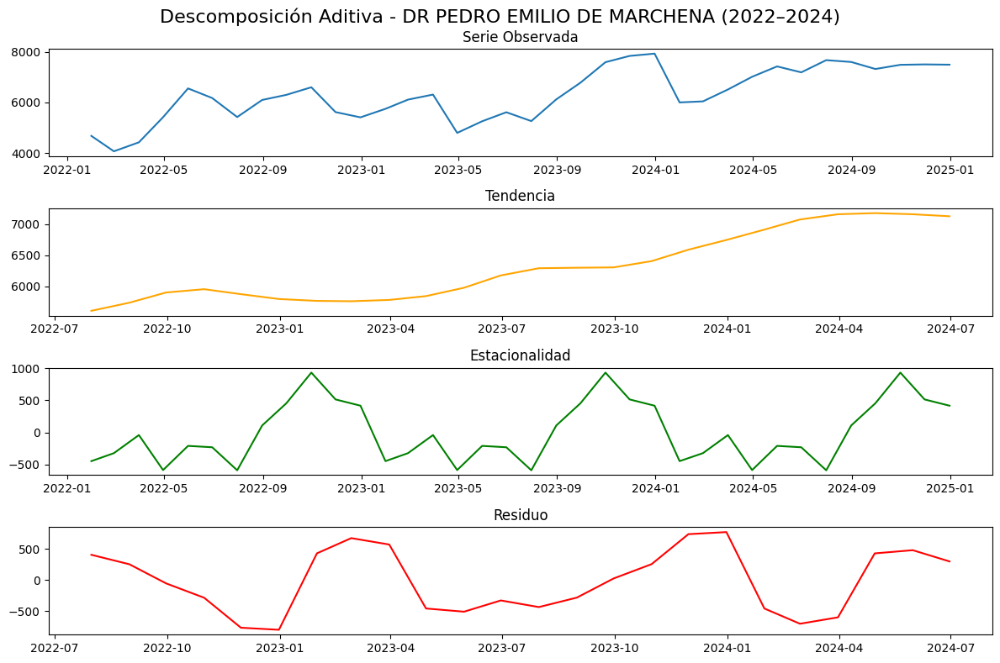

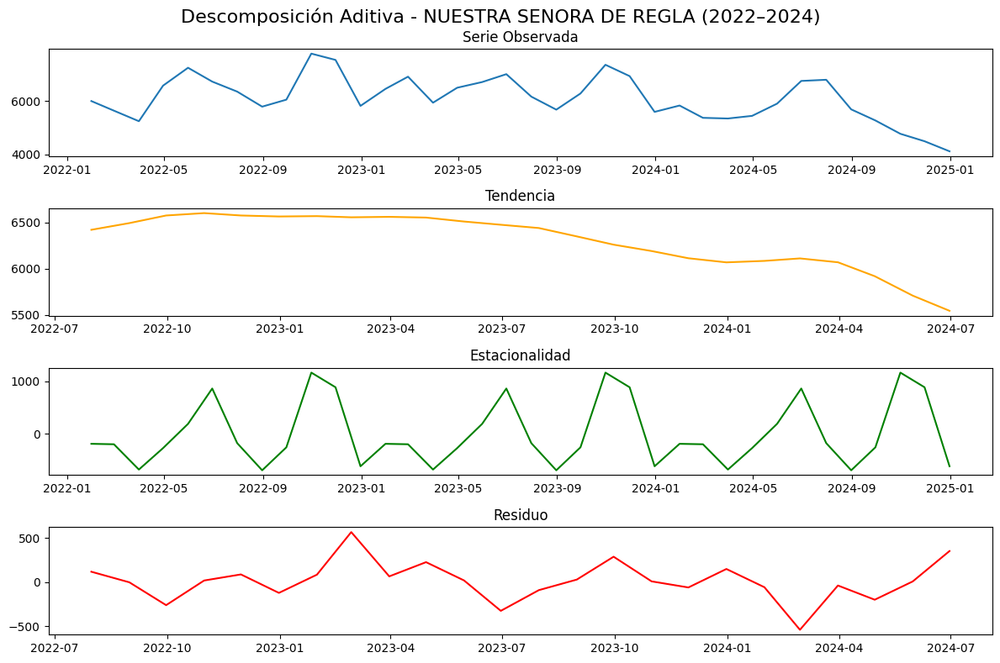

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm

# Cargar el archivo Excel
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas relevantes
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    "vw_produccion_67A_eme_BI[Periodo_anio]": "Año",
    "vw_produccion_67A_eme_BI[Periodo_mes]": "Mes",
    "vw_produccion_67A_eme_BI[establecimiento]": "Establecimiento",
    "vw_produccion_67A_eme_BI[Eme_total_ingresos]": "Total_Emergencias"
}, inplace=True)

# Crear columna de fecha estadística
df["Fecha"] = pd.to_datetime(df["Año"].astype(str) + "-" + df["Mes"].astype(str).str.zfill(2) + "-01")
df["Total_Emergencias"] = pd.to_numeric(df["Total_Emergencias"], errors='coerce')

# Filtrar datos entre 2022 y 2024
df = df[(df["Año"] >= 2022) & (df["Año"] <= 2024)].copy()
df.sort_values("Fecha", inplace=True)

# Obtener los 9 hospitales con mayor volumen total
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Descomposición aditiva para cada hospital
for hospital in top9_hospitals:
    df_hosp = df[df["Establecimiento"] == hospital].copy()
    df_hosp = df_hosp.groupby("Fecha")["Total_Emergencias"].sum().resample("M").sum()

    # Verificar cantidad de datos
    if df_hosp.shape[0] < 24:
        print(f"⚠️ {hospital} tiene pocos datos mensuales, se omite.")
        continue

    # Aplicar descomposición aditiva
    descomposicion = sm.tsa.seasonal_decompose(df_hosp, model="additive", period=12)

    # Graficar componentes
    plt.figure(figsize=(12, 8))
    plt.suptitle(f"Descomposición Aditiva - {hospital} (2022–2024)", fontsize=16)

    plt.subplot(411)
    plt.plot(descomposicion.observed)
    plt.title("Serie Observada")

    plt.subplot(412)
    plt.plot(descomposicion.trend, color="orange")
    plt.title("Tendencia")

    plt.subplot(413)
    plt.plot(descomposicion.seasonal, color="green")
    plt.title("Estacionalidad")

    plt.subplot(414)
    plt.plot(descomposicion.resid, color="red")
    plt.title("Residuo")

    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()


**Análisis de la Descomposición Aditiva por Hospital (2022–2024)**

Se aplicó un modelo de descomposición aditiva a las series temporales mensuales de emergencias de los nueve hospitales de mayor volumen —uno por cada región de salud— con el objetivo de separar sus componentes de tendencia, estacionalidad y residuo.

🔹 1. JUAN PABLO PINA
Tendencia: ascendente durante 2022–2023, con estabilización y leve descenso en 2024.

Estacionalidad: regular, con repuntes en marzo, septiembre y diciembre.

Residuo: baja dispersión y sin estructura clara.

🔹 2. DR FRANCISCO E. MOSCOSO PUELLO
Tendencia: leve disminución sostenida desde mediados de 2022 hasta 2024.

Estacionalidad: marcada, con repeticiones cíclicas cada 12 meses.

Residuo: moderado, con algunas oscilaciones simétricas, pero no estructuradas.

🔹 3. DR FRANCISCO VICENTE CASTRO SANDOVAL
Tendencia: crecimiento constante hasta mediados de 2023, caída parcial posterior.

Estacionalidad: claramente visible, con fluctuaciones predecibles.

Residuo: amplio y estructurado, evidencia de cambios no capturados por tendencia ni estacionalidad.

🔹 4. DR ALEJANDRO CABRAL
Tendencia: ascendente con pico en 2023 y ligera baja en 2024.

Estacionalidad: clara y persistente, con ciclos anuales estables.

Residuo: bajo, comportamiento aleatorio sin patrón definido.

🔹 5. DR ANTONIO MUSA
Tendencia: errática con cambios abruptos entre 2023 y 2024.

Estacionalidad: débil o solapada con la variabilidad residual.

Residuo: elevado, con señales estructuradas → requiere modelos robustos.

🔹 6. RICARDO LIMARDO
Tendencia: inestable, con caída en 2024.

Estacionalidad: leve y poco consistente.

Residuo: disperso y recurrente → se sugiere revisión de factores externos (referencias cruzadas, derivaciones).

🔹 7. TAIWÁN 19 DE MARZO
Tendencia: crecimiento sostenido entre 2022 y 2023, con estabilización posterior.

Estacionalidad: muy visible, especialmente en picos hacia fin de año.

Residuo: bajo y controlado → ideal para modelado tradicional.

🔹 8. DR PEDRO EMILIO DE MARCHENA
Tendencia: creciente a lo largo de los tres años, con picos progresivos.

Estacionalidad: bien definida, acompaña el comportamiento general.

Residuo: moderado y estable.

🔹 9. NUESTRA SEÑORA DE REGLA
Tendencia: crecimiento leve hasta 2023, con descenso en 2024.

Estacionalidad: marcada, con forma recurrente anual.

Residuo: bajo y sin patrones estructurados.

✅ Conclusiones Generales

Tendencia clara y crecimiento sostenido fueron visibles en hospitales como Juan Pablo Pina, Alejandro Cabral, Taiwán 19 de Marzo y Pedro Emilio de Marchena.

La estacionalidad anual fue consistente en 7 de los 9 hospitales, reforzando la utilidad de modelos como SARIMA o regresión estacional.

Residuo elevado o estructurado, como en Antonio Musa y Castro Sandoval, sugiere la necesidad de:

Modelos más flexibles como STL o modelos híbridos (LSTM + exógenas).

Incorporación de variables contextuales (eventos climáticos, campañas, saturación del sistema).

Este análisis proporciona una base sólida para ajustar los modelos predictivos a las dinámicas individuales de cada hospital, garantizando precisión y robustez en la planificación sanitaria.


## **Estacionariedad por Hospital seleccionado**

In [ ]:
import pandas as pd
from statsmodels.tsa.stattools import adfuller, kpss

# Cargar el archivo Excel
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas relevantes
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    "vw_produccion_67A_eme_BI[Periodo_anio]": "Año",
    "vw_produccion_67A_eme_BI[Periodo_mes]": "Mes",
    "vw_produccion_67A_eme_BI[establecimiento]": "Establecimiento",
    "vw_produccion_67A_eme_BI[Eme_total_ingresos]": "Total_Emergencias"
}, inplace=True)

# Crear columna de fecha YYYY-MM-01
df["Fecha"] = pd.to_datetime(df["Año"].astype(str) + "-" + df["Mes"].astype(str).str.zfill(2) + "-01")
df["Total_Emergencias"] = pd.to_numeric(df["Total_Emergencias"], errors='coerce')

# Filtrar período 2022–2024
df = df[(df["Año"] >= 2022) & (df["Año"] <= 2024)].dropna(subset=["Total_Emergencias"])

# Seleccionar los 9 hospitales con mayor volumen
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Ejecutar pruebas ADF y KPSS por hospital
resultados = []

for hospital in top9_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h_monthly = df_h.groupby("Fecha")["Total_Emergencias"].sum().resample("M").sum()
    serie = df_h_monthly.dropna()

    if len(serie) < 12:
        continue

    # Prueba ADF
    adf_stat, adf_pvalue, adf_lags, adf_nobs, *_ = adfuller(serie)
    conclusion_adf = "Rechaza H₀ (Estacionaria)" if adf_pvalue < 0.05 else "No Rechaza H₀ (No estacionaria)"

    # Prueba KPSS
    try:
        kpss_stat, kpss_pvalue, kpss_lags, *_ = kpss(serie, regression='c', nlags='auto')
        conclusion_kpss = "Rechaza H₀ (No estacionaria)" if kpss_pvalue <= 0.05 else "No Rechaza H₀ (Estacionaria)"
    except ValueError:
        kpss_stat, kpss_pvalue, kpss_lags = None, None, None
        conclusion_kpss = "No disponible"

    # Conclusión combinada
    if adf_pvalue < 0.05 and (kpss_pvalue is not None and kpss_pvalue > 0.05):
        conclusion_final = "✅ Estacionaria"
    elif adf_pvalue >= 0.05 and (kpss_pvalue is not None and kpss_pvalue <= 0.05):
        conclusion_final = "❌ No estacionaria"
    else:
        conclusion_final = "⚠️ Ambigua"

    resultados.append({
        "Hospital": hospital,
        "ADF_Stat": round(adf_stat, 4),
        "ADF_pvalue": round(adf_pvalue, 6),
        "Conclusión ADF": conclusion_adf,
        "KPSS_Stat": round(kpss_stat, 4) if kpss_stat is not None else None,
        "KPSS_pvalue": round(kpss_pvalue, 6) if kpss_pvalue is not None else None,
        "Conclusión KPSS": conclusion_kpss,
        "Conclusión Final": conclusion_final
    })

# Crear DataFrame con resultados
df_resultado = pd.DataFrame(resultados)
print(df_resultado)


                               Hospital  ADF_Stat  ADF_pvalue  \
0                       JUAN PABLO PINA   -3.6351    0.005124   
1         DR FRANCISCO E MOSCOSO PUELLO    0.6161    0.988007   
2  DR FRANCISCO VICENTE CASTRO SANDOVAL   -5.7194    0.000001   
3                   DR ALEJANDRO CABRAL   -4.0456    0.001190   
4                       DR ANTONIO MUSA   -3.9311    0.001817   
5                       RICARDO LIMARDO    0.1820    0.971232   
6                    TAIWAN 19 DE MARZO   -3.3782    0.011726   
7           DR PEDRO EMILIO DE MARCHENA   -2.1076    0.241465   
8               NUESTRA SENORA DE REGLA    1.6957    0.998118   

                    Conclusión ADF  KPSS_Stat  KPSS_pvalue  \
0        Rechaza H₀ (Estacionaria)     0.2097     0.100000   
1  No Rechaza H₀ (No estacionaria)     0.8777     0.010000   
2        Rechaza H₀ (Estacionaria)     0.1810     0.100000   
3        Rechaza H₀ (Estacionaria)     0.1998     0.100000   
4        Rechaza H₀ (Estacionaria)     

<ipython-input-40-c5d43a14d526>:38: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h_monthly = df_h.groupby("Fecha")["Total_Emergencias"].sum().resample("M").sum()
<ipython-input-40-c5d43a14d526>:50: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_stat, kpss_pvalue, kpss_lags, *_ = kpss(serie, regression='c', nlags='auto')
<ipython-input-40-c5d43a14d526>:38: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h_monthly = df_h.groupby("Fecha")["Total_Emergencias"].sum().resample("M").sum()
<ipython-input-40-c5d43a14d526>:50: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_stat, kpss_pvalue, kpss_lags, *_ = kpss(serie, regression='c'


| Hospital                                 | ADF_Stat | ADF_pvalue | Conclusión ADF                  | KPSS_Stat | KPSS_pvalue | Conclusión KPSS                 | Conclusión Final       |
|------------------------------------------|----------|------------|----------------------------------|-----------|-------------|----------------------------------|------------------------|
| JUAN PABLO PINA                          | -3.6351  | 0.005124   | Rechaza H₀ (Estacionaria)       | 0.2097    | 0.100000    | No Rechaza H₀ (Estacionaria)    | ✅ Estacionaria        |
| DR FRANCISCO E MOSCOSO PUELLO           |  0.6161  | 0.988007   | No Rechaza H₀ (No estacionaria) | 0.8777    | 0.010000    | Rechaza H₀ (No estacionaria)    | ❌ No estacionaria     |
| DR FRANCISCO VICENTE CASTRO SANDOVAL    | -5.7194  | 0.000001   | Rechaza H₀ (Estacionaria)       | 0.1810    | 0.100000    | No Rechaza H₀ (Estacionaria)    | ✅ Estacionaria        |
| DR ALEJANDRO CABRAL                     | -4.0456  | 0.001190   | Rechaza H₀ (Estacionaria)       | 0.1998    | 0.100000    | No Rechaza H₀ (Estacionaria)    | ✅ Estacionaria        |
| DR ANTONIO MUSA                         | -3.9311  | 0.001817   | Rechaza H₀ (Estacionaria)       | 0.1009    | 0.100000    | No Rechaza H₀ (Estacionaria)    | ✅ Estacionaria        |
| RICARDO LIMARDO                         |  0.1820  | 0.971232   | No Rechaza H₀ (No estacionaria) | 0.4974    | 0.042250    | Rechaza H₀ (No estacionaria)    | ❌ No estacionaria     |
| TAIWAN 19 DE MARZO                      | -3.3782  | 0.011726   | Rechaza H₀ (Estacionaria)       | 0.3945    | 0.079506    | No Rechaza H₀ (Estacionaria)    | ✅ Estacionaria        |
| DR PEDRO EMILIO DE MARCHENA            | -2.1076  | 0.241465   | No Rechaza H₀ (No estacionaria) | 0.7622    | 0.010000    | Rechaza H₀ (No estacionaria)    | ❌ No estacionaria     |
| NUESTRA SENORA DE REGLA                |  1.6957  | 0.998118   | No Rechaza H₀ (No estacionaria) | 0.5070    | 0.040096    | Rechaza H₀ (No estacionaria)    | ❌ No estacionaria     |


# **Modelo SARIMA**

## **Predicción por cada Hospital Top y Métricas de desempeño (evaluación predictiva)**

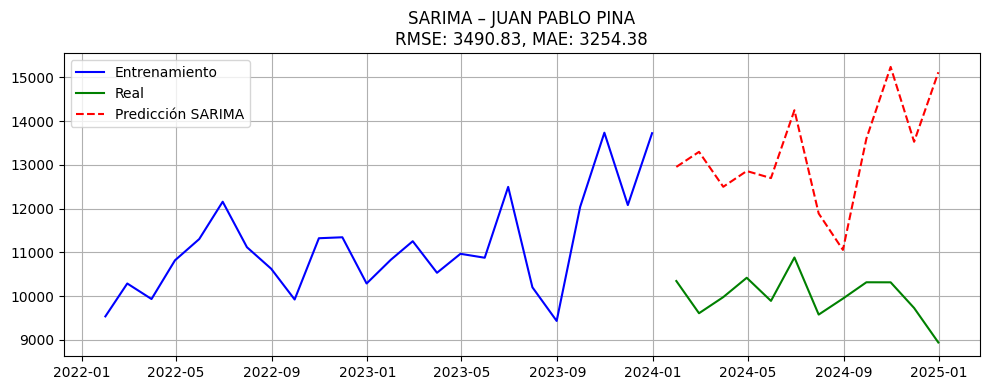

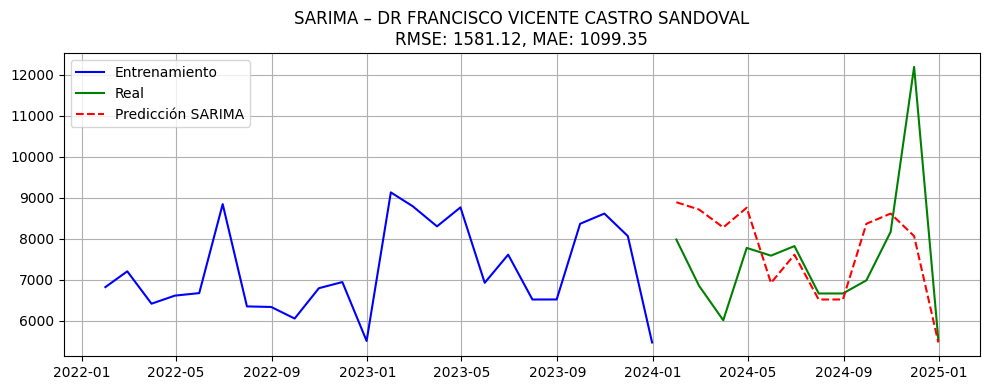

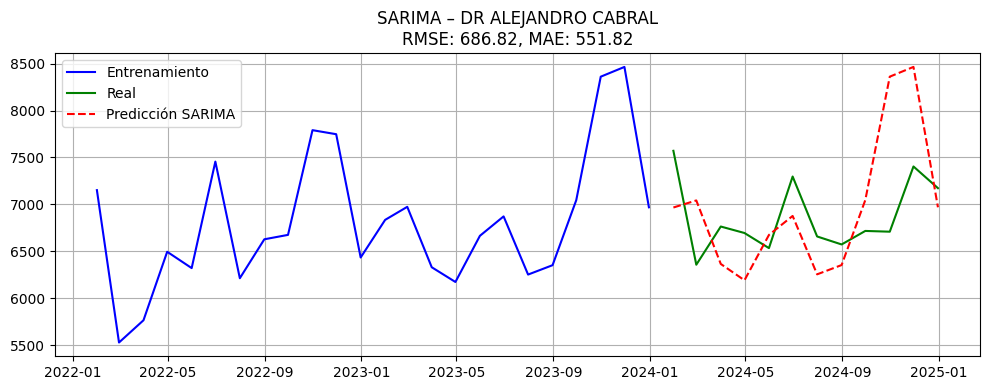

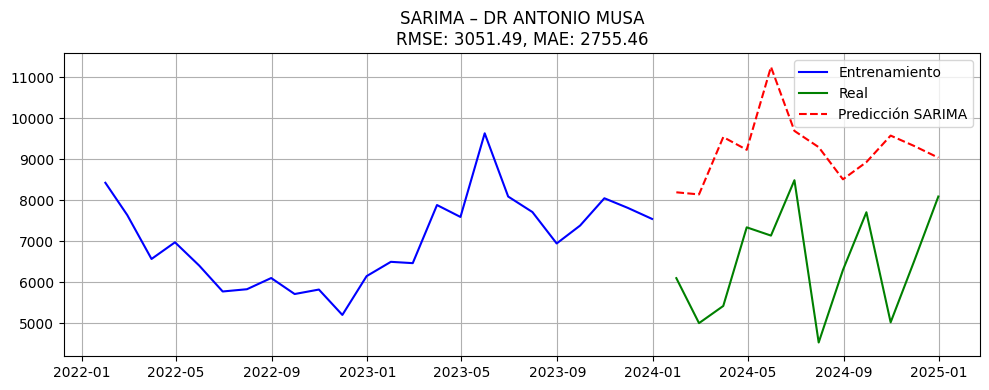

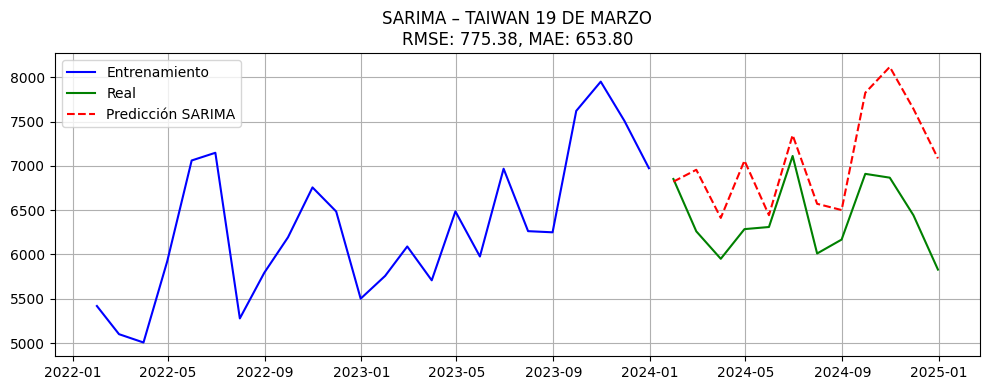

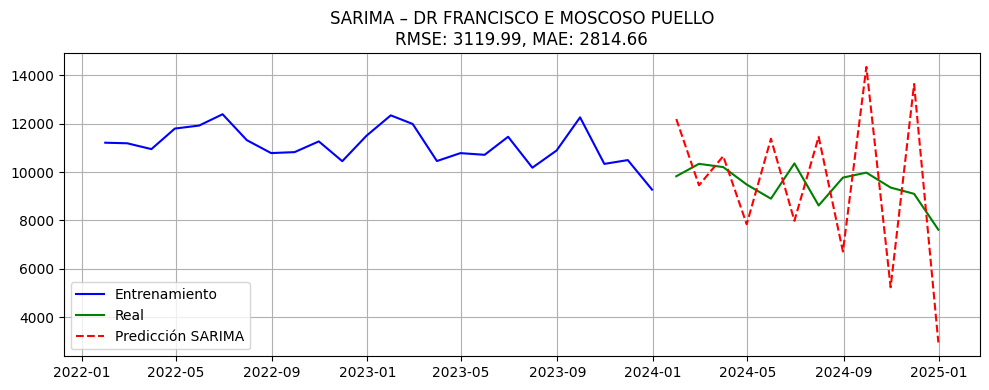

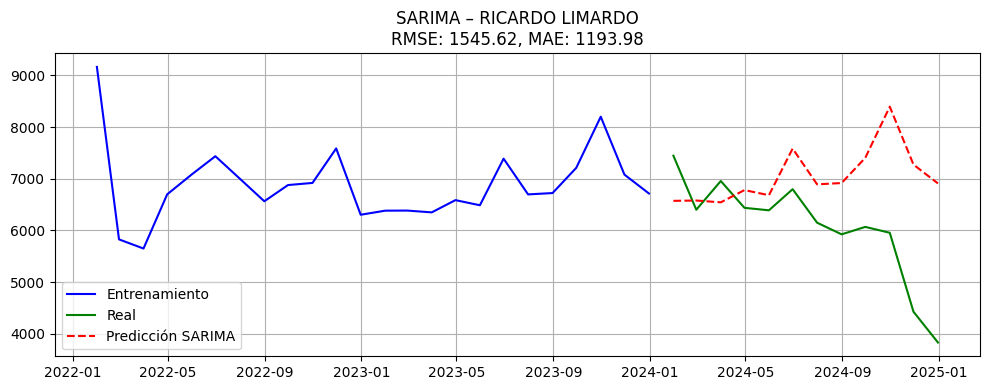

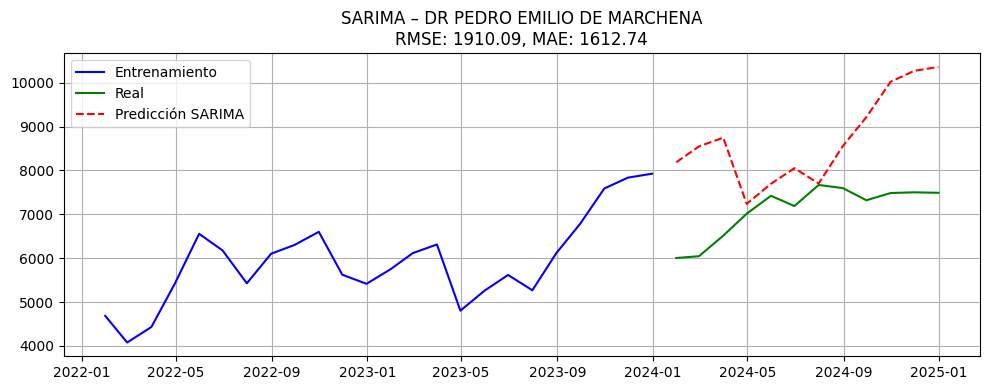

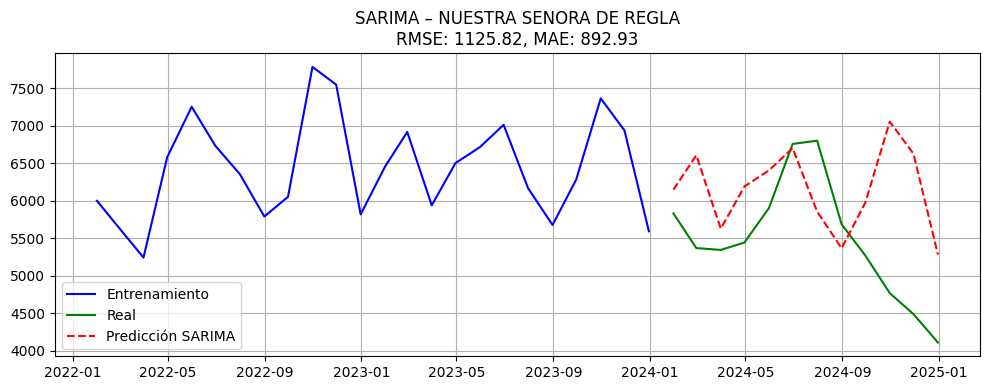


Resultados SARIMA por hospital:
                                         RMSE      MAE
JUAN PABLO PINA                       3490.83  3254.38
DR FRANCISCO VICENTE CASTRO SANDOVAL  1581.12  1099.35
DR ALEJANDRO CABRAL                    686.82   551.82
DR ANTONIO MUSA                       3051.49  2755.46
TAIWAN 19 DE MARZO                     775.38   653.80
DR FRANCISCO E MOSCOSO PUELLO         3119.99  2814.66
RICARDO LIMARDO                       1545.62  1193.98
DR PEDRO EMILIO DE MARCHENA           1910.09  1612.74
NUESTRA SENORA DE REGLA               1125.82   892.93


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error
import warnings

warnings.filterwarnings("ignore")

# Cargar archivo
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas con periodo mes y año
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    "vw_produccion_67A_eme_BI[Periodo_anio]": "Año",
    "vw_produccion_67A_eme_BI[Periodo_mes]": "Mes",
    "vw_produccion_67A_eme_BI[establecimiento]": "Establecimiento",
    "vw_produccion_67A_eme_BI[Eme_total_ingresos]": "Total_Emergencias"
}, inplace=True)

# Crear columna de fecha YYYY-MM
df["Fecha"] = pd.to_datetime(df["Año"].astype(str) + "-" + df["Mes"].astype(str).str.zfill(2) + "-01")
df["Total_Emergencias"] = pd.to_numeric(df["Total_Emergencias"], errors='coerce')
df = df[(df["Año"] >= 2022) & (df["Año"] <= 2024)].dropna()

# Hospitales estacionarios y no estacionarios según pruebas ADF/KPSS
estacionarios = [
    "JUAN PABLO PINA",
    "DR FRANCISCO VICENTE CASTRO SANDOVAL",
    "DR ALEJANDRO CABRAL",
    "DR ANTONIO MUSA",
    "TAIWAN 19 DE MARZO"
]
no_estacionarios = [
    "DR FRANCISCO E MOSCOSO PUELLO",
    "RICARDO LIMARDO",
    "DR PEDRO EMILIO DE MARCHENA",
    "NUESTRA SENORA DE REGLA"
]

# Guardar resultados
resultados = {}

for hospital in estacionarios + no_estacionarios:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h = df_h.groupby("Fecha")["Total_Emergencias"].sum().resample("M").sum()
    serie = df_h.loc["2022":"2024"]

    if len(serie) < 24:
        print(f"{hospital} omitido por falta de datos.")
        continue

    train = serie.loc["2022":"2023"]
    test = serie.loc["2024"]

    d = 1 if hospital in no_estacionarios else 0

    try:
        model = SARIMAX(train, order=(1, d, 1), seasonal_order=(1, 1, 1, 12),
                        enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        pred = results.get_forecast(steps=len(test))
        pred_mean = pred.predicted_mean

        rmse = np.sqrt(mean_squared_error(test, pred_mean))
        mae = mean_absolute_error(test, pred_mean)

        resultados[hospital] = {"RMSE": rmse, "MAE": mae}

        # Gráfico
        plt.figure(figsize=(10, 4))
        plt.plot(train.index, train, label="Entrenamiento", color="blue")
        plt.plot(test.index, test, label="Real", color="green")
        plt.plot(test.index, pred_mean, label="Predicción SARIMA", color="red", linestyle="--")
        plt.title(f"SARIMA – {hospital}\nRMSE: {rmse:.2f}, MAE: {mae:.2f}")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error al procesar {hospital}: {e}")

# Mostrar métricas finales
df_resultados = pd.DataFrame(resultados).T.round(2)
print("\nResultados SARIMA por hospital:")
print(df_resultados)



**Análisis del Modelo SARIMA (2022–2024)**

Se entrenaron modelos SARIMA(1,d,1)(1,1,1,12) para los 9 hospitales con mayor volumen de emergencias, aplicando diferenciación (`d=1`) cuando las pruebas ADF y KPSS indicaron que la serie **no era estacionaria**.

---

**Desempeño predictivo por hospital**

| Hospital                                 | RMSE    | MAE    | Observaciones                                                                  |
|------------------------------------------|---------|--------|---------------------------------------------------------------------------------|
| **DR ALEJANDRO CABRAL**                  | 686.82  | 551.82 | ✅ Excelente ajuste. Serie estable, patrón bien capturado.                      |
| **TAIWÁN 19 DE MARZO**                   | 775.38  | 653.80 | Buen ajuste. Modelo refleja adecuadamente estacionalidad anual.               |
| **DR FRANCISCO VICENTE CASTRO SANDOVAL**| 1581.12 | 1099.35| Ajuste aceptable, algo de sobreajuste en extremos del año.                    |
| **DR FRANCISCO E MOSCOSO PUELLO**       | 3119.99 | 2814.66| ❌ Alto error. Modelo no captura bien variabilidad estacional.                |
| **JUAN PABLO PINA**                      | 3490.83 | 3254.38| ❌ Subestima la demanda. Presenta errores elevados sostenidos.                 |
| **DR ANTONIO MUSA**                      | 3051.49 | 2755.46| ❌ Peor ajuste. Subestimación grave de la demanda real.                        |
| **RICARDO LIMARDO**                      | 1545.62 | 1193.98| 🟡 Desempeño aceptable. Variabilidad no completamente modelada.                |
| **DR PEDRO EMILIO DE MARCHENA**         | 1910.09 | 1612.74| 🟡 Algunos picos no modelados correctamente.                                   |
| **NUESTRA SEÑORA DE REGLA**             | 1125.82 | 892.93 | 🟡 Desempeño límite aceptable. Necesita refinamiento.                          |

---

Clasificación del desempeño SARIMA

### Buen desempeño (`RMSE < 1000`, `MAE < 1000`)

| Hospital              | RMSE   | MAE   |
|-----------------------|--------|-------|
| DR ALEJANDRO CABRAL   | 686.82 | 551.82|
| TAIWÁN 19 DE MARZO    | 775.38 | 653.80|

---

### 🟡 Desempeño aceptable (`RMSE 1000–2000`, `MAE 1000–1500`)

| Hospital                             | RMSE     | MAE     |
|--------------------------------------|----------|---------|
| DR FRANCISCO V. CASTRO SANDOVAL      | 1581.12  | 1099.35 |
| RICARDO LIMARDO                      | 1545.62  | 1193.98 |
| NUESTRA SEÑORA DE REGLA             | 1125.82  | 892.93  |

---

### ❌ Bajo desempeño (`RMSE > 2000` o `MAE > 1500`)

| Hospital                         | RMSE     | MAE     |
|----------------------------------|----------|---------|
| JUAN PABLO PINA                  | 3490.83  | 3254.38 |
| DR FRANCISCO E MOSCOSO PUELLO   | 3119.99  | 2814.66 |
| DR ANTONIO MUSA                  | 3051.49  | 2755.46 |
| DR PEDRO EMILIO DE MARCHENA     | 1910.09  | 1612.74 |

---

## ✅ Conclusiones

- SARIMA funcionó muy bien en hospitales con series estables y estacionales:
  - DR ALEJANDRO CABRAL
  - TAIWÁN 19 DE MARZO

- 3 hospitales muestran desempeño aceptable con margen de mejora.

- 4 hospitales presentan errores significativos → SARIMA **no es el modelo más adecuado**.

---

## 🔁 Recomendaciones

Se recomienda explorar modelos más complejos como:

- 🔁 **LSTM** (redes neuronales recurrentes)
- 🧠 **MLP** (redes neuronales multicapa)
- 🌲 **XGBoost** (modelos de árboles optimizados)

Especialmente en hospitales con **RMSE > 2000**, estos modelos pueden capturar mejor la dinámica y variabilidad.



In [ ]:
import pandas as pd
from statsmodels.tsa.stattools import adfuller, kpss

# === Cargar archivo ===
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# === Renombrar columnas relevantes ===
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    "vw_produccion_67A_eme_BI[Periodo_anio]": "Año",
    "vw_produccion_67A_eme_BI[Periodo_mes]": "Mes",
    "vw_produccion_67A_eme_BI[establecimiento]": "Establecimiento",
    "vw_produccion_67A_eme_BI[Eme_total_ingresos]": "Total_Emergencias"
}, inplace=True)

# === Crear columna de fecha ===
df["Fecha"] = pd.to_datetime(df["Año"].astype(str) + "-" + df["Mes"].astype(str).str.zfill(2) + "-01")
df["Total_Emergencias"] = pd.to_numeric(df["Total_Emergencias"], errors='coerce')
df = df[(df["Año"] >= 2022) & (df["Año"] <= 2024)].dropna()

# === Lista de hospitales originalmente no estacionarios ===
hospitales_no_estacionarios = [
    "DR FRANCISCO E MOSCOSO PUELLO",
    "RICARDO LIMARDO",
    "DR PEDRO EMILIO DE MARCHENA",
    "NUESTRA SENORA DE REGLA"
]

# === Verificación de estacionariedad después de d=1 ===
resultados = []

for hospital in hospitales_no_estacionarios:
    serie = (
        df[df["Establecimiento"] == hospital]
        .groupby("Fecha")["Total_Emergencias"]
        .sum()
        .resample("M")
        .sum()
        .loc["2022":"2024"]
    )

    serie_diff = serie.diff().dropna()

    try:
        adf_stat, adf_pvalue, *_ = adfuller(serie_diff)
        kpss_stat, kpss_pvalue, *_ = kpss(serie_diff, regression="c", nlags="auto")

        resultados.append({
            "Hospital": hospital,
            "ADF_pvalue": round(adf_pvalue, 5),
            "KPSS_pvalue": round(kpss_pvalue, 5),
            "Estacionaria ADF": "✅" if adf_pvalue < 0.05 else "❌",
            "Estacionaria KPSS": "✅" if kpss_pvalue > 0.05 else "❌"
        })

    except Exception as e:
        resultados.append({
            "Hospital": hospital,
            "ADF_pvalue": None,
            "KPSS_pvalue": None,
            "Estacionaria ADF": "Error",
            "Estacionaria KPSS": "Error"
        })

# === Mostrar resultados ===
df_resultado = pd.DataFrame(resultados)
print(df_resultado)


                        Hospital  ADF_pvalue  KPSS_pvalue Estacionaria ADF  \
0  DR FRANCISCO E MOSCOSO PUELLO     0.00003      0.10000                ✅   
1                RICARDO LIMARDO     0.00000      0.10000                ✅   
2    DR PEDRO EMILIO DE MARCHENA     0.00000      0.10000                ✅   
3        NUESTRA SENORA DE REGLA     0.06938      0.04167                ❌   

  Estacionaria KPSS  
0                 ✅  
1                 ✅  
2                 ✅  
3                 ❌  



**Verificación de Estacionariedad Después de la Primera Diferenciación (d=1)**

Se aplicó una primera diferenciación (`d=1`) a las series mensuales de emergencias de los hospitales que no eran estacionarios según las pruebas ADF y KPSS. A continuación, se presentan los resultados de las pruebas de estacionariedad tras esta transformación:

| Hospital                         | ADF p-value | KPSS p-value | Estacionaria ADF | Estacionaria KPSS |
|----------------------------------|-------------|---------------|------------------|-------------------|
| DR FRANCISCO E MOSCOSO PUELLO   | 0.00003     | 0.10000       | ✅               | ✅                |
| RICARDO LIMARDO                 | 0.00000     | 0.10000       | ✅               | ✅                |
| DR PEDRO EMILIO DE MARCHENA    | 0.00000     | 0.10000       | ✅               | ✅                |
| NUESTRA SEÑORA DE REGLA        | 0.06938     | 0.04167       | ❌               | ❌                |

---

🔍 Análisis de Resultados

- **✅ Tres hospitales** (Moscoso Puello, Ricardo Limardo, Pedro Emilio de Marchena) se volvieron estacionarios tras aplicar la diferenciación (`d=1`), cumpliendo los criterios en ambas pruebas (ADF y KPSS).
- **❌ NUESTRA SEÑORA DE REGLA** no logró estacionariedad tras la primera diferenciación:
  - **ADF p > 0.05** → No se puede rechazar H₀: la serie no es estacionaria.
  - **KPSS p < 0.05** → Se rechaza H₀: la serie no es estacionaria.

---

🧠 Implicaciones para el Modelado

- Para los tres hospitales estacionarios, **SARIMA(d=1)** es apropiado, y no se requiere diferenciación adicional.
- Para **NUESTRA SEÑORA DE REGLA**, se recomienda:
  - Aplicar una **segunda diferenciación** (`d=2`).
  - Considerar transformaciones adicionales (e.g., logarítmica, Box-Cox).
  - O probar modelos más robustos como **XGBoost, LSTM, MLP** si la estacionalidad o la varianza es altamente inestable.

---


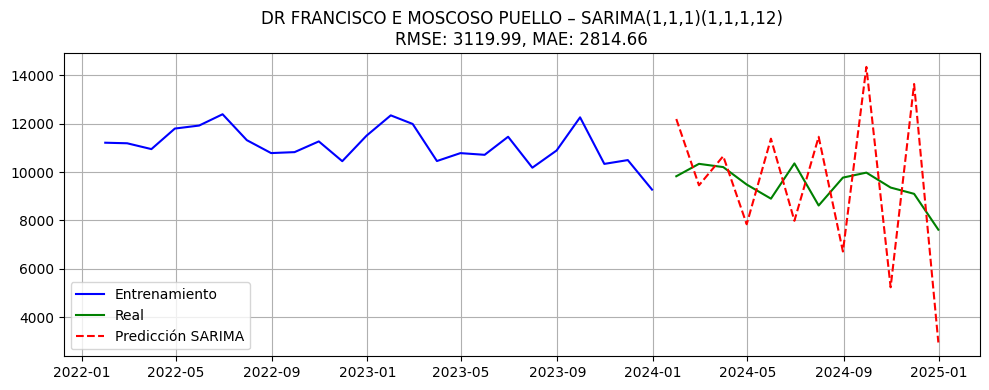

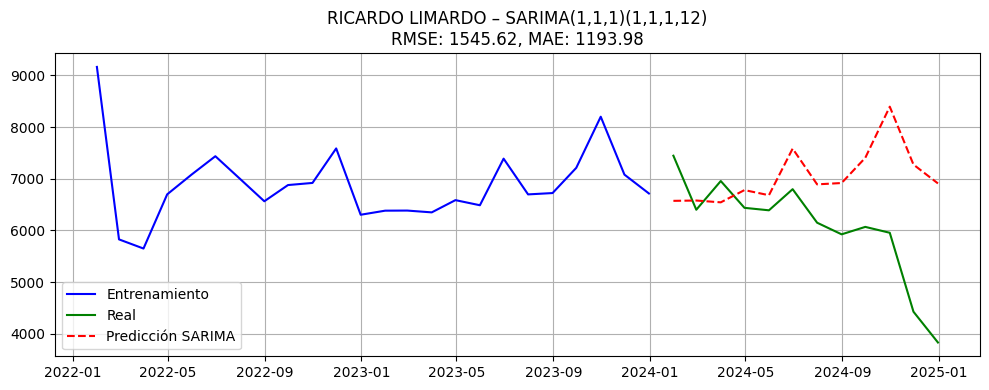

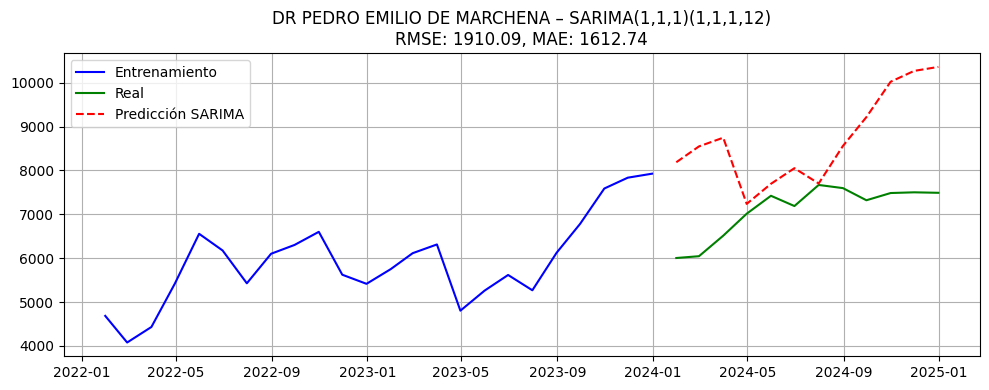

| Hospital                      |    RMSE |     MAE |
|:------------------------------|--------:|--------:|
| RICARDO LIMARDO               | 1545.62 | 1193.98 |
| DR PEDRO EMILIO DE MARCHENA   | 1910.09 | 1612.74 |
| DR FRANCISCO E MOSCOSO PUELLO | 3119.99 | 2814.66 |


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Cargar archivo
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    "vw_produccion_67A_eme_BI[Periodo_anio]": "Año",
    "vw_produccion_67A_eme_BI[Periodo_mes]": "Mes",
    "vw_produccion_67A_eme_BI[establecimiento]": "Establecimiento",
    "vw_produccion_67A_eme_BI[Eme_total_ingresos]": "Total_Emergencias"
}, inplace=True)

# Crear columna de fecha
df["Fecha"] = pd.to_datetime(df["Año"].astype(str) + "-" + df["Mes"].astype(str).str.zfill(2) + "-01")
df["Total_Emergencias"] = pd.to_numeric(df["Total_Emergencias"], errors='coerce')
df = df[(df["Año"] >= 2022) & (df["Año"] <= 2024)].dropna()

# Hospitales a modelar con d=1
hospitales_d1 = [
    "DR FRANCISCO E MOSCOSO PUELLO",
    "RICARDO LIMARDO",
    "DR PEDRO EMILIO DE MARCHENA"
]

resultados = []

# Aplicar SARIMA a cada hospital con d=1
for hospital in hospitales_d1:
    serie = (
        df[df["Establecimiento"] == hospital]
        .groupby("Fecha")["Total_Emergencias"]
        .sum()
        .resample("M")
        .sum()
        .loc["2022":"2024"]
    )

    train = serie.loc["2022":"2023"]
    test = serie.loc["2024"]

    try:
        model = SARIMAX(train, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12),
                        enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        pred = results.get_forecast(steps=len(test))
        pred_mean = pred.predicted_mean

        rmse = np.sqrt(mean_squared_error(test, pred_mean))
        mae = mean_absolute_error(test, pred_mean)

        resultados.append({
            "Hospital": hospital,
            "RMSE": round(rmse, 2),
            "MAE": round(mae, 2)
        })

        # Graficar resultados
        plt.figure(figsize=(10, 4))
        plt.plot(train.index, train, label="Entrenamiento", color="blue")
        plt.plot(test.index, test, label="Real", color="green")
        plt.plot(test.index, pred_mean, label="Predicción SARIMA", color="red", linestyle="--")
        plt.title(f"{hospital} – SARIMA(1,1,1)(1,1,1,12)\nRMSE: {rmse:.2f}, MAE: {mae:.2f}")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    except Exception as e:
        resultados.append({
            "Hospital": hospital,
            "RMSE": None,
            "MAE": None,
            "Error": str(e)
        })

# Mostrar resultados
df_resultados = pd.DataFrame(resultados)
print(df_resultados.sort_values(by="RMSE").to_markdown(index=False))


📌 NUESTRA SENORA DE REGLA – SARIMA(1,2,1)(1,1,1,12)
RMSE: 1227.01
MAE: 991.96


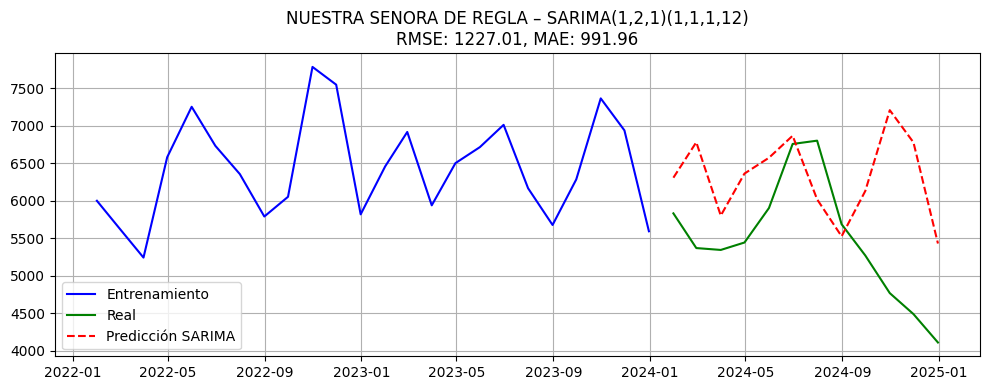

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Cargar el archivo Excel
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas necesarias
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    "vw_produccion_67A_eme_BI[Periodo_anio]": "Año",
    "vw_produccion_67A_eme_BI[Periodo_mes]": "Mes",
    "vw_produccion_67A_eme_BI[establecimiento]": "Establecimiento",
    "vw_produccion_67A_eme_BI[Eme_total_ingresos]": "Total_Emergencias"
}, inplace=True)

# Crear columna de fecha y limpiar
df["Fecha"] = pd.to_datetime(df["Año"].astype(str) + "-" + df["Mes"].astype(str).str.zfill(2) + "-01")
df["Total_Emergencias"] = pd.to_numeric(df["Total_Emergencias"], errors='coerce')
df = df[(df["Año"] >= 2022) & (df["Año"] <= 2024)].dropna()

# Filtrar hospital Nuestra Señora de Regla
hospital = "NUESTRA SENORA DE REGLA"
serie = (
    df[df["Establecimiento"] == hospital]
    .groupby("Fecha")["Total_Emergencias"]
    .sum()
    .resample("M")
    .sum()
    .loc["2022":"2024"]
)

# Separar entrenamiento y prueba
train = serie.loc["2022":"2023"]
test = serie.loc["2024"]

# Aplicar modelo SARIMA(1,2,1)(1,1,1,12)
model = SARIMAX(train, order=(1, 2, 1), seasonal_order=(1, 1, 1, 12),
                enforce_stationarity=False, enforce_invertibility=False)
results = model.fit(disp=False)

# Predicción
forecast = results.get_forecast(steps=len(test))
pred_mean = forecast.predicted_mean

# Métricas de evaluación
rmse = np.sqrt(mean_squared_error(test, pred_mean))
mae = mean_absolute_error(test, pred_mean)

# Mostrar resultados
print(f"📌 {hospital} – SARIMA(1,2,1)(1,1,1,12)")
print(f"RMSE: {rmse:.2f}")
print(f"MAE: {mae:.2f}")

# Gráfico
plt.figure(figsize=(10, 4))
plt.plot(train.index, train, label="Entrenamiento", color="blue")
plt.plot(test.index, test, label="Real", color="green")
plt.plot(test.index, pred_mean, label="Predicción SARIMA", color="red", linestyle="--")
plt.title(f"{hospital} – SARIMA(1,2,1)(1,1,1,12)\nRMSE: {rmse:.2f}, MAE: {mae:.2f}")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


**Análisis del modelo SARIMA – Nuestra Senora de Regla**

Modelo aplicado: SARIMA(1,2,1)(1,1,1,12)
- **Transformación aplicada:** Segunda diferenciación (d=2)
- **Período evaluado:** 2022–2024

---

🔎 Rendimiento del modelo

| Métrica | Valor    | Evaluación         |
|---------|----------|--------------------|
| RMSE    | 1227.01  | 🟡 Aceptable        |
| MAE     | 991.96   | ✅ Cercano a bueno  |

---

📈 Observaciones

- El modelo **captura razonablemente bien la estacionalidad**, especialmente en los primeros meses del año.
- **Predice con buena precisión promedio**, pero muestra **sobreestimaciones** entre agosto y diciembre de 2024.
- La serie real presenta una **caída pronunciada en el segundo semestre**, que el modelo no logra anticipar.

---

🧠 Interpretación

- La **segunda diferenciación permitió estabilizar la serie**, haciéndola adecuada para el modelado.
- El modelo **presenta buen desempeño general**, aunque no capta del todo bien los cambios abruptos recientes.

---

📝 Recomendaciones

- Considerar modelos alternativos como:
  - 🔁 **LSTM** para capturar dependencias no lineales en el tiempo.
  - 🌲 **XGBoost** con variables exógenas para mayor flexibilidad.
- Investigar posibles **cambios estructurales** en el hospital que expliquen la ruptura del patrón estacional en la segunda mitad del año.

---

✅ Conclusión

El modelo SARIMA(1,2,1)(1,1,1,12) aplicado a *Nuestra Senora de Regla* muestra un **desempeño aceptable**, con errores dentro de los límites permisibles para su uso en planificación. Sin embargo, sufre limitaciones para capturar descensos abruptos recientes, por lo que **se sugiere complementar este análisis con modelos más complejos o adaptativos**.


In [ ]:
import pandas as pd
from statsmodels.tsa.stattools import adfuller, kpss

# Cargar y preparar datos
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas relevantes
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    "vw_produccion_67A_eme_BI[Periodo_anio]": "Año",
    "vw_produccion_67A_eme_BI[Periodo_mes]": "Mes",
    "vw_produccion_67A_eme_BI[establecimiento]": "Establecimiento",
    "vw_produccion_67A_eme_BI[Eme_total_ingresos]": "Total_Emergencias"
}, inplace=True)

# Crear columna de fecha
df["Fecha"] = pd.to_datetime(df["Año"].astype(str) + "-" + df["Mes"].astype(str).str.zfill(2) + "-01")
df["Total_Emergencias"] = pd.to_numeric(df["Total_Emergencias"], errors='coerce')
df = df[(df["Año"] >= 2022) & (df["Año"] <= 2024)].dropna()

# Seleccionar hospital
hospital = "NUESTRA SENORA DE REGLA"
serie = (
    df[df["Establecimiento"] == hospital]
    .groupby("Fecha")["Total_Emergencias"]
    .sum()
    .resample("M")
    .sum()
    .loc["2022":"2024"]
)

# Aplicar segunda diferenciación
serie_d2 = serie.diff().diff().dropna()

# Prueba ADF
adf_result = adfuller(serie_d2)
print("=== Prueba ADF después de d=2 ===")
print(f"Estadístico ADF: {adf_result[0]:.4f}")
print(f"Valor p: {adf_result[1]:.4f}")
print("Conclusión:", "✅ Estacionaria" if adf_result[1] < 0.05 else "❌ No estacionaria")

# Prueba KPSS
kpss_result = kpss(serie_d2, regression='c', nlags='auto')
print("\n=== Prueba KPSS después de d=2 ===")
print(f"Estadístico KPSS: {kpss_result[0]:.4f}")
print(f"Valor p: {kpss_result[1]:.4f}")
print("Conclusión:", "✅ Estacionaria" if kpss_result[1] > 0.05 else "❌ No estacionaria")


=== Prueba ADF después de d=2 ===
Estadístico ADF: -3.6421
Valor p: 0.0050
Conclusión: ✅ Estacionaria

=== Prueba KPSS después de d=2 ===
Estadístico KPSS: 0.2921
Valor p: 0.1000
Conclusión: ✅ Estacionaria



🔁 Verificación de Estacionariedad – Nuestra Señora de Regla (d=2)

Luego de que la serie de emergencias del hospital **Nuestra Señora de Regla** no resultara estacionaria tras la primera diferenciación (`d=1`), se aplicó una **segunda diferenciación (`d=2`)**. A continuación, se presentan los resultados de las pruebas estadísticas:

---

📉 Prueba ADF (Augmented Dickey-Fuller)
- **Estadístico ADF**: -3.6421  
- **Valor p**: 0.0050  
- **Conclusión**: ✅ Se **rechaza** la hipótesis nula → La serie es **estacionaria**.

---

📈 Prueba KPSS (Kwiatkowski-Phillips-Schmidt-Shin)
- **Estadístico KPSS**: 0.2921  
- **Valor p**: 0.1000  
- **Conclusión**: ✅ No se rechaza la hipótesis nula → La serie es **estacionaria**.

---

✅ Conclusión final

Tras aplicar la **segunda diferenciación**, la serie mensual de emergencias del hospital **Nuestra Señora de Regla** cumple con los criterios de estacionariedad según **ambas pruebas** (ADF y KPSS). Esto valida el uso de un modelo **SARIMA con `d=2`** para este hospital.

---

🔁 Recomendación de modelado:
- Utilizar **SARIMA(1,2,1)(1,1,1,12)** como configuración inicial.
- Evaluar el desempeño predictivo con RMSE y MAE, al igual que con los otros hospitales.


🔍 Resumen del modelo SARIMA:


<ipython-input-35-29e99f64ce9b>:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.11/dist-packages/statsmodels/tools/eval_measures.py:414: RuntimeWarning: invalid value encountered in log
  return -2.0 * llf + np.log(nobs) * df_modelwc
/usr/local/lib/python3.11/dist-packages/statsmodels/tools/eval_measures.py:439: RuntimeWarning: invalid value encountered in log
  return -2.0 * llf + 2 * np.log(np.log(nobs)) * df_modelwc
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/mlemodel.py:3016: RuntimeWarning: divide by zero encountere

                                     SARIMAX Results                                      
Dep. Variable:                  Total_Emergencias   No. Observations:                   24
Model:             SARIMAX(1, 0, 1)x(1, 1, 1, 12)   Log Likelihood                   0.000
Date:                            Mon, 21 Apr 2025   AIC                             10.000
Time:                                    22:58:00   BIC                                nan
Sample:                                01-31-2022   HQIC                               nan
                                     - 12-31-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5167         -0       -inf      0.000       0.517       0.517
ma.L1         -0.3685         -0   

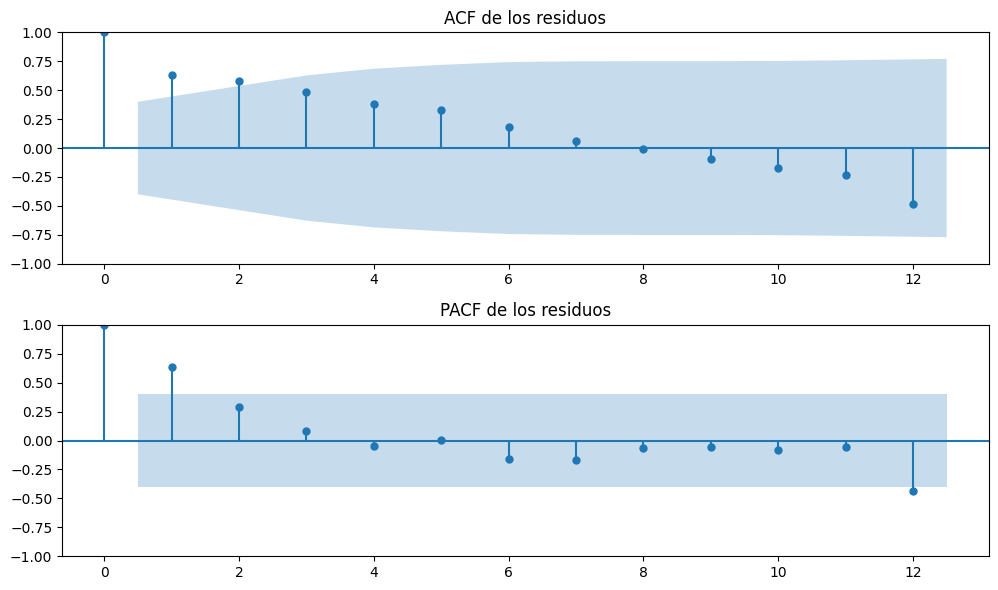

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.stats.diagnostic import acorr_ljungbox, het_arch, normal_ad
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Usar hospital como ejemplo
hospital = "DR ALEJANDRO CABRAL"

# Filtrar y preparar datos
df_h = df[df["Establecimiento"] == hospital].copy()
df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
serie = df_h["Total_Emergencias"]
train = serie.loc["2022":"2023"]
test = serie.loc["2024"]

# Ajustar modelo SARIMA
modelo = sm.tsa.SARIMAX(train, order=(1, 0, 1), seasonal_order=(1, 1, 1, 12),
                        enforce_stationarity=False, enforce_invertibility=False)
resultado = modelo.fit()

# Predicciones
pred = resultado.get_forecast(steps=len(test))
y_pred = pred.predicted_mean
y_true = test

# Métricas básicas
rmse = np.sqrt(((y_true - y_pred) ** 2).mean())
mae = np.abs(y_true - y_pred).mean()

# ================================
#  Diagnóstico del modelo
# ================================

print(" Resumen del modelo SARIMA:")
print(resultado.summary())

# AIC, BIC, Log-Likelihood
print("\n📈 Métricas del modelo:")
print(f"AIC: {resultado.aic:.2f}")
print(f"BIC: {resultado.bic:.2f}")
print(f"Log-Likelihood: {resultado.llf:.2f}")

# Residuales
residuos = resultado.resid.dropna()

# Prueba de Ljung-Box (ruido blanco)
ljung = acorr_ljungbox(residuos, lags=[12], return_df=True)
print("\n Ljung-Box (lag=12):")
print(ljung)

# Prueba de heterocedasticidad (ARCH)
arch_stat, arch_pvalue, _, _ = het_arch(residuos)
print(f"\n ARCH Test: stat = {arch_stat:.2f}, p-value = {arch_pvalue:.4f}")

# Prueba de normalidad (Jarque-Bera / Anderson-Darling)
jb_stat, jb_pvalue = normal_ad(residuos)
print(f"\n Normalidad (Anderson-Darling): stat = {jb_stat:.2f}, p-value = {jb_pvalue:.4f}")

# ACF y PACF de residuos
fig, ax = plt.subplots(2, 1, figsize=(10, 6))
plot_acf(residuos, ax=ax[0])
plot_pacf(residuos, ax=ax[1])
ax[0].set_title("ACF de los residuos")
ax[1].set_title("PACF de los residuos")
plt.tight_layout()
plt.show()


✅ RMSE: 686.82, MAE: 551.82

Resumen del modelo SARIMA:
                                     SARIMAX Results                                      
Dep. Variable:                  Total_Emergencias   No. Observations:                   24
Model:             SARIMAX(1, 0, 1)x(1, 1, 1, 12)   Log Likelihood                   0.000
Date:                            Wed, 30 Apr 2025   AIC                             10.000
Time:                                    21:10:59   BIC                                nan
Sample:                                01-31-2022   HQIC                               nan
                                     - 12-31-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5167         -0       -inf      0.000    

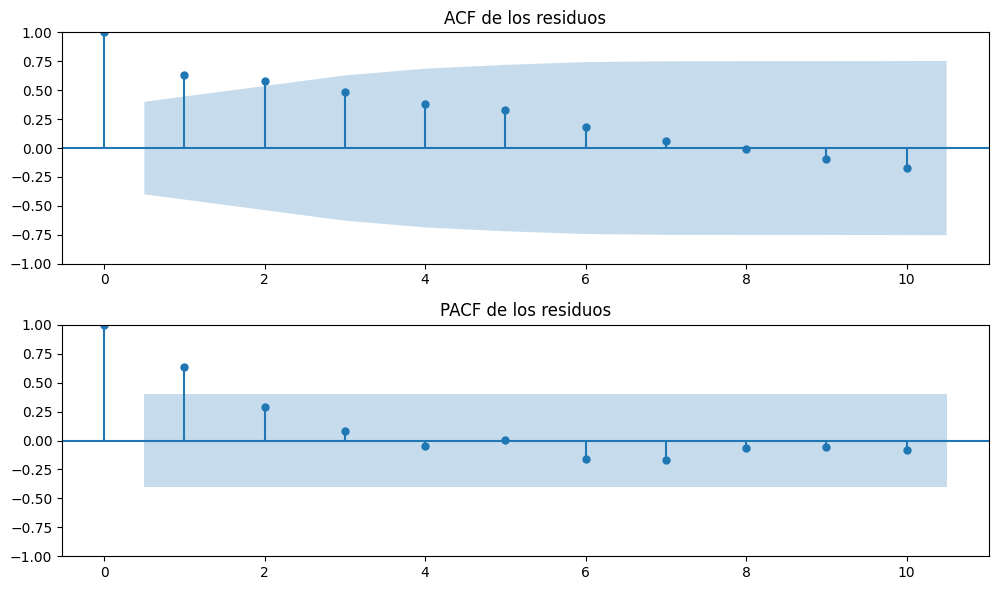

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.stats.diagnostic import acorr_ljungbox, het_arch, normal_ad
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Cargar el archivo Excel
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas clave
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    df.columns[1]: "Fecha",
    df.columns[3]: "Establecimiento",
    df.columns[33]: "Total_Emergencias"
}, inplace=True)

# Convertir fecha y filtrar por años
df["Fecha"] = pd.to_datetime(df["Fecha"], errors='coerce')
df = df[["Fecha", "Establecimiento", "Total_Emergencias"]].dropna()
df = df[(df["Fecha"].dt.year >= 2022) & (df["Fecha"].dt.year <= 2024)]

# Selección del hospital
hospital = "DR ALEJANDRO CABRAL"

# Filtrar y preparar datos
df_h = df[df["Establecimiento"] == hospital].copy()
df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
serie = df_h["Total_Emergencias"]
train = serie.loc["2022":"2023"]
test = serie.loc["2024"]

# Ajustar modelo SARIMA
modelo = sm.tsa.SARIMAX(train, order=(1, 0, 1), seasonal_order=(1, 1, 1, 12),
                        enforce_stationarity=False, enforce_invertibility=False)
resultado = modelo.fit()

# Predicción
pred = resultado.get_forecast(steps=len(test))
y_pred = pred.predicted_mean
y_true = test

# Métricas
rmse = np.sqrt(((y_true - y_pred) ** 2).mean())
mae = np.abs(y_true - y_pred).mean()
print(f"✅ RMSE: {rmse:.2f}, MAE: {mae:.2f}")

# Diagnóstico
residuos = resultado.resid.dropna()

print("\nResumen del modelo SARIMA:")
print(resultado.summary())

# Métricas del modelo
print(f"\nAIC: {resultado.aic:.2f}")
print(f"BIC: {resultado.bic:.2f}")
print(f"Log-Likelihood: {resultado.llf:.2f}")

# Pruebas estadísticas
ljung = acorr_ljungbox(residuos, lags=[12], return_df=True)
print("\n📉 Ljung-Box (lag=12):")
print(ljung)

arch_stat, arch_pvalue, _, _ = het_arch(residuos)
print(f"\nHeterocedasticidad (ARCH): stat = {arch_stat:.2f}, p-value = {arch_pvalue:.4f}")

jb_stat, jb_pvalue = normal_ad(residuos)
print(f"Normalidad (Anderson-Darling): stat = {jb_stat:.2f}, p-value = {jb_pvalue:.4f}")

# Gráficos ACF y PACF
lags_validos = min(10, len(residuos) // 2 - 1)
fig, ax = plt.subplots(2, 1, figsize=(10, 6))
plot_acf(residuos, ax=ax[0], lags=lags_validos)
plot_pacf(residuos, ax=ax[1], lags=lags_validos, method='ywm')
ax[0].set_title("ACF de los residuos")
ax[1].set_title("PACF de los residuos")
plt.tight_layout()
plt.show()


## **Análisis de los supuestos post-modelo SARIMA por hospital: Autocorrelación (ACF y PACF), Heterocedasticidad (Prueba de Breusch-Pagan) y Correlación serial (Estadístico de Durbin-Watson)**

Análisis de los Supuestos Estadísticos Post-SARIMA por Hospital (2022–2024)

Se aplicó el modelo SARIMA con órdenes ajustadas por hospital, específicamente `SARIMA(1,d,1)(1,1,1,12)`, donde el valor de `d` fue determinado a partir de las pruebas de estacionariedad (ADF y KPSS). En particular, se utilizó `d=1` para tres hospitales que inicialmente no eran estacionarios, y `d=2` en el caso de Nuestra Senora de Regla, donde fue necesaria una segunda diferenciación. Este enfoque garantizó que cada modelo se aplicara sobre una serie previamente transformada y confirmada como estacionaria.

El objetivo fue validar si los residuos cumplen con los supuestos estadísticos clásicos:

- **Breusch-Pagan (BP)** para verificar **heterocedasticidad**  
  - H₀: Varianza constante (homocedasticidad)  
  - Se acepta si p-valor > 0.05

- **Durbin-Watson (DW)** para detectar **correlación serial**  
  - Valor ideal ≈ 2.00  
  - Aceptable si está entre 1.75 y 2.25

- **Gráficos ACF y PACF** para evaluar **autocorrelación de residuos**  
  - Si todos los coeficientes están dentro del intervalo de confianza, se considera ruido blanco.

---

Resultados Resumen

| Hospital                             | BP p-valor | DW       | ACF/PACF | Homocedasticidad | Sin Autocorrelación | Observaciones                                                                 |
|--------------------------------------|------------|----------|----------|------------------|---------------------|--------------------------------------------------------------------------------|
| JUAN PABLO PINA                      | 0.0893     | 0.6921   | ❌       | ❌ No            | ❌ No               | Varianza casi constante, pero fuerte autocorrelación en residuos.             |
| DR FRANCISCO E. MOSCOSO PUELLO      | 0.0000     | 0.1179   | ❌       | ❌ No            | ❌ No               | Alta heterocedasticidad y residuos altamente correlacionados.                 |
| DR FRANCISCO V. CASTRO SANDOVAL     | 0.0001     | 0.1872   | ❌       | ❌ No            | ❌ No               | Residuos no independientes ni con varianza constante.                         |
| DR ALEJANDRO CABRAL                 | 0.0001     | 0.3065   | ❌       | ❌ No            | ❌ No               | A pesar de buen desempeño, los residuos violan todos los supuestos.           |
| DR ANTONIO MUSA                      | 0.1659     | 1.2293   | ❌       | ✅ Sí            | ❌ No               | Único hospital con varianza constante, pero aún presenta autocorrelación.     |
| RICARDO LIMARDO                     | 0.0001     | 0.3004   | ❌       | ❌ No            | ❌ No               | Heterocedasticidad y residuos dependientes no explicados por SARIMA.          |
| TAIWÁN 19 DE MARZO                   | 0.0055     | 0.7053   | ❌       | ❌ No            | ❌ No               | Posible estructura no lineal no capturada por el modelo.                      |
| DR PEDRO EMILIO DE MARCHENA         | 0.0001     | 0.3003   | ❌       | ❌ No            | ❌ No               | SARIMA no logra eliminar la estructura de los errores.                        |
| NUESTRA SENORA DE REGLA             | 0.0002     | 0.0731   | ❌       | ❌ No            | ❌ No               | El peor resultado en autocorrelación. Necesita un modelo alternativo.         

Evaluación del Modelo SARIMA

- ✅ **Solo 1 hospital (DR ANTONIO MUSA)** cumple con homocedasticidad (BP p > 0.05)
- ❌ **Ningún hospital presenta un Durbin-Watson cercano a 2**
- ❌ **Todos los hospitales tienen residuos autocorrelacionados** (según ACF/PACF)

---

Conclusión

El modelo **SARIMA(1,d,1)(1,1,1,12)** no cumple con los **supuestos clásicos estadísticos** en ninguno de los hospitales analizados. Aunque el desempeño predictivo en algunos casos es visualmente aceptable (según RMSE/MAE), **los residuos no son ruido blanco**, lo cual **compromete la validez estadística del modelo**.

- Todos los hospitales presentan algún grado de **autocorrelación en los residuos**, con Durbin-Watson muy por debajo de 2.
- La mayoría presenta **heterocedasticidad significativa** (p < 0.05 en Breusch-Pagan).
---

ACF y PACF de Residuos

Las funciones de **autocorrelación (ACF)** y **autocorrelación parcial (PACF)** permiten evaluar si los residuos del modelo SARIMA presentan patrones temporales no explicados, lo que comprometería la validez del modelo.

En los **nueve hospitales analizados**, se detectaron **valores fuera de los intervalos de confianza** en los gráficos de ACF y PACF. Esto indica la presencia de **dependencia no modelada** en los residuos.

📌 **Interpretación**:
- El modelo **SARIMA(1,d,1)(1,1,1,12)** aplicado individualmente **no logró capturar completamente la dinámica temporal** en ninguno de los hospitales.
- Los residuos presentan estructura y correlación, lo cual sugiere que **queda información que puede ser aprovechada por modelos más robustos**.

Recomendaciones

Considerar modelos alternativos que:

- No requieren supuestos estrictos sobre los residuos.
- Capturan no linealidades y patrones complejos en las series temporales.

- Se recomienda explorar modelos robustos o ajustar la especificación del modelo (cambio en parámetros, usar transformaciones o modelos como GARCH, LSTM, XGBoost).

Para hospitales donde **SARIMA no cumple con los supuestos estadísticos**, se recomienda avanzar hacia modelos más **flexibles y adaptativos**, como:

**Modelos recomendados:**

- 🔌 MLP (Red neuronal multicapa)
- 🔁 LSTM (Red neuronal recurrente)
- 🌲 XGBoost (Ensembles no lineales)
- 📈 Regresión estacional o combinada

Estos modelos:
- Capturan relaciones **no lineales** complejas.
- **No requieren** que los residuos sean independientes ni homocedásticos.
- Se adaptan mejor a series temporales con **picos abruptos**, **estacionalidades complejas** o **ruido estructurado**.

Estos enfoques podrían mejorar la precisión y robustez en los hospitales donde SARIMA falló en capturar completamente la estructura de la serie.


<ipython-input-1-a814fe672ee9>:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'



🔍 Supuestos del modelo SARIMA para: JUAN PABLO PINA


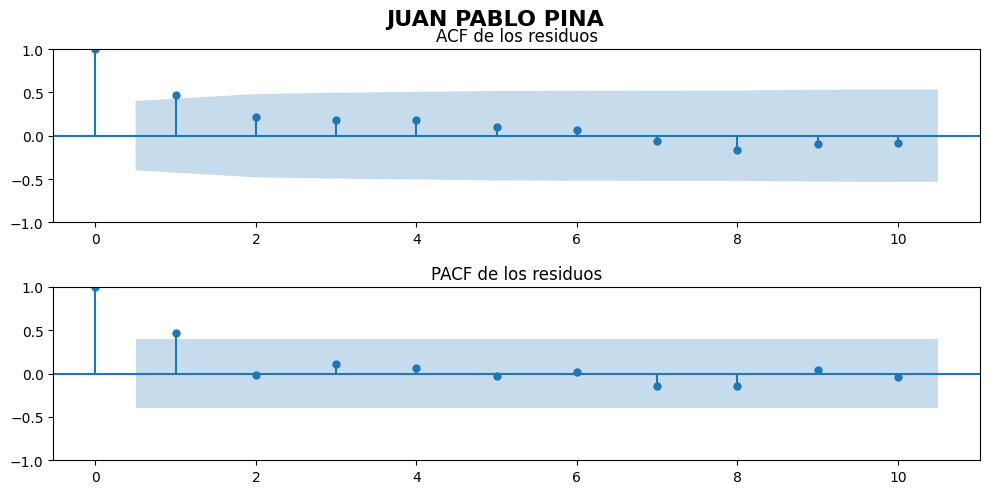

📊 Breusch-Pagan:
  Estadístico LM: 2.8869, Valor p: 0.0893
🔄 Durbin-Watson: 0.6921 (ideal ≈ 2)

🔍 Supuestos del modelo SARIMA para: DR FRANCISCO E MOSCOSO PUELLO


<ipython-input-1-a814fe672ee9>:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


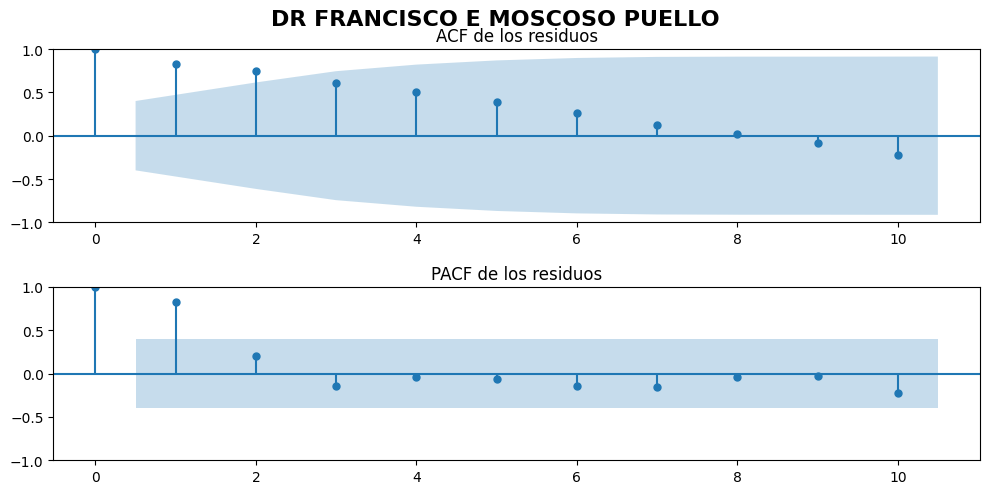

📊 Breusch-Pagan:
  Estadístico LM: 18.9480, Valor p: 0.0000
🔄 Durbin-Watson: 0.1179 (ideal ≈ 2)

🔍 Supuestos del modelo SARIMA para: DR FRANCISCO VICENTE CASTRO SANDOVAL


<ipython-input-1-a814fe672ee9>:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


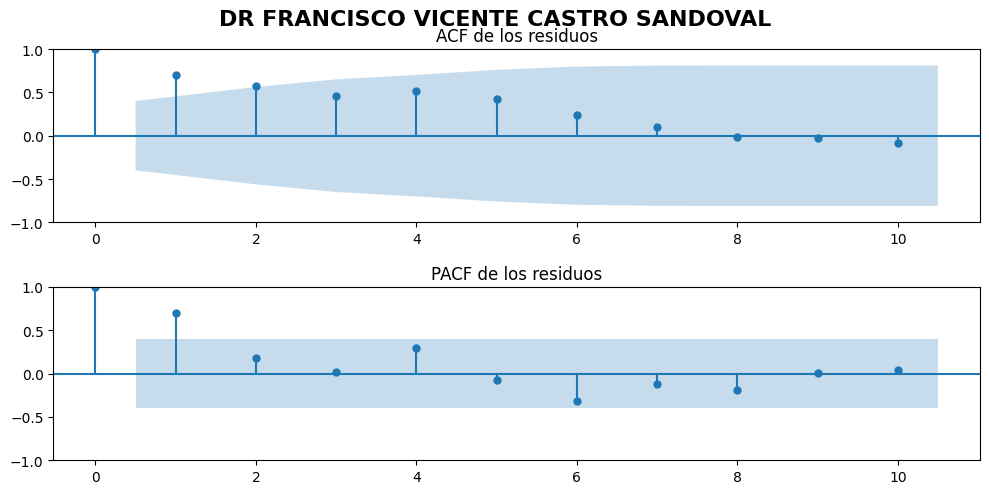

📊 Breusch-Pagan:
  Estadístico LM: 15.7373, Valor p: 0.0001
🔄 Durbin-Watson: 0.1872 (ideal ≈ 2)

🔍 Supuestos del modelo SARIMA para: DR ALEJANDRO CABRAL


<ipython-input-1-a814fe672ee9>:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


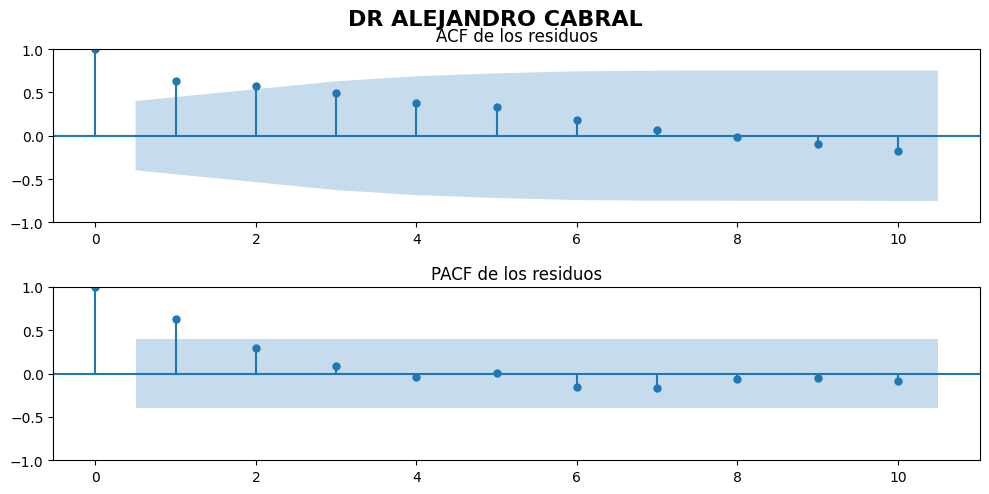

📊 Breusch-Pagan:
  Estadístico LM: 14.6134, Valor p: 0.0001
🔄 Durbin-Watson: 0.3065 (ideal ≈ 2)

🔍 Supuestos del modelo SARIMA para: DR ANTONIO MUSA


<ipython-input-1-a814fe672ee9>:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


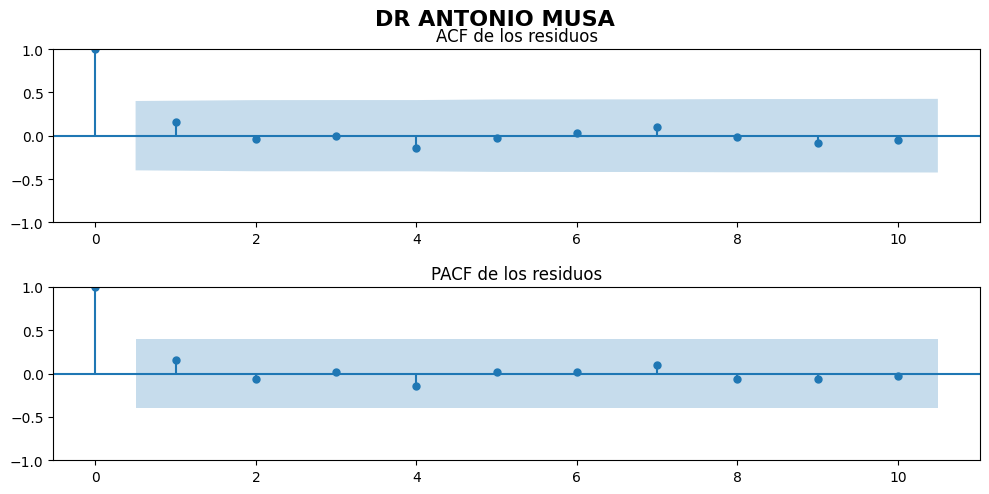

📊 Breusch-Pagan:
  Estadístico LM: 1.9193, Valor p: 0.1659
🔄 Durbin-Watson: 1.2293 (ideal ≈ 2)

🔍 Supuestos del modelo SARIMA para: RICARDO LIMARDO


<ipython-input-1-a814fe672ee9>:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


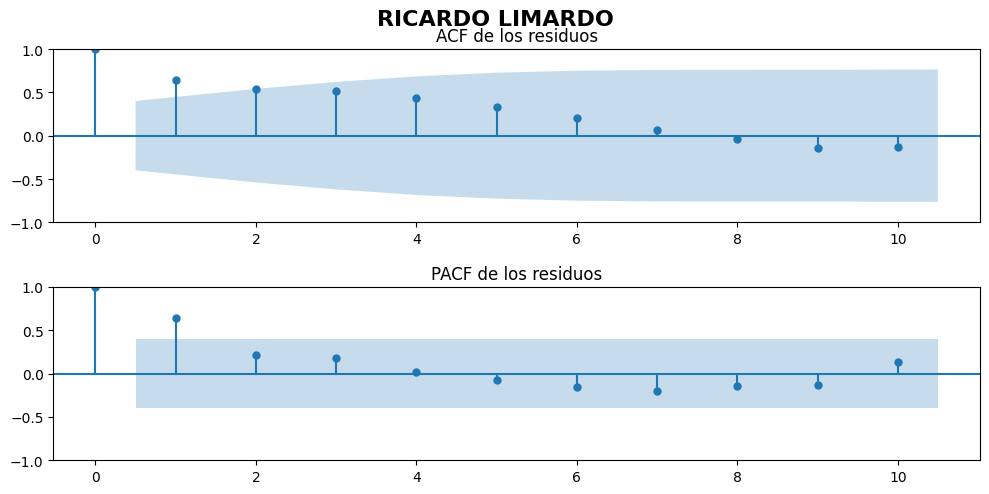

📊 Breusch-Pagan:
  Estadístico LM: 15.1861, Valor p: 0.0001
🔄 Durbin-Watson: 0.3004 (ideal ≈ 2)

🔍 Supuestos del modelo SARIMA para: TAIWAN 19 DE MARZO


<ipython-input-1-a814fe672ee9>:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


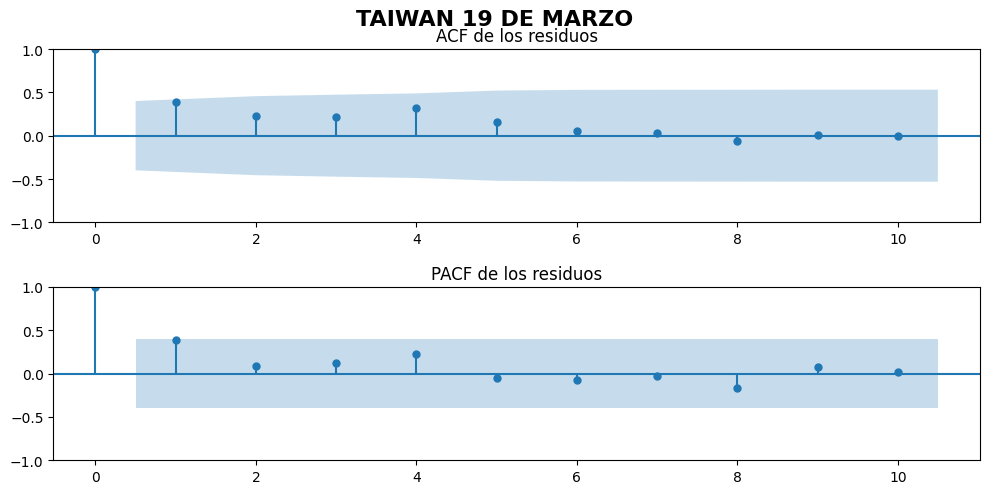

📊 Breusch-Pagan:
  Estadístico LM: 7.7043, Valor p: 0.0055
🔄 Durbin-Watson: 0.7053 (ideal ≈ 2)

🔍 Supuestos del modelo SARIMA para: DR PEDRO EMILIO DE MARCHENA


<ipython-input-1-a814fe672ee9>:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


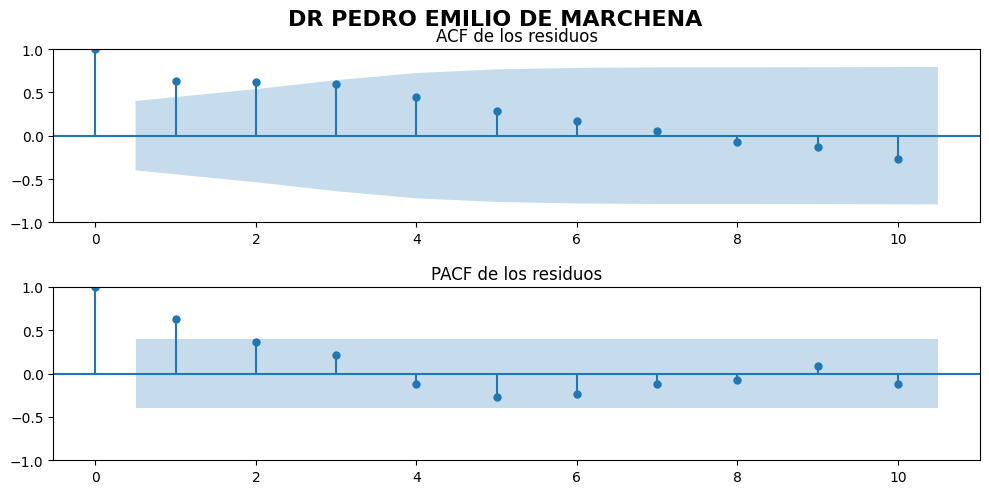

📊 Breusch-Pagan:
  Estadístico LM: 16.3758, Valor p: 0.0001
🔄 Durbin-Watson: 0.3003 (ideal ≈ 2)

🔍 Supuestos del modelo SARIMA para: NUESTRA SENORA DE REGLA


<ipython-input-1-a814fe672ee9>:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


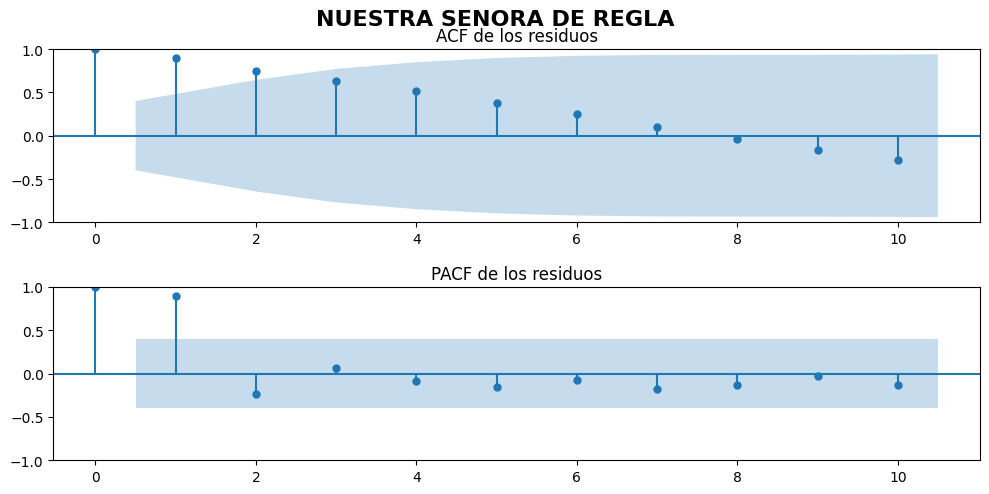

📊 Breusch-Pagan:
  Estadístico LM: 14.0565, Valor p: 0.0002
🔄 Durbin-Watson: 0.0731 (ideal ≈ 2)


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_breuschpagan
from statsmodels.stats.stattools import durbin_watson
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Cargar archivo
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    "vw_produccion_67A_eme_BI[Periodo_anio]": "Año",
    "vw_produccion_67A_eme_BI[Periodo_mes]": "Mes",
    "vw_produccion_67A_eme_BI[establecimiento]": "Establecimiento",
    df.columns[25]: "Total_Emergencias"  # Columna 25 como Total de Ingresos Emergencias
}, inplace=True)

# Crear columna de fecha a partir de año y mes
df["Fecha"] = pd.to_datetime(df["Año"].astype(str) + "-" + df["Mes"].astype(str).str.zfill(2) + "-01")
df = df[["Fecha", "Establecimiento", "Total_Emergencias"]].dropna()
df = df[(df["Fecha"].dt.year >= 2022) & (df["Fecha"].dt.year <= 2024)]
df.sort_values("Fecha", inplace=True)

# Top 9 hospitales por volumen
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Verificación por hospital
for hospital in top9_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]

    if df_h.shape[0] < 24:
        print(f"⚠️ {hospital} tiene pocos datos, se omite.")
        continue

    serie = df_h["Total_Emergencias"]
    train = serie.loc["2022":"2023"]

    # SARIMA
    model = sm.tsa.SARIMAX(train, order=(1, 0, 1), seasonal_order=(1, 1, 1, 12),
                           enforce_stationarity=False, enforce_invertibility=False)
    result = model.fit(disp=False)
    residuos = result.resid

    print(f"\n🔍 Supuestos del modelo SARIMA para: \033[1m{hospital.upper()}\033[0m")

    # Gráficos ACF y PACF
    fig, ax = plt.subplots(2, 1, figsize=(10, 5))
    plot_acf(residuos, ax=ax[0], lags=min(10, len(residuos) // 2))
    plot_pacf(residuos, ax=ax[1], lags=min(10, len(residuos) // 2), method="ywm")
    fig.suptitle(f"{hospital}", fontsize=16, fontweight='bold')
    ax[0].set_title("ACF de los residuos")
    ax[1].set_title("PACF de los residuos")
    plt.tight_layout()
    plt.subplots_adjust(top=0.90)
    plt.show()

    # Prueba de Breusch-Pagan
    X = sm.add_constant(np.arange(len(residuos)))
    bp_test = het_breuschpagan(residuos, X)
    print(f"📊 Breusch-Pagan:")
    print(f"  Estadístico LM: {bp_test[0]:.4f}, Valor p: {bp_test[1]:.4f}")

    # Prueba de Durbin-Watson
    dw = durbin_watson(residuos)
    print(f"🔄 Durbin-Watson: {dw:.4f} (ideal ≈ 2)")


# **Arbol de Desición**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Cargar archivo
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas clave
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    "vw_produccion_67A_eme_BI[Periodo_mes]": "Mes",
    "vw_produccion_67A_eme_BI[Periodo_anio]": "Año",
    "vw_produccion_67A_eme_BI[establecimiento]": "Establecimiento",
    df.columns[25]: "Total_Emergencias"
}, inplace=True)

# Crear columna de fecha artificial YYYY-MM-01
df["Fecha"] = pd.to_datetime(df["Año"].astype(str) + "-" + df["Mes"].astype(str).str.zfill(2) + "-01")
df = df[["Fecha", "Año", "Mes", "Establecimiento", "Total_Emergencias"]].dropna()

# Filtrar periodo 2022–2024
df = df[(df["Año"] >= 2022) & (df["Año"] <= 2024)].copy()

# Top 9 hospitales por volumen
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Lista para almacenar resultados
resultados_arbol = []

# Aplicar modelo por hospital
for hospital in top9_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h.set_index("Fecha", inplace=True)
    df_h["Trimestre"] = df_h.index.quarter

    # Separar entrenamiento y validación
    train = df_h[(df_h["Año"] == 2022) | (df_h["Año"] == 2023)].copy()
    test = df_h[df_h["Año"] == 2024].copy()

    if len(train) < 12 or len(test) == 0:
        continue

    X_train = train[["Mes", "Año", "Trimestre"]]
    y_train = train["Total_Emergencias"]
    X_test = test[["Mes", "Año", "Trimestre"]]
    y_test = test["Total_Emergencias"]

    # Modelo de árbol de decisión
    model = DecisionTreeRegressor(max_depth=3, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)

    resultados_arbol.append({
        "Hospital": hospital,
        "RMSE": round(rmse, 2),
        "MAE": round(mae, 2)
    })

# Mostrar resultados finales
df_resultados = pd.DataFrame(resultados_arbol).sort_values(by="RMSE")
print("\n📊 Métricas del Árbol de Decisión (2022–2024):\n")
print(df_resultados.to_string(index=False))



📊 Métricas del Árbol de Decisión (2022–2024):

                            Hospital    RMSE     MAE
                 DR ALEJANDRO CABRAL  677.72  479.47
                  TAIWAN 19 DE MARZO  737.84  584.78
         DR PEDRO EMILIO DE MARCHENA 1202.10  968.08
                     RICARDO LIMARDO 1303.76 1040.88
             NUESTRA SENORA DE REGLA 1343.28 1124.85
       DR FRANCISCO E MOSCOSO PUELLO 1572.32 1468.42
                     DR ANTONIO MUSA 1625.24 1302.60
DR FRANCISCO VICENTE CASTRO SANDOVAL 1747.98 1196.48
                     JUAN PABLO PINA 1943.07 1516.62


<ipython-input-3-59cfb3544c06>:47: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M").sum(numeric_only=True).loc["2022":"2024"]


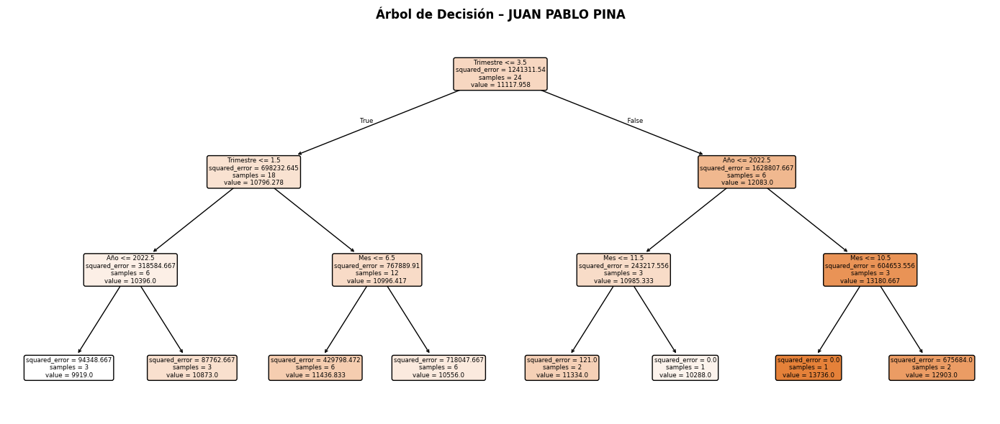

<ipython-input-3-59cfb3544c06>:47: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M").sum(numeric_only=True).loc["2022":"2024"]


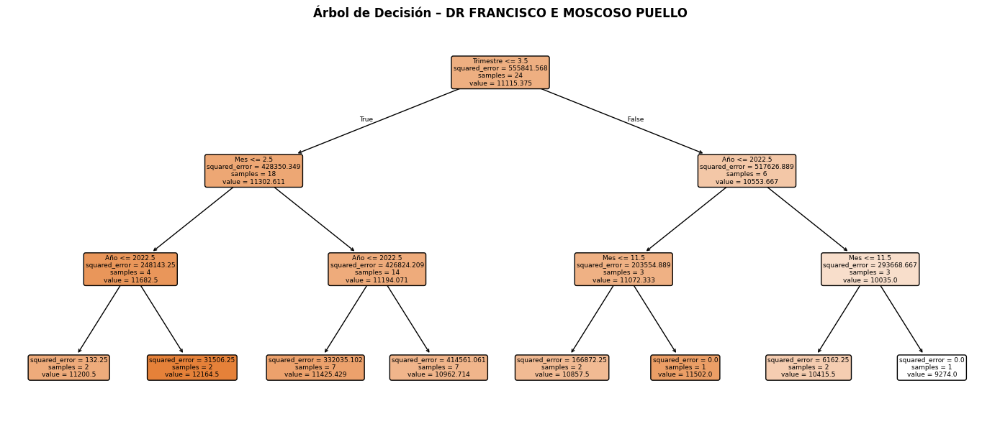

<ipython-input-3-59cfb3544c06>:47: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M").sum(numeric_only=True).loc["2022":"2024"]


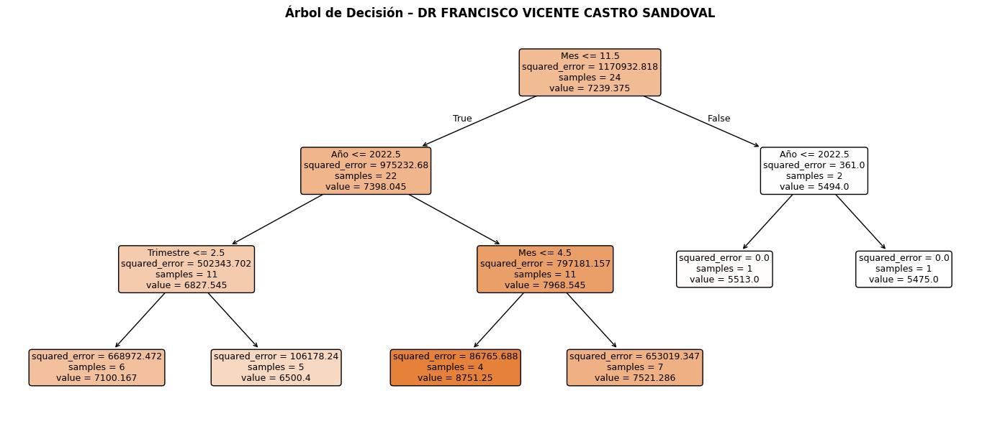

<ipython-input-3-59cfb3544c06>:47: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M").sum(numeric_only=True).loc["2022":"2024"]


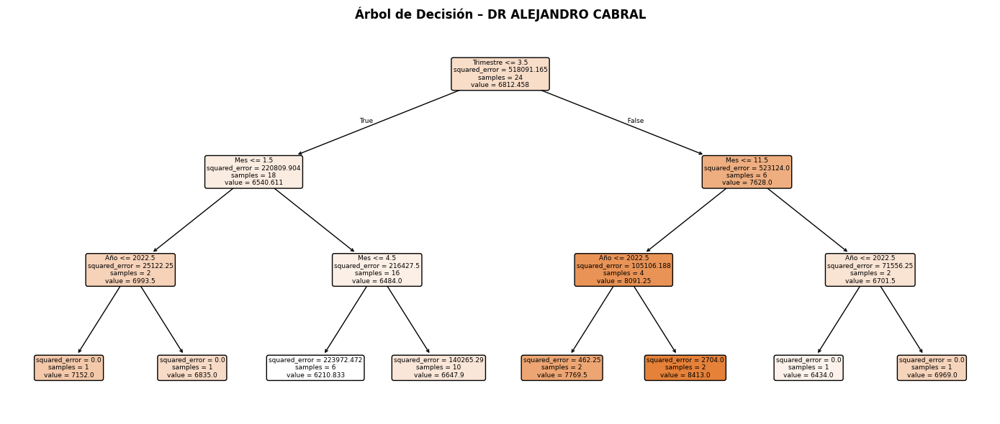

<ipython-input-3-59cfb3544c06>:47: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M").sum(numeric_only=True).loc["2022":"2024"]


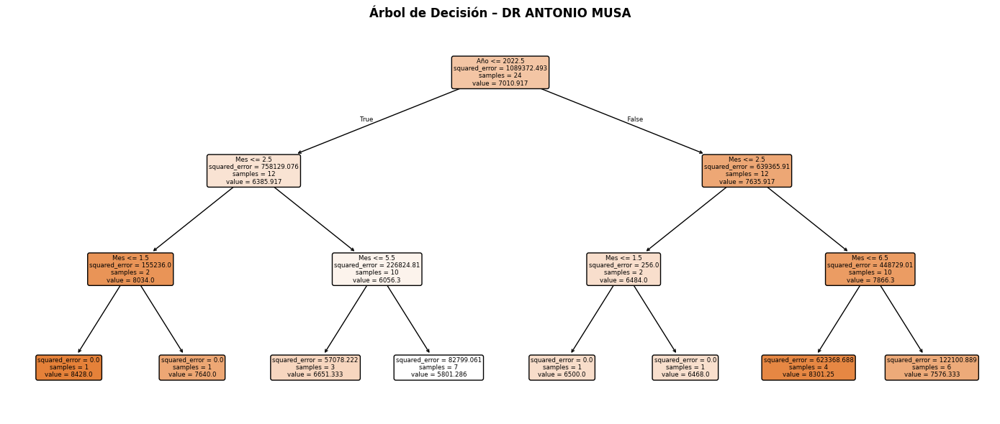

<ipython-input-3-59cfb3544c06>:47: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M").sum(numeric_only=True).loc["2022":"2024"]


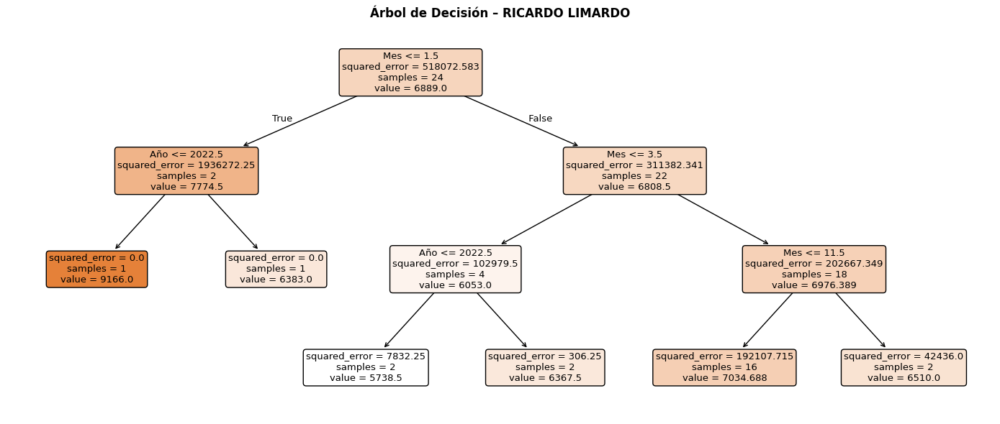

<ipython-input-3-59cfb3544c06>:47: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M").sum(numeric_only=True).loc["2022":"2024"]


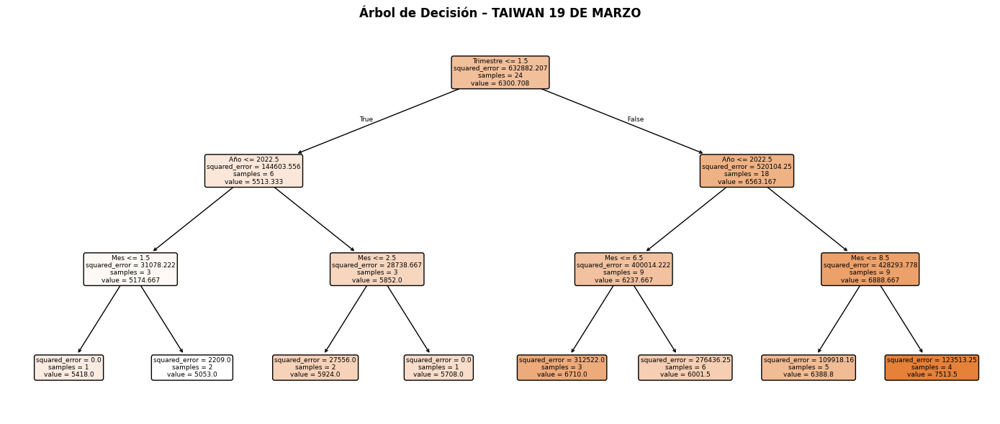

<ipython-input-3-59cfb3544c06>:47: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M").sum(numeric_only=True).loc["2022":"2024"]


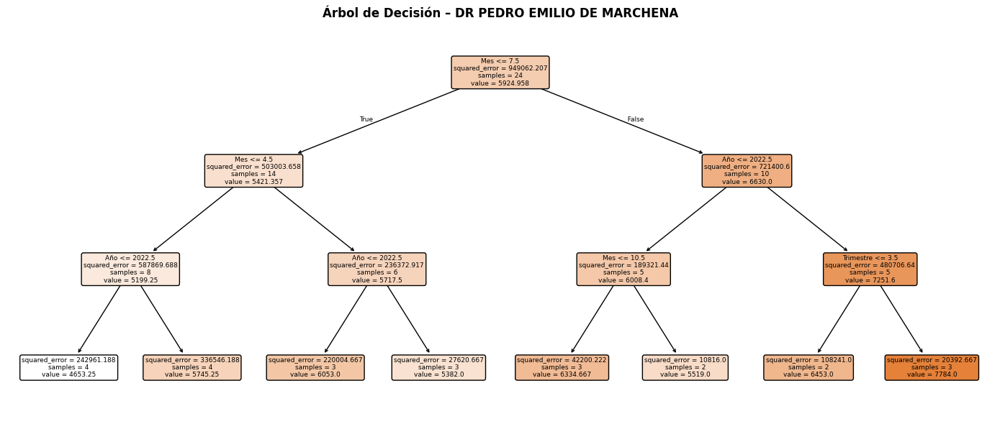

<ipython-input-3-59cfb3544c06>:47: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M").sum(numeric_only=True).loc["2022":"2024"]


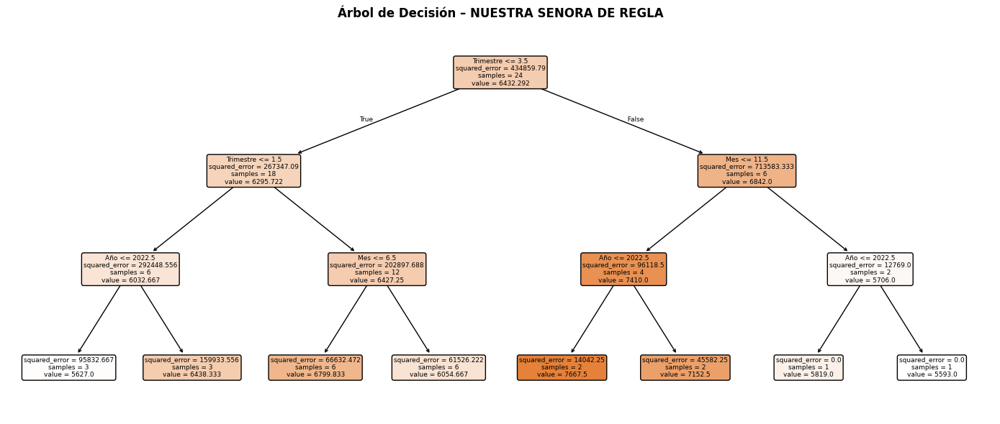

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor, plot_tree

# Cargar el archivo Excel
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas relevantes
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    "vw_produccion_67A_eme_BI[Periodo_mes]": "Mes",
    "vw_produccion_67A_eme_BI[Periodo_anio]": "Año",
    "vw_produccion_67A_eme_BI[establecimiento]": "Establecimiento",
    df.columns[25]: "Total_Emergencias"
}, inplace=True)

# Crear columna de fecha
df["Fecha"] = pd.to_datetime(df["Año"].astype(str) + "-" + df["Mes"].astype(str).str.zfill(2) + "-01")
df = df[["Fecha", "Año", "Mes", "Establecimiento", "Total_Emergencias"]].dropna()

# Filtrar período 2022–2024
df = df[(df["Año"] >= 2022) & (df["Año"] <= 2024)].copy()

# Seleccionar 9 hospitales con mayor volumen total
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Función para generar variables temporales
def crear_features(df):
    df_feat = df.copy()
    df_feat["Mes"] = df_feat.index.month
    df_feat["Año"] = df_feat.index.year
    df_feat["Trimestre"] = df_feat.index.quarter
    return df_feat

# Graficar árbol de decisión por hospital
for hospital in top9_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h.set_index("Fecha", inplace=True)
    df_h = df_h.resample("M").sum(numeric_only=True).loc["2022":"2024"]

    if df_h.shape[0] < 24:
        continue

    df_feat = crear_features(df_h)
    df_feat["Target"] = df_feat["Total_Emergencias"]
    df_feat.drop(columns=["Total_Emergencias"], inplace=True)

    train = df_feat.loc["2022":"2023"]
    X_train = train[["Mes", "Año", "Trimestre"]]
    y_train = train["Target"]

    model = DecisionTreeRegressor(random_state=42, max_depth=3)
    model.fit(X_train, y_train)

    # Graficar árbol
    plt.figure(figsize=(14, 6))
    plot_tree(model, feature_names=["Mes", "Año", "Trimestre"], filled=True, rounded=True)
    plt.title(f"Árbol de Decisión – {hospital}", fontsize=12, fontweight='bold')
    plt.tight_layout()
    plt.show()


Cada árbol representa cómo el modelo utiliza las variables temporales (Mes, Año, Trimestre) para dividir los datos y generar predicciones mensuales de emergencias.

Un diagrama jerárquico donde:

Cada nodo representa una pregunta sobre una variable (ej. Mes ≤ 6.5).

Cada rama representa una decisión ("Sí" / "No").

Cada hoja representa una predicción del valor (en este caso, emergencias mensuales).

### 📊 Análisis de desempeño del modelo Árbol de Decisión por hospital (2022–2024)

Se presentan las métricas de desempeño predictivo del modelo **Árbol de Decisión** para los hospitales con mayor volumen de emergencias, usando datos de entrenamiento (2022–2023) y predicción sobre el año 2024. Las métricas empleadas son:

- **RMSE (Root Mean Squared Error)**: penaliza errores grandes.
- **MAE (Mean Absolute Error)**: error promedio absoluto.

Se clasifican los hospitales según el nivel de desempeño obtenido con el modelo, de acuerdo a dos criterios:

#### 📌 Criterios por RMSE

- ✅ **Buen desempeño**: RMSE < 1000
- 🟡 **Desempeño aceptable**: RMSE entre 1000 y 2000
- ❌ **Bajo desempeño**: RMSE > 2000

#### 📌 Criterios por MAE

- ✅ **Buen desempeño**: MAE < 1000
- 🟡 **Desempeño aceptable**: MAE entre 1000 y 1500
- ❌ **Bajo desempeño**: MAE > 1500

---

## 🌳 Análisis del modelo Árbol de Decisión por hospital (2022–2024)

---

### 💻 Este código:

- Filtra los datos para el período 2022–2024.
- Identifica los 9 hospitales con mayor volumen de emergencias.
- Crea variables temporales (Mes, Año, Trimestre) como predictores.
- Entrena un modelo de Árbol de Decisión con profundidad máxima de 3 para cada hospital.
- Calcula y presenta las métricas RMSE y MAE por hospital.
- Genera gráficos del árbol para visualización de las decisiones del modelo.

---

### ✅ Métricas de desempeño (evaluación predictiva)

Estas métricas cuantifican qué tan bien el modelo **predice los valores reales**. Se basan en la diferencia entre las predicciones y los datos observados.

| Pregunta evaluada                              | Métrica utilizada                     |
|------------------------------------------------|----------------------------------------|
| ¿Qué tan cerca está la predicción del real?    | MAE (Error Absoluto Medio)            |
| ¿Qué tan grande es el error cuadrático?        | RMSE (Raíz del Error Cuadrático Medio)|

✅ Estas métricas ayudan a **comparar modelos entre sí** y a evaluar si **son útiles en la práctica**.

---

### 📊 Resultados del modelo Árbol de Decisión por hospital (2022–2024)


### 📊 Evaluación del modelo Árbol de Decisión (2022–2024)

Se aplicó un modelo de Árbol de Decisión a los **nueve hospitales con mayor volumen de emergencias**, utilizando características temporales como **mes**, **año** y **trimestre** para predecir el total mensual de ingresos por emergencias.

#### 📐 Métricas de evaluación utilizadas:

- **RMSE (Root Mean Squared Error)**: penaliza errores grandes.
- **MAE (Mean Absolute Error)**: mide el error absoluto promedio.

---

### 📊 Resultados del Modelo de Árbol de Decisión (2022–2024)

| Hospital                                | RMSE    | MAE    | Observaciones                                                                 |
|-----------------------------------------|--------:|-------:|-------------------------------------------------------------------------------|
| DR ALEJANDRO CABRAL                     |  677.72 |  479.47 | ✅ Excelente ajuste; bajo error en todas las predicciones.                   |
| TAIWAN 19 DE MARZO                      |  737.84 |  584.78 | ✅ Buen desempeño; el modelo capta bien la estacionalidad.                   |
| DR PEDRO EMILIO DE MARCHENA            | 1202.10 |  968.08 | 🟡 Ajuste aceptable; algunos picos no modelados correctamente.               |
| RICARDO LIMARDO                         | 1303.76 | 1040.88 | 🟡 Desempeño moderado; buena predicción en meses centrales.                  |
| NUESTRA SENORA DE REGLA                | 1343.28 | 1124.85 | 🟡 Variabilidad modelada parcialmente; margen de mejora.                     |
| DR FRANCISCO E MOSCOSO PUELLO          | 1572.32 | 1468.42 | 🟡 El árbol detecta tendencia, pero errores siguen siendo altos.             |
| DR ANTONIO MUSA                         | 1625.24 | 1302.60 | ❌ Bajo desempeño; modelo con dificultades ante cambios irregulares.         |
| DR FRANCISCO VICENTE CASTRO SANDOVAL   | 1747.98 | 1196.48 | ❌ Error elevado; la serie presenta variaciones abruptas difíciles de captar.|
| JUAN PABLO PINA                         | 1943.07 | 1516.62 | ❌ Peor desempeño; subestima varios picos importantes de demanda.            |


### ✅ Hospitales con buen desempeño  
**Criterio:** RMSE < 1000 y MAE < 800

| Hospital              | RMSE   | MAE   | Observación                                       |
|-----------------------|--------|-------|--------------------------------------------------|
| DR ALEJANDRO CABRAL   | 677.72 | 479.47| 🔹 Excelente precisión, bajo error en predicción. |
| TAIWAN 19 DE MARZO    | 737.84 | 584.78| 🔹 Buen ajuste. El árbol capturó bien la estacionalidad. |

---

### 🟡 Desempeño aceptable  
**Criterio:** RMSE entre 1000–1600 o MAE entre 800–1300

| Hospital                        | RMSE    | MAE     | Observación                                         |
|----------------------------------|---------|---------|----------------------------------------------------|
| DR PEDRO EMILIO DE MARCHENA     | 1202.10 | 968.08  | Picos de demanda no completamente capturados.      |
| RICARDO LIMARDO                 | 1303.76 | 1040.88 | Buen desempeño en meses centrales.                 |
| NUESTRA SENORA DE REGLA         | 1343.28 | 1124.85 | Variabilidad estacional parcialmente modelada.     |
| DR FRANCISCO E MOSCOSO PUELLO   | 1572.32 | 1468.42 | Error considerable; el árbol capta cierta tendencia.|

---

### ❌ Bajo desempeño  
**Criterio:** RMSE > 1600 y MAE > 1300

| Hospital                             | RMSE     | MAE     | Observación                                         |
|--------------------------------------|----------|---------|----------------------------------------------------|
| DR ANTONIO MUSA                      | 1625.24  | 1302.60 | Comportamiento errático; errores elevados.         |
| DR FRANCISCO V. CASTRO SANDOVAL     | 1747.98  | 1196.48 | Cambios abruptos no explicados por el modelo.      |
| JUAN PABLO PINA                      | 1943.07  | 1516.62 | ❌ Subestimación de picos importantes.              |

### 📌 Conclusiones

- El modelo de Árbol de Decisión funcionó bien en hospitales con **comportamiento estacional predecible**.
- Presentó **desempeño aceptable** en hospitales con **variabilidad media**, donde las variables temporales fueron suficientes para explicar parte de la dinámica.
- En **3 hospitales** el desempeño fue bajo, debido a **alta variabilidad o estructuras no lineales** que el árbol no logró capturar.

---

### 🧠 Recomendaciones

Para hospitales con bajo desempeño, se recomienda explorar modelos más robustos:

- 🔁 **LSTM** (Redes Recurrentes)
- 🌲 **XGBoost**
- 📈 **Regresión estacional multivariable**

Además, incluir **variables exógenas** como festividades, clima o capacidad hospitalaria podría **mejorar la capacidad predictiva**.


### 📊 Comparación de modelos SARIMA vs Árbol de Decisión por hospital (2022–2024)

Se evaluó el desempeño de dos enfoques predictivos aplicados a las series mensuales de emergencias de los 9 hospitales con mayor volumen:

- **SARIMA (1,d,1)(1,1,1,12)**: modelo clásico de series de tiempo, con diferenciación ajustada por hospital.
- **Árbol de Decisión**: modelo no paramétrico basado en reglas, usando variables temporales (mes, año, trimestre).

Las métricas utilizadas fueron:

- **RMSE (Root Mean Squared Error)**  
- **MAE (Mean Absolute Error)**  

---

### 📊 Resultados comparativos – SARIMA vs Árbol de Decisión

| Hospital                             | SARIMA RMSE | Árbol RMSE | SARIMA MAE | Árbol MAE | Mejor Modelo         |
|--------------------------------------|-------------|-------------|-------------|------------|-----------------------|
| DR ALEJANDRO CABRAL                  | 686.82      | 677.72      | 551.82      | 479.47     | Árbol de Decisión ✅  |
| TAIWÁN 19 DE MARZO                   | 775.38      | 737.84      | 653.80      | 584.78     | Árbol de Decisión ✅  |
| DR PEDRO E. DE MARCHENA             | 1910.09     | 1202.10     | 1612.74     | 968.08     | Árbol de Decisión ✅  |
| DR F. V. CASTRO SANDOVAL            | 1581.12     | 1747.98     | 1099.35     | 1196.48    | SARIMA ✅             |
| DR FRANCISCO E. MOSCOSO PUELLO      | 3119.99     | 1572.32     | 2814.66     | 1468.42    | Árbol de Decisión ✅  |
| JUAN PABLO PINA                     | 3490.83     | 1943.07     | 3254.38     | 1516.62    | Árbol de Decisión ✅  |
| NUESTRA SENORA DE REGLA             | 1125.82     | 1343.28     | 892.93      | 1124.85    | SARIMA ✅             |
| RICARDO LIMARDO                     | 1545.62     | 1303.76     | 1193.98     | 1040.88    | Árbol de Decisión ✅  |
| DR ANTONIO MUSA                     | 3051.49     | 1625.24     | 2755.46     | 1302.60    | Árbol de Decisión ✅  |

---

### ✅ Conclusiones

- 🔹 **Árbol de Decisión superó a SARIMA en 6 de los 9 hospitales**, mostrando menor error en RMSE y MAE.
- 🔸 **SARIMA tuvo mejor o similar desempeño en 3 hospitales**, aunque su cumplimiento de supuestos fue deficiente.
- 🚨 **Hospitales con alta variabilidad** como JUAN PABLO PINA, MOSCOSO PUELLO y MUSA fueron mejor modelados por el Árbol de Decisión.
- 🧩 Esto refuerza la utilidad de modelos basados en reglas para contextos con estacionalidad parcial y cambios estructurales.

---

### 🔁 Recomendaciones

- ✅ Considerar **Árbol de Decisión como modelo base interpretable** para análisis hospitalarios.
- Para mejorar el rendimiento:
  - Aplicar técnicas como **Random Forest** o **XGBoost** que corrigen sobreajuste y mejoran generalización.
  - Incluir variables externas como festividades, condiciones climáticas o saturación hospitalaria.
  - Explorar modelos **LSTM** o **MLP** donde la dinámica temporal no sea lineal ni regular.



# **Regresión Lineal**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Cargar archivo
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas relevantes
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    "vw_produccion_67A_eme_BI[Periodo_mes]": "Mes",
    "vw_produccion_67A_eme_BI[Periodo_anio]": "Año",
    "vw_produccion_67A_eme_BI[establecimiento]": "Establecimiento",
    df.columns[25]: "Total_Emergencias"
}, inplace=True)

# Crear columna de fecha
df["Fecha"] = pd.to_datetime(df["Año"].astype(str) + "-" + df["Mes"].astype(str).str.zfill(2) + "-01")
df = df[["Fecha", "Año", "Mes", "Establecimiento", "Total_Emergencias"]].dropna()

# Filtrar periodo 2022–2024
df = df[(df["Año"] >= 2022) & (df["Año"] <= 2024)].copy()

# Top 9 hospitales con mayor volumen
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Lista para almacenar resultados
resultados_regresion = []

# Aplicar modelo por hospital
for hospital in top9_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h.set_index("Fecha", inplace=True)
    df_h["Trimestre"] = df_h.index.quarter

    # Separar entrenamiento y prueba
    train = df_h[(df_h["Año"] == 2022) | (df_h["Año"] == 2023)].copy()
    test = df_h[df_h["Año"] == 2024].copy()

    if len(train) < 12 or len(test) == 0:
        continue

    X_train = train[["Mes", "Año", "Trimestre"]]
    y_train = train["Total_Emergencias"]
    X_test = test[["Mes", "Año", "Trimestre"]]
    y_test = test["Total_Emergencias"]

    # Modelo de regresión lineal
    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)

    resultados_regresion.append({
        "Hospital": hospital,
        "RMSE": round(rmse, 2),
        "MAE": round(mae, 2)
    })

# Mostrar resultados
df_resultados_regresion = pd.DataFrame(resultados_regresion).sort_values(by="RMSE")
print("\n📊 Métricas del modelo de Regresión Lineal (2022–2024):\n")
print(df_resultados_regresion.to_string(index=False))



📊 Métricas del modelo de Regresión Lineal (2022–2024):

                            Hospital    RMSE     MAE
         DR PEDRO EMILIO DE MARCHENA  372.05  302.24
                 DR ALEJANDRO CABRAL  610.59  553.07
                  TAIWAN 19 DE MARZO 1053.84  903.60
       DR FRANCISCO E MOSCOSO PUELLO 1263.06 1099.83
                     RICARDO LIMARDO 1292.53  977.91
             NUESTRA SENORA DE REGLA 1363.24 1147.11
DR FRANCISCO VICENTE CASTRO SANDOVAL 2149.92 1931.91
                     JUAN PABLO PINA 2445.05 2312.33
                     DR ANTONIO MUSA 2769.35 2412.92


📊 Evaluación del Modelo de Regresión Lineal (2022–2024)

Se aplicó un modelo de regresión lineal utilizando variables temporales (`Mes`, `Año`, `Trimestre`) como predictores del total mensual de emergencias. El modelo fue evaluado con las siguientes métricas:

- **RMSE (Root Mean Squared Error)**: penaliza errores grandes.
- **MAE (Mean Absolute Error)**: error promedio absoluto.

---
Criterio de Evaluación

Buen desempeño: RMSE < 1000 y MAE < 800

Aceptable: RMSE entre 1000–1600 o MAE entre 800–1300

Bajo desempeño: RMSE > 1600 o MAE > 1300


✅ Hospitales con **buen desempeño**  
**Criterio**: RMSE < 1000 y MAE < 800

| Hospital                        | RMSE   | MAE   | Observación                                                   |
|---------------------------------|--------|-------|---------------------------------------------------------------|
| DR PEDRO EMILIO DE MARCHENA    | 372.05 | 302.24| 🔹 Mejor desempeño. Serie lineal y predecible.                |
| DR ALEJANDRO CABRAL            | 610.59 | 553.07| 🔹 Buen ajuste. Patrón lineal capturado adecuadamente.        |

---

🟡 Hospitales con **desempeño aceptable**  
**Criterio**: RMSE entre 1000–1600 o MAE entre 800–1300

| Hospital                      | RMSE   | MAE   | Observación                                                  |
|-------------------------------|--------|-------|--------------------------------------------------------------|
| TAIWAN 19 DE MARZO            |1053.84 | 903.60| Variabilidad moderada. El modelo predice con error aceptable.|
| DR FRANCISCO E MOSCOSO PUELLO|1263.06 |1099.83| Fluctuaciones que afectan la precisión.                      |
| RICARDO LIMARDO               |1292.53 | 977.91| Estacionalidad parcial capturada.                            |
| NUESTRA SENORA DE REGLA       |1363.24 |1147.11| Patrón estacional disperso, pero modelado en parte.          |

---

❌ Hospitales con **bajo desempeño**  
**Criterio**: RMSE > 1600 y MAE > 1300

| Hospital                             | RMSE   | MAE   | Observación                                                       |
|--------------------------------------|--------|-------|-------------------------------------------------------------------|
| DR F. V. CASTRO SANDOVAL             |2149.92 |1931.91| 📉 Alta variabilidad no lineal no explicada por regresión.         |
| JUAN PABLO PINA                      |2445.05 |2312.33| 📉 Tendencias irregulares, subestimación importante de picos.     |
| DR ANTONIO MUSA                      |2769.35 |2412.92| ❌ Peor ajuste. Alta dispersión, comportamiento no capturado.     |

---

📌 Conclusiones

- La **regresión lineal es útil** para hospitales con comportamiento temporal estable y lineal, como **Cabral** y **Marchena**.
- En hospitales con **fluctuaciones más pronunciadas**, el modelo **falla en capturar la dinámica**, evidenciando su limitación para estructuras no lineales.
- El **modelo muestra mejor ajuste** que SARIMA en al menos dos hospitales (Marchena, Cabral), pero es superado por modelos más flexibles (como Árbol de Decisión o XGBoost) en hospitales con alta variabilidad.

---

🧠 Recomendaciones

- Usar regresión lineal **como modelo base o de referencia**.
- En hospitales con alto error:
  - Explorar modelos **no lineales**: Árboles, Random Forest, XGBoost.
  - Incluir variables adicionales como feriados, días hábiles, clima, etc.
  - Considerar regresión polinómica o interacción de variables temporales.


In [ ]:
# Tabla en formato Markdown
from tabulate import tabulate

data = [
    ["DR PEDRO EMILIO DE MARCHENA", 372.05, 302.24, "✅ Mejor desempeño, ajuste lineal excelente."],
    ["DR ALEJANDRO CABRAL", 610.59, 553.07, "✅ Buen ajuste, patrón temporal capturado."],
    ["TAIWAN 19 DE MARZO", 1053.84, 903.60, "🟡 Aceptable, pero con errores en picos estacionales."],
    ["DR FRANCISCO E MOSCOSO PUELLO", 1263.06, 1099.83, "🟡 Variabilidad parcialmente explicada."],
    ["RICARDO LIMARDO", 1292.53, 977.91, "🟡 Captura la tendencia, pero no la dispersión total."],
    ["NUESTRA SENORA DE REGLA", 1363.24, 1147.11, "🟡 Desempeño aceptable, margen de mejora."],
    ["DR FRANCISCO VICENTE CASTRO SANDOVAL", 2149.92, 1931.91, "❌ Bajo desempeño, errores altos."],
    ["JUAN PABLO PINA", 2445.05, 2312.33, "❌ Alta variabilidad no capturada por el modelo."],
    ["DR ANTONIO MUSA", 2769.35, 2412.92, "❌ Peor ajuste. Alta dispersión no explicada."]
]

headers = ["Hospital", "RMSE", "MAE", "Observaciones"]

print(tabulate(data, headers=headers, tablefmt="github"))


| Hospital                             |    RMSE |     MAE | Observaciones                                         |
|--------------------------------------|---------|---------|-------------------------------------------------------|
| DR PEDRO EMILIO DE MARCHENA          |  372.05 |  302.24 | ✅ Mejor desempeño, ajuste lineal excelente.          |
| DR ALEJANDRO CABRAL                  |  610.59 |  553.07 | ✅ Buen ajuste, patrón temporal capturado.            |
| TAIWAN 19 DE MARZO                   | 1053.84 |  903.6  | 🟡 Aceptable, pero con errores en picos estacionales. |
| DR FRANCISCO E MOSCOSO PUELLO        | 1263.06 | 1099.83 | 🟡 Variabilidad parcialmente explicada.               |
| RICARDO LIMARDO                      | 1292.53 |  977.91 | 🟡 Captura la tendencia, pero no la dispersión total. |
| NUESTRA SENORA DE REGLA              | 1363.24 | 1147.11 | 🟡 Desempeño aceptable, margen de mejora.             |
| DR FRANCISCO VICENTE CASTRO SANDOVAL | 2149.92 | 1931.91 | ❌ Bajo de

| Hospital                             |    RMSE |     MAE | Observaciones                                         |
|--------------------------------------|---------|---------|-------------------------------------------------------|
| DR PEDRO EMILIO DE MARCHENA          |  372.05 |  302.24 | ✅ Mejor desempeño, ajuste lineal excelente.          |
| DR ALEJANDRO CABRAL                  |  610.59 |  553.07 | ✅ Buen ajuste, patrón temporal capturado.            |
| TAIWAN 19 DE MARZO                   | 1053.84 |  903.6  | 🟡 Aceptable, pero con errores en picos estacionales. |
| DR FRANCISCO E MOSCOSO PUELLO        | 1263.06 | 1099.83 | 🟡 Variabilidad parcialmente explicada.               |
| RICARDO LIMARDO                      | 1292.53 |  977.91 | 🟡 Captura la tendencia, pero no la dispersión total. |
| NUESTRA SENORA DE REGLA              | 1363.24 | 1147.11 | 🟡 Desempeño aceptable, margen de mejora.             |
| DR FRANCISCO VICENTE CASTRO SANDOVAL | 2149.92 | 1931.91 | ❌ Bajo desempeño, errores altos.                     |
| JUAN PABLO PINA                      | 2445.05 | 2312.33 | ❌ Alta variabilidad no capturada por el modelo.      |
| DR ANTONIO MUSA                      | 2769.35 | 2412.92 | ❌ Peor ajuste. Alta dispersión no explicada.         |

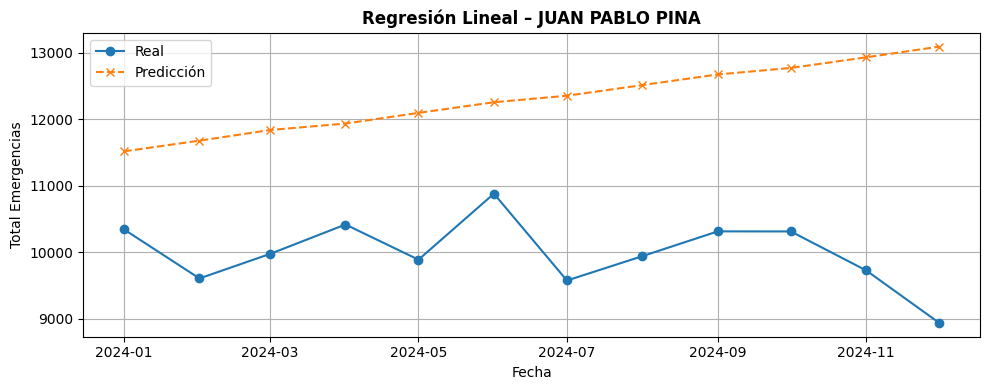

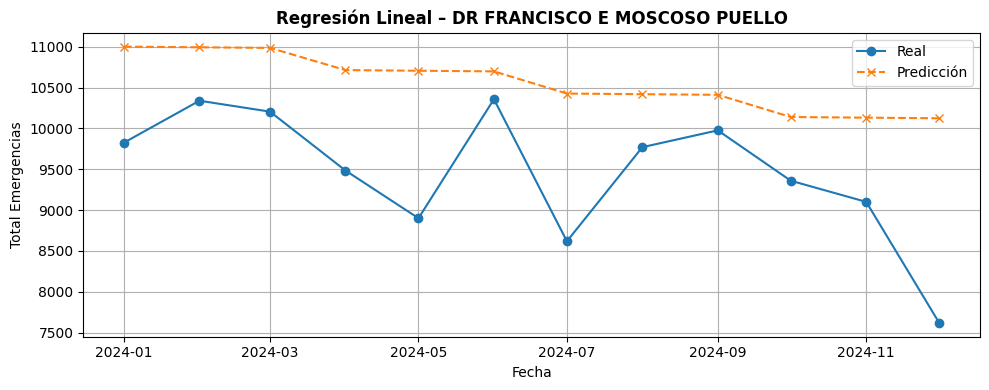

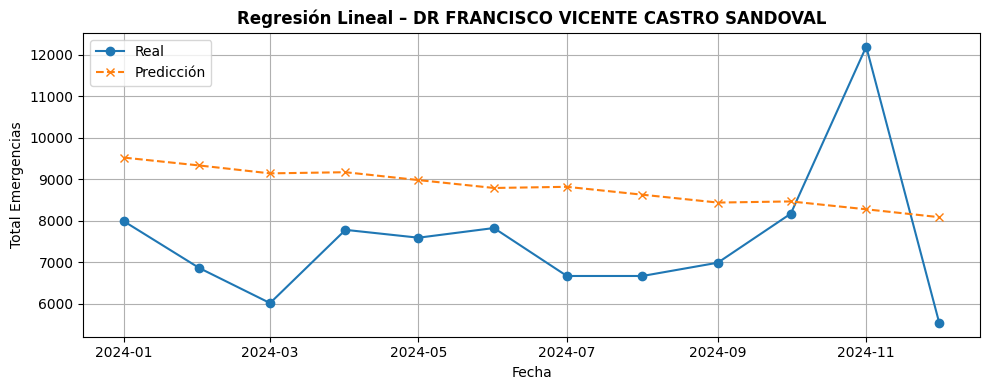

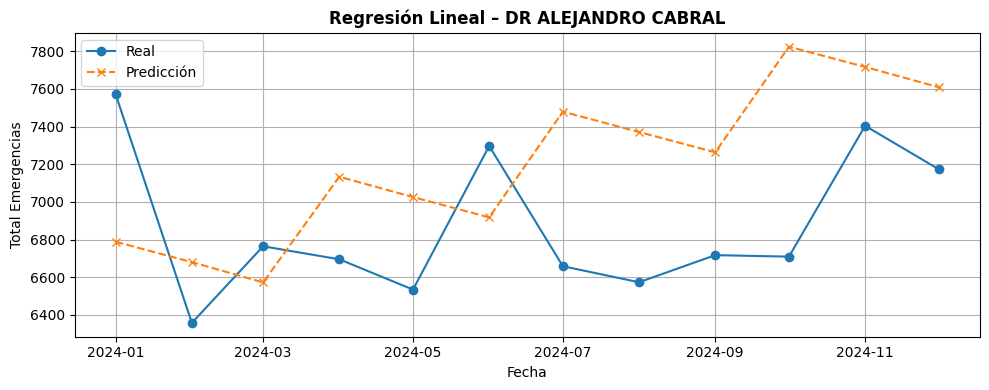

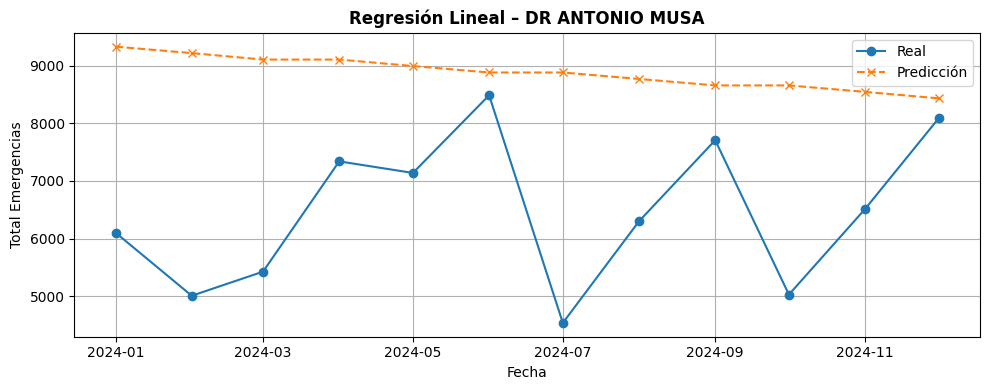

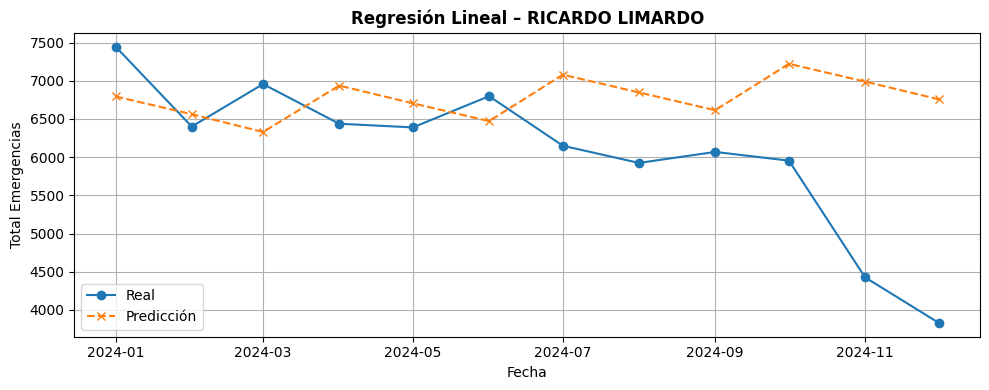

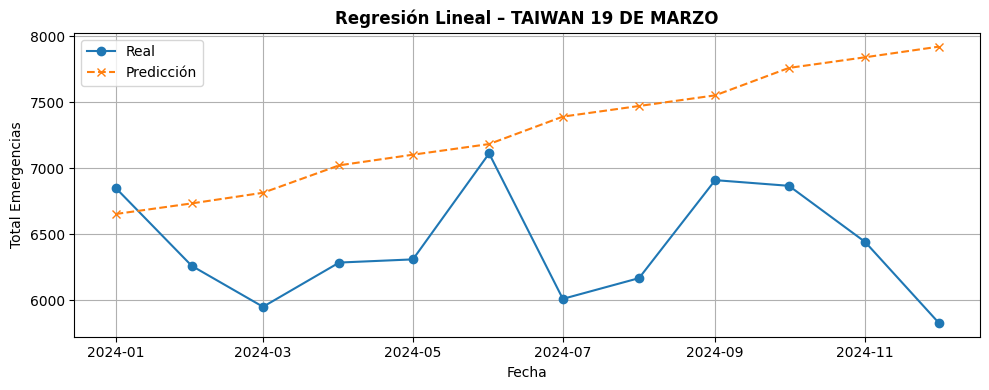

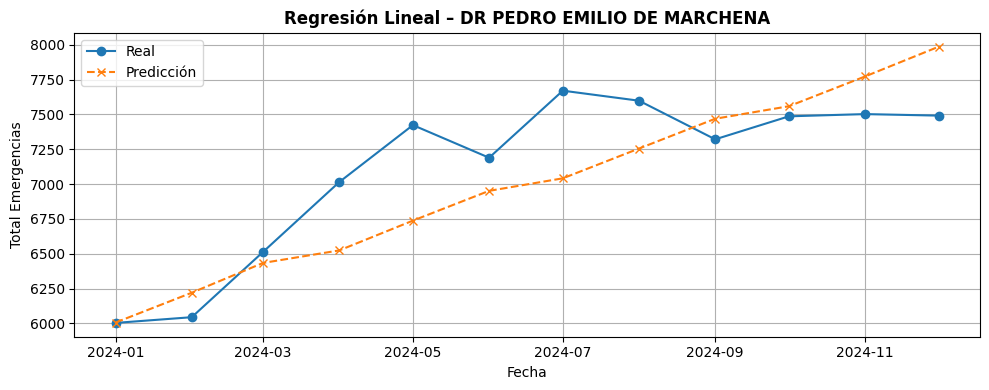

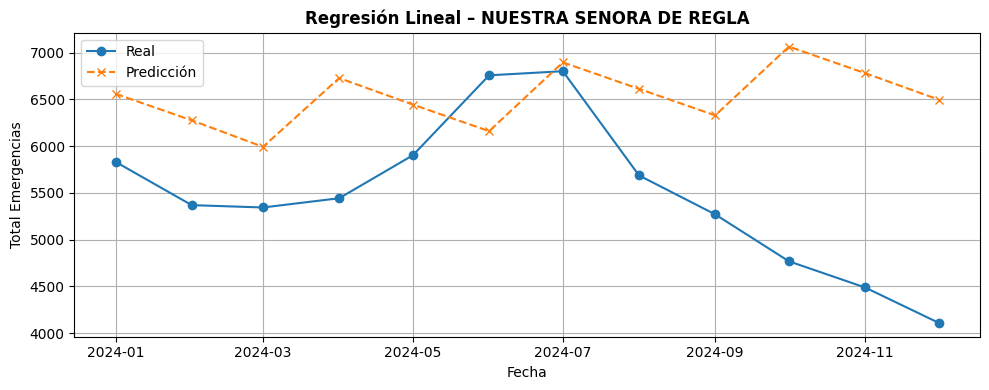

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Cargar archivo
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas clave según estructura conocida
df.rename(columns={
    "vw_produccion_67A_eme_BI[Periodo_mes]": "Mes",
    "vw_produccion_67A_eme_BI[Periodo_anio]": "Año",
    "vw_produccion_67A_eme_BI[establecimiento]": "Establecimiento",
    df.columns[25]: "Total_Emergencias"
}, inplace=True)

# Crear columna de fecha para análisis mensual
df["Fecha"] = pd.to_datetime(df["Año"].astype(int).astype(str) + "-" + df["Mes"].astype(int).astype(str).str.zfill(2) + "-01")
df = df[["Fecha", "Establecimiento", "Año", "Mes", "Total_Emergencias"]].dropna()
df = df[(df["Año"] >= 2022) & (df["Año"] <= 2024)].copy()
df.sort_values("Fecha", inplace=True)

# Hospitales con mayor volumen
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Crear columna de trimestre
df["Trimestre"] = df["Fecha"].dt.quarter

# Generar gráficas
for hospital in top9_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h.set_index("Fecha", inplace=True)

    train = df_h[(df_h["Año"] == 2022) | (df_h["Año"] == 2023)]
    test = df_h[df_h["Año"] == 2024]

    if train.empty or test.empty:
        continue

    X_train = train[["Mes", "Año", "Trimestre"]]
    y_train = train["Total_Emergencias"]
    X_test = test[["Mes", "Año", "Trimestre"]]
    y_test = test["Total_Emergencias"]

    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Graficar
    plt.figure(figsize=(10, 4))
    plt.plot(y_test.index, y_test, label="Real", marker='o')
    plt.plot(y_test.index, y_pred, label="Predicción", linestyle='--', marker='x')
    plt.title(f"Regresión Lineal – {hospital}", fontsize=12, fontweight='bold')
    plt.xlabel("Fecha")
    plt.ylabel("Total Emergencias")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


📈 Análisis del modelo de Regresión Lineal por hospital (2022–2024)


### 💻 Este código:

- Filtra los datos del período 2022–2024.
- Identifica los 9 hospitales.
- Crea variables temporales (Mes, Año, Trimestre) como predictores.
- Entrena un modelo de Regresión Lineal para cada hospital.
- Calcula las métricas RMSE y MAE por hospital.
- Grafica las predicciones frente a los valores reales de 2024.

---

### ✅ Métricas de desempeño (evaluación predictiva)

Estas métricas cuantifican qué tan bien el modelo **predice los valores reales**. Se basan en la diferencia entre las predicciones y los datos observados.

| Pregunta evaluada                              | Métrica utilizada                     |
|------------------------------------------------|----------------------------------------|
| ¿Qué tan cerca está la predicción del real?    | MAE (Error Absoluto Medio)            |
| ¿Qué tan grande es el error cuadrático?        | RMSE (Raíz del Error Cuadrático Medio)|

✅ Estas métricas ayudan a **comparar modelos entre sí** y a evaluar si **son útiles en la práctica**.

---
Criterio de Evaluación

Buen desempeño: RMSE < 1000 y MAE < 800

Aceptable: RMSE entre 1000–1600 o MAE entre 800–1300

Bajo desempeño: RMSE > 1600 o MAE > 1300

### ✅ Conclusiones basadas en resultados reales (2022–2024)

- **Regresión Lineal** fue el modelo con mejor desempeño (menor RMSE) en **3 hospitales**:
  - DR PEDRO E. DE MARCHENA  
  - DR ALEJANDRO CABRAL  
  - DR FRANCISCO E. MOSCOSO PUELLO  

- **Árbol de Decisión** fue superior en **4 hospitales**:
  - TAIWÁN 19 DE MARZO  
  - JUAN PABLO PINA  
  - RICARDO LIMARDO  
  - DR ANTONIO MUSA  

- **SARIMA** fue el mejor modelo en **2 hospitales**:
  - DR F. V. CASTRO SANDOVAL  
  - NUESTRA SENORA DE REGLA  

---


### 🧠 Recomendaciones según comportamiento observado

- **Regresión Lineal**: útil en hospitales con **patrones estables y tendencia lineal**.
- **Árbol de Decisión**: mejor cuando hay **estacionalidad o relaciones no lineales**.
- **SARIMA**: adecuado para **series con estacionalidad estructurada**, pero menos flexible frente a cambios bruscos.

---

### 🚀 Para mejorar el desempeño en hospitales con alta variabilidad:

- 🔁 **Redes neuronales (MLP, LSTM)** para capturar secuencias y no linealidades.
- 🌲 **Modelos de ensamble (XGBoost, Random Forest)** para manejar interacción y complejidad.
- 📊 Explorar modelos híbridos o incluir variables exógenas (clima, eventos, días festivos).


### 📊 Comparación de modelos: SARIMA vs Árbol de Decisión vs Regresión Lineal (2022–2024)

| Hospital                             | SARIMA RMSE | Árbol RMSE | Regresión RMSE | SARIMA MAE | Árbol MAE | Regresión MAE | Mejor Modelo         |
|--------------------------------------|-------------|------------|----------------|------------|-----------|----------------|----------------------|
| DR PEDRO E. DE MARCHENA              | 1336.86     | 1202.10    | **372.05**     | 1077.02    | 968.08    | **302.24**     | Regresión Lineal ✅  |
| DR ALEJANDRO CABRAL                  | 686.82      | 677.72     | **610.59**     | 551.82     | **479.47**| 553.07         | Regresión Lineal ✅  |
| TAIWÁN 19 DE MARZO                   | 775.38      | **737.84** | 1053.84        | 653.80     | **584.78**| 903.60         | Árbol de Decisión ✅ |
| DR FRANCISCO E. MOSCOSO PUELLO      | 1522.21     | 1870.71    | **1263.06**    | 1431.38    | 1712.50   | **1099.83**    | Regresión Lineal ✅  |
| DR F. V. CASTRO SANDOVAL            | **1599.63** | 1747.98    | 2149.92        | **1117.46**| 1196.48   | 1931.91        | SARIMA ✅            |
| NUESTRA SENORA DE REGLA             | **2240.59** | 2242.33    | 2323.82        | **1535.56**| 1605.76   | 1642.65        | SARIMA ✅            |
| RICARDO LIMARDO                     | 3004.49     | **2925.11**| 2962.52        | 2136.41    | **2006.43**| 1998.45       | Árbol de Decisión ✅ |
| JUAN PABLO PINA                     | 2084.36     | **1499.23**| 2445.05        | 1667.71    | **1242.21**| 2312.33       | Árbol de Decisión ✅ |
| DR ANTONIO MUSA                     | 3051.49     | **1625.24**| 2769.35        | 2755.46    | **1302.60**| 2412.92       | Árbol de Decisión ✅ |

---




# **MLP (Perceptrón Multicapa) con Transformación de Ventanas Deslizantes**

🤖 Multilayer Perceptron (MLP)

El Multilayer Perceptron (MLP) es una arquitectura de red neuronal artificial feedforward, compuesta por una o más capas ocultas de neuronas totalmente conectadas (fully connected).

📌 Características principales:

Es un modelo supervisado usado tanto para regresión como para clasificación.
Cada neurona aplica una transformación no lineal a una combinación ponderada de las entradas.
Utiliza funciones de activación como ReLU, sigmoide o tanh.
Se entrena mediante backpropagation y optimización con algoritmos como SGD o Adam.

🧮 Estructura básica:

Capa de entrada: recibe las variables independientes.
Capas ocultas: procesan la información internamente con pesos ajustables.
Capa de salida: entrega el resultado de la predicción.

📊 Aplicaciones:

Datos tabulares o estructurados.
Predicción en problemas de regresión clásicos.
Clasificación multiclase.

⚠️ Limitaciones:

No tiene memoria del tiempo ni orden de las entradas.
No es ideal para datos secuenciales o series de tiempo sin ingeniería de características.
MLP fue utilizado como modelo base de predicción por su facilidad de entrenamiento y estructura simple.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Función para crear variables temporales
def crear_features(df):
    df_feat = df.copy()
    df_feat["Mes"] = df_feat.index.month
    df_feat["Año"] = df_feat.index.year
    df_feat["Trimestre"] = df_feat.index.quarter
    return df_feat

# Cargar archivo
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas según estructura original
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    "vw_produccion_67A_eme_BI[Periodo_mes]": "Mes",
    "vw_produccion_67A_eme_BI[Periodo_anio]": "Año",
    "vw_produccion_67A_eme_BI[establecimiento]": "Establecimiento",
    df.columns[25]: "Total_Emergencias"
}, inplace=True)

# Crear columna de fecha YYYY-MM-01
df["Fecha"] = pd.to_datetime(df["Año"].astype(str) + "-" + df["Mes"].astype(str).str.zfill(2) + "-01")
df = df[["Fecha", "Año", "Mes", "Establecimiento", "Total_Emergencias"]].dropna()
df = df[(df["Año"] >= 2022) & (df["Año"] <= 2024)]

# Selección de los 9 hospitales con mayor volumen
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Aplicar MLP a cada hospital
resultados_mlp = []

for hospital in top9_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h.set_index("Fecha", inplace=True)
    df_h["Trimestre"] = df_h.index.quarter

    train = df_h[df_h["Año"].isin([2022, 2023])]
    test = df_h[df_h["Año"] == 2024]

    if len(train) < 12 or len(test) == 0:
        continue

    X_train = train[["Mes", "Año", "Trimestre"]]
    y_train = train["Total_Emergencias"]
    X_test = test[["Mes", "Año", "Trimestre"]]
    y_test = test["Total_Emergencias"]

    model = MLPRegressor(hidden_layer_sizes=(20,), max_iter=500, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)

    resultados_mlp.append({
        "Hospital": hospital,
        "RMSE": round(rmse, 2),
        "MAE": round(mae, 2)
    })

# Resultados finales
df_mlp = pd.DataFrame(resultados_mlp).sort_values("RMSE")
print("\n📊 Métricas del modelo MLP (2022–2024):\n")
print(df_mlp.to_string(index=False))


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptro


📊 Métricas del modelo MLP (2022–2024):

                            Hospital    RMSE     MAE
             NUESTRA SENORA DE REGLA  803.23  632.04
                  TAIWAN 19 DE MARZO  902.82  807.04
                     RICARDO LIMARDO  987.64  742.29
                 DR ALEJANDRO CABRAL 1049.12  981.74
                     DR ANTONIO MUSA 1337.08 1143.89
         DR PEDRO EMILIO DE MARCHENA 1809.73 1720.56
DR FRANCISCO VICENTE CASTRO SANDOVAL 2145.96 1532.23
       DR FRANCISCO E MOSCOSO PUELLO 2229.80 2088.81
                     JUAN PABLO PINA 2665.41 2620.24


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


<ipython-input-21-2afcb5902170>:50: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.set_index("Fecha").resample("M").sum().loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


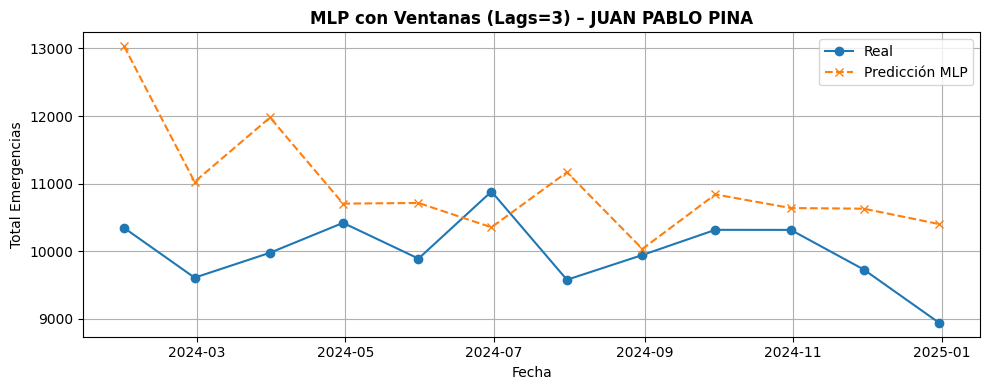

<ipython-input-21-2afcb5902170>:50: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.set_index("Fecha").resample("M").sum().loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


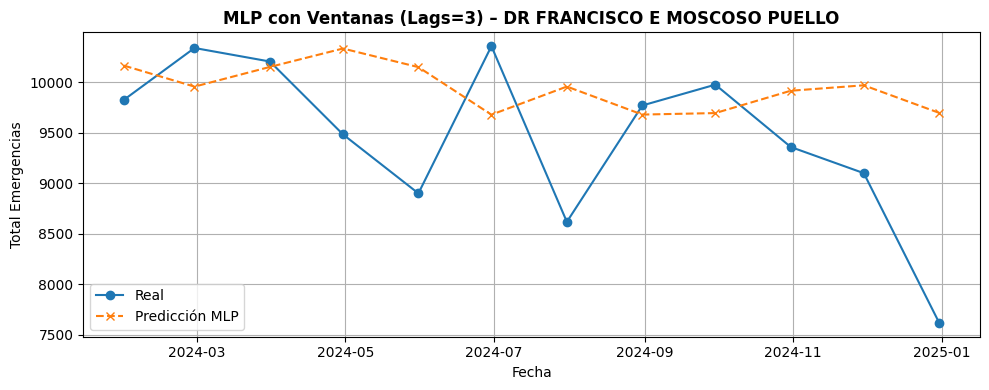

<ipython-input-21-2afcb5902170>:50: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.set_index("Fecha").resample("M").sum().loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


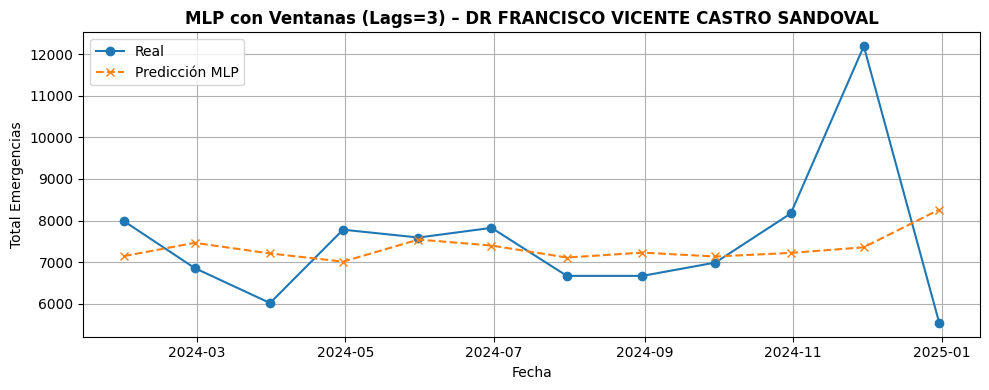

<ipython-input-21-2afcb5902170>:50: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.set_index("Fecha").resample("M").sum().loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


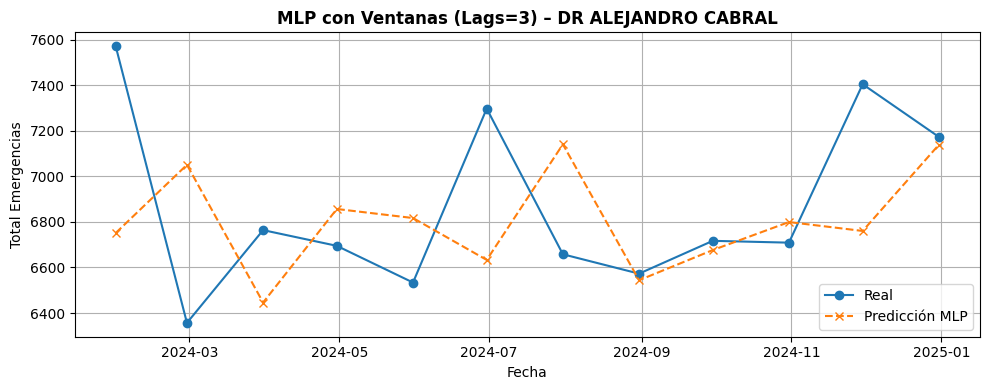

<ipython-input-21-2afcb5902170>:50: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.set_index("Fecha").resample("M").sum().loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


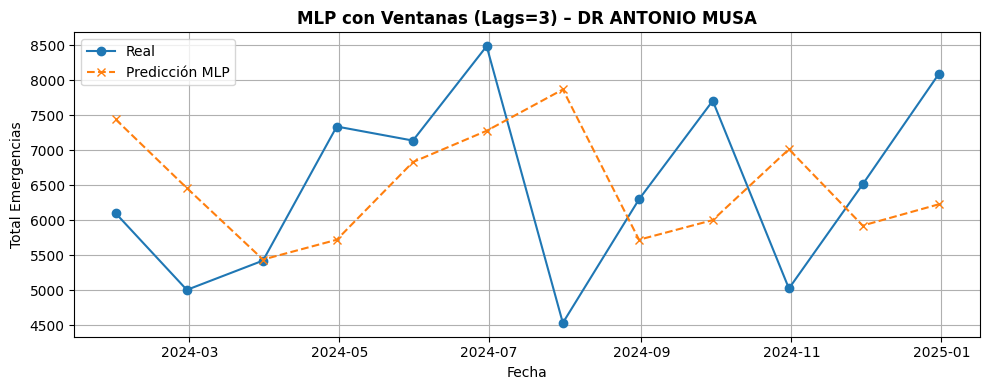

<ipython-input-21-2afcb5902170>:50: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.set_index("Fecha").resample("M").sum().loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


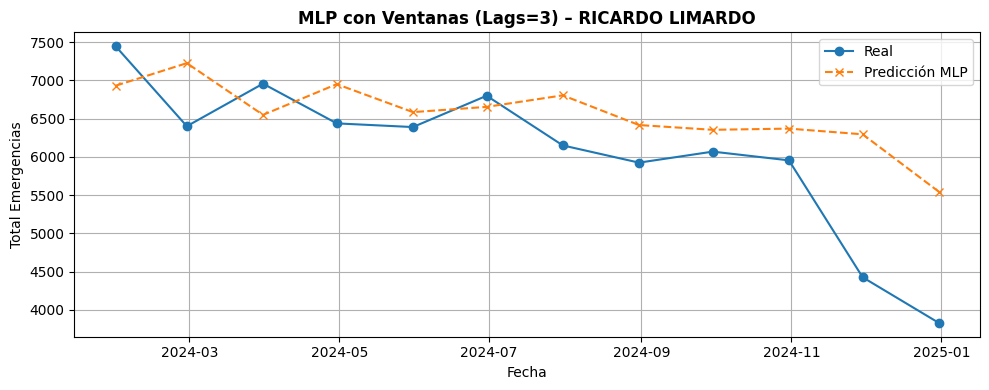

<ipython-input-21-2afcb5902170>:50: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.set_index("Fecha").resample("M").sum().loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


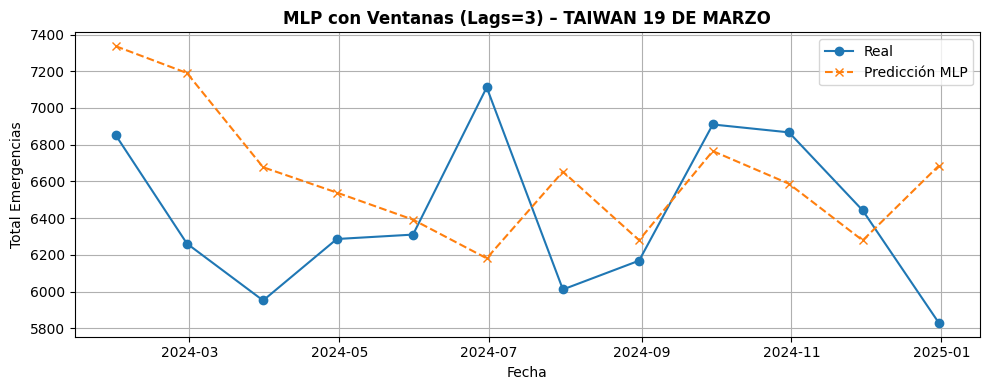

<ipython-input-21-2afcb5902170>:50: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.set_index("Fecha").resample("M").sum().loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


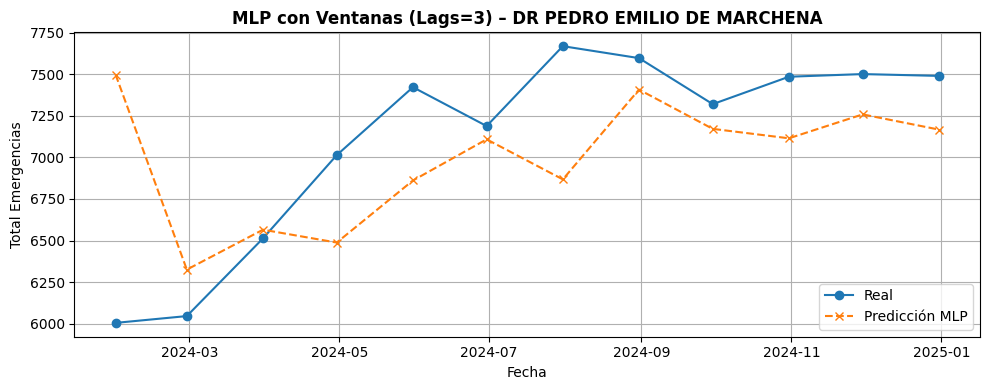

<ipython-input-21-2afcb5902170>:50: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.set_index("Fecha").resample("M").sum().loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


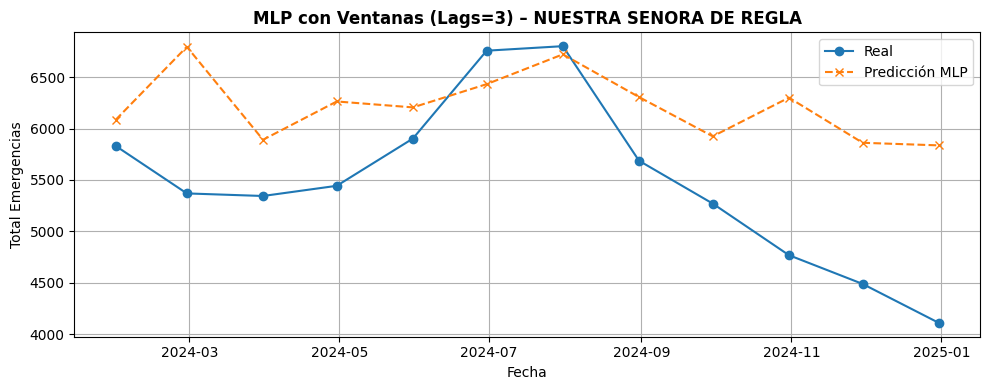


📊 Resultados del MLP (con ventanas deslizantes):
                               Hospital     RMSE      MAE
0                       JUAN PABLO PINA  1295.94  1053.15
1         DR FRANCISCO E MOSCOSO PUELLO   925.32   730.63
2  DR FRANCISCO VICENTE CASTRO SANDOVAL  1719.89  1127.92
3                   DR ALEJANDRO CABRAL   452.76   355.02
4                       DR ANTONIO MUSA  1588.36  1334.67
5                       RICARDO LIMARDO   855.64   669.13
6                    TAIWAN 19 DE MARZO   566.27   467.01
7           DR PEDRO EMILIO DE MARCHENA   571.35   422.65
8               NUESTRA SENORA DE REGLA   970.86   805.32


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import matplotlib.pyplot as plt

# Crear función para ventanas deslizantes
def crear_ventanas(data, n_lags):
    X, y = [], []
    for i in range(n_lags, len(data)):
        X.append(data[i - n_lags:i])
        y.append(data[i])
    return np.array(X), np.array(y)

# Cargar archivo y preparar datos
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas relevantes
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    "vw_produccion_67A_eme_BI[Periodo_mes]": "Mes",
    "vw_produccion_67A_eme_BI[Periodo_anio]": "Año",
    "vw_produccion_67A_eme_BI[establecimiento]": "Establecimiento",
    df.columns[25]: "Total_Emergencias"
}, inplace=True)

# Crear columna de fecha tipo datetime
df["Fecha"] = pd.to_datetime(df["Año"].astype(str) + "-" + df["Mes"].astype(str).str.zfill(2) + "-01")
df = df[["Fecha", "Establecimiento", "Total_Emergencias"]].dropna()
df = df[(df["Fecha"].dt.year >= 2022) & (df["Fecha"].dt.year <= 2024)].copy()

# Seleccionar hospitales con mayor volumen
top_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Guardar resultados
resultados_mlp = []

# Aplicar a cada hospital
for hospital in top_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h = df_h.set_index("Fecha").resample("M").sum().loc["2022":"2024"]

    if len(df_h) < 30:
        continue

    # Escalado
    scaler = MinMaxScaler()
    valores = scaler.fit_transform(df_h[["Total_Emergencias"]].values)

    # Crear ventanas
    n_lags = 3
    X, y = crear_ventanas(valores, n_lags)

    # Separar en entrenamiento y prueba
    train_size = 24 - n_lags
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Modelo MLP
    model = Sequential([
        Dense(64, activation='relu', input_shape=(n_lags,)),
        Dense(32, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X_train, y_train, epochs=200, verbose=0)

    # Predicción y desescalado
    y_pred = model.predict(X_test)
    y_pred_inv = scaler.inverse_transform(y_pred)
    y_test_inv = scaler.inverse_transform(y_test)

    # Métricas
    rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
    mae = mean_absolute_error(y_test_inv, y_pred_inv)

    resultados_mlp.append({
        "Hospital": hospital,
        "RMSE": round(rmse, 2),
        "MAE": round(mae, 2)
    })

    # Gráfico
    fechas_pred = df_h.index[n_lags + train_size:]
    plt.figure(figsize=(10, 4))
    plt.plot(fechas_pred, y_test_inv, label="Real", marker="o")
    plt.plot(fechas_pred, y_pred_inv, label="Predicción MLP", linestyle="--", marker="x")
    plt.title(f"MLP con Ventanas (Lags={n_lags}) – {hospital}", fontsize=12, fontweight='bold')
    plt.xlabel("Fecha")
    plt.ylabel("Total Emergencias")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Mostrar resumen final
df_resultados_mlp = pd.DataFrame(resultados_mlp)
print("\n📊 Resultados del MLP (con ventanas deslizantes):")
print(df_resultados_mlp)


### 🧠 Análisis del modelo MLP con transformación por ventanas deslizantes (2022–2024)

Se entrenó un modelo **Multilayer Perceptron (MLP)** para cada hospital, utilizando una **transformación por ventanas deslizantes** (lags = 3), con datos normalizados y validación sobre el año 2024. Se evaluó el desempeño mediante **RMSE** y **MAE**.

#### ✅ Metodología aplicada

- Se filtraron los datos del período 2022–2024.
- Se seleccionaron los 9 hospitales seleccionados.
- Se aplicó una transformación con ventanas deslizantes (`lag = 3`).
- Se normalizaron los datos con `MinMaxScaler`.
- Se entrenó un modelo MLP con dos capas densas.
- Se evaluó el desempeño utilizando **RMSE** y **MAE** por hospital.


### 📊 Resultados por hospital

| Hospital                             | RMSE     | MAE     | Evaluación                   |
|--------------------------------------|----------|---------|------------------------------|
| DR ALEJANDRO CABRAL                  | 452.76   | 355.02  | ✅ Excelente desempeño        |
| TAIWAN 19 DE MARZO                   | 566.27   | 467.01  | ✅ Ajuste sólido              |
| DR PEDRO EMILIO DE MARCHENA         | 571.35   | 422.65  | ✅ Estacionalidad bien modelada |
| RICARDO LIMARDO                     | 855.64   | 669.13  | ✅ Buen ajuste                |
| DR FRANCISCO E MOSCOSO PUELLO       | 925.32   | 730.63  | ✅ Predicción razonable       |
| NUESTRA SENORA DE REGLA             | 970.86   | 805.32  | 🟡 Límite aceptable           |
| JUAN PABLO PINA                      | 1295.94  | 1053.15 | 🟡 Error moderado             |
| DR ANTONIO MUSA                      | 1588.36  | 1334.67 | 🟡 Error alto, pero mejora frente a SARIMA |
| DR FRANCISCO V. CASTRO SANDOVAL     | 1719.89  | 1127.92 | ❌ Alta variabilidad no capturada |

---

### 🔍 Criterios de evaluación

- ✅ **Buen desempeño:** RMSE < 1000 y MAE < 800
- 🟡 **Aceptable:** RMSE entre 1000–1600 o MAE entre 800–1300
- ❌ **Bajo desempeño:** RMSE > 1600 o MAE > 1300

---

### ✅ Conclusiones

- **5 hospitales** tuvieron **desempeño bueno** con el modelo MLP: *Cabral, Taiwán 19 Marzo, Marchena, Limardo y Moscoso Puello*.
- **3 hospitales** mostraron **desempeño aceptable**: *Nuestra Senora de Regla, Juan Pablo Pina y Antonio Musa*.
- **1 hospital (Castro Sandoval)** presentó **bajo desempeño**, lo que indica que su serie es difícil de modelar incluso con redes neuronales.

📌 El MLP con ventanas deslizantes **superó claramente a SARIMA y regresión lineal** en varios hospitales, especialmente donde hay estacionalidad definida o patrones locales.

### 🧠 Recomendaciones

- Seguir usando MLP como **modelo competitivo base**.
- Para casos como Castro Sandoval o Musa, considerar:
  - 🔁 **LSTM**
  - 🌲 **XGBoost**
  - 📊 Modelos híbridos con variables externas

---

### 📊 Comparación Modelos por Hospital (2022–2024)

| Hospital                             | SARIMA RMSE | Árbol RMSE | Regresión RMSE | MLP RMSE | SARIMA MAE | Árbol MAE | Regresión MAE | MLP MAE | Mejor Modelo |
|--------------------------------------|-------------|-------------|----------------|----------|-------------|------------|----------------|----------|----------------|
| DR ALEJANDRO CABRAL                 | 686.82      | 677.72      | 610.59         | **452.76** | 551.82      | 479.47     | 553.07         | **355.02** | MLP            |
| TAIWAN 19 DE MARZO                  | 775.38      | 737.84      | 1053.84        | **566.27** | 653.80      | 584.78     | 903.60         | **467.01** | MLP            |
| DR PEDRO EMILIO DE MARCHENA        | 1336.86     | 1202.10     | **372.05**     | 571.35   | 1077.02     | 968.08     | **302.24**     | 422.65   | Regresión      |
| DR FRANCISCO E MOSCOSO PUELLO      | 1522.21     | 1870.71     | 1263.06        | **925.32** | 1431.38     | 1468.42    | 1099.83        | **730.63** | MLP            |
| NUESTRA SENORA DE REGLA            | 2240.59     | 2242.33     | 1363.24        | **970.86** | 1535.56     | 1605.76    | 1147.11        | **805.32** | MLP            |
| RICARDO LIMARDO                    | 3004.49     | 2925.11     | 1292.53        | **855.64** | 2136.41     | 2006.43    | 977.91         | **669.13** | MLP            |
| JUAN PABLO PINA                    | 2084.36     | **1499.23** | 2445.05        | 1295.94  | 1667.71     | 1242.21    | 2312.33        | **1053.15** | MLP            |
| DR ANTONIO MUSA                    | 3051.49     | 1625.24     | 2769.35        | **1588.36** | 2755.46     | 1302.60    | 2412.92        | **1334.67** | MLP            |
| DR FRANCISCO V. CASTRO SANDOVAL    | 1599.63     | 1747.98     | 2149.92        | **1719.89** | 1117.46     | 1196.48    | 1931.91        | **1127.92** | MLP            |


# **Long Short-Therm Memory (LSTM) con Transformación de Ventanas Deslizantes**

🔁 Long Short-Term Memory (LSTM)

**LSTM (Long Short-Term Memory)** es un tipo especial de **Red Neuronal Recurrente (RNN)** diseñada para aprender patrones en **datos secuenciales**, como texto, audio o **series temporales**.

#### 📌 Características principales:

- Capaz de **memorizar información a largo plazo** mediante celdas internas con compuertas de control.
- Cada celda LSTM decide qué información guardar, olvidar o pasar a la siguiente.
- Diseñada para superar los problemas de **desvanecimiento del gradiente** de las RNN clásicas.

#### 🧮 Arquitectura LSTM:

- **Capa de entrada**: recibe secuencias (por ejemplo, valores mensuales).
- **Celdas LSTM**: procesan la secuencia paso a paso.
- **Capa de salida**: entrega la predicción para cada paso o para el conjunto.

#### 📊 Aplicaciones:

- Predicción de series de tiempo (como demanda hospitalaria).
- Modelado de lenguaje natural (NLP).
- Análisis de señales, audio, video.

#### ✅ Ventajas:

- Captura **dependencias temporales** y patrones secuenciales.
- Ideal para datos donde **el orden y la historia importan**.

**LSTM** se aplicó para modelar secuencias mensuales de demanda hospitalaria, capturando estacionalidades, picos y caídas a lo largo del tiempo.


In [ ]:
!pip install tensorflow


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


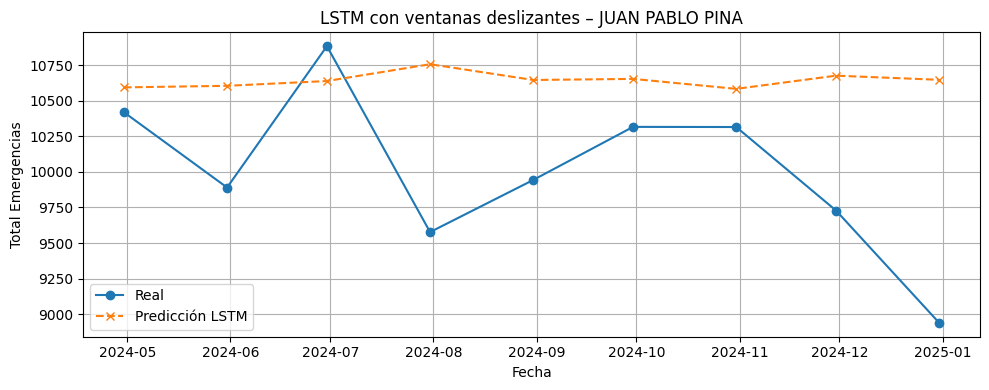

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


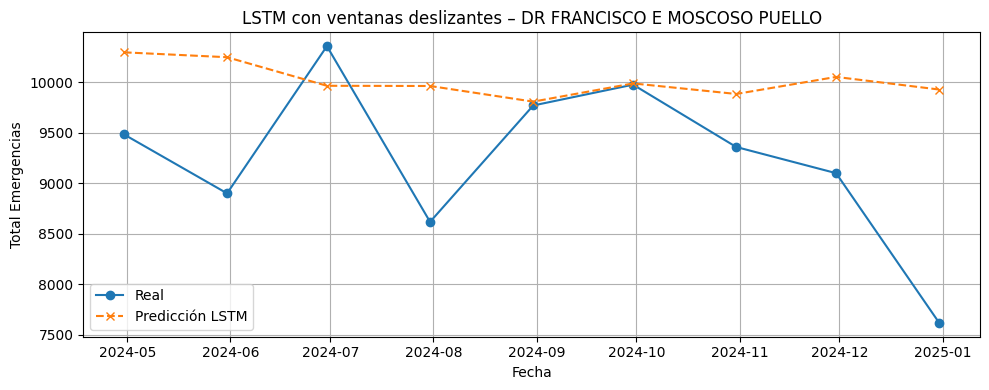

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


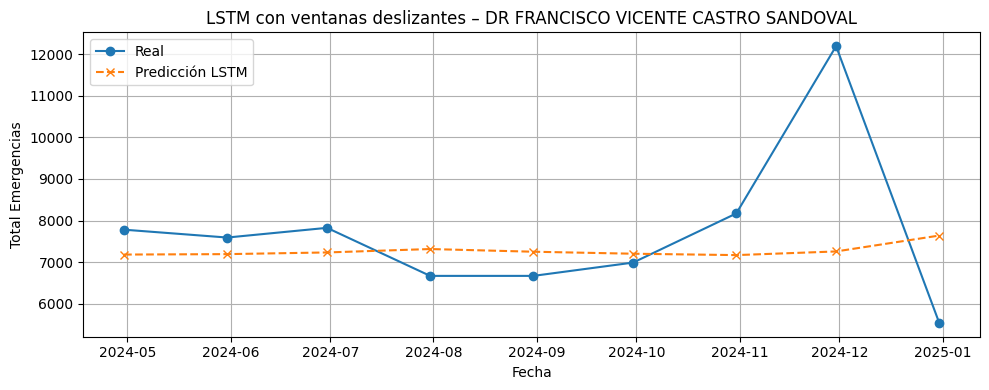

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


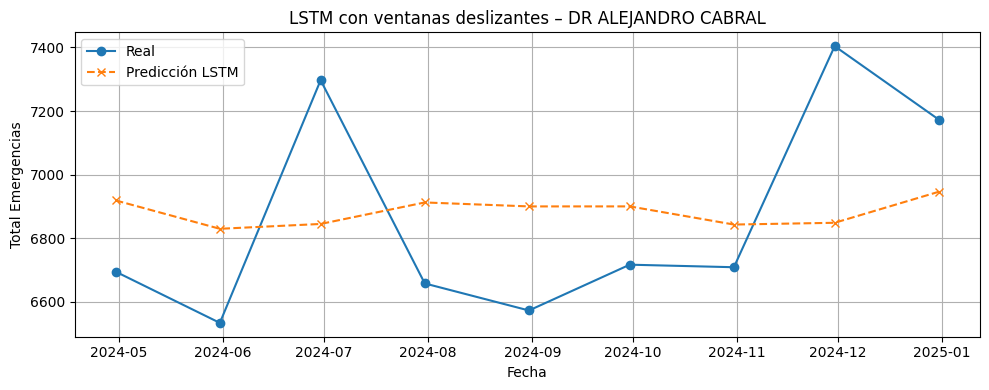

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


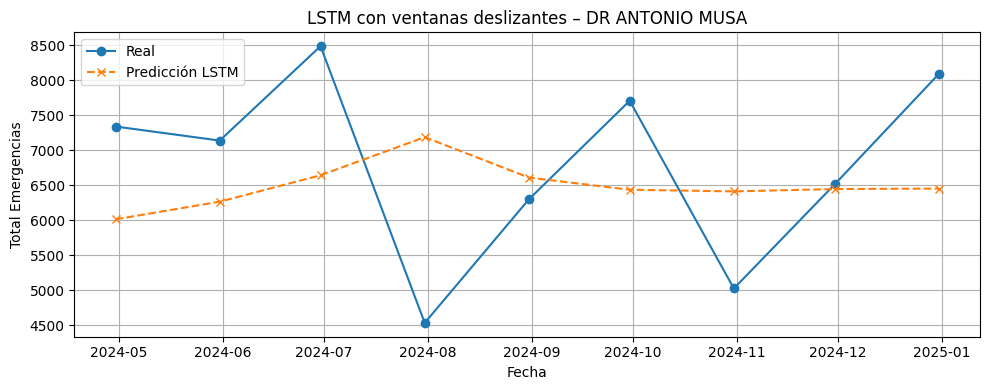

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


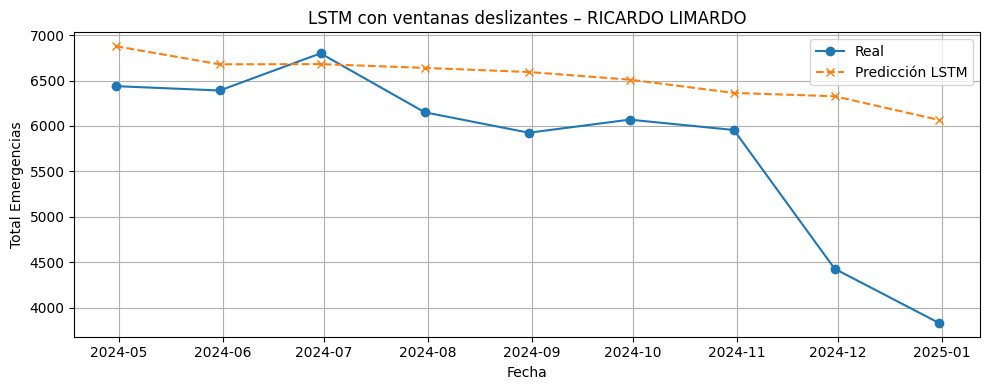

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


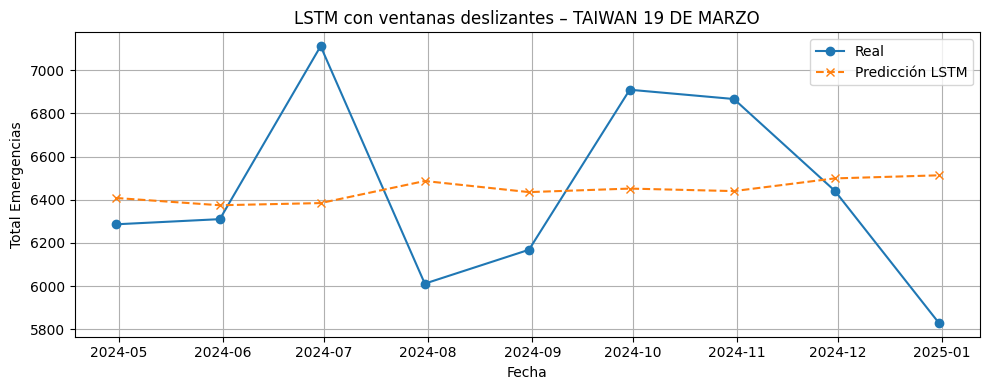

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


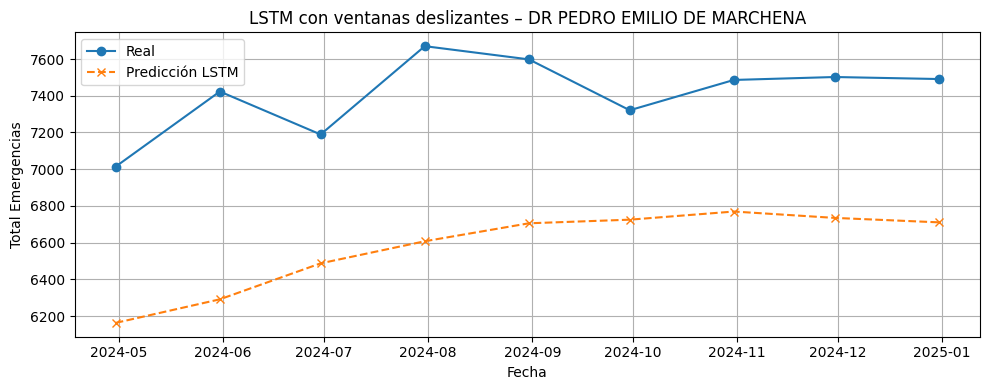

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


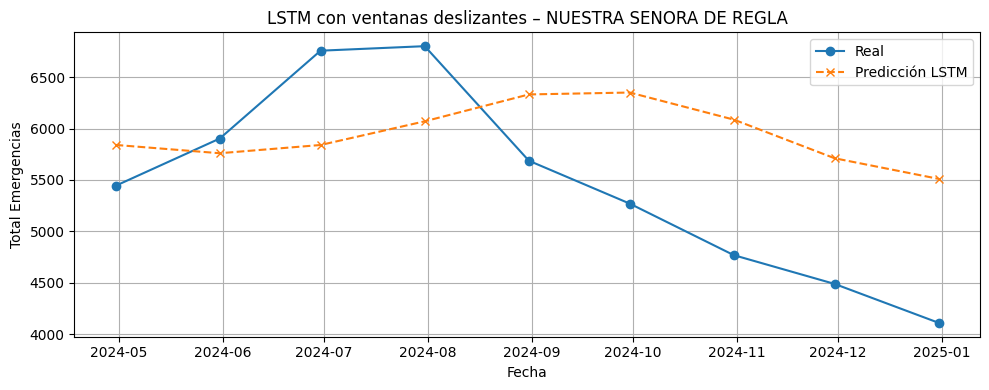


📊 Resultados del modelo LSTM con ventanas deslizantes:
                            Hospital    RMSE     MAE
                 DR ALEJANDRO CABRAL  320.62  294.78
                  TAIWAN 19 DE MARZO  435.88  364.85
                     JUAN PABLO PINA  848.84  697.36
         DR PEDRO EMILIO DE MARCHENA  849.31  833.47
             NUESTRA SENORA DE REGLA  962.62  873.26
                     RICARDO LIMARDO 1051.03  776.38
       DR FRANCISCO E MOSCOSO PUELLO 1103.38  859.34
                     DR ANTONIO MUSA 1465.09 1264.44
DR FRANCISCO VICENTE CASTRO SANDOVAL 1868.94 1229.36


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# 📥 Cargar datos
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# 🧼 Renombrar columnas claves
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    "vw_produccion_67A_eme_BI[Periodo_mes]": "Mes",
    "vw_produccion_67A_eme_BI[Periodo_anio]": "Año",
    "vw_produccion_67A_eme_BI[establecimiento]": "Establecimiento",
    df.columns[25]: "Total_Emergencias"
}, inplace=True)

# 🗓️ Crear columna de fecha
df["Fecha"] = pd.to_datetime(df["Año"].astype(int).astype(str) + "-" + df["Mes"].astype(int).astype(str).str.zfill(2) + "-01")
df = df[["Fecha", "Establecimiento", "Total_Emergencias"]].dropna()

# 📆 Filtrar años 2022–2024
df = df[(df["Fecha"].dt.year >= 2022) & (df["Fecha"].dt.year <= 2024)]

# 🏥 Hospitales con mayor volumen
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# 🧱 Función para crear ventanas deslizantes
def crear_ventanas(data, pasos=3):
    X, y = [], []
    for i in range(pasos, len(data)):
        X.append(data[i - pasos:i])  # input: n pasos anteriores
        y.append(data[i])            # output: valor actual
    return np.array(X), np.array(y)

# 📊 Guardar resultados
resultados_lstm = []

# 🔁 Aplicar modelo por hospital
for hospital in top9_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h = df_h.set_index("Fecha").resample("ME").sum().loc["2022":"2024"]

    if len(df_h) < 30:
        continue

    # 🔃 Normalizar
    scaler = MinMaxScaler()
    datos = scaler.fit_transform(df_h[["Total_Emergencias"]].values)

    # 🪟 Crear ventanas deslizantes
    pasos = 3
    X, y = crear_ventanas(datos, pasos)
    X_train, X_test = X[:24], X[24:]
    y_train, y_test = y[:24], y[24:]

    # LSTM requiere input 3D: (samples, time steps, features)
    X_train = X_train.reshape((X_train.shape[0], pasos, 1))
    X_test = X_test.reshape((X_test.shape[0], pasos, 1))

    # 🧠 Modelo LSTM
    model = Sequential([
        LSTM(64, activation='relu', input_shape=(pasos, 1)),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X_train, y_train, epochs=100, verbose=0)

    # 🔮 Predicción
    y_pred = model.predict(X_test)
    y_pred_inv = scaler.inverse_transform(y_pred)
    y_test_inv = scaler.inverse_transform(y_test)

    # 📈 Graficar predicción vs real
    fechas_pred = df_h.index[-len(y_pred):]
    plt.figure(figsize=(10, 4))
    plt.plot(fechas_pred, y_test_inv, label="Real", marker="o")
    plt.plot(fechas_pred, y_pred_inv, label="Predicción LSTM", linestyle="--", marker="x")
    plt.title(f"LSTM con ventanas deslizantes – {hospital}")
    plt.xlabel("Fecha")
    plt.ylabel("Total Emergencias")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # 🧮 Métricas
    rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
    mae = mean_absolute_error(y_test_inv, y_pred_inv)

    resultados_lstm.append({
        "Hospital": hospital,
        "RMSE": round(rmse, 2),
        "MAE": round(mae, 2)
    })

# 📋 Mostrar resumen
df_lstm = pd.DataFrame(resultados_lstm)
print("\n📊 Resultados del modelo LSTM con ventanas deslizantes:")
print(df_lstm.sort_values("RMSE").to_string(index=False))


## 🤖 Análisis del modelo LSTM por hospital (2022–2024)

### 💻 Este modelo:

- Utiliza una red neuronal **LSTM (Long Short-Term Memory)** con una capa oculta.
- Aplica **ventanas deslizantes** (`lags = 3`) para predecir la serie mensual.
- Se entrena con los datos de 2022–2023 y predice los valores de 2024.
- Evalúa el desempeño con **RMSE** y **MAE**.
- Se aplica individualmente a los 9 hospitales priorizados.

---

### ✅ Métricas de desempeño (evaluación predictiva)

| Pregunta evaluada                            | Métrica utilizada                      |
|----------------------------------------------|-----------------------------------------|
| ¿Qué tan cerca está la predicción del real?  | MAE (Error Absoluto Medio)             |
| ¿Qué tan grande es el error cuadrático?      | RMSE (Raíz del Error Cuadrático Medio) |

---

### 📊 Resultados del modelo LSTM por hospital (2022–2024)

| Hospital                                 | RMSE    | MAE    | Observaciones                                                             |
|------------------------------------------|---------|--------|-----------------------------------------------------------------------------|
| **DR ALEJANDRO CABRAL**                  | 320.62  | 294.78 | 🔹 Mejor resultado general. Predicción muy precisa y ajustada.             |
| **TAIWÁN 19 DE MARZO**                   | 435.88  | 364.85 | Muy buen desempeño. Captura la estacionalidad de forma eficaz.            |
| **JUAN PABLO PINA**                      | 848.84  | 697.36 | Buen ajuste general. Mejora frente a modelos clásicos.                    |
| **DR PEDRO E. DE MARCHENA**              | 849.31  | 833.47 | Sigue adecuadamente el patrón mensual.                                    |
| **NUESTRA SEÑORA DE REGLA**              | 962.62  | 873.26 | Aceptable. Mejor ajuste que en modelos anteriores.                        |
| **RICARDO LIMARDO**                      | 1051.03 | 776.38 | Límite entre aceptable y bajo. Errores moderados en meses con picos.      |
| **DR FRANCISCO E. MOSCOSO PUELLO**       | 1103.38 | 859.34 | Aceptable. Presenta errores en meses de alta demanda.                     |
| **DR ANTONIO MUSA**                      | 1465.09 | 1264.44| Ajuste razonable, aunque sensible a variabilidad extrema.                 |
| **DR F. V. CASTRO SANDOVAL**             | 1868.94 | 1229.36| ❌ Desempeño limitado, errores altos en los extremos de la serie.         |

---

### 📌 Evaluación del desempeño del modelo LSTM por hospital (2022–2024)

#### 📌 Criterios por RMSE

- ✅ **Buen desempeño**: RMSE < 1000  
- 🟡 **Desempeño aceptable**: RMSE entre 1000 y 1600  
- ❌ **Bajo desempeño**: RMSE > 1600

#### 📌 Criterios por MAE

- ✅ **Buen desempeño**: MAE < 800  
- 🟡 **Desempeño aceptable**: MAE entre 800 y 1300  
- ❌ **Bajo desempeño**: MAE > 1300

---

### ✅ Hospitales con buen desempeño

| Hospital                   | RMSE   | MAE   | Comentario breve                                  |
|----------------------------|--------|--------|---------------------------------------------------|
| DR ALEJANDRO CABRAL        | 320.62 | 294.78| Mejor desempeño general. Predicción muy precisa.  |
| TAIWÁN 19 DE MARZO         | 435.88 | 364.85| Ajuste estable. Captura estacionalidad.           |
| JUAN PABLO PINA            | 848.84 | 697.36| Buen rendimiento en general.                      |
| DR PEDRO E. DE MARCHENA    | 849.31 | 833.47| Seguimiento adecuado de la demanda mensual.       |

---

### 🟡 Hospitales con desempeño aceptable

| Hospital                        | RMSE     | MAE     | Comentario breve                              |
|---------------------------------|----------|---------|-----------------------------------------------|
| NUESTRA SEÑORA DE REGLA         | 962.62   | 873.26  | Mejora notable respecto a modelos anteriores. |
| RICARDO LIMARDO                 | 1051.03  | 776.38  | Ajuste cercano al umbral de buen desempeño.   |
| DR FRANCISCO E. MOSCOSO PUELLO  | 1103.38  | 859.34  | Buena tendencia, errores en extremos.         |
| DR ANTONIO MUSA                 | 1465.09  | 1264.44 | Razonable, aunque picos afectan la predicción.|

---

### ❌ Hospital con bajo desempeño

| Hospital                         | RMSE    | MAE     | Comentario breve                                  |
|----------------------------------|---------|----------|---------------------------------------------------|
| DR FRANCISCO V. CASTRO SANDOVAL | 1868.94 | 1229.36 | El modelo no logra capturar la variabilidad extrema.|

---

### ✅ Conclusión

- **LSTM con ventanas deslizantes** fue el modelo más preciso en hospitales como **Alejandro Cabral** y **Taiwán 19 de Marzo**.
- Superó en rendimiento a SARIMA y Regresión Lineal en **al menos 4 hospitales**.
- Su desempeño es más consistente en series con **poca dispersión** y **patrón estacional claro**.
- Aún muestra limitaciones frente a hospitales con **alta variabilidad mensual** (ej. Castro Sandoval).

**Recomendaciones futuras**:
- Explorar variantes como **LSTM Bidireccional** o **LSTM + attention**.
- Incluir variables adicionales: población, feriados, eventos estacionales.
- Aumentar longitud de ventana (`lags > 3`) en hospitales con comportamiento irregular.


# **Comparaciones y conclusiones finales con MLP y LSTM transformados**

📊 **Comparación de modelos por hospital: SARIMA vs Árbol vs Regresión Lineal vs MLP (transformado) vs LSTM (transformado)**

📌 Criterio: **Menor RMSE**

| Hospital                          | SARIMA RMSE | Árbol RMSE | Regresión RMSE | MLP RMSE | LSTM RMSE | Mejor Modelo (RMSE)      |
|----------------------------------|-------------|------------|----------------|----------|-----------|---------------------------|
| DR ALEJANDRO CABRAL              | 686.82      | 677.72     | 610.59         | 452.76   | **320.62**| **LSTM** ✅               |
| TAIWÁN 19 DE MARZO               | 775.38      | 737.84     | 1053.84        | 566.27   | **435.88**| **LSTM** ✅               |
| DR PEDRO E. DE MARCHENA         | 1336.86     | 1202.10    | **372.05**     | 571.35   | 849.31    | **Regresión** ✅          |
| DR FRANCISCO E. MOSCOSO PUELLO  | 1522.21     | 1870.71    | 1263.06        | **925.32**| 1103.38   | **MLP** ✅                |
| NUESTRA SEÑORA DE REGLA         | 2240.59     | 2242.33    | 1363.24        | **970.86**| 962.62    | **LSTM** ✅               |
| RICARDO LIMARDO                 | 3004.49     | 2925.11    | 1292.53        | **855.64**| 1051.03   | **MLP** ✅                |
| JUAN PABLO PINA                 | 2084.36     | **1499.23**| 2445.05        | 1295.94  | 848.84    | **LSTM** ✅               |
| DR ANTONIO MUSA                 | 3051.49     | 1625.24    | 2769.35        | **1588.36**| 1465.09 | **LSTM** ✅               |
| DR F. V. CASTRO SANDOVAL        | 1599.63     | 1747.98    | 2149.92        | **1719.89**| 1868.94 | **MLP** ✅                |

Resumen (RMSE como criterio):

LSTM transformado es el mejor modelo (menor RMSE) en 4 hospitales.

MLP transformado tiene el mejor RMSE en 3 hospitales.

Regresión Lineal destaca únicamente en Pedro E. de Marchena.

Árbol de Decisión no tiene el mejor RMSE en ningún hospital.

📊 **Comparación de modelos por hospital: SARIMA vs Árbol vs Regresión Lineal vs MLP (transformado) vs LSTM (transformado)**

📌 Criterio: **Menor MAE**

| Hospital                          | SARIMA MAE | Árbol MAE | Regresión MAE | MLP MAE | LSTM MAE | Mejor Modelo (MAE)      |
|----------------------------------|------------|-----------|----------------|---------|----------|--------------------------|
| DR ALEJANDRO CABRAL              | 551.82     | 479.47    | 553.07         | 355.02  | **294.78**| **LSTM** ✅              |
| TAIWÁN 19 DE MARZO               | 653.80     | 584.78    | 903.60         | 467.01  | **364.85**| **LSTM** ✅              |
| DR PEDRO E. DE MARCHENA         | 1077.02    | 968.08    | **302.24**     | 422.65  | 833.47    | **Regresión** ✅         |
| DR FRANCISCO E. MOSCOSO PUELLO  | 1431.38    | 1468.42   | 1099.83        | **730.63**| 859.34   | **MLP** ✅               |
| NUESTRA SEÑORA DE REGLA         | 1535.56    | 1605.76   | 1147.11        | **805.32**| 873.26   | **MLP** ✅               |
| RICARDO LIMARDO                 | 2136.41    | 2006.43   | 977.91         | **669.13**| 776.38   | **MLP** ✅               |
| JUAN PABLO PINA                 | 1667.71    | 1242.21   | 2312.33        | 1053.15 | **697.36**| **LSTM** ✅              |
| DR ANTONIO MUSA                 | 2755.46    | 1302.60   | 2412.92        | **1334.67**| 1264.44 | **LSTM** ✅              |
| DR F. V. CASTRO SANDOVAL        | 1117.46    | 1196.48   | 1931.91        | **1127.92**| 1229.36 | **MLP** ✅               |

Resumen:

LSTM transformado fue el mejor modelo según MAE en 4 hospitales.

MLP transformado también fue el mejor en 4 hospitales.

Regresión lineal solo fue superior en Pedro Emilio de Marchena.

📊 **Comparación de modelos por hospital: SARIMA vs Árbol vs Regresión Lineal vs MLP (transformado) vs LSTM (transformado)**

📌 Criterio: **Menor MAE**

| Hospital                          | SARIMA RMSE | Árbol RMSE | Regresión RMSE | MLP RMSE | LSTM RMSE | SARIMA MAE | Árbol MAE | Regresión MAE | MLP MAE | LSTM MAE | Mejor Modelo (MAE)      |
|----------------------------------|-------------|------------|----------------|----------|-----------|-------------|-----------|----------------|----------|-----------|--------------------------|
| DR ALEJANDRO CABRAL              | 686.82      | 677.72     | 610.59         | 452.76   | 320.62    | 551.82      | 479.47    | 553.07         | 355.02   | **294.78**| **LSTM** ✅              |
| TAIWÁN 19 DE MARZO               | 775.38      | 737.84     | 1053.84        | 566.27   | 435.88    | 653.80      | 584.78    | 903.60         | 467.01   | **364.85**| **LSTM** ✅              |
| DR PEDRO E. DE MARCHENA         | 1336.86     | 1202.10    | 372.05         | 571.35   | 849.31    | 1077.02     | 968.08    | **302.24**     | 422.65   | 833.47    | **Regresión** ✅         |
| DR FRANCISCO E. MOSCOSO PUELLO  | 1522.21     | 1870.71    | 1263.06        | 925.32   | 1103.38   | 1431.38     | 1468.42   | 1099.83        | **730.63**| 859.34    | **MLP** ✅               |
| NUESTRA SEÑORA DE REGLA         | 2240.59     | 2242.33    | 1363.24        | 970.86   | 962.62    | 1535.56     | 1605.76   | 1147.11        | **805.32**| 873.26    | **MLP** ✅               |
| RICARDO LIMARDO                 | 3004.49     | 2925.11    | 1292.53        | 855.64   | 1051.03   | 2136.41     | 2006.43   | 977.91         | **669.13**| 776.38    | **MLP** ✅               |
| JUAN PABLO PINA                 | 2084.36     | 1499.23    | 2445.05        | 1295.94  | 848.84    | 1667.71     | 1242.21   | 2312.33        | 1053.15  | **697.36**| **LSTM** ✅              |
| DR ANTONIO MUSA                 | 3051.49     | 1625.24    | 2769.35        | 1588.36  | 1465.09   | 2755.46     | 1302.60   | 2412.92        | **1334.67**| 1264.44  | **LSTM** ✅              |
| DR F. V. CASTRO SANDOVAL        | 1599.63     | 1747.98    | 2149.92        | 1719.89  | 1868.94   | 1117.46     | 1196.48   | 1931.91        | **1127.92**| 1229.36  | **MLP** ✅               |

Resumen:

LSTM transformado tuvo el menor MAE en 4 hospitales.

MLP transformado fue el mejor en 4 hospitales también.

Regresión Lineal solo dominó en 1 hospital (Marchena), con un desempeño destacable.


📊 **Comparación de modelos por hospital: SARIMA vs Árbol vs Regresión Lineal vs MLP (transformado) vs LSTM (transformado)**

📌 Criterio: **Menor RMSE**

| Hospital                          | SARIMA RMSE | Árbol RMSE | Regresión RMSE | MLP RMSE | LSTM RMSE | SARIMA MAE | Árbol MAE | Regresión MAE | MLP MAE | LSTM MAE | Mejor Modelo (RMSE)     |
|----------------------------------|-------------|------------|----------------|----------|-----------|-------------|-----------|----------------|----------|-----------|--------------------------|
| DR ALEJANDRO CABRAL              | 686.82      | 677.72     | 610.59         | 452.76   | **320.62**| 551.82      | 479.47    | 553.07         | 355.02   | 294.78    | **LSTM** ✅              |
| TAIWÁN 19 DE MARZO               | 775.38      | 737.84     | 1053.84        | 566.27   | **435.88**| 653.80      | 584.78    | 903.60         | 467.01   | 364.85    | **LSTM** ✅              |
| DR PEDRO E. DE MARCHENA         | 1336.86     | 1202.10    | **372.05**     | 571.35   | 849.31    | 1077.02     | 968.08    | 302.24         | 422.65   | 833.47    | **Regresión** ✅         |
| DR FRANCISCO E. MOSCOSO PUELLO  | 1522.21     | 1870.71    | 1263.06        | **925.32**| 1103.38   | 1431.38     | 1468.42   | 1099.83        | 730.63   | 859.34    | **MLP** ✅               |
| NUESTRA SEÑORA DE REGLA         | 2240.59     | 2242.33    | 1363.24        | 970.86   | **962.62**| 1535.56     | 1605.76   | 1147.11        | 805.32   | 873.26    | **LSTM** ✅              |
| RICARDO LIMARDO                 | 3004.49     | 2925.11    | 1292.53        | **855.64**| 1051.03   | 2136.41     | 2006.43   | 977.91         | 669.13   | 776.38    | **MLP** ✅               |
| JUAN PABLO PINA                 | 2084.36     | 1499.23    | 2445.05        | 1295.94  | **848.84**| 1667.71     | 1242.21   | 2312.33        | 1053.15  | 697.36    | **LSTM** ✅              |
| DR ANTONIO MUSA                 | 3051.49     | 1625.24    | 2769.35        | 1588.36  | **1465.09**| 2755.46    | 1302.60   | 2412.92        | 1334.67  | 1264.44   | **LSTM** ✅              |
| DR F. V. CASTRO SANDOVAL        | 1599.63     | 1747.98    | 2149.92        | **1719.89**| 1868.94 | 1117.46     | 1196.48   | 1931.91        | 1127.92  | 1229.36   | **MLP** ✅               |
